# Using time series analysis for sales and demand forecasting

This project, bridges the gap between theory and practical application by utilising time series analysis techniques to forecast sales and demand.

Forecasting involves analysing historical sales data to accurately predict future sales trends and demand patterns.

Using time series analysis for sales and demand forecasting is crucial for data analysis in business because it can enhance decision-making by providing reliable sales and demand forecasts. This helps organisations reduce costs, maximise profits, and optimise resource allocation.

In this project, I will analyse the business scenario and explore the data set.

Including cleaning historical sales data, perform time series analysis using ARIMA, deep learning, hybrid methods, and validating the models to ensure their accuracy in predicting future sales and demand patterns.

Approximately **36 hours** to complete the topic project.

<br>

## **Business context**

The Nielsen BookScan service is the world’s largest continuous book sales tracking service in the world, operating in the UK, Ireland, Australia, New Zealand, India, South Africa, Italy, Spain, Mexico, Brazil, Poland, and Colombia. Nielsen BookScan collects transactional data at the point of sale, directly from tills and dispatch systems of all major book retailers. This ensures detailed and highly accurate sales information on which books are selling and at what price, giving clients the most up-to-date and relevant data. The Nielsen BookScan Total Consumer Market (TCM) data covers approximately 90% of all retail print book purchases in the UK. The remaining sites are specialised, such as gift shops, specialist booksellers, and tourist information centres.

Nielsen BookScan can be used to:
Monitor titles and authors against the competition and overall market.
Analyse pricing and discounting by format or category.
Gauge the success of marketing campaigns and promotions.
See which categories are growing and declining.
Learn what works in your market and how that might differ from other countries.

Nielsen BookScan sales data can be analysed by various criteria, including category, publisher, and format,
allowing users to see which genres are selling in which format. Users can track market trends to see which titles are driving the results, and patterns can easily be interpreted. In addition, the actual selling price is included. This inclusion makes it easier to identify trends for the level of discounting (e.g. by title, author, genre, format, region, and publisher) when analysing book sales.

**Project context**

Nielsen is seeking to invest in developing a new service aimed at small to medium-sized independent publishers. This service is aimed at supporting publishers in using historical sales data to make data-driven decisions about their future investment in new publications. Their publisher customers are interested in being able to make more accurate predictions of the overall sales profile post-publication for better stock control and initial investment, but they are also interested in understanding the useful economic life span that a title may have.

Nielsen is targeting small to medium-sized independent publishers as their research has shown that there is a strong demand for this insight, but businesses cannot invest in this infrastructure and would pay a premium to have access to quality-assured data and analysis in this area. Producing a new publication requires a significant upfront investment, and they would like to be able to more accurately identify books with strong long-term potential. More specifically, they are looking for titles with sales patterns that exhibit well-established seasonal patterns and positive trends that show potential great returns and to learn more about these types of publications. Nielsen will then apply this understanding to their commission and print volume strategy to be more successful in acquiring titles that have longevity. Additionally, this will enable them to deliver better returns by ensuring the correct stock levels in relation to demand and avoiding over- or understocking, which can be costly.

Some titles experience fluctuations in sales due to various factors, such as increased media attention or cultural relevance (e.g. the recent resurgence of interest in George Orwell’s 1984). However, certain books endure over time and are often studied in academic settings for their deeper significance.

For this project, Nielsen has provided two data sets.

<br>

## **Objective**

Conduct a comprehensive analysis on select books from Nielsen's data, identifying key sales patterns that exhibit clear seasonal trends or other distinctive characteristics.

These insights will serve as a data-driven foundation for optimising procurement, re-ordering, and stocking and reprinting decisions, ensuring efficient inventory management.

## **Techniques used**

In this project, I worked with time series data to forecast sales for two books, "The Alchemist" and "The Very Hungry Caterpillar."

Key tasks included preprocessing real industry data for time series analysis, performing statistical tests to assess stationarity, seasonality, and autocorrelation, and conducting time series decomposition.

I applied Auto ARIMA, XGBoost, and LSTM models to forecast the next 32 weeks, optimizing parameters through grid search and KerasTuner.

I also explored hybrid models combining SARIMA and LSTM, and compared monthly and weekly forecasting results to evaluate model performance using metrics like MAE and MAPE.

This project demonstrates my ability to handle complex data preprocessing, model tuning, and forecasting, along with a strong understanding of time series analysis techniques, all with a focus on business applications.

# 1. Import packages and data

In [ ]:
!pip install keras-tuner --upgrade
!pip install sktime==0.28.0
!pip install pmdarima

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 129.1/129.1 kB 3.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 21.9/21.9 MB 34.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 130.1/130.1 kB 5.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 12.1/12.1 MB 27.6 MB/s eta 0:00:00
  Attempting uninstall: scikit-learn
    Found existing installation: scikit-learn 1.5.2
    Uninstalling scikit-learn-1.5.2:
      Successfully uninstalled scikit-learn-1.5.2
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.1/2.1 MB 19.0 MB/s eta 0:00:00


In [ ]:
from sklearn.preprocessing import MinMaxScaler
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import LSTM, Conv1D, MaxPooling1D, Flatten, Dense, Dropout
from keras.layers import Input
from keras_tuner.tuners import RandomSearch
from keras_tuner.engine.hyperparameters import HyperParameters

from pmdarima.arima import auto_arima
from statsmodels.tsa.statespace.sarimax import SARIMAX

In [ ]:
# Import XGBoost.
import xgboost as xgb
from xgboost import XGBRegressor

In [ ]:
import shutil
from google.colab import files

from sktime.forecasting.compose import (make_reduction)
from sktime.forecasting.model_selection import (ExpandingWindowSplitter, ForecastingGridSearchCV)
from sktime.performance_metrics.forecasting import MeanAbsolutePercentageError
from sklearn.metrics import mean_squared_error
from sklearn.metrics import mean_absolute_error
from sklearn.metrics import mean_absolute_percentage_error
from statsmodels.tsa.stattools import adfuller
#plt.rcParams["figure.figsize"] = (10, 5)

/usr/local/lib/python3.10/dist-packages/dask/dataframe/__init__.py:42: FutureWarning: 
Dask dataframe query planning is disabled because dask-expr is not installed.

You can install it with `pip install dask[dataframe]` or `conda install dask`.
This will raise in a future version.

  warnings.warn(msg, FutureWarning)


In [ ]:
# Import general libraries
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.ticker as ticker
import seaborn as sns
import plotly.graph_objects as go
import plotly.graph_objs as go

# Import of time series related libraries
import statsmodels.api as sm
from datetime import datetime, timedelta
from pandas.plotting import register_matplotlib_converters
import statsmodels.graphics.api as smgraphics
from statsmodels.tsa.seasonal import STL
from statsmodels.tsa.seasonal import seasonal_decompose
import gdown

In [ ]:
!pip install mpld3
import mpld3

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 202.6/202.6 kB 5.6 MB/s eta 0:00:00


In [ ]:
import plotly.io as pio

In [ ]:
import pickle #or can use joblib

In [ ]:
# import warnings
# warnings.filterwarnings('ignore')
# pd.set_option('display.width', None)

# Load the data

In [ ]:
url_ISBN = 'https://docs.google.com/spreadsheets/d/1OlWWukTpNCXKT21n92yGF1rWHZPwy3a-/edit?usp=sharing&ouid=108468335093833318634&rtpof=true&sd=true'

In [ ]:
# Define the destination file name
destination_file = 'ISBN.xlsx'

# Construct the download URL using the file ID
download_url = 'https://docs.google.com/spreadsheets/d/1OlWWukTpNCXKT21n92yGF1rWHZPwy3a-/export?format=xlsx'

# Download the file using gdown
gdown.download(download_url, destination_file, quiet=False)

# Load all four sheets into separate DataFrames and add a column for the source
df_fiction = pd.read_excel('ISBN.xlsx', sheet_name="F - Adult Fiction")
df_fiction['Source'] = 'F - Adult Fiction'

df_non_fiction_specialist = pd.read_excel('ISBN.xlsx', sheet_name="S Adult Non-Fiction Specialist")
df_non_fiction_specialist['Source'] = 'S Adult Non-Fiction Specialist'

df_non_fiction_trade = pd.read_excel('ISBN.xlsx', sheet_name="T Adult Non-Fiction Trade")
df_non_fiction_trade['Source'] = 'T Adult Non-Fiction Trade'

df_children_ya = pd.read_excel('ISBN.xlsx', sheet_name="Y Children's, YA & Educational")
df_children_ya['Source'] = "Y Children's, YA & Educational"

# Concatenate all four DataFrames into one final DataFrame with the source column
df_ISBNs = pd.concat([df_fiction,
                      df_non_fiction_specialist,
                      df_non_fiction_trade,
                      df_children_ya], ignore_index=True)

/usr/local/lib/python3.10/dist-packages/gdown/parse_url.py:48: UserWarning: You specified a Google Drive link that is not the correct link to download a file. You might want to try `--fuzzy` option or the following url: https://drive.google.com/uc?id=None
  warnings.warn(
Downloading...
From: https://docs.google.com/spreadsheets/d/1OlWWukTpNCXKT21n92yGF1rWHZPwy3a-/export?format=xlsx
To: /content/ISBN.xlsx
56.0kB [00:00, 2.09MB/s]


In [ ]:
# Print the data from one of the sheets
df_ISBNs.head()

,ISBN,Title,Author,Imprint,Publisher Group,RRP,Binding,Publication Date,Product Class,Country of Publication,Source
0,9780330375252,Bridget Jones's Diary (Film Tie-in),"Fielding, Helen",Picador,Pan Macmillan Grp,8.99,Paperback,2001-03-23,F1.1 General & Literary Fiction,United Kingdom,F - Adult Fiction
1,9780140276336,White Teeth,"Smith, Zadie",Penguin Books Ltd,Penguin Grp,9.99,Paperback,2001-01-25,F1.1 General & Literary Fiction,United Kingdom,F - Adult Fiction
2,9780006512134,Man and Boy,"Parsons, Tony",HarperCollins Publishers,HarperCollins Grp,8.99,Paperback,2000-03-06,F1.1 General & Literary Fiction,United Kingdom,F - Adult Fiction
3,9780099280255,"Brethren,The","Grisham, John",Arrow Books,Random House Grp,6.99,Paperback,2000-12-27,"F2.1 Crime, Thriller & Adventure",United Kingdom,F - Adult Fiction
4,9780552998727,Marrying The Mistress:an irresistible and grip...,"Trollope, Joanna",Black Swan,Transworld Grp,10.99,Paperback,2001-02-01,F1.1 General & Literary Fiction,United Kingdom,F - Adult Fiction


In [ ]:
df_ISBNs.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 500 entries, 0 to 499
Data columns (total 11 columns):
 #   Column                  Non-Null Count  Dtype         
---  ------                  --------------  -----         
 0   ISBN                    500 non-null    int64         
 1   Title                   500 non-null    object        
 2   Author                  426 non-null    object        
 3   Imprint                 500 non-null    object        
 4   Publisher Group         500 non-null    object        
 5   RRP                     473 non-null    float64       
 6   Binding                 500 non-null    object        
 7   Publication Date        500 non-null    datetime64[ns]
 8   Product Class           500 non-null    object        
 9   Country of Publication  500 non-null    object        
 10  Source                  500 non-null    object        
dtypes: datetime64[ns](1), float64(1), int64(1), object(8)
memory usage: 43.1+ KB


In [ ]:
missing_values_count = df_ISBNs.isna().sum()
print(f"Number of missing values in df_ISBNs: \n{missing_values_count}")

Number of missing values in df_ISBNs: 
ISBN                       0
Title                      0
Author                    74
Imprint                    0
Publisher Group            0
RRP                       27
Binding                    0
Publication Date           0
Product Class              0
Country of Publication     0
Source                     0
dtype: int64


There are some nulls present in RRP and Author features/columns

In [ ]:
# Define the destination file name
destination_file = 'UK_weekly_data.xlsx'

# Construct the download URL using the new file ID
download_url = 'https://docs.google.com/spreadsheets/d/1uMYiErVo4YI8QVBGzEXixtoxTfgnpgHi/export?format=xlsx'

# Download the file using gdown
gdown.download(download_url, destination_file, quiet=False)

# Load all four sheets into separate DataFrames and add a column for the source
df_fiction_uk = pd.read_excel(destination_file, sheet_name="F Adult Fiction")
df_fiction_uk['Source'] = 'F - Adult Fiction'

df_non_fiction_specialist_uk = pd.read_excel(destination_file, sheet_name="S Adult Non-Fiction Specialist")
df_non_fiction_specialist_uk['Source'] = 'S Adult Non-Fiction Specialist'

df_non_fiction_trade_uk = pd.read_excel(destination_file, sheet_name="T Adult Non-Fiction Trade")
df_non_fiction_trade_uk['Source'] = 'T Adult Non-Fiction Trade'

df_children_ya_uk = pd.read_excel(destination_file, sheet_name="Y Children's, YA & Educational")
df_children_ya_uk['Source'] = "Y Children's, YA & Educational"

# Concatenate all four DataFrames into one final DataFrame for the UK weekly data
df_UK_weekly = pd.concat([df_fiction_uk,
                          df_non_fiction_specialist_uk,
                          df_non_fiction_trade_uk,
                          df_children_ya_uk], ignore_index=True)

/usr/local/lib/python3.10/dist-packages/gdown/parse_url.py:48: UserWarning: You specified a Google Drive link that is not the correct link to download a file. You might want to try `--fuzzy` option or the following url: https://drive.google.com/uc?id=None
  warnings.warn(
Downloading...
From: https://docs.google.com/spreadsheets/d/1uMYiErVo4YI8QVBGzEXixtoxTfgnpgHi/export?format=xlsx
To: /content/UK_weekly_data.xlsx
15.7MB [00:00, 42.7MB/s]


In [ ]:
# Print the first few rows of the final DataFrame
df_UK_weekly.head()

,ISBN,Title,Author,Interval,End Date,Volume,Value,ASP,RRP,Binding,Imprint,Publisher Group,Product Class,Source
0,9780002261821,One For My Baby,"Parsons, Tony",200513,2005-04-02,1,15.99,15.99,15.99,Hardback,HarperCollins Publishers,HarperCollins Grp,F1.1 General & Literary Fiction,F - Adult Fiction
1,9780002261821,One For My Baby,"Parsons, Tony",200503,2005-01-22,1,15.99,15.99,15.99,Hardback,HarperCollins Publishers,HarperCollins Grp,F1.1 General & Literary Fiction,F - Adult Fiction
2,9780002261821,One For My Baby,"Parsons, Tony",200422,2004-05-29,1,11.19,11.19,15.99,Hardback,HarperCollins Publishers,HarperCollins Grp,F1.1 General & Literary Fiction,F - Adult Fiction
3,9780002261821,One For My Baby,"Parsons, Tony",200415,2004-04-10,2,27.18,13.59,15.99,Hardback,HarperCollins Publishers,HarperCollins Grp,F1.1 General & Literary Fiction,F - Adult Fiction
4,9780002261821,One For My Baby,"Parsons, Tony",200404,2004-01-24,2,22.48,11.24,15.99,Hardback,HarperCollins Publishers,HarperCollins Grp,F1.1 General & Literary Fiction,F - Adult Fiction


In [ ]:
df_UK_weekly.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 227224 entries, 0 to 227223
Data columns (total 14 columns):
 #   Column           Non-Null Count   Dtype         
---  ------           --------------   -----         
 0   ISBN             227224 non-null  int64         
 1   Title            227224 non-null  object        
 2   Author           212345 non-null  object        
 3   Interval         227224 non-null  int64         
 4   End Date         227224 non-null  datetime64[ns]
 5   Volume           227224 non-null  int64         
 6   Value            227224 non-null  float64       
 7   ASP              226881 non-null  float64       
 8   RRP              221262 non-null  float64       
 9   Binding          227224 non-null  object        
 10  Imprint          227224 non-null  object        
 11  Publisher Group  227224 non-null  object        
 12  Product Class    227224 non-null  object        
 13  Source           227224 non-null  object        
dtypes: datetime64[ns](1)

In [ ]:
missing_values_count = df_UK_weekly.isna().sum()
print(f"Number of missing values in df_UK_weekly: {missing_values_count}")

Number of missing values in df_UK_weekly: ISBN                   0
Title                  0
Author             14879
Interval               0
End Date               0
Volume                 0
Value                  0
ASP                  343
RRP                 5962
Binding                0
Imprint                0
Publisher Group        0
Product Class          0
Source                 0
dtype: int64


In [ ]:
# Step 1: Merge df_UK_weekly with df_ISBNs on the ISBN column
df_merged = df_UK_weekly.merge(df_ISBNs[['ISBN', 'Author']], on='ISBN', how='left', suffixes=('', '_ISBN'))
print("Sample of merged DataFrame (showing rows where Author is missing in df_UK_weekly):")
display(df_merged[df_merged['Author'].isna()].head())

# Step 2: Fill missing 'Author' values in df_UK_weekly with 'Author' from df_ISBNs only when available
df_merged['Author'] = df_merged['Author'].fillna(df_merged['Author_ISBN'])
print("\nSample after filling missing 'Author' values (showing rows where Author was previously missing):")
display(df_merged[df_merged['Author_ISBN'].notna()].head())

# Step 3: Drop the extra column from the merge
df_UK_weekly_filled = df_merged.drop(columns=['Author_ISBN'])
print("\nSample after dropping extra columns:")
display(df_UK_weekly_filled.head())

# Step 4: Check for remaining missing values
missing_values_count_filled = df_UK_weekly_filled.isna().sum()
print(f"\nNumber of missing values after filling: {missing_values_count_filled}")

df_merged = None
missing_values_count_filled = None

Sample of merged DataFrame (showing rows where Author is missing in df_UK_weekly):


,ISBN,Title,Author,Interval,End Date,Volume,Value,ASP,RRP,Binding,Imprint,Publisher Group,Product Class,Source,Author_ISBN
9098,9780007122035,Girls’ Night Out/Boys’ Night In,NaN,201023,2010-06-05,1,5.49,5.49,6.99,Paperback,HarperCollins Publishers,HarperCollins Grp,F1.2 Short Stories & Fiction Anthologies,F - Adult Fiction,NaN
9099,9780007122035,Girls’ Night Out/Boys’ Night In,NaN,201019,2010-05-08,1,5.49,5.49,6.99,Paperback,HarperCollins Publishers,HarperCollins Grp,F1.2 Short Stories & Fiction Anthologies,F - Adult Fiction,NaN
9100,9780007122035,Girls’ Night Out/Boys’ Night In,NaN,201010,2010-03-06,1,5.49,5.49,6.99,Paperback,HarperCollins Publishers,HarperCollins Grp,F1.2 Short Stories & Fiction Anthologies,F - Adult Fiction,NaN
9101,9780007122035,Girls’ Night Out/Boys’ Night In,NaN,201006,2010-02-06,1,5.49,5.49,6.99,Paperback,HarperCollins Publishers,HarperCollins Grp,F1.2 Short Stories & Fiction Anthologies,F - Adult Fiction,NaN
9102,9780007122035,Girls’ Night Out/Boys’ Night In,NaN,201002,2010-01-09,1,5.49,5.49,6.99,Paperback,HarperCollins Publishers,HarperCollins Grp,F1.2 Short Stories & Fiction Anthologies,F - Adult Fiction,NaN



Sample after filling missing 'Author' values (showing rows where Author was previously missing):


,ISBN,Title,Author,Interval,End Date,Volume,Value,ASP,RRP,Binding,Imprint,Publisher Group,Product Class,Source,Author_ISBN
0,9780002261821,One For My Baby,"Parsons, Tony",200513,2005-04-02,1,15.99,15.99,15.99,Hardback,HarperCollins Publishers,HarperCollins Grp,F1.1 General & Literary Fiction,F - Adult Fiction,"Parsons, Tony"
1,9780002261821,One For My Baby,"Parsons, Tony",200503,2005-01-22,1,15.99,15.99,15.99,Hardback,HarperCollins Publishers,HarperCollins Grp,F1.1 General & Literary Fiction,F - Adult Fiction,"Parsons, Tony"
2,9780002261821,One For My Baby,"Parsons, Tony",200422,2004-05-29,1,11.19,11.19,15.99,Hardback,HarperCollins Publishers,HarperCollins Grp,F1.1 General & Literary Fiction,F - Adult Fiction,"Parsons, Tony"
3,9780002261821,One For My Baby,"Parsons, Tony",200415,2004-04-10,2,27.18,13.59,15.99,Hardback,HarperCollins Publishers,HarperCollins Grp,F1.1 General & Literary Fiction,F - Adult Fiction,"Parsons, Tony"
4,9780002261821,One For My Baby,"Parsons, Tony",200404,2004-01-24,2,22.48,11.24,15.99,Hardback,HarperCollins Publishers,HarperCollins Grp,F1.1 General & Literary Fiction,F - Adult Fiction,"Parsons, Tony"



Sample after dropping extra columns:


,ISBN,Title,Author,Interval,End Date,Volume,Value,ASP,RRP,Binding,Imprint,Publisher Group,Product Class,Source
0,9780002261821,One For My Baby,"Parsons, Tony",200513,2005-04-02,1,15.99,15.99,15.99,Hardback,HarperCollins Publishers,HarperCollins Grp,F1.1 General & Literary Fiction,F - Adult Fiction
1,9780002261821,One For My Baby,"Parsons, Tony",200503,2005-01-22,1,15.99,15.99,15.99,Hardback,HarperCollins Publishers,HarperCollins Grp,F1.1 General & Literary Fiction,F - Adult Fiction
2,9780002261821,One For My Baby,"Parsons, Tony",200422,2004-05-29,1,11.19,11.19,15.99,Hardback,HarperCollins Publishers,HarperCollins Grp,F1.1 General & Literary Fiction,F - Adult Fiction
3,9780002261821,One For My Baby,"Parsons, Tony",200415,2004-04-10,2,27.18,13.59,15.99,Hardback,HarperCollins Publishers,HarperCollins Grp,F1.1 General & Literary Fiction,F - Adult Fiction
4,9780002261821,One For My Baby,"Parsons, Tony",200404,2004-01-24,2,22.48,11.24,15.99,Hardback,HarperCollins Publishers,HarperCollins Grp,F1.1 General & Literary Fiction,F - Adult Fiction



Number of missing values after filling: ISBN                   0
Title                  0
Author             14879
Interval               0
End Date               0
Volume                 0
Value                  0
ASP                  343
RRP                 5962
Binding                0
Imprint                0
Publisher Group        0
Product Class          0
Source                 0
dtype: int64


seems no impact to author missing values (rrp too, code for it removed)

In [ ]:
unique_titles = df_UK_weekly['Title'].unique()
print(unique_titles)

['One For My Baby' 'Where You Belong' 'Whispers in the Sand' 'Man and Boy'
 'Girl With a Pearl Earring' 'Harlequin' 'Glass Palace, The'
 'Killing the Shadows' 'Miss Garnet’s Angel' 'To Cut a Long Story Short'
 'Someone Like You' 'Talking to Addison' 'Bonesetter’s Daughter, The'
 'Black House' 'Sky is Falling, The' 'Girls’ Night Out/Boys’ Night In'
 'Lord of the Rings, The' 'Fellowship of the Ring, The' 'Timeline'
 'Brethren, The' 'Tale Of Murasaki, The' 'Omerta' 'Hannibal'
 'Deadly Decisions' 'Birdsong' 'Charlotte Gray' 'Hit List' 'White'
 "Captain Corelli's Mandolin" 'Stars Tennis Balls, The'
 'Memoirs of a Geisha' 'How the Dead Live' 'Sushi for Beginners'
 'Bear and the Dragon, The' 'White Teeth' 'Beneath the Skin'
 'English Passengers' 'Atlantis Found' 'Game Over' 'Trust Me'
 'About a Boy' 'High Fidelity' 'One-hit Wonder' 'Birthday Girls'
 'Atonement' 'Hobbit, The' 'Isle of Dogs' "Bridget Jones's Diary"
 'Bridget Jones: The Edge of Reason' 'Shape of Snakes, The'
 "Bridget Jones's Di

The Alchemist and The Very Hungry Caterpillar

In [ ]:
df_ISBNs_raw = df_ISBNs.copy()
df_UK_weekly_raw = df_UK_weekly.copy()

# 2. Conducting initial data investigation

- Investigating general sales patterns
- Resampling if necessary
- Converting the ISBNs to a string value
- Convert date to datetime object and set as index
- Filtering out the ISBNs (from all four tabs) wherein sales data exists beyond 2024-07-01
- 2 two books selected from the list (*The Alchemist* and *The Very Hungry Caterpillar*) for further analysis. Focusing on the period >2012-01-01

In [ ]:
display(df_ISBNs_raw.head())
display(df_UK_weekly_raw.head())

,ISBN,Title,Author,Imprint,Publisher Group,RRP,Binding,Publication Date,Product Class,Country of Publication,Source
0,9780330375252,Bridget Jones's Diary (Film Tie-in),"Fielding, Helen",Picador,Pan Macmillan Grp,8.99,Paperback,2001-03-23,F1.1 General & Literary Fiction,United Kingdom,F - Adult Fiction
1,9780140276336,White Teeth,"Smith, Zadie",Penguin Books Ltd,Penguin Grp,9.99,Paperback,2001-01-25,F1.1 General & Literary Fiction,United Kingdom,F - Adult Fiction
2,9780006512134,Man and Boy,"Parsons, Tony",HarperCollins Publishers,HarperCollins Grp,8.99,Paperback,2000-03-06,F1.1 General & Literary Fiction,United Kingdom,F - Adult Fiction
3,9780099280255,"Brethren,The","Grisham, John",Arrow Books,Random House Grp,6.99,Paperback,2000-12-27,"F2.1 Crime, Thriller & Adventure",United Kingdom,F - Adult Fiction
4,9780552998727,Marrying The Mistress:an irresistible and grip...,"Trollope, Joanna",Black Swan,Transworld Grp,10.99,Paperback,2001-02-01,F1.1 General & Literary Fiction,United Kingdom,F - Adult Fiction


,ISBN,Title,Author,Interval,End Date,Volume,Value,ASP,RRP,Binding,Imprint,Publisher Group,Product Class,Source
0,9780002261821,One For My Baby,"Parsons, Tony",200513,2005-04-02,1,15.99,15.99,15.99,Hardback,HarperCollins Publishers,HarperCollins Grp,F1.1 General & Literary Fiction,F - Adult Fiction
1,9780002261821,One For My Baby,"Parsons, Tony",200503,2005-01-22,1,15.99,15.99,15.99,Hardback,HarperCollins Publishers,HarperCollins Grp,F1.1 General & Literary Fiction,F - Adult Fiction
2,9780002261821,One For My Baby,"Parsons, Tony",200422,2004-05-29,1,11.19,11.19,15.99,Hardback,HarperCollins Publishers,HarperCollins Grp,F1.1 General & Literary Fiction,F - Adult Fiction
3,9780002261821,One For My Baby,"Parsons, Tony",200415,2004-04-10,2,27.18,13.59,15.99,Hardback,HarperCollins Publishers,HarperCollins Grp,F1.1 General & Literary Fiction,F - Adult Fiction
4,9780002261821,One For My Baby,"Parsons, Tony",200404,2004-01-24,2,22.48,11.24,15.99,Hardback,HarperCollins Publishers,HarperCollins Grp,F1.1 General & Literary Fiction,F - Adult Fiction


In [ ]:
# Check the data type of the ISBN column
print("Data type of ISBN before conversion:", df_UK_weekly_raw['ISBN'].dtype)

# Convert ISBN to string
df_UK_weekly_raw['ISBN'] = df_UK_weekly_raw['ISBN'].astype(str)

# Verify the conversion
print("Data type of ISBN after conversion:", df_UK_weekly_raw['ISBN'].dtype)

Data type of ISBN before conversion: int64
Data type of ISBN after conversion: object


In [ ]:
# Set 'End Date' as index
df_UK_weekly_raw.set_index('End Date', inplace=True)

In [ ]:
display(df_UK_weekly_raw.head())

# Sort the DataFrame by index (End Date) in chronological order
df_UK_weekly_raw.sort_index(inplace=True)

# Display the sorted DataFrame for the specific ISBN
display(df_UK_weekly_raw[df_UK_weekly_raw['ISBN'] == '9781903840122'].head())

,ISBN,Title,Author,Interval,Volume,Value,ASP,RRP,Binding,Imprint,Publisher Group,Product Class,Source
End Date,,,,,,,,,,,,,
2005-04-02,9780002261821,One For My Baby,"Parsons, Tony",200513,1,15.99,15.99,15.99,Hardback,HarperCollins Publishers,HarperCollins Grp,F1.1 General & Literary Fiction,F - Adult Fiction
2005-01-22,9780002261821,One For My Baby,"Parsons, Tony",200503,1,15.99,15.99,15.99,Hardback,HarperCollins Publishers,HarperCollins Grp,F1.1 General & Literary Fiction,F - Adult Fiction
2004-05-29,9780002261821,One For My Baby,"Parsons, Tony",200422,1,11.19,11.19,15.99,Hardback,HarperCollins Publishers,HarperCollins Grp,F1.1 General & Literary Fiction,F - Adult Fiction
2004-04-10,9780002261821,One For My Baby,"Parsons, Tony",200415,2,27.18,13.59,15.99,Hardback,HarperCollins Publishers,HarperCollins Grp,F1.1 General & Literary Fiction,F - Adult Fiction
2004-01-24,9780002261821,One For My Baby,"Parsons, Tony",200404,2,22.48,11.24,15.99,Hardback,HarperCollins Publishers,HarperCollins Grp,F1.1 General & Literary Fiction,F - Adult Fiction


,ISBN,Title,Author,Interval,Volume,Value,ASP,RRP,Binding,Imprint,Publisher Group,Product Class,Source
End Date,,,,,,,,,,,,,
2001-02-24,9781903840122,"Wicked Book of Txt Tlk, The",NaN,200108,69,137.31,1.9900,1.99,Paperback,Buster Books,Michael O'Mara Grp,Y4.1 Children's General Interest & Leisure,"Y Children's, YA & Educational"
2001-03-03,9781903840122,"Wicked Book of Txt Tlk, The",NaN,200109,517,1027.25,1.9869,1.99,Paperback,Buster Books,Michael O'Mara Grp,Y4.1 Children's General Interest & Leisure,"Y Children's, YA & Educational"
2001-03-10,9781903840122,"Wicked Book of Txt Tlk, The",NaN,200110,850,1691.50,1.9900,1.99,Paperback,Buster Books,Michael O'Mara Grp,Y4.1 Children's General Interest & Leisure,"Y Children's, YA & Educational"
2001-03-17,9781903840122,"Wicked Book of Txt Tlk, The",NaN,200111,638,1269.23,1.9894,1.99,Paperback,Buster Books,Michael O'Mara Grp,Y4.1 Children's General Interest & Leisure,"Y Children's, YA & Educational"
2001-03-24,9781903840122,"Wicked Book of Txt Tlk, The",NaN,200112,693,1377.31,1.9875,1.99,Paperback,Buster Books,Michael O'Mara Grp,Y4.1 Children's General Interest & Leisure,"Y Children's, YA & Educational"


In [ ]:
# Initialize a list to hold the completed DataFrames for each ISBN
completed_dfs = []

# Group by ISBN and fill in missing weeks using asfreq
for isbn, group in df_UK_weekly_raw.groupby('ISBN'):
    group = group.asfreq('W-SAT', fill_value=0)  # Fill missing dates with 0
    group['ISBN'] = isbn  # Add back the ISBN column
    completed_dfs.append(group)

# Concatenate all completed DataFrames
df_filled = pd.concat(completed_dfs)

df_filled

,ISBN,Title,Author,Interval,Volume,Value,ASP,RRP,Binding,Imprint,Publisher Group,Product Class,Source
End Date,,,,,,,,,,,,,
2001-01-06,9780001713031,"Cat in the Hat, The","Seuss, Dr.",200101,522,2544.07,4.8737,4.99,Paperback,Collins,HarperCollins Grp,Y4.2 Reference & Home Learning,"Y Children's, YA & Educational"
2001-01-13,9780001713031,"Cat in the Hat, The","Seuss, Dr.",200102,379,1842.21,4.8607,4.99,Paperback,Collins,HarperCollins Grp,Y4.2 Reference & Home Learning,"Y Children's, YA & Educational"
2001-01-20,9780001713031,"Cat in the Hat, The","Seuss, Dr.",200103,393,1921.19,4.8885,4.99,Paperback,Collins,HarperCollins Grp,Y4.2 Reference & Home Learning,"Y Children's, YA & Educational"
2001-01-27,9780001713031,"Cat in the Hat, The","Seuss, Dr.",200104,369,1785.31,4.8382,4.99,Paperback,Collins,HarperCollins Grp,Y4.2 Reference & Home Learning,"Y Children's, YA & Educational"
2001-02-03,9780001713031,"Cat in the Hat, The","Seuss, Dr.",200105,423,2060.07,4.8701,4.99,Paperback,Collins,HarperCollins Grp,Y4.2 Reference & Home Learning,"Y Children's, YA & Educational"
...,...,...,...,...,...,...,...,...,...,...,...,...,...
2008-11-22,9781903840122,0,0,0,0,0.00,0.0000,0.00,0,0,0,0,0
2008-11-29,9781903840122,0,0,0,0,0.00,0.0000,0.00,0,0,0,0,0
2008-12-06,9781903840122,"Wicked Book of Txt Tlk, The",NaN,200849,1,0.40,0.4000,1.99,Paperback,Buster Books,Michael O'Mara Grp,Y4.1 Children's General Interest & Leisure,"Y Children's, YA & Educational"


In [ ]:
# Group by 'ISBN'
grouped = df_filled.groupby('ISBN')

# Define an aggregation function to retain non-numeric columns and resample numeric columns
def resample_group(group):
    # Resample the 'Value' column and other numeric columns
    resampled = group.resample('W-SAT').agg({
        'Value': 'mean',        # Weekly average of Value
        'ASP': 'mean',          # Weekly average of ASP
        'RRP': 'mean',          # Weekly average of RRP
        'Volume': 'mean',       # Weekly average of Volume
        'Title': 'first',       # Keep first occurrence of Title
        'Author': 'first',      # Keep first occurrence of Author
        'Binding': 'first',     # Keep first occurrence of Binding
        'Imprint': 'first',     # Keep first occurrence of Imprint
        'Publisher Group': 'first',  # Keep first occurrence of Publisher Group
        'Product Class': 'first',    # Keep first occurrence of Product Class
        'Source': 'first',           # Keep first occurrence of Source
        # Add other columns as necessary
    })

    return resampled

# Apply the function to each group
weekly_resampled = grouped.apply(resample_group)

# Reset index to make it easier to work with
weekly_resampled = weekly_resampled.reset_index()

# Check the result
display(weekly_resampled.head())

<ipython-input-27-64d8865f853e>:25: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  weekly_resampled = grouped.apply(resample_group)


,ISBN,End Date,Value,ASP,RRP,Volume,Title,Author,Binding,Imprint,Publisher Group,Product Class,Source
0,9780001713031,2001-01-06,2544.07,4.8737,4.99,522.0,"Cat in the Hat, The","Seuss, Dr.",Paperback,Collins,HarperCollins Grp,Y4.2 Reference & Home Learning,"Y Children's, YA & Educational"
1,9780001713031,2001-01-13,1842.21,4.8607,4.99,379.0,"Cat in the Hat, The","Seuss, Dr.",Paperback,Collins,HarperCollins Grp,Y4.2 Reference & Home Learning,"Y Children's, YA & Educational"
2,9780001713031,2001-01-20,1921.19,4.8885,4.99,393.0,"Cat in the Hat, The","Seuss, Dr.",Paperback,Collins,HarperCollins Grp,Y4.2 Reference & Home Learning,"Y Children's, YA & Educational"
3,9780001713031,2001-01-27,1785.31,4.8382,4.99,369.0,"Cat in the Hat, The","Seuss, Dr.",Paperback,Collins,HarperCollins Grp,Y4.2 Reference & Home Learning,"Y Children's, YA & Educational"
4,9780001713031,2001-02-03,2060.07,4.8701,4.99,423.0,"Cat in the Hat, The","Seuss, Dr.",Paperback,Collins,HarperCollins Grp,Y4.2 Reference & Home Learning,"Y Children's, YA & Educational"


In [ ]:
# Set 'End Date' as index
weekly_resampled.set_index('End Date', inplace=True)

# Sort the DataFrame by index (End Date) in chronological order
weekly_resampled.sort_index(inplace=True)

weekly_resampled

,ISBN,Value,ASP,RRP,Volume,Title,Author,Binding,Imprint,Publisher Group,Product Class,Source
End Date,,,,,,,,,,,,
2001-01-06,9780001713031,2544.07,4.8737,4.99,522.0,"Cat in the Hat, The","Seuss, Dr.",Paperback,Collins,HarperCollins Grp,Y4.2 Reference & Home Learning,"Y Children's, YA & Educational"
2001-01-06,9780003224764,482.56,12.0640,12.99,40.0,Psychology for AS-level,"Cardwell, Mike & Clark, Liz & Meldrum, Claire",Paperback,Collins Educational,HarperCollins Grp,S2.2T Psychology: Textbooks & Study Guides,S Adult Non-Fiction Specialist
2001-01-06,9780718144395,83782.37,14.5911,20.00,5742.0,"Return of the Naked Chef, The","Oliver, Jamie",Hardback,Michael Joseph,Penguin Grp,T16.0 Food & Drink: General,T Adult Non-Fiction Trade
2001-01-06,9780552998727,4005.18,6.9898,10.99,573.0,Marrying the Mistress,"Trollope, Joanna",Paperback,Black Swan,Transworld Grp,F1.1 General & Literary Fiction,F - Adult Fiction
2001-01-06,9780115519772,9168.94,1.4824,1.49,6185.0,Highway Code,None,Paperback,Stationery Office Books,The Stationery Office Grp,T12.2 Driving & The Highway Code,T Adult Non-Fiction Trade
...,...,...,...,...,...,...,...,...,...,...,...,...
2024-07-20,9780744523232,6546.74,4.2074,7.99,1556.0,We're Going on a Bear Hunt,"Rosen, Michael",Paperback,Walker Books Ltd,Walker Grp,Y1.3 Picture Books,"Y Children's, YA & Educational"
2024-07-20,9780552145060,18.38,9.1900,9.99,2.0,Journey,"Steel, Danielle",Paperback,Corgi Books,Transworld Grp,F1.1 General & Literary Fiction,F - Adult Fiction
2024-07-20,9780006647553,86.89,7.8991,7.99,11.0,Mog’s Bad Thing,"Kerr, Judith",Paperback,HarperCollins Publishers,HarperCollins Grp,Y1.3 Picture Books,"Y Children's, YA & Educational"


In [ ]:
# Display the sorted DataFrame for the specific ISBN
display(weekly_resampled[weekly_resampled['ISBN'] == '9781903840122'])

,ISBN,Value,ASP,RRP,Volume,Title,Author,Binding,Imprint,Publisher Group,Product Class,Source
End Date,,,,,,,,,,,,
2001-02-24,9781903840122,137.31,1.9900,1.99,69.0,"Wicked Book of Txt Tlk, The",None,Paperback,Buster Books,Michael O'Mara Grp,Y4.1 Children's General Interest & Leisure,"Y Children's, YA & Educational"
2001-03-03,9781903840122,1027.25,1.9869,1.99,517.0,"Wicked Book of Txt Tlk, The",None,Paperback,Buster Books,Michael O'Mara Grp,Y4.1 Children's General Interest & Leisure,"Y Children's, YA & Educational"
2001-03-10,9781903840122,1691.50,1.9900,1.99,850.0,"Wicked Book of Txt Tlk, The",None,Paperback,Buster Books,Michael O'Mara Grp,Y4.1 Children's General Interest & Leisure,"Y Children's, YA & Educational"
2001-03-17,9781903840122,1269.23,1.9894,1.99,638.0,"Wicked Book of Txt Tlk, The",None,Paperback,Buster Books,Michael O'Mara Grp,Y4.1 Children's General Interest & Leisure,"Y Children's, YA & Educational"
2001-03-24,9781903840122,1377.31,1.9875,1.99,693.0,"Wicked Book of Txt Tlk, The",None,Paperback,Buster Books,Michael O'Mara Grp,Y4.1 Children's General Interest & Leisure,"Y Children's, YA & Educational"
...,...,...,...,...,...,...,...,...,...,...,...,...
2008-11-22,9781903840122,0.00,0.0000,0.00,0.0,0,0,0,0,0,0,0
2008-11-29,9781903840122,0.00,0.0000,0.00,0.0,0,0,0,0,0,0,0
2008-12-06,9781903840122,0.40,0.4000,1.99,1.0,"Wicked Book of Txt Tlk, The",None,Paperback,Buster Books,Michael O'Mara Grp,Y4.1 Children's General Interest & Leisure,"Y Children's, YA & Educational"


In [ ]:
# Sort the DataFrame by index (End Date) in chronological order
df_filled.sort_index(inplace=True)

# Display the sorted DataFrame for the specific ISBN
display(df_filled[df_filled['ISBN'] == '9781903840122'])

,ISBN,Title,Author,Interval,Volume,Value,ASP,RRP,Binding,Imprint,Publisher Group,Product Class,Source
End Date,,,,,,,,,,,,,
2001-02-24,9781903840122,"Wicked Book of Txt Tlk, The",NaN,200108,69,137.31,1.9900,1.99,Paperback,Buster Books,Michael O'Mara Grp,Y4.1 Children's General Interest & Leisure,"Y Children's, YA & Educational"
2001-03-03,9781903840122,"Wicked Book of Txt Tlk, The",NaN,200109,517,1027.25,1.9869,1.99,Paperback,Buster Books,Michael O'Mara Grp,Y4.1 Children's General Interest & Leisure,"Y Children's, YA & Educational"
2001-03-10,9781903840122,"Wicked Book of Txt Tlk, The",NaN,200110,850,1691.50,1.9900,1.99,Paperback,Buster Books,Michael O'Mara Grp,Y4.1 Children's General Interest & Leisure,"Y Children's, YA & Educational"
2001-03-17,9781903840122,"Wicked Book of Txt Tlk, The",NaN,200111,638,1269.23,1.9894,1.99,Paperback,Buster Books,Michael O'Mara Grp,Y4.1 Children's General Interest & Leisure,"Y Children's, YA & Educational"
2001-03-24,9781903840122,"Wicked Book of Txt Tlk, The",NaN,200112,693,1377.31,1.9875,1.99,Paperback,Buster Books,Michael O'Mara Grp,Y4.1 Children's General Interest & Leisure,"Y Children's, YA & Educational"
...,...,...,...,...,...,...,...,...,...,...,...,...,...
2008-11-22,9781903840122,0,0,0,0,0.00,0.0000,0.00,0,0,0,0,0
2008-11-29,9781903840122,0,0,0,0,0.00,0.0000,0.00,0,0,0,0,0
2008-12-06,9781903840122,"Wicked Book of Txt Tlk, The",NaN,200849,1,0.40,0.4000,1.99,Paperback,Buster Books,Michael O'Mara Grp,Y4.1 Children's General Interest & Leisure,"Y Children's, YA & Educational"


In [ ]:
#df_weekly_resampled_9781903840122.head()

In [ ]:
#df_filled_9781903840122.head()

In [ ]:
# Filter the data for ISBN '9781903840122'
df_weekly_resampled_9781903840122 = weekly_resampled[weekly_resampled['ISBN'] == '9781903840122']
df_weekly_resampled_9781903840122['Volume'] = df_weekly_resampled_9781903840122['Volume'].astype('float64')

df_filled_9781903840122 = df_filled[df_filled['ISBN'] == '9781903840122'].drop(columns=['Interval'])
df_weekly_resampled_9781903840122 = df_weekly_resampled_9781903840122[df_filled_9781903840122.columns]

df_weekly_resampled_9781903840122 = df_weekly_resampled_9781903840122.reset_index(drop=True)
df_filled_9781903840122 = df_filled_9781903840122.reset_index(drop=True)

# Step 1: Compare data types
print("Data types in weekly_resampled:")
print(df_weekly_resampled_9781903840122.dtypes)

print("\nData types in df_filled:")
print(df_filled_9781903840122.dtypes)

# Step 2: Compare statistical summary (mean, std, etc.)
print("\nStatistical summary for weekly_resampled:")
display(df_weekly_resampled_9781903840122.describe())

print("\nStatistical summary for df_filled:")
display(df_filled_9781903840122.describe())

# Step 3: Check if all columns are equal (if not, it will display the differences)
comparison = df_weekly_resampled_9781903840122.compare(df_filled_9781903840122, align_axis=0)
if comparison.empty:
    print("\nNo differences between the two DataFrames.")
else:
    print("\nDifferences between the two DataFrames:")
    display(comparison)

Data types in weekly_resampled:
ISBN                object
Title               object
Author              object
Volume             float64
Value              float64
ASP                float64
RRP                float64
Binding             object
Imprint             object
Publisher Group     object
Product Class       object
Source              object
dtype: object

Data types in df_filled:
ISBN                object
Title               object
Author              object
Volume               int64
Value              float64
ASP                float64
RRP                float64
Binding             object
Imprint             object
Publisher Group     object
Product Class       object
Source              object
dtype: object

Statistical summary for weekly_resampled:


<ipython-input-33-91ad8223b792>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_weekly_resampled_9781903840122['Volume'] = df_weekly_resampled_9781903840122['Volume'].astype('float64')


,Volume,Value,ASP,RRP
count,409.000000,409.000000,409.000000,409.000000
mean,112.176039,222.290098,1.403421,1.469389
std,247.465205,492.170421,0.870586,0.875703
min,0.000000,0.000000,0.000000,0.000000
25%,0.000000,0.000000,0.000000,0.000000
50%,24.000000,47.760000,1.969000,1.990000
75%,84.000000,167.060000,1.990000,1.990000
max,2603.000000,5178.060000,2.023000,1.990000



Statistical summary for df_filled:


,Volume,Value,ASP,RRP
count,409.000000,409.000000,409.000000,409.000000
mean,112.176039,222.290098,1.403421,1.469389
std,247.465205,492.170421,0.870586,0.875703
min,0.000000,0.000000,0.000000,0.000000
25%,0.000000,0.000000,0.000000,0.000000
50%,24.000000,47.760000,1.969000,1.990000
75%,84.000000,167.060000,1.990000,1.990000
max,2603.000000,5178.060000,2.023000,1.990000



No differences between the two DataFrames.


I cannot say I am surpised that resampling weekly data where missing weeks have been filled with 0 results in no difference to the original df, the key step is filling as that is required for the time series analysis, resampling weekly data to weekly has no imapct, this is definitive proof. Later when I resample for monthly data that will have an impact.

Going forward will ignore the resampled dataframe and instead use the df that has the missing weeks filled to 0.

In [ ]:
# Filter the DataFrame for dates after 2024-07-01
df_UK_weekly_filtered = df_filled[df_filled.index >= '2024-07-01']

# Display the filtered DataFrame
display(df_UK_weekly_filtered)

,ISBN,Title,Author,Interval,Volume,Value,ASP,RRP,Binding,Imprint,Publisher Group,Product Class,Source
End Date,,,,,,,,,,,,,
2024-07-06,9780099244721,Timeline,"Crichton, Michael",202427,5,46.75,9.3500,9.99,Paperback,Arrow Books,Random House Grp,"F2.1 Crime, Thriller & Adventure",F - Adult Fiction
2024-07-06,9780340786055,0,0,0,0,0.00,0.0000,0.00,0,0,0,0,0
2024-07-06,9780140276336,White Teeth,"Smith, Zadie",202427,107,972.52,9.0890,9.99,Paperback,Penguin Books Ltd,Penguin Grp,F1.1 General & Literary Fiction,F - Adult Fiction
2024-07-06,9780099422587,London,"Ackroyd, Peter",202427,7,179.80,25.6857,30.00,Paperback,Vintage,Random House Grp,T5.3 History: Specific Subjects,T Adult Non-Fiction Trade
2024-07-06,9780719559792,Now We Are Sixty,"Matthew, Christopher",202427,22,219.72,9.9873,10.99,Hardback,"John Murray Publishers, Ltd.",John Murray Press Group,T13.0 Humour: Collections & General,T Adult Non-Fiction Trade
...,...,...,...,...,...,...,...,...,...,...,...,...,...
2024-07-20,9780744523232,We're Going on a Bear Hunt,"Rosen, Michael",202429,1556,6546.74,4.2074,7.99,Paperback,Walker Books Ltd,Walker Grp,Y1.3 Picture Books,"Y Children's, YA & Educational"
2024-07-20,9780552145060,Journey,"Steel, Danielle",202429,2,18.38,9.1900,9.99,Paperback,Corgi Books,Transworld Grp,F1.1 General & Literary Fiction,F - Adult Fiction
2024-07-20,9780006647553,Mog’s Bad Thing,"Kerr, Judith",202429,11,86.89,7.8991,7.99,Paperback,HarperCollins Publishers,HarperCollins Grp,Y1.3 Picture Books,"Y Children's, YA & Educational"


In [ ]:
# Check the date range for df_UK_weekly_raw
date_range = df_UK_weekly_raw.index.min(), df_UK_weekly_raw.index.max()
print("Date Range:", date_range)

date_range_filtered = df_UK_weekly_filtered.index.min(), df_UK_weekly_filtered.index.max()
print("Date Range filtered:", date_range_filtered)

Date Range: (Timestamp('2001-01-06 00:00:00'), Timestamp('2024-07-20 00:00:00'))
Date Range filtered: (Timestamp('2024-07-06 00:00:00'), Timestamp('2024-07-20 00:00:00'))


These are the ISBNs wherin sales data exists beyond 2024-07-01

In [ ]:
# Get unique ISBNs
unique_isbns = df_UK_weekly_filtered['ISBN'].unique()

print(unique_isbns)
print(len(unique_isbns))

['9780099244721' '9780340786055' '9780140276336' '9780099422587'
 '9780719559792' '9781841461502' '9780006514213' '9780261103252'
 '9780140275421' '9780349113609' '9780722532935' '9780099286387'
 '9780752844299' '9780340766057' '9780552998482' '9780552998444'
 '9780552997348' '9780349112763' '9780552145954' '9780552145053'
 '9781841462509' '9780552997034' '9780593048153' '9780091867775'
 '9780099285823' '9780440864554' '9780552998000' '9781841150437'
 '9780552998727' '9780140285215' '9780330355667' '9780006647553'
 '9780006514091' '9780099771517' '9780749397548' '9781841460307'
 '9780140259506' '9780140276619' '9780224060875' '9780552145060'
 '9780140294231' '9780007101887' '9780241003008' '9780747268161'
 '9780340696767' '9780749395698' '9780099428558' '9780744523232'
 '9780006531203' '9781841462400' '9781841462301' '9780091816971'
 '9780140281293' '9780006550433' '9780752846576' '9780006512134'
 '9781841460406' '9780440864141' '9780140295962' '9780099286578'
 '9780349114033']
61


<ipython-input-37-8a896c3c3cac>:17: UserWarning: Tight layout not applied. The bottom and top margins cannot be made large enough to accommodate all axes decorations.
  plt.tight_layout()


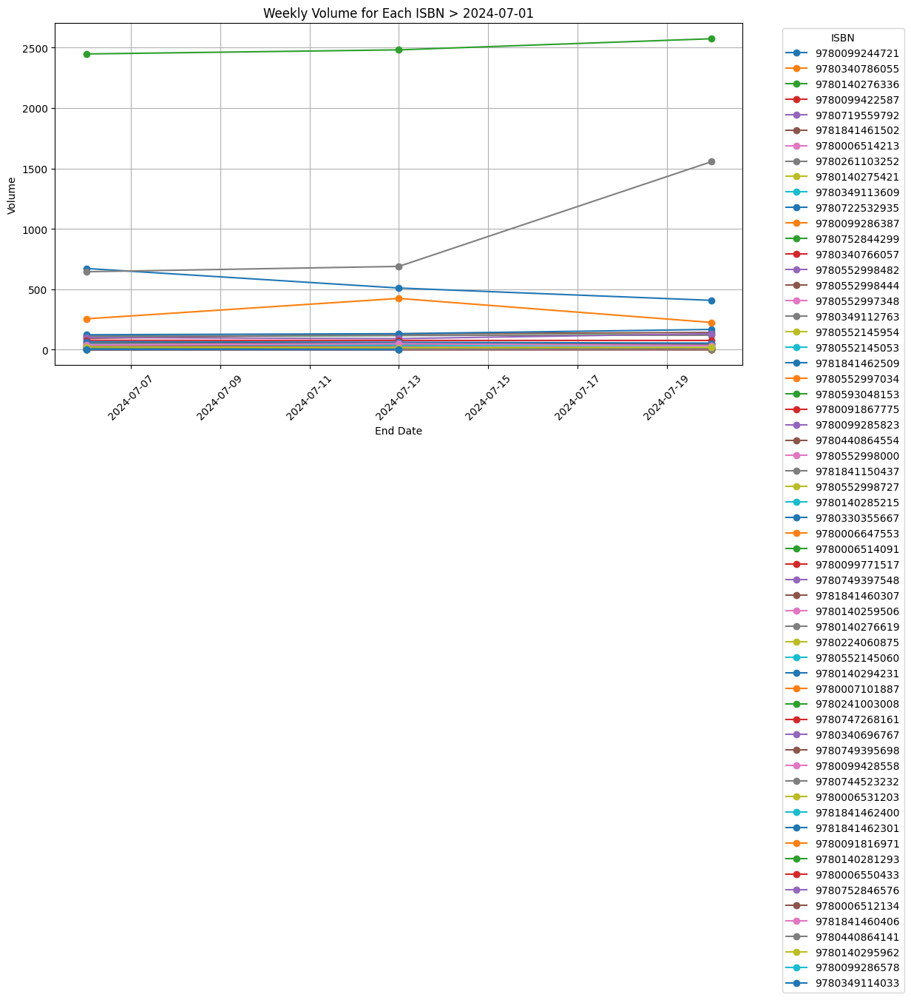

In [ ]:
# Set up the plot
plt.figure(figsize=(12, 6))

# Loop through each unique ISBN and plot the Volume
for isbn in unique_isbns:
    plt.plot(df_UK_weekly_filtered[df_UK_weekly_filtered['ISBN'] == isbn].index,
             df_UK_weekly_filtered[df_UK_weekly_filtered['ISBN'] == isbn]['Volume'],
             marker='o', label=isbn)

# Customize the plot
plt.title('Weekly Volume for Each ISBN > 2024-07-01')
plt.xlabel('End Date')
plt.ylabel('Volume')
plt.xticks(rotation=45)
plt.legend(title='ISBN', bbox_to_anchor=(1.05, 1), loc='upper left')
plt.grid()
plt.tight_layout()

# Show the plot
plt.show()

In [ ]:
# Create a figure
fig = go.Figure()

# Loop through each unique ISBN and add a trace to the plot
for isbn in unique_isbns:
    current_data = df_UK_weekly_filtered[df_UK_weekly_filtered['ISBN'] == isbn]

    # Check if there's data for the current ISBN
    if not current_data.empty:
        fig.add_trace(go.Scatter(
            x=current_data.index,
            y=current_data['Volume'],
            mode='lines+markers',  # Use lines and markers
            name=isbn  # Use ISBN as the trace name
        ))

# Customize the layout
fig.update_layout(
    title='Weekly Volume for Each ISBN',
    xaxis_title='End Date',
    yaxis_title='Volume',
    legend_title='ISBN',
    xaxis=dict(tickangle=45),
    template='plotly_white',  # Optional: Use a clean layout
)

# Show the plot
fig.show()

Below plot is not required in rubric, done optionally

In [ ]:
# Check the date range for df_filled
date_range = df_filled.index.min(), df_filled.index.max()
print("Date Range:", date_range)

# Filter the DataFrame for the first 12 years (2001 to 2013)
df_UK_weekly_filtered_first_12 = df_filled[df_filled.index < '2013-01-06']

# Aggregate the data to yearly sums (or means)
df_UK_yearly = df_UK_weekly_filtered_first_12.groupby(['ISBN', df_UK_weekly_filtered_first_12.index.year]) \
    .agg({'Volume': 'sum'}).reset_index()

# Rename the year column for clarity
df_UK_yearly.rename(columns={'index': 'Year', df_UK_weekly_filtered_first_12.index.year.name: 'Year'}, inplace=True)

date_range_filtered = df_UK_weekly_filtered_first_12.index.min(), df_UK_weekly_filtered_first_12.index.max()
print("Date Range filtered:", date_range_filtered)

Date Range: (Timestamp('2001-01-06 00:00:00'), Timestamp('2024-07-20 00:00:00'))
Date Range filtered: (Timestamp('2001-01-06 00:00:00'), Timestamp('2013-01-05 00:00:00'))


<ipython-input-40-b7147d19fa64>:22: UserWarning:

Tight layout not applied. The bottom and top margins cannot be made large enough to accommodate all axes decorations.



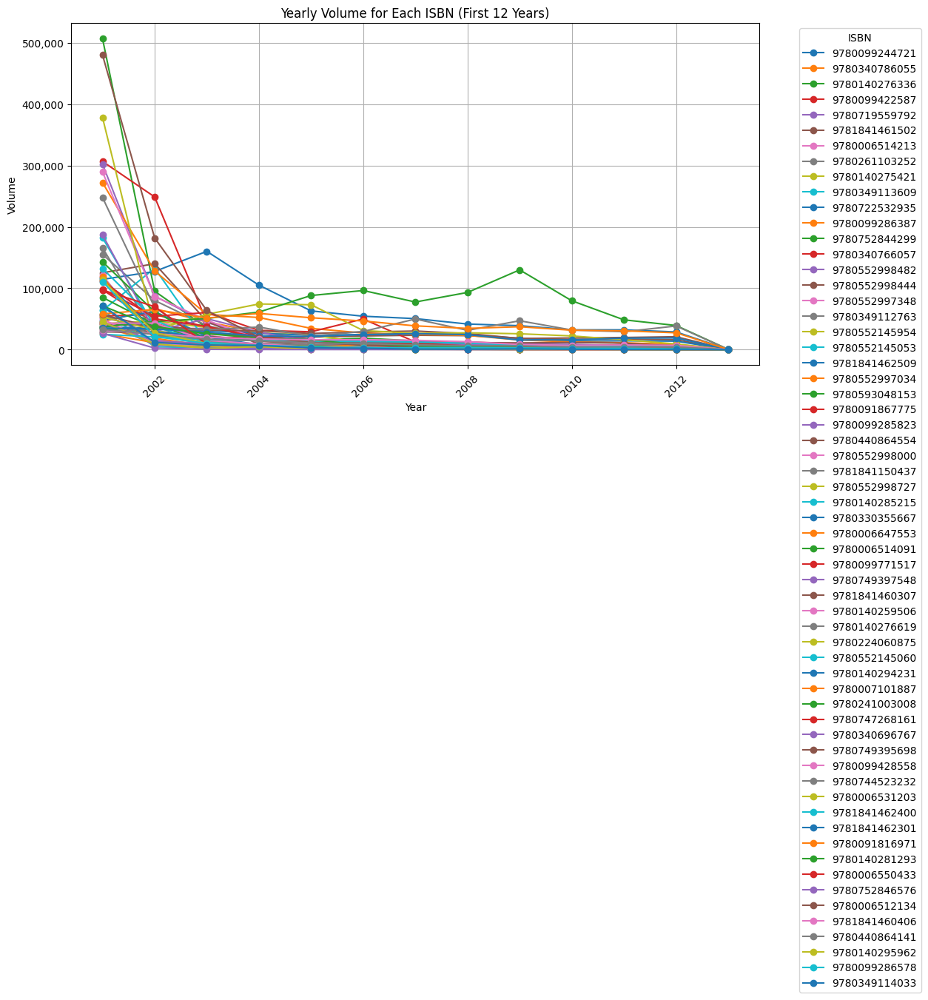

In [ ]:
# Set up the plot
plt.figure(figsize=(12, 6))

# Loop through each unique ISBN and plot the yearly aggregated Volume
for isbn in unique_isbns:
    isbn_data = df_UK_yearly[df_UK_yearly['ISBN'] == isbn]
    plt.plot(isbn_data['Year'], isbn_data['Volume'], marker='o', label=isbn)  # Accessing the Year column correctly

# Customize the plot
plt.title('Yearly Volume for Each ISBN (First 12 Years)')
plt.xlabel('Year')
plt.ylabel('Volume')

# Format y-axis with commas
plt.gca().yaxis.set_major_formatter(ticker.FuncFormatter(lambda x, _: f'{int(x):,}'))

plt.xticks(rotation=45)
plt.legend(title='ISBN', bbox_to_anchor=(1.05, 1), loc='upper left')
plt.grid()

# Adjust layout to avoid overlaps
plt.tight_layout()

# Show the plot
plt.show()

In [ ]:
# Create a Plotly figure
fig = go.Figure()

# Loop through each unique ISBN and add a trace for the yearly aggregated Volume
for isbn in unique_isbns:
    isbn_data = df_UK_yearly[df_UK_yearly['ISBN'] == isbn]
    fig.add_trace(go.Scatter(
        x=isbn_data['Year'],
        y=isbn_data['Volume'],
        mode='lines+markers',
        name=isbn
    ))

# Customize the plot
fig.update_layout(
    title='Yearly Volume for Each ISBN (First 12 Years)',
    xaxis_title='Year',
    yaxis_title='Volume',
    yaxis=dict(tickformat=','),
    legend_title='ISBN',
    xaxis_tickangle=45,
    margin=dict(l=0, r=0, t=50, b=0)
)

# Show the plot
fig.show()


In [ ]:
# Filter the DataFrame for the last 12 years (2012 to 2024)
df_UK_weekly_filtered_last_12 = df_filled[df_filled.index >= '2012-07-20']

# Aggregate the data to yearly sums (or means)
df_UK_yearly_last_12 = df_UK_weekly_filtered_last_12.groupby(['ISBN', df_UK_weekly_filtered_last_12.index.year]) \
    .agg({'Volume': 'sum'}).reset_index()

In [ ]:
# Print the structure of the aggregated DataFrame
print(df_UK_yearly_last_12.head())
print(df_UK_yearly_last_12.columns)  # Check column names

            ISBN  End Date  Volume
0  9780001713031      2012       0
1  9780001713031      2013       0
2  9780001713031      2014       5
3  9780004724140      2012       0
4  9780004724140      2013       0
Index(['ISBN', 'End Date', 'Volume'], dtype='object')


<ipython-input-44-47dbed06c864>:26: UserWarning:

Tight layout not applied. The bottom and top margins cannot be made large enough to accommodate all axes decorations.



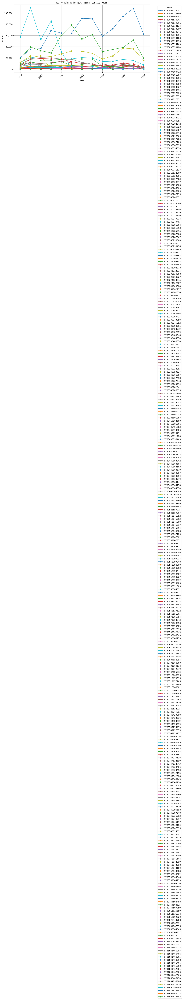

In [ ]:
# Aggregate the data to yearly sums based on 'End Date'
df_UK_yearly_last_12 = df_UK_weekly_filtered_last_12.groupby(['ISBN', df_UK_weekly_filtered_last_12.index.year]) \
    .agg({'Volume': 'sum'}).reset_index()

# Set up the plot
plt.figure(figsize=(12, 6))

# Loop through each unique ISBN and plot the yearly aggregated Volume
for isbn in df_UK_yearly_last_12['ISBN'].unique():
    isbn_data = df_UK_yearly_last_12[df_UK_yearly_last_12['ISBN'] == isbn]
    plt.plot(isbn_data['End Date'], isbn_data['Volume'], marker='o', label=isbn)

# Customize the plot
plt.title('Yearly Volume for Each ISBN (Last 12 Years)')
plt.xlabel('Year')
plt.ylabel('Volume')

# Format y-axis with commas
plt.gca().yaxis.set_major_formatter(ticker.FuncFormatter(lambda x, _: f'{int(x):,}'))

plt.xticks(rotation=45)
plt.legend(title='ISBN', bbox_to_anchor=(1.05, 1), loc='upper left')
plt.grid()

# Adjust layout to avoid overlaps
plt.tight_layout()

# Show the plot
plt.show()

In [ ]:
# Aggregate the data to yearly sums based on 'End Date'
df_UK_yearly_last_12 = df_UK_weekly_filtered_last_12.groupby(['ISBN', df_UK_weekly_filtered_last_12.index.year]) \
    .agg({'Volume': 'sum'}).reset_index()

# Create a Plotly figure
fig = go.Figure()

# Loop through each unique ISBN and add a trace for the yearly aggregated Volume
for isbn in df_UK_yearly_last_12['ISBN'].unique():
    isbn_data = df_UK_yearly_last_12[df_UK_yearly_last_12['ISBN'] == isbn]
    fig.add_trace(go.Scatter(
        x=isbn_data['End Date'],
        y=isbn_data['Volume'],
        mode='lines+markers',
        name=isbn
    ))

# Customize the plot
fig.update_layout(
    title='Yearly Volume for Each ISBN (Last 12 Years)',
    xaxis_title='Year',
    yaxis_title='Volume',
    yaxis=dict(tickformat=','),
    legend_title='ISBN',
    xaxis_tickangle=45,
    margin=dict(l=0, r=0, t=50, b=0)
)

# Show the plot
fig.show()

In [ ]:
# Filter the DataFrame for the full 24 years
df_UK_weekly_full_24 = df_filled

# Aggregate the data to yearly sums based on the 'End Date' column
df_UK_weekly_full_24 = df_UK_weekly_full_24.groupby(['ISBN', df_UK_weekly_full_24.index.year]) \
    .agg({'Volume': 'sum'}).reset_index()

# Rename the 'End Date' column to 'Year' for easier access
df_UK_weekly_full_24.rename(columns={'End Date': 'Year'}, inplace=True)

# Print the structure of the aggregated DataFrame
print(df_UK_weekly_full_24.head())
print(df_UK_weekly_full_24.columns)  # Check column names

            ISBN  Year  Volume
0  9780001713031  2001   25668
1  9780001713031  2002   21724
2  9780001713031  2003    8029
3  9780001713031  2004     677
4  9780001713031  2005     117
Index(['ISBN', 'Year', 'Volume'], dtype='object')


<ipython-input-47-4d7737569204>:22: UserWarning:

Tight layout not applied. The bottom and top margins cannot be made large enough to accommodate all axes decorations.



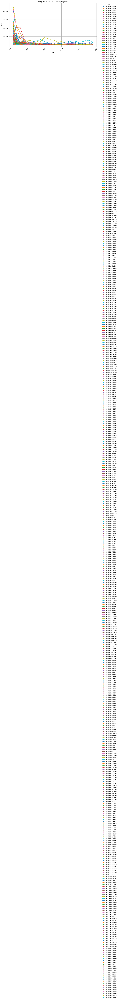

In [ ]:
# Set up the plot
plt.figure(figsize=(12, 6))

# Loop through each unique ISBN and plot the yearly aggregated Volume
for isbn in df_UK_weekly_full_24['ISBN'].unique():
    isbn_data = df_UK_weekly_full_24[df_UK_weekly_full_24['ISBN'] == isbn]
    plt.plot(isbn_data['Year'], isbn_data['Volume'], marker='o', label=isbn)  # Use 'Year' for the x-axis

# Customize the plot
plt.title('Yearly Volume for Each ISBN (24 years)')
plt.xlabel('Year')
plt.ylabel('Volume')

# Format y-axis with commas
plt.gca().yaxis.set_major_formatter(ticker.FuncFormatter(lambda x, _: f'{int(x):,}'))

plt.xticks(rotation=45)
plt.legend(title='ISBN', bbox_to_anchor=(1.05, 1), loc='upper left')
plt.grid()

# Adjust layout to avoid overlaps
plt.tight_layout()

# Show the plot
plt.show()

In [ ]:
# Check for any whitespace in the column names
print(df_UK_yearly_last_12.columns)

Index(['ISBN', 'End Date', 'Volume'], dtype='object')


<ipython-input-49-a18ac3b35ffc>:36: UserWarning:

Tight layout not applied. The bottom and top margins cannot be made large enough to accommodate all axes decorations.



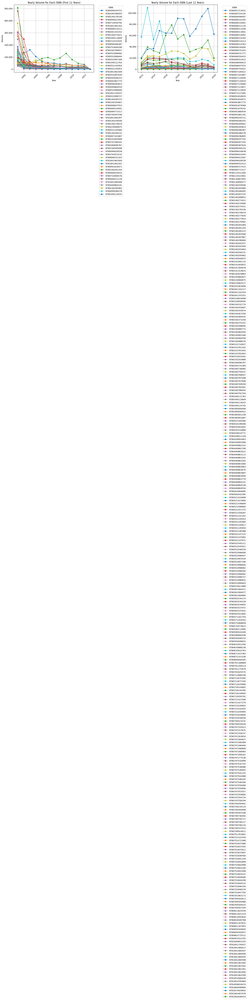

In [ ]:
# Set up the figure and axes for side-by-side plots
fig, axs = plt.subplots(1, 2, figsize=(18, 6))  # 1 row, 2 columns

# Plot for the first 12 years
for isbn in unique_isbns:
    isbn_data = df_UK_yearly[df_UK_yearly['ISBN'] == isbn]
    axs[0].plot(isbn_data['Year'], isbn_data['Volume'], marker='o', label=isbn)  # Accessing the Year column correctly

# Customize the first plot
axs[0].set_title('Yearly Volume for Each ISBN (First 12 Years)')
axs[0].set_xlabel('Year')
axs[0].set_ylabel('Volume')
axs[0].yaxis.set_major_formatter(ticker.FuncFormatter(lambda x, _: f'{int(x):,}'))
axs[0].tick_params(axis='x', rotation=45)
axs[0].legend(title='ISBN', bbox_to_anchor=(1.05, 1), loc='upper left')
axs[0].grid()

# Plot for the last 12 years
for isbn in df_UK_yearly_last_12['ISBN'].unique():
    isbn_data = df_UK_yearly_last_12[df_UK_yearly_last_12['ISBN'] == isbn]
    axs[1].plot(isbn_data['End Date'], isbn_data['Volume'], marker='o', label=isbn)  # Use 'Year' for the x-axis

# Customize the second plot
axs[1].set_title('Yearly Volume for Each ISBN (Last 12 Years)')
axs[1].set_xlabel('Year')
axs[1].set_ylabel('Volume')
axs[1].yaxis.set_major_formatter(ticker.FuncFormatter(lambda x, _: f'{int(x):,}'))
axs[1].tick_params(axis='x', rotation=45)
axs[1].legend(title='ISBN', bbox_to_anchor=(1.05, 1), loc='upper left')
axs[1].grid()

# Adjust layout to avoid overlaps
plt.subplots_adjust(wspace=0.55)  # Adjust the width space between the plots

# Adjust layout to avoid overlaps
plt.tight_layout()

# Show the plots
plt.show()

Looking at the data, we can see a trend, a decrease in the overall value of book sales over the full period of 24 years, some book do perform better over the last 12 years however the majortity do not perform very well compared to the first 12 years

In [ ]:
df_filled.info()

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 382871 entries, 2001-01-06 to 2024-07-20
Data columns (total 13 columns):
 #   Column           Non-Null Count   Dtype  
---  ------           --------------   -----  
 0   ISBN             382871 non-null  object 
 1   Title            382871 non-null  object 
 2   Author           367992 non-null  object 
 3   Interval         382871 non-null  int64  
 4   Volume           382871 non-null  int64  
 5   Value            382871 non-null  float64
 6   ASP              382528 non-null  float64
 7   RRP              376909 non-null  float64
 8   Binding          382871 non-null  object 
 9   Imprint          382871 non-null  object 
 10  Publisher Group  382871 non-null  object 
 11  Product Class    382871 non-null  object 
 12  Source           382871 non-null  object 
dtypes: float64(3), int64(2), object(8)
memory usage: 40.9+ MB


In [ ]:
# Filter for books with the specified titles, case-insensitive
filtered_books_titles = df_filled[df_filled['Title'].str.contains(r'Alchemist,? The|Very Hungry Caterpillar,? The', case=False, na=False)]

# Display the first few rows to check the filtering
display(filtered_books_titles.head())

,ISBN,Title,Author,Interval,Volume,Value,ASP,RRP,Binding,Imprint,Publisher Group,Product Class,Source
End Date,,,,,,,,,,,,,
2001-01-06,9780241003008,"Very Hungry Caterpillar, The","Carle, Eric",200101,402,1984.48,4.9365,7.99,Hardback,Puffin Books,Penguin Grp,Y1.3 Picture Books,"Y Children's, YA & Educational"
2001-01-06,9780140500875,"Very Hungry Caterpillar, The","Carle, Eric",200101,252,1245.04,4.9406,4.99,Paperback,Puffin Books,Penguin Grp,Y1.3 Picture Books,"Y Children's, YA & Educational"
2001-01-06,9780722532935,"Alchemist, The","Coelho, Paulo",200101,1601,11019.60,6.8829,9.99,Paperback,Thorsons,HarperCollins Grp,F1.1 General & Literary Fiction,F - Adult Fiction
2001-01-13,9780722532935,"Alchemist, The","Coelho, Paulo",200102,2038,14113.40,6.9251,9.99,Paperback,Thorsons,HarperCollins Grp,F1.1 General & Literary Fiction,F - Adult Fiction
2001-01-13,9780140500875,"Very Hungry Caterpillar, The","Carle, Eric",200102,294,1445.25,4.9158,4.99,Paperback,Puffin Books,Penguin Grp,Y1.3 Picture Books,"Y Children's, YA & Educational"


In [ ]:
filtered_books_both = df_filled[df_filled['Title'].str.contains(r'Alchemist|Very Hungry Caterpillar', case=False, na=False)]
unique_books = filtered_books_both[['ISBN', 'Title', 'Binding', 'RRP']].drop_duplicates()
display(unique_books)

# Group by ISBN and Title, then count the occurrences
book_counts_filtered = filtered_books_both.groupby(['ISBN', 'Title', 'Binding', 'RRP']).size().reset_index(name='Count')

# Display the result
display(book_counts_filtered)

,ISBN,Title,Binding,RRP
End Date,,,,
2001-01-06,9780241003008,"Very Hungry Caterpillar, The",Hardback,7.99
2001-01-06,9780140500875,"Very Hungry Caterpillar, The",Paperback,4.99
2001-01-06,9780722532935,"Alchemist, The",Paperback,9.99


,ISBN,Title,Binding,RRP,Count
0,9780140500875,"Very Hungry Caterpillar, The",Paperback,4.99,262
1,9780241003008,"Very Hungry Caterpillar, The",Hardback,7.99,1202
2,9780722532935,"Alchemist, The",Paperback,9.99,1202


2 Versions of Very Hungry Caterpillar, The, one is hardback the other is paperback.

In [ ]:
# Step 1: Filter the data for "The Very Hungry Caterpillar" and "The Alchemist"
filtered_books_both = df_filled[df_filled['Title'].str.contains(r'Alchemist,? The|Very Hungry Caterpillar,? The', case=False, na=False)]

# Step 2: Process "The Very Hungry Caterpillar" (combine hardback and paperback)
filtered_caterpillar = filtered_books_both[filtered_books_both['Title'].str.contains(r'Very Hungry Caterpillar', case=False, na=False)]

# Group by the End Date (index) and aggregate the values for "The Very Hungry Caterpillar"
caterpillar_combined = filtered_caterpillar.groupby(filtered_caterpillar.index).agg({
    'Title': 'first',  # Keep the title
    'Author': 'first',  # Author is the same for all editions
    'Volume': 'sum',  # Sum the Volume across hardback and paperback
    'Value': 'sum',  # Sum the Value across both versions
    'ASP': 'mean',  # Take the average ASP
    'RRP': 'mean',  # Take the average RRP
    'Imprint': 'first',  # Take the first imprint (same across editions)
    'Publisher Group': 'first'  # Take the first publisher group (same across editions)
})

# Create a new ISBN for the combined "Very Hungry Caterpillar"
caterpillar_combined['ISBN'] = '9999999999999'

# Step 3: Keep the data for "The Alchemist" as-is, and ensure the index is preserved
filtered_alchemist = filtered_books_both[filtered_books_both['Title'].str.contains(r'Alchemist,? The', case=False, na=False)][[
    'ISBN', 'Title', 'Author', 'Volume', 'Value', 'ASP', 'RRP', 'Imprint', 'Publisher Group']]

# No need to reset or change the index for Alchemist
# The index is already properly set as "End Date"

# Step 4: Concatenate the combined caterpillar data and the alchemist data
# Reordering the columns for "The Very Hungry Caterpillar" to match the desired structure
caterpillar_combined.reset_index(inplace=True)  # Reset index to make it a column
caterpillar_combined.rename(columns={'index': 'End Date'}, inplace=True)  # Rename the index column

# Concatenate the two DataFrames, preserving the original index for Alchemist
combined_books = pd.concat([caterpillar_combined.set_index('End Date'),
                             filtered_alchemist.set_index(filtered_alchemist.index)],
                             axis=0, ignore_index=False)

# Step 5: Sort the data by the End Date for readability
combined_books.sort_index(inplace=True)

# Display the result
display(combined_books.head())

,Title,Author,Volume,Value,ASP,RRP,Imprint,Publisher Group,ISBN
End Date,,,,,,,,,
2001-01-06,"Very Hungry Caterpillar, The","Carle, Eric",654,3229.52,4.93855,6.49,Puffin Books,Penguin Grp,9999999999999
2001-01-06,"Alchemist, The","Coelho, Paulo",1601,11019.60,6.88290,9.99,Thorsons,HarperCollins Grp,9780722532935
2001-01-13,"Alchemist, The","Coelho, Paulo",2038,14113.40,6.92510,9.99,Thorsons,HarperCollins Grp,9780722532935
2001-01-13,"Very Hungry Caterpillar, The","Carle, Eric",655,3211.67,4.90445,6.49,Puffin Books,Penguin Grp,9999999999999
2001-01-20,"Very Hungry Caterpillar, The","Carle, Eric",810,3999.07,4.93940,6.49,Puffin Books,Penguin Grp,9999999999999


9780722532935 (Alchemist), ~~9780241003008~~, ~~9780140500875~~ -> 9999999999999 (Caterpillar)

The objective is to identify sales patterns that demonstrate seasonal trends or any other traits, providing insights to inform reordering, restocking, and reprinting decisions for various books (**by their International Standard Book Number, or ISBN**).

Ultimately the decision to treat hardback and paperbacks as one book or not would be left up to a business expert, in this case no instructions have been given so although I have prepared the data to be treated as if one book, moving forward I will retain the separate ISBNs with 3 ISBNs to model on and analyse their sales patterns, after all it is possible that sales of paperback vs hardback increase/decrease as stock of the other increases/decrease vice versa so it makes sense to treat them as separate entities as increased volume of a more expensive version e.g Hardback is more beneficial for a business if it doesnt reduce volume significantly by having a more expensive offering compared to a paperback (however it does take up more shelf space).


In [ ]:
# Step 1: Filter for the specified ISBNs and the date range
filtered_sales_data_2_books = df_filled[
    ((df_filled['ISBN'].isin(['9780722532935', '9780241003008', '9780140500875'])) &
    (df_filled.index >= '2012-01-01'))
]

# Print the result
display(filtered_sales_data_2_books)

,ISBN,Title,Author,Interval,Volume,Value,ASP,RRP,Binding,Imprint,Publisher Group,Product Class,Source
End Date,,,,,,,,,,,,,
2012-01-07,9780241003008,"Very Hungry Caterpillar, The","Carle, Eric",201201,512,2522.13,4.9260,7.99,Hardback,Puffin Books,Penguin Grp,Y1.3 Picture Books,"Y Children's, YA & Educational"
2012-01-07,9780140500875,0,0,0,0,0.00,0.0000,0.00,0,0,0,0,0
2012-01-07,9780722532935,"Alchemist, The","Coelho, Paulo",201201,518,3601.76,6.9532,9.99,Paperback,Thorsons,HarperCollins Grp,F1.1 General & Literary Fiction,F - Adult Fiction
2012-01-14,9780241003008,"Very Hungry Caterpillar, The","Carle, Eric",201202,519,2473.31,4.7655,7.99,Hardback,Puffin Books,Penguin Grp,Y1.3 Picture Books,"Y Children's, YA & Educational"
2012-01-14,9780140500875,0,0,0,0,0.00,0.0000,0.00,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...
2024-07-06,9780241003008,"Very Hungry Caterpillar, The","Carle, Eric",202427,2448,10974.10,4.4829,7.99,Hardback,Puffin Books,Penguin Grp,Y1.3 Picture Books,"Y Children's, YA & Educational"
2024-07-13,9780241003008,"Very Hungry Caterpillar, The","Carle, Eric",202428,2482,11441.03,4.6096,7.99,Hardback,Puffin Books,Penguin Grp,Y1.3 Picture Books,"Y Children's, YA & Educational"
2024-07-13,9780722532935,"Alchemist, The","Coelho, Paulo",202428,510,4638.63,9.0954,9.99,Paperback,Thorsons,HarperCollins Grp,F1.1 General & Literary Fiction,F - Adult Fiction


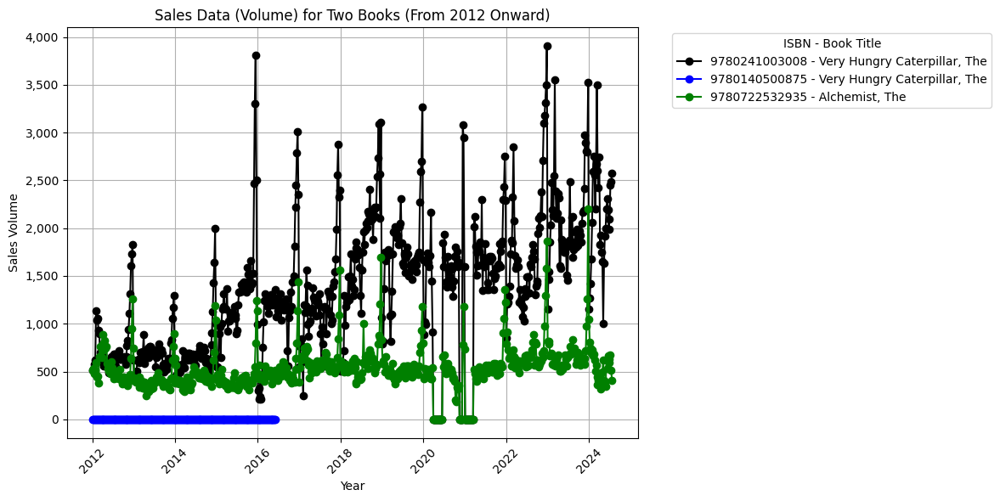

In [ ]:
# Create a mapping of ISBNs to Titles
isbn_to_title = {
    '9780722532935': 'Alchemist, The',
    '9780241003008': 'Very Hungry Caterpillar, The',
    '9780140500875': 'Very Hungry Caterpillar, The'  # Additional ISBN for the same title
}

# Set up the plot
plt.figure(figsize=(12, 6))

# Loop through each unique ISBN in the filtered data and plot the yearly aggregated Volume
for isbn in filtered_sales_data_2_books['ISBN'].unique():
    isbn_data = filtered_sales_data_2_books[filtered_sales_data_2_books['ISBN'] == isbn]
    # Use both ISBN and Title for the label
    label = f"{isbn} - {isbn_to_title[isbn]}"

    # Set color based on the ISBN
    if isbn == '9780722532935':
        color = 'green'  # Set green for 'Alchemist, The'
    elif isbn == '9780140500875':
        color = 'blue'   # Set blue for 'Very Hungry Caterpillar, The'
    elif isbn == '9780241003008':
        color = 'black'  # Set black for 'Very Hungry Caterpillar, The'
    else:
        color = None     # Default color for any other ISBNs

    plt.plot(isbn_data.index, isbn_data['Volume'], marker='o', label=label, color=color)

# Customize the plot
plt.title('Sales Data (Volume) for Two Books (From 2012 Onward)')
plt.xlabel('Year')
plt.ylabel('Sales Volume')

# Format y-axis with commas
plt.gca().yaxis.set_major_formatter(ticker.FuncFormatter(lambda x, _: f'{int(x):,}'))

plt.xticks(rotation=45)
plt.legend(title='ISBN - Book Title', bbox_to_anchor=(1.05, 1), loc='upper left')  # Update legend title
plt.grid()

# Adjust layout to avoid overlaps
plt.tight_layout()

# Show the plot
plt.show()

In [ ]:
# Create a mapping of ISBNs to Titles
isbn_to_title = {
    '9780722532935': 'Alchemist, The',
    '9780241003008': 'Very Hungry Caterpillar, The',
    '9780140500875': 'Very Hungry Caterpillar, The'  # Additional ISBN for the same title
}

# Aggregate data by year
filtered_sales_data_2_books['Year'] = filtered_sales_data_2_books.index.year
yearly_volume = filtered_sales_data_2_books.groupby(['Year', 'ISBN'])['Volume'].sum().reset_index()

# Create a Plotly figure
fig = go.Figure()

# Loop through each unique ISBN in the aggregated data and add traces to the figure
for isbn in yearly_volume['ISBN'].unique():
    isbn_data = yearly_volume[yearly_volume['ISBN'] == isbn]
    title = isbn_to_title[isbn]  # Get the title for the current ISBN
    # Use both ISBN and Title for the name
    fig.add_trace(go.Scatter(x=isbn_data['Year'],
                             y=isbn_data['Volume'],
                             mode='lines+markers',
                             name=f"{isbn} - {title}"))  # Concatenate ISBN and title

# Customize the layout
fig.update_layout(title='Sales Data (Volume) for Two Books (From 2012 Onward)',
                  xaxis_title='Year',
                  yaxis_title='Sales Volume',
                  yaxis_tickformat=',',  # Format y-axis with commas
                  legend_title='ISBN - Book Title',
                  template='plotly_white')

# Show the figure
fig.show()

<ipython-input-56-e79d4d8d44c6>:9: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



In [ ]:
# Filter for ISBN '9780140500875' where Volume is not zero
# Display the result
display(filtered_sales_data_2_books[
    (filtered_sales_data_2_books['ISBN'] == '9780140500875') &
    (filtered_sales_data_2_books['Volume'] != 0)
])

,ISBN,Title,Author,Interval,Volume,Value,ASP,RRP,Binding,Imprint,Publisher Group,Product Class,Source,Year
End Date,,,,,,,,,,,,,,
2013-03-23,9780140500875,"Very Hungry Caterpillar, The","Carle, Eric",201312,1,2.49,2.49,4.99,Paperback,Puffin Books,Penguin Grp,Y1.3 Picture Books,"Y Children's, YA & Educational",2013
2013-04-20,9780140500875,"Very Hungry Caterpillar, The","Carle, Eric",201316,1,5.39,5.39,4.99,Paperback,Puffin Books,Penguin Grp,Y1.3 Picture Books,"Y Children's, YA & Educational",2013
2015-02-28,9780140500875,"Very Hungry Caterpillar, The","Carle, Eric",201509,1,6.99,6.99,4.99,Paperback,Puffin Books,Penguin Grp,Y1.3 Picture Books,"Y Children's, YA & Educational",2015
2016-06-04,9780140500875,"Very Hungry Caterpillar, The","Carle, Eric",201622,-1,-6.99,6.99,4.99,Paperback,Puffin Books,Penguin Grp,Y1.3 Picture Books,"Y Children's, YA & Educational",2016


Sales data of the hardback variant is 0 after 2012, presumption is the book stopped being manufactured/stocked so for the next section can refer to 9780241003008 and 9780722532935 and ignore the hardback 9780140500875 (only 3 copies sold and one value is negative actually in 2016 see plotly plot, as the values are so small they will be ignored and excluded from subsequent modelling for simplicity).

In [ ]:
filtered_sales_data_2_books.info()

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 1541 entries, 2012-01-07 to 2024-07-20
Data columns (total 14 columns):
 #   Column           Non-Null Count  Dtype  
---  ------           --------------  -----  
 0   ISBN             1541 non-null   object 
 1   Title            1541 non-null   object 
 2   Author           1541 non-null   object 
 3   Interval         1541 non-null   int64  
 4   Volume           1541 non-null   int64  
 5   Value            1541 non-null   float64
 6   ASP              1541 non-null   float64
 7   RRP              1541 non-null   float64
 8   Binding          1541 non-null   object 
 9   Imprint          1541 non-null   object 
 10  Publisher Group  1541 non-null   object 
 11  Product Class    1541 non-null   object 
 12  Source           1541 non-null   object 
 13  Year             1541 non-null   int32  
dtypes: float64(3), int32(1), int64(2), object(8)
memory usage: 174.6+ KB


# 3. Classical techniques:

1. Decomposing the data for both books.
2. ACF and PACF on both books, ljung box too)
3. Checking for stationarity (ADF)



    '9780722532935': 'Alchemist, The',
    '9780241003008': 'Very Hungry Caterpillar, The',

In [ ]:
filtered_sales_data_2_books.head()

,ISBN,Title,Author,Interval,Volume,Value,ASP,RRP,Binding,Imprint,Publisher Group,Product Class,Source,Year
End Date,,,,,,,,,,,,,,
2012-01-07,9780241003008,"Very Hungry Caterpillar, The","Carle, Eric",201201,512,2522.13,4.9260,7.99,Hardback,Puffin Books,Penguin Grp,Y1.3 Picture Books,"Y Children's, YA & Educational",2012
2012-01-07,9780140500875,0,0,0,0,0.00,0.0000,0.00,0,0,0,0,0,2012
2012-01-07,9780722532935,"Alchemist, The","Coelho, Paulo",201201,518,3601.76,6.9532,9.99,Paperback,Thorsons,HarperCollins Grp,F1.1 General & Literary Fiction,F - Adult Fiction,2012
2012-01-14,9780241003008,"Very Hungry Caterpillar, The","Carle, Eric",201202,519,2473.31,4.7655,7.99,Hardback,Puffin Books,Penguin Grp,Y1.3 Picture Books,"Y Children's, YA & Educational",2012
2012-01-14,9780140500875,0,0,0,0,0.00,0.0000,0.00,0,0,0,0,0,2012


In [ ]:
# Filter for the first ISBN
book1_data_alchemist = filtered_sales_data_2_books[filtered_sales_data_2_books['ISBN'] == '9780722532935'] # The Alchemist
# Filter for the second ISBN
book2_data_caterpillar = filtered_sales_data_2_books[filtered_sales_data_2_books['ISBN'] == '9780241003008'] # The Very Hungry Caterpillar

## Decomposition

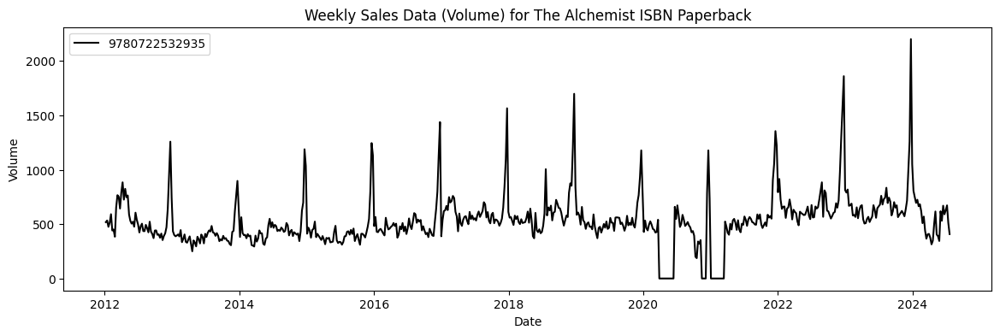

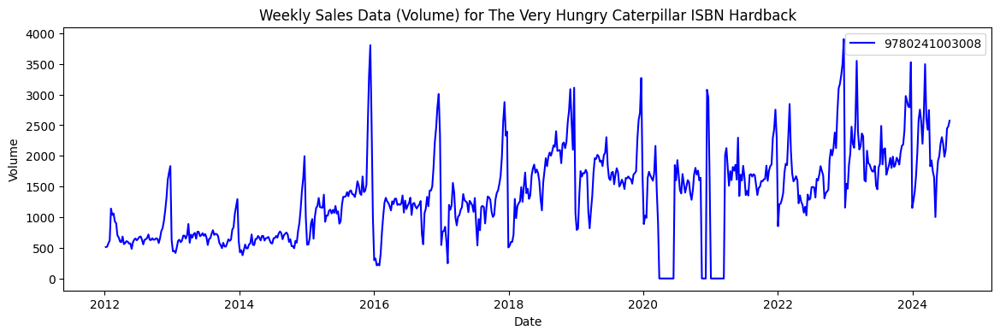

In [ ]:
# Plot the sales data for the first book
plt.figure(figsize=(14, 4))
plt.plot(book1_data_alchemist.index, book1_data_alchemist['Volume'], label='9780722532935', color='black')
plt.title('Weekly Sales Data (Volume) for The Alchemist ISBN Paperback')
plt.xlabel('Date')
plt.ylabel('Volume')
plt.legend()
plt.show()

# Plot the sales data for the second book
plt.figure(figsize=(14, 4))
plt.plot(book2_data_caterpillar.index, book2_data_caterpillar['Volume'], label='9780241003008', color='blue')
plt.title('Weekly Sales Data (Volume) for The Very Hungry Caterpillar ISBN Hardback')
plt.xlabel('Date')
plt.ylabel('Volume')
plt.legend()
plt.show()

In [ ]:
# Create a Plotly figure for "The Alchemist"
fig_alchemist = go.Figure()

# Add trace for the Alchemist book
fig_alchemist.add_trace(go.Scatter(x=book1_data_alchemist.index,
                                    y=book1_data_alchemist['Volume'],
                                    mode='lines+markers',
                                    name='9780722532935',
                                    line=dict(color='black')))

# Customize the layout for "The Alchemist"
fig_alchemist.update_layout(title='Weekly Sales Data (Volume) for The Alchemist ISBN Paperback',
                             xaxis_title='Date',
                             yaxis_title='Volume',
                             template='plotly_white',
                             width=1100,  # Set figure width
                             height=400)  # Set figure height

# Show the figure for "The Alchemist"
fig_alchemist.show()

# Create a Plotly figure for "The Very Hungry Caterpillar"
fig_caterpillar = go.Figure()

# Add trace for the Caterpillar book
fig_caterpillar.add_trace(go.Scatter(x=book2_data_caterpillar.index,
                                      y=book2_data_caterpillar['Volume'],
                                      mode='lines+markers',
                                      name='9780241003008',
                                      line=dict(color='blue')))

# Customize the layout for "The Very Hungry Caterpillar"
fig_caterpillar.update_layout(title='Weekly Sales Data (Volume) for The Very Hungry Caterpillar ISBN Hardback',
                               xaxis_title='Date',
                               yaxis_title='Volume',
                               template='plotly_white',
                               width=1100,  # Set figure width
                               height=400)  # Set figure height

# Show the figure for "The Very Hungry Caterpillar"
fig_caterpillar.show()

Seasonal variantion around christmas - (Dec 12/22 for both books) however the The Very Hungry Caterpillar also shows a second peak around March 9th.

Interestingly, there are 2 childrens book weeks in a year [reference](https://www.publishersweekly.com/pw/by-topic/childrens/childrens-industry-news/article/91547-2023-children-s-book-week-theme-and-poster-revealed.html) in 2023 this was held May 1–7 and November 6–12.

The very hungry caterpillar being a childrens book, sales start to increase around Nov 11th until December after which sales drop off after christmas.

This trend does not repeat in May so this could be coincidental with christmas sales, however there is an increase in sales in early march, further investigation is required as to why this could be.

Additive decomposition makes the most sense. It is used if the seasonal variation is relatively constant over time or the variation around the trend does not vary with the level of the time series.

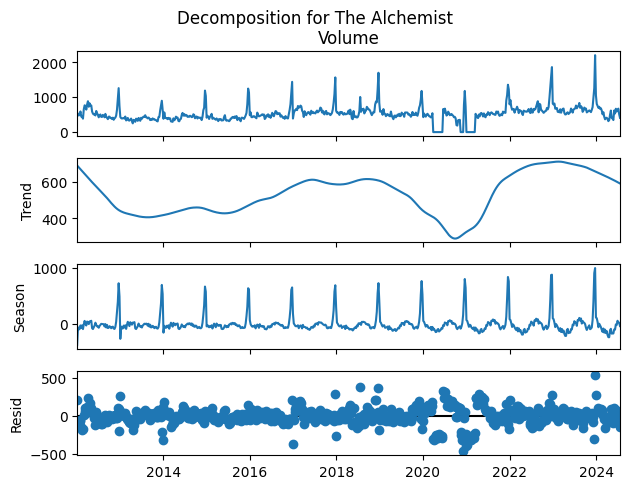

In [ ]:
# Decomposing the time series using STL
stl_object = STL(book1_data_alchemist.Volume, period=52, seasonal=53,trend=None)
stl_results = stl_object.fit()

# Plotting the STL decomposition
stl_results.plot()
plt.suptitle('Decomposition for The Alchemist', y=1.01)
plt.show()

# Store the STL residuals
stl_residuals_book1 = stl_results.resid

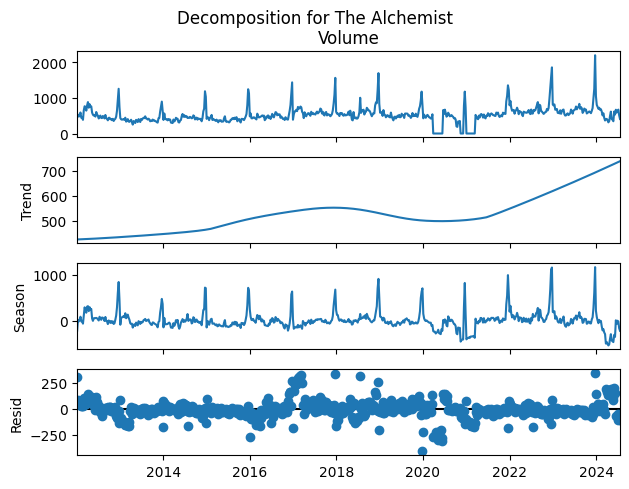

In [ ]:
# Decomposing the time series using STL
stl_object = STL(book1_data_alchemist.Volume, period=208, seasonal=53,trend=None)
stl_results = stl_object.fit()

# Plotting the STL decomposition
stl_results.plot()
plt.suptitle('Decomposition for The Alchemist', y=1.01)
plt.show()

# Store the STL residuals
stl_residuals_book1_test = stl_results.resid

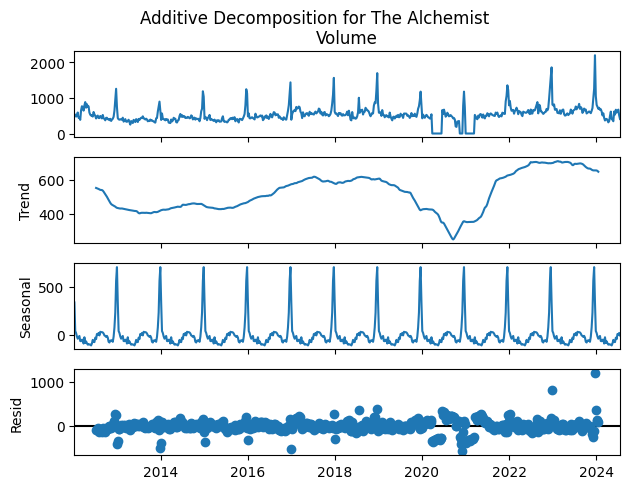

In [ ]:
# Decomposing the time series using an additive model
decomposition = seasonal_decompose(book1_data_alchemist.Volume, model='additive', period=52)

# Plotting the decomposition
decomposition.plot()
plt.suptitle('Additive Decomposition for The Alchemist', y=1.01)
plt.show()

# Storing the residuals
residuals_book1 = decomposition.resid

In [ ]:
# Extracting the trend components
trend_book1 = decomposition.trend.dropna()

In [ ]:
trend_book1

,trend
End Date,
2012-07-07,553.134615
2012-07-14,551.048077
2012-07-21,548.932692
2012-07-28,546.951923
2012-08-04,544.019231
...,...
2023-12-23,657.788462
2023-12-30,656.903846
2024-01-06,656.500000


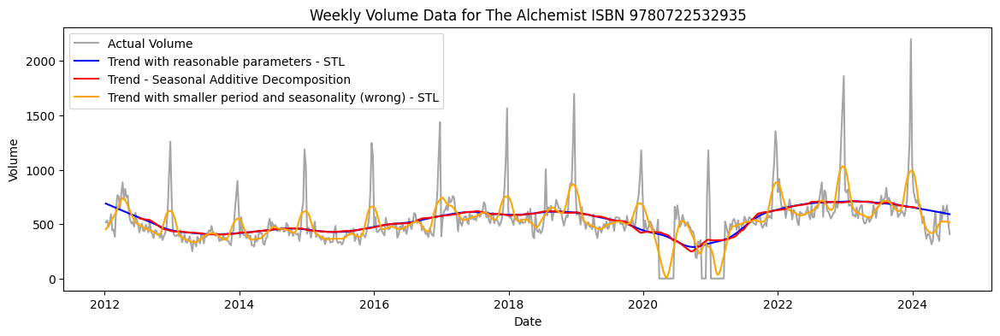

In [ ]:
# Apply STL decomposition
plt.figure(figsize=(14, 4))

# Decomposing with different parameters
st1 = STL(book1_data_alchemist.Volume,
          period=52, # period of the seasonal component,
          seasonal=53, # allows seasonal component to adapt, small numbers more adaptive,
          trend=None) # allows trend component to adapt, small numbers more adaptive

res1 = st1.fit()

st2 = STL(book1_data_alchemist.Volume, period=10, seasonal=13, trend=None)
res2 = st2.fit()

# Plot the results
plt.plot(book1_data_alchemist.index, book1_data_alchemist['Volume'], label='Actual Volume', color='grey', alpha=0.7)
plt.plot(book1_data_alchemist.index, res1.trend, label='Trend with reasonable parameters - STL', color='blue')
plt.plot(trend_book1.index, trend_book1, label='Trend - Seasonal Additive Decomposition', color='red')
plt.plot(book1_data_alchemist.index, res2.trend, label='Trend with smaller period and seasonality (wrong) - STL', color='orange')

# Adding labels and title
plt.legend()
plt.title('Weekly Volume Data for The Alchemist ISBN 9780722532935')
plt.xlabel('Date')
plt.ylabel('Volume')

# Adjusting y-axis limits if necessary
# plt.ylim(lower_limit, upper_limit) # Uncomment and set limits if needed

plt.show()

STL and seasonal decomp perform similarly, wrong period and seasonality shows that the trend retains the seasonality component

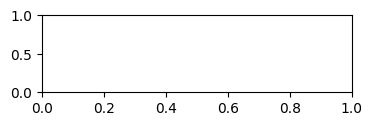

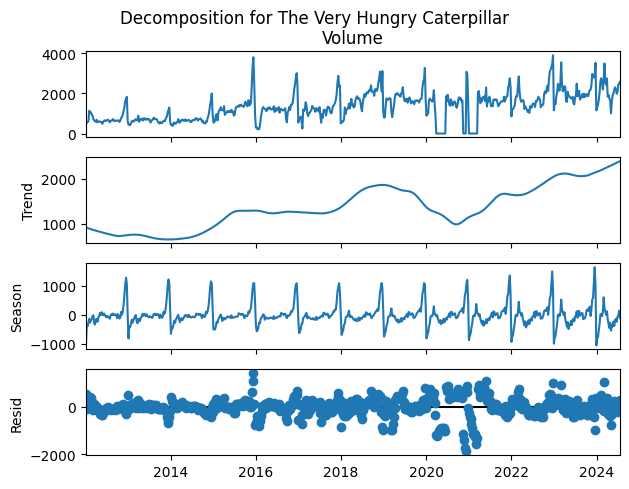

In [ ]:
# Decomposing the time series using STL
stl_object = STL(book2_data_caterpillar.Volume, period=52, seasonal=53,trend=None)
stl_results = stl_object.fit()

# Plotting the STL decomposition
stl_results.plot()
plt.suptitle('Decomposition for The Very Hungry Caterpillar', y=1.01)
plt.show()

# Store the STL residuals
stl_residuals_book2 = stl_results.resid

I made an error here and performed additive decmop by accident and not multiplicative, redone below correctly

/usr/local/lib/python3.10/dist-packages/pandas/core/arraylike.py:399: RuntimeWarning:

divide by zero encountered in log



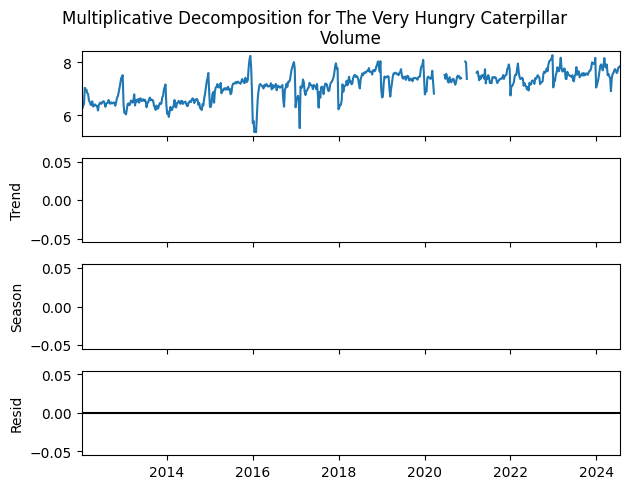

In [ ]:
""" No time to fix this, weeks with 0 sales casuing issue
# Log-transform the data for multiplicative decomposition
log_volume = np.log(book2_data_caterpillar.Volume)

# Decomposing the time series using STL on the log-transformed data
stl_object = STL(log_volume, period=52, seasonal=53, trend=None)
stl_results = stl_object.fit()

# Plotting the STL decomposition (log scale)
stl_results.plot()
plt.suptitle('Multiplicative Decomposition for The Very Hungry Caterpillar', y=1.01)
plt.show()

# Store the STL residuals (exponentiated to return to the original scale)
stl_residuals_book2 = np.exp(stl_results.resid)

# You can also retrieve and exponentiate the trend and seasonal components if needed
stl_seasonal = np.exp(stl_results.seasonal)
stl_trend = np.exp(stl_results.trend)
"""

Its somewhat close for The Very Hungry Caterpillar - Multiplicative decompositon makes the most sense as the trend appears to increase with the level of the time series - upwards trend

In [ ]:
"""
# Decomposing the time series using an additive model
decomposition = seasonal_decompose(book2_data_caterpillar.Volume, model='multiplicative', period=52)

# Plotting the decomposition
decomposition.plot()
plt.suptitle('multiplicative Decomposition for The Very Hungry Caterpillar', y=1.01)
plt.show()

# Storing the residuals
residuals_book2 = decomposition.resid
# Extracting the trend components
trend_book2 = decomposition.trend.dropna()

---------------------------------------------------------------------------
ValueError                                Traceback (most recent call last)
<ipython-input-204-fc61521e996b> in <cell line: 2>()
      1 # Decomposing the time series using an additive model
----> 2 decomposition = seasonal_decompose(book2_data_caterpillar.Volume, model='multiplicative', period=52)
      3
      4 # Plotting the decomposition
      5 decomposition.plot()

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/seasonal.py in seasonal_decompose(x, model, filt, period, two_sided, extrapolate_trend)
    155     if model.startswith("m"):
    156         if np.any(x <= 0):
--> 157             raise ValueError(
    158                 "Multiplicative seasonality is not appropriate "
    159                 "for zero and negative values"

ValueError: Multiplicative seasonality is not appropriate for zero and negative values
"""

'\n# Decomposing the time series using an additive model\ndecomposition = seasonal_decompose(book2_data_caterpillar.Volume, model=\'multiplicative\', period=52)\n\n# Plotting the decomposition\ndecomposition.plot()\nplt.suptitle(\'multiplicative Decomposition for The Very Hungry Caterpillar\', y=1.01)\nplt.show()\n\n# Storing the residuals\nresiduals_book2 = decomposition.resid\n# Extracting the trend components\ntrend_book2 = decomposition.trend.dropna()\n\n---------------------------------------------------------------------------\nValueError                                Traceback (most recent call last)\n<ipython-input-204-fc61521e996b> in <cell line: 2>()\n      1 # Decomposing the time series using an additive model\n----> 2 decomposition = seasonal_decompose(book2_data_caterpillar.Volume, model=\'multiplicative\', period=52)\n      3\n      4 # Plotting the decomposition\n      5 decomposition.plot()\n\n/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/seasonal.py in seas

0 values that were introduced due to filling causing an error

In [ ]:
zero_volume_weeks_alchemist = book1_data_alchemist[book1_data_alchemist['Volume'] == 0]

# Print the weeks with zero volume
print("Weeks with zero volume:")
print(zero_volume_weeks_alchemist[['ISBN', 'Title', 'Volume']])

zero_volume_weeks_caterpillar = book2_data_caterpillar[book2_data_caterpillar['Volume'] == 0]

# Create a figure
fig = go.Figure()

# Add the sales data for the first book
fig.add_trace(go.Scatter(
    x=book1_data_alchemist.index,
    y=book1_data_alchemist['Volume'],
    mode='lines',
    name='9780722532935 - The Alchemist',
    line=dict(color='black'),
    hoverinfo='x+y'
))

# Add the sales data for the second book
fig.add_trace(go.Scatter(
    x=book2_data_caterpillar.index,
    y=book2_data_caterpillar['Volume'],
    mode='lines',
    name='9780241003008 - The Very Hungry Caterpillar',
    line=dict(color='blue'),
    hoverinfo='x+y'
))

# Highlight the weeks with zero volume for both books
fig.add_trace(go.Scatter(
    x=zero_volume_weeks_alchemist.index,
    y=zero_volume_weeks_alchemist['Volume'],
    mode='markers',
    name='Zero Volume',
    marker=dict(color='red', size=8),
    hoverinfo='x+y'
))

# Update layout
fig.update_layout(
    title='Weekly Sales Data (Volume) for The Alchemist and The Very Hungry Caterpillar',
    xaxis_title='Date',
    yaxis_title='Volume',
    legend_title='Books',
    template='plotly_white'
)

# Show the plot
fig.show()

Weeks with zero volume:
                     ISBN Title  Volume
End Date                               
2020-03-28  9780722532935     0       0
2020-04-04  9780722532935     0       0
2020-04-11  9780722532935     0       0
2020-04-18  9780722532935     0       0
2020-04-25  9780722532935     0       0
2020-05-02  9780722532935     0       0
2020-05-09  9780722532935     0       0
2020-05-16  9780722532935     0       0
2020-05-23  9780722532935     0       0
2020-05-30  9780722532935     0       0
2020-06-06  9780722532935     0       0
2020-06-13  9780722532935     0       0
2020-11-14  9780722532935     0       0
2020-11-21  9780722532935     0       0
2020-11-28  9780722532935     0       0
2020-12-05  9780722532935     0       0
2021-01-02  9780722532935     0       0
2021-01-09  9780722532935     0       0
2021-01-16  9780722532935     0       0
2021-01-23  9780722532935     0       0
2021-01-30  9780722532935     0       0
2021-02-06  9780722532935     0       0
2021-02-13  9780

In [ ]:
# 0 weeks are the same so

zero_volume_weeks = book1_data_alchemist[book1_data_alchemist['Volume'] == 0]

In [ ]:
zero_volume_weeks.head()

,ISBN,Title,Author,Interval,Volume,Value,ASP,RRP,Binding,Imprint,Publisher Group,Product Class,Source,Year
End Date,,,,,,,,,,,,,,
2020-03-28,9780722532935,0,0,0,0,0.0,0.0,0.0,0,0,0,0,0,2020
2020-04-04,9780722532935,0,0,0,0,0.0,0.0,0.0,0,0,0,0,0,2020
2020-04-11,9780722532935,0,0,0,0,0.0,0.0,0.0,0,0,0,0,0,2020
2020-04-18,9780722532935,0,0,0,0,0.0,0.0,0.0,0,0,0,0,0,2020
2020-04-25,9780722532935,0,0,0,0,0.0,0.0,0.0,0,0,0,0,0,2020


0 values are covid weeks - https://www.instituteforgovernment.org.uk/sites/default/files/timeline-lockdown-web.pdf

26 March
Lockdown measures
legally come into force

15 June
Non-essential shops
reopen in England

5 November
Second national
lockdown comes
into force in
England

6 January
England enters
third national
lockdown

22 February
PM expected to
publish roadmap
for lifting the
lockdown

In [ ]:
# Define lockdown periods (start and end dates) as Timestamps
lockdown_periods = [
    (pd.Timestamp("2020-03-26"), pd.Timestamp("2020-06-15")),  # First lockdown
    (pd.Timestamp("2020-11-05"), pd.Timestamp("2020-12-02")),  # Second lockdown
    (pd.Timestamp("2021-01-06"), pd.Timestamp("2021-02-21")),  # Third lockdown
]

# Create a new column for lockdown indication
def is_lockdown(week_date):
    for start, end in lockdown_periods:
        if start <= week_date <= end:
            return 1  # Mark as lockdown week
    return 0  # Not a lockdown week

# Apply the function to create a new column in zero_volume_weeks
zero_volume_weeks['Lockdown'] = zero_volume_weeks.index.to_series().apply(is_lockdown)

# Display the first 10 entries of the time series with index, Volume, and Lockdown status
for i in range(10):
    end_date = zero_volume_weeks.index[i]  # Get the date from the index
    volume = zero_volume_weeks['Volume'].iloc[i]  # Get the Volume value
    lockdown_status = zero_volume_weeks['Lockdown'].iloc[i]  # Get the Lockdown status
    print(f"End Date: {end_date}, Volume: {volume}, Lockdown: {lockdown_status}")

display(zero_volume_weeks)

End Date: 2020-03-28 00:00:00, Volume: 0, Lockdown: 1
End Date: 2020-04-04 00:00:00, Volume: 0, Lockdown: 1
End Date: 2020-04-11 00:00:00, Volume: 0, Lockdown: 1
End Date: 2020-04-18 00:00:00, Volume: 0, Lockdown: 1
End Date: 2020-04-25 00:00:00, Volume: 0, Lockdown: 1
End Date: 2020-05-02 00:00:00, Volume: 0, Lockdown: 1
End Date: 2020-05-09 00:00:00, Volume: 0, Lockdown: 1
End Date: 2020-05-16 00:00:00, Volume: 0, Lockdown: 1
End Date: 2020-05-23 00:00:00, Volume: 0, Lockdown: 1
End Date: 2020-05-30 00:00:00, Volume: 0, Lockdown: 1


<ipython-input-75-a6ffe5366a23>:16: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



,ISBN,Title,Author,Interval,Volume,Value,ASP,RRP,Binding,Imprint,Publisher Group,Product Class,Source,Year,Lockdown
End Date,,,,,,,,,,,,,,,
2020-03-28,9780722532935,0,0,0,0,0.0,0.0,0.0,0,0,0,0,0,2020,1
2020-04-04,9780722532935,0,0,0,0,0.0,0.0,0.0,0,0,0,0,0,2020,1
2020-04-11,9780722532935,0,0,0,0,0.0,0.0,0.0,0,0,0,0,0,2020,1
2020-04-18,9780722532935,0,0,0,0,0.0,0.0,0.0,0,0,0,0,0,2020,1
2020-04-25,9780722532935,0,0,0,0,0.0,0.0,0.0,0,0,0,0,0,2020,1
2020-05-02,9780722532935,0,0,0,0,0.0,0.0,0.0,0,0,0,0,0,2020,1
2020-05-09,9780722532935,0,0,0,0,0.0,0.0,0.0,0,0,0,0,0,2020,1
2020-05-16,9780722532935,0,0,0,0,0.0,0.0,0.0,0,0,0,0,0,2020,1
2020-05-23,9780722532935,0,0,0,0,0.0,0.0,0.0,0,0,0,0,0,2020,1


all dates except for 5 weeks are lockdown weeks, presume the shops were still closed by choice due to short notice to get staff/not worthwhile for only 2 weeks (christmas/new year)/3 week notice period/lockdown reopening not announced by gov officially yet

## ACF & PACF, Ljung box on raw data

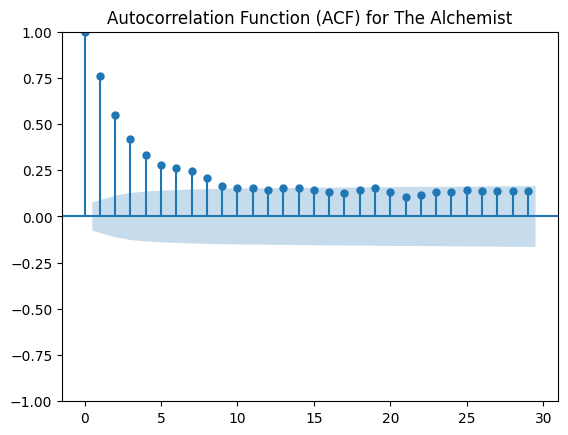

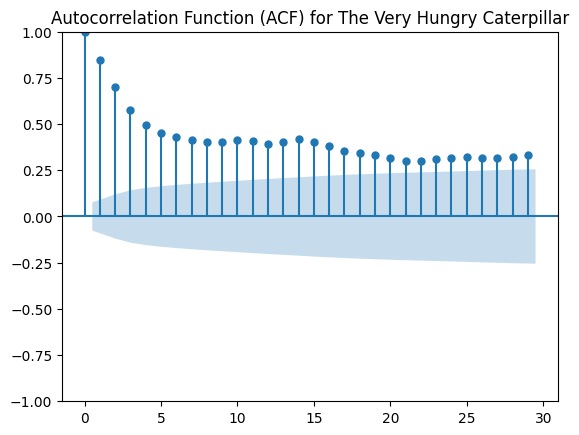

In [ ]:
# Create ACF plot.
smgraphics.tsa.plot_acf(book1_data_alchemist.Volume, alpha=0.05);
plt.title('Autocorrelation Function (ACF) for The Alchemist');

# ACF default arguments.
# x                     : The time series object.
# lags=None             : Number of lags to calculate. If None selects automatically.
# alpha=0.05            : Confidence level to use for insignificance region.
# adjusted=False        : Related to calculation method.
# fft=False             : Related to calculation method (fast fourier transform).
# missing='none'        : How to treat missing values.
# zero=True             : Return 0-lag autocorrelation?
# bartlett_confint=True : Related to calculation of insignificance region.

# Create ACF plot.
smgraphics.tsa.plot_acf(book2_data_caterpillar.Volume, alpha=0.05);
plt.title('Autocorrelation Function (ACF) for The Very Hungry Caterpillar');

ACF shows strong autocorrelation for both books that decays slowly as the lags increase - statistically significant, there also seems to be some seasonality present. No sharp cutoff in the ACF so cannot determine MA (Q) order easily

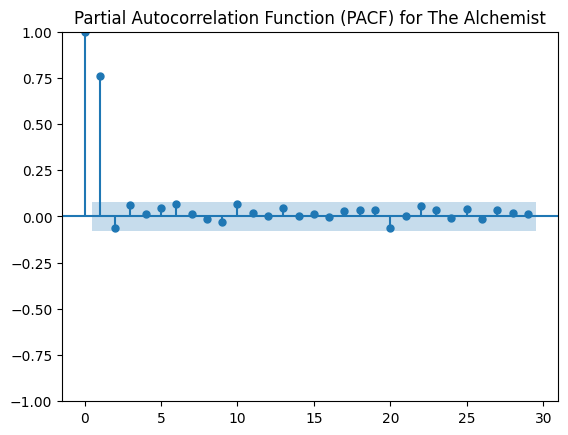

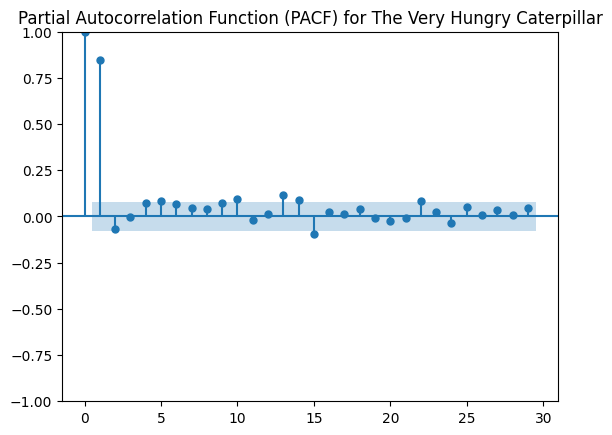

In [ ]:
# Create PACF plot.
smgraphics.tsa.plot_pacf(book1_data_alchemist.Volume, alpha=0.05);
plt.title('Partial Autocorrelation Function (PACF) for The Alchemist');

# PACF default arguments.
# x           : The time series object
# lags=None   : Number of lags to calculate. If None selects automatically
# alpha=0.05  : Confidence level to use for insignificance region
# method='ywm': Related to calculation method
# zero=True   : Return 0-lag autocorrelation?

smgraphics.tsa.plot_pacf(book2_data_caterpillar.Volume, alpha=0.05);
plt.title('Partial Autocorrelation Function (PACF) for The Very Hungry Caterpillar');

PACF(0,1) shows strong correlation just like ACF(0,1). All  lags greater than 1 are eliminated in the PACF however except for 2 values that are just about significant for The Very Hungry Caterpillar, The Alchemist is also quite borderline.

PACF for both books shows us that the direct correlations between the time series and its lagged values are primarily present for the first lag.

There is also some kind of seasonality present as there are repeated patterns, this is also present for the first book, The alcehmist, however it is less pronounced.

Seasonal AR order (P) in my data looks like 1 for both

## Ljung box - optional

In [ ]:
from statsmodels.stats.diagnostic import acorr_ljungbox


The Ljung-Box test is a  test used to check whether there are significant autocorrelations in a time series at lags greater than zero.

Null Hypothesis (H0): The null hypothesis states that the time series is independently distributed, meaning there are no autocorrelations at any of the tested lags.

Alternative Hypothesis (H1): The alternative hypothesis posits that there are significant autocorrelations at one or more of the tested lags.

Low P-Value (typically < 0.05): Reject the null hypothesis. This indicates that there is significant autocorrelation present in the time series, suggesting that the model may not have adequately captured the data's dynamics.

High P-Value (typically >= 0.05): Do not reject the null hypothesis. This suggests that the time series does not show significant autocorrelation at the tested lags, indicating that the residuals from your model are likely white noise.

In [ ]:
# Calculate The Alchemist / book 1 p-values.

print('Ljung-Box test output for the Alchemist / book 1\n', acorr_ljungbox(book1_data_alchemist.Volume), '...\n')

# Calculate The very hungry caterpillar / book 2 p-values.

print('Ljung-Box test output for The very hungry caterpillar / book 2\n', acorr_ljungbox(book2_data_caterpillar.Volume), '...\n')

Ljung-Box test output for the Alchemist / book 1
        lb_stat      lb_pvalue
1   379.081861   1.971765e-84
2   578.082439  2.957967e-126
3   695.569158  1.917828e-150
4   769.205521  3.591563e-165
5   821.405473  2.705878e-175
6   867.468386  4.046255e-184
7   906.989910  1.485573e-191
8   936.285520  8.393678e-197
9   954.299344  1.228480e-199
10  970.371488  4.503160e-202 ...

Ljung-Box test output for The very hungry caterpillar / book 2
         lb_stat      lb_pvalue
1    473.486785  5.585020e-105
2    796.770042  9.629054e-174
3   1016.174191  5.577365e-220
4   1178.481171  7.363669e-254
5   1313.552900  7.397646e-282
6   1436.218558  3.480674e-307
7   1551.241938   0.000000e+00
8   1660.261848   0.000000e+00
9   1768.298808   0.000000e+00
10  1883.629584   0.000000e+00 ...



Significant Autocorrelation: Both time series data show substantial evidence of autocorrelation at all lags tested, with increasingly large test statistics and very small p-values.

Model Consideration: The presence of significant autocorrelation suggests that standard forecasting methods may be insufficient. Time series models that incorporate this autocorrelation, such as ARIMA or other autoregressive models should be utilised.

## ACF & PACF, Ljung box on residuals data - optional

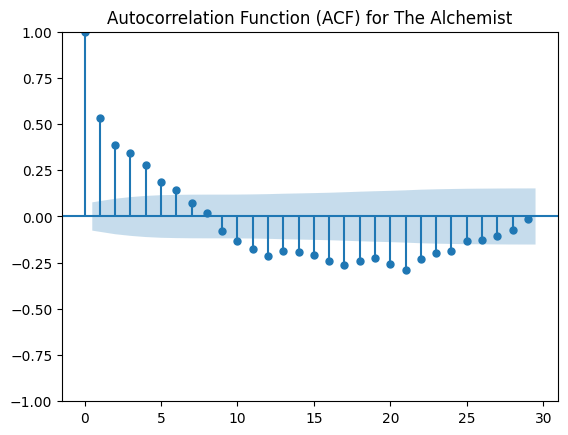

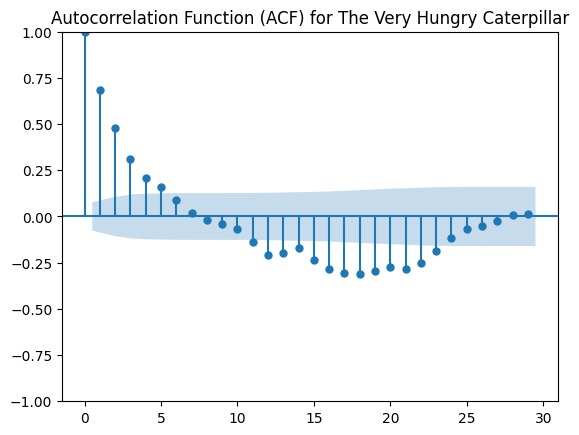

In [ ]:
# Create ACF plot.
smgraphics.tsa.plot_acf(stl_residuals_book1, alpha=0.05);
plt.title('Autocorrelation Function (ACF) for The Alchemist');

# ACF default arguments.
# x                     : The time series object.
# lags=None             : Number of lags to calculate. If None selects automatically.
# alpha=0.05            : Confidence level to use for insignificance region.
# adjusted=False        : Related to calculation method.
# fft=False             : Related to calculation method (fast fourier transform).
# missing='none'        : How to treat missing values.
# zero=True             : Return 0-lag autocorrelation?
# bartlett_confint=True : Related to calculation of insignificance region.

# Create ACF plot.
smgraphics.tsa.plot_acf(stl_residuals_book2, alpha=0.05);
plt.title('Autocorrelation Function (ACF) for The Very Hungry Caterpillar');

In [ ]:
# Calculate The Alchemist / book 1 p-values.

print('Ljung-Box test output for the Alchemist / book 1\n', acorr_ljungbox(stl_residuals_book1), '...\n')

# Calculate The very hungry caterpillar / book 2 p-values.

print('Ljung-Box test output for The very hungry caterpillar / book 2\n', acorr_ljungbox(stl_residuals_book2), '...\n')

Ljung-Box test output for the Alchemist / book 1
        lb_stat     lb_pvalue
1   188.462437  6.885807e-43
2   287.811149  3.181289e-63
3   366.264367  4.484578e-79
4   417.474912  4.657477e-89
5   440.120767  6.639316e-93
6   453.253680  9.786767e-95
7   456.626834  1.675930e-94
8   456.828955  1.272298e-93
9   461.175355  1.169336e-93
10  472.875660  2.744037e-95 ...

Ljung-Box test output for The very hungry caterpillar / book 2
        lb_stat      lb_pvalue
1   308.499484   4.635585e-69
2   459.128968  2.001757e-100
3   522.835847  5.365242e-113
4   550.907357  6.510431e-118
5   567.933116  1.711778e-120
6   573.391521  1.277778e-120
7   573.581606  1.187033e-119
8   573.849190  9.770853e-119
9   574.899077  5.091840e-118
10  577.833154  9.863635e-118 ...



## Stationarity test

In [ ]:
# Testing for stationarity - ADF Test
adf_result = adfuller(book1_data_alchemist.Volume)
print('p-value. original data:', adf_result[1])

adf_result = adfuller(book2_data_caterpillar.Volume)
print('p-value. original data:', adf_result[1])

adf_result = adfuller(stl_residuals_book1)
print('p-value. residual data:', adf_result[1])

adf_result = adfuller(stl_residuals_book2)
print('p-value. residual data:', adf_result[1])

p-value. original data: 4.139950997174928e-13
p-value. original data: 0.029616021527175844
p-value. residual data: 7.339107000437332e-16
p-value. residual data: 9.036983884835358e-15


Since the p-value is significantly lower than common significance levels (e.g., 0.05 or 0.01), we can reject the null hypothesis of the ADF test.

This indicates that the time series data for The Alchemist and The very Hungry Caterpillar exhibit stationarity.

Classical modelling methods e.g ARIMA, SARIMA assume stationarity so these can be implemented without issue, differencing is not required.

## Summary

ADF confirmed time series is stationary.

An AR model is appropriate for a time series if the data's partial autocorrelation function (PACF) has an abrupt cut-off at a certain lag. Looking at the residual of the decomp model, we can see this is also not true, instead there is a gradual decay.

An MA model is preferred if the autocorrelation function (ACF) has an abrupt cut-off. In this case this is not true.

Considering none of the above conditions are true, then we must use an ARMA model/ARIMA

# Modelling Prep (functions and data)

In [ ]:
def prepare_data_after_2012(book_data, column_name, split_size=32):
    """
    Prepare training and testing data after 2012-01-01 based on a given split size.

    Args:
        book_data (pd.DataFrame): The DataFrame containing the book data with a time series index.
        column_name (str): The column to split into train and test data.
        split_size (int): The number of entries (weeks or months) to include in the test set.

    Returns:
        pd.Series: Training data (all data except the last split_size weeks/months).
        pd.Series: Test data (last split_size weeks/months).
    """
    # Filter data for dates after 2012-01-01 inclusive
    data_after_2012 = book_data[book_data.index >= '2012-01-01']

    # Ensure there is enough data for splitting
    if len(data_after_2012) < split_size:
        raise ValueError(f"Not enough data available for the test set (at least {split_size} entries required).")

    # Split into train and test data
    train_data = data_after_2012[column_name].iloc[:-split_size]  # All data except the last split_size entries
    test_data = data_after_2012[column_name].iloc[-split_size:]   # Last split_size entries of data

    # Display the results
    display(train_data)
    display(test_data)

    return train_data, test_data

In [ ]:
# Prepare data for 'Volume' column for Book 1
train_data_alchemist, test_data_alchemist = prepare_data_after_2012(book1_data_alchemist, 'Volume', 32)

# Prepare data for 'Volume' column for Book 2
train_data_caterpillar, test_data_caterpillar = prepare_data_after_2012(book2_data_caterpillar, 'Volume', 32)

,Volume
End Date,
2012-01-07,518
2012-01-14,533
2012-01-21,475
2012-01-28,514
2012-02-04,591
...,...
2023-11-11,599
2023-11-18,572
2023-11-25,637


,Volume
End Date,
2023-12-16,1260
2023-12-23,2201
2023-12-30,1050
2024-01-06,806
2024-01-13,748
2024-01-20,695
2024-01-27,724
2024-02-03,664
2024-02-10,682


,Volume
End Date,
2012-01-07,512
2012-01-14,519
2012-01-21,574
2012-01-28,621
2012-02-04,1140
...,...
2023-11-11,2185
2023-11-18,2413
2023-11-25,2976


,Volume
End Date,
2023-12-16,2794
2023-12-23,3527
2023-12-30,1151
2024-01-06,1273
2024-01-13,1421
2024-01-20,1679
2024-01-27,2062
2024-02-03,2595
2024-02-10,2755


In [ ]:
# Updated plot_prediction function
def plot_prediction(series_train, series_test, forecast, forecast_int=None, fitted_values=None, title="Forecast Plot"):
    mae = mean_absolute_error(series_test, forecast)
    mape = mean_absolute_percentage_error(series_test, forecast)

    # Create a figure
    fig = go.Figure()

    # Add the training data trace
    fig.add_trace(go.Scatter(x=series_train.index, y=series_train,
                             mode='lines', name='Train / Actual',
                             line=dict(color='blue')))

    # Add the test data (actual values) trace
    fig.add_trace(go.Scatter(x=series_test.index, y=series_test,
                             mode='lines', name='Test / Actual',
                             line=dict(color='black')))

    # Add the forecast data trace
    fig.add_trace(go.Scatter(x=series_test.index, y=forecast,
                             mode='lines', name='Forecast',
                             line=dict(color='red')))

    # Add fitted values if provided
    if fitted_values is not None:
        fig.add_trace(go.Scatter(x=fitted_values.index, y=fitted_values,
                                 mode='lines', name='Fitted Values',
                                 line=dict(color='green', dash='dash')))

    # If forecast intervals are available, add them as shaded areas
    if forecast_int is not None:
        fig.add_trace(go.Scatter(
            x=series_test.index.tolist() + series_test.index[::-1].tolist(),
            y=forecast_int['upper'].tolist() + forecast_int['lower'][::-1].tolist(),
            fill='toself',
            fillcolor='rgba(169, 169, 169, 0.2)',
            line=dict(color='rgba(255,255,255,0)'),
            hoverinfo="skip",
            name='Confidence Interval',
            showlegend=False
        ))

    # Update layout for titles and labels
    fig.update_layout(
        title=title,  # Use the provided title parameter
        xaxis_title="Date",
        yaxis_title="Volume",
        legend=dict(font=dict(size=16)),
        template='plotly_white',
        width=800,
        height=500
    )

    # Return the figure for saving
    return fig, mae, mape

In [ ]:
"""
# Save train_data_alchemist and test_data_alchemist as CSV files
train_data_alchemist.to_csv('train_data_alchemist.csv', index=True)
test_data_alchemist.to_csv('test_data_alchemist.csv', index=True)

from google.colab import files

# Download the CSV files
files.download('train_data_alchemist.csv')
files.download('test_data_alchemist.csv')
"""

"\n# Save train_data_alchemist and test_data_alchemist as CSV files\ntrain_data_alchemist.to_csv('train_data_alchemist.csv', index=True)\ntest_data_alchemist.to_csv('test_data_alchemist.csv', index=True)\n\nfrom google.colab import files\n\n# Download the CSV files\nfiles.download('train_data_alchemist.csv')\nfiles.download('test_data_alchemist.csv')\n"

# Classical Modelling

4. Auto ARIMA on both books. **The forecast horizon is the final 32 weeks of data.** All prior data (from 2012-01-01 onwards) is used as the training data.
6. Residuals of the 'best' model for both books.
7. Using the best model predicting the final 32 weeks of data. Visual plot of the prediction with the confidence intervals for both books.

m = 52 as weekly data with  a yearly seasonal pattern

p (AR order): using a range as unclear value of p

q (MA order): q=1 from the ACF plot.

P, Q (Seasonal components): P unclear, Q likely 1

Auto ARIMA Parameters:

start_p, max_p: Since there’s no sharp cutoff in the PACF, so using a range

start_q, max_q: Given q=1, setting start_q=0 and max_q=2 to allow some flexibility

In [ ]:
# Define the model with adjustments for faster performance.
ARIMA_model_alchemist = auto_arima(y=train_data_alchemist, X=None,
                   start_p=0, d=None, start_q=0, max_p=2, max_d=0, max_q=2, #max_p = 5 crashed #max_p=3
                   start_P=0, D=None, start_Q=0, max_P=2, max_D=0, max_Q=2,  #max_Q =5 crashed #max_P=3
                   max_order=10,
                   m=52, seasonal=True,
                   stationary=True, information_criterion='aic',
                   alpha=0.05, test='kpss', seasonal_test='ocsb', #where is the stationarity test?
                   stepwise=True, n_jobs=1, maxiter=30,  #do I want a stepwise or parallel strategy? the latter is exhaustive, the former is quicker so opting for that
                   offset_test_args=None, seasonal_test_args=None,
                   suppress_warnings=True, error_action='trace', trace=False,
                   random=False, random_state=None, n_fits=5,
                   return_valid_fits=False, out_of_sample_size=0, scoring='mse',
                   with_intercept='auto', sarimax_kwargs=None)

# Print model results.
ARIMA_model_alchemist.summary()

AIC: 7724.299170740129, BIC: 7742.037356815279


6.4 minutes to finish running

In [ ]:
# Print model results.
ARIMA_model_alchemist.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                                     SARIMAX Results                                      
==========================================================================================
Dep. Variable:                                  y   No. Observations:                  623
Model:             SARIMAX(1, 0, 0)x(1, 0, 0, 52)   Log Likelihood               -3858.150
Date:                            Sat, 05 Oct 2024   AIC                           7724.299
Time:                                    13:49:36   BIC                           7742.037
Sample:                                01-07-2012   HQIC                          7731.193
                                     - 12-09-2023                                         
Covariance Type:                              opg                                         
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
intercept     92.7516      6.638     13.973      0.000      79.742     105.761
ar.L1          0.6713      0.011     62.372      0.000       0.650       0.692
ar.S.L52       0.5023      0.019     26.511      0.000       0.465       0.539
sigma2      1.149e+04    335.150     34.290      0.000    1.08e+04    1.21e+04
===================================================================================
Ljung-Box (L1) (Q):                  12.21   Jarque-Bera (JB):               749.36
Prob(Q):                              0.00   Prob(JB):                         0.00
Heteroskedasticity (H):               2.75   Skew:                             0.35
Prob(H) (two-sided):                  0.00   Kurtosis:                         8.33
===================================================================================

Warnings:
[1] Covariance matrix calculated using the outer product of gradients (complex-step).
"""

AR terms (ar.L1) - Coefficient: 0.6713

Suggests a strong positive relationship with the first lag, indicating that the previous observation significantly influences the current value.

Seasonal AR term (ar.S.L52) - Coefficient: 0.5023

Indicates a moderately strong positive relationship with the value from 52 periods ago, and it is statistically significant (p < 0.001).

Sigma² - Value: 1.149e+04

This is the variance of the error term, indicating the amount of unexplained variance in the model. A sigma² of this magnitude suggests a considerable amount of variability that the model does not account for, which could hinder the model's predictive accuracy.

Log Likelihood: - Value: -3858.150

Reflects the goodness of fit; the low negative values suggest a poor model.

Ljung-Box (L1) Test - Prob (Q): 0.00

The result from the Ljung-Box test indicates significant autocorrelation in the residuals (p < 0.001). This suggests that the model has not fully captured all patterns in the data, indicating the potential need for additional terms or modifications.

Jarque-Bera (JB) Test - Prob (JB): 0.00

This result indicates that the residuals are not normally distributed (p < 0.001), which can signal potential model misspecification or the presence of outliers that affect the model's performance.

Heteroskedasticity (H) - Value: 2.75

This value suggests the presence of heteroskedasticity, meaning the variance of the residuals is not constant across observations. This can lead to inefficiencies in parameter estimation and impact the reliability of forecasts.

Skewness and Kurtosis -  Skew: 0.35 (indicating a slight right skew)

Kurtosis: 8.33 (indicating heavy tails)

The skewness suggests a slight asymmetry in the distribution of residuals, while the kurtosis indicates a higher peak and heavier tails than a normal distribution, implying the presence of outliers or extreme values in the dataset.

In [ ]:
# Define the model with adjustments for faster performance.
ARIMA_model_caterpillar = auto_arima(y=train_data_caterpillar, X=None,
                   start_p=0, d=None, start_q=0, max_p=2, max_d=0, max_q=2, #max_p = 5 crashed #max_p=3
                   start_P=0, D=None, start_Q=0, max_P=2, max_D=0, max_Q=2,  #max_Q =5 crashed #max_P=3
                   max_order=10,
                   m=52, seasonal=True,
                   stationary=True, information_criterion='aic',
                   alpha=0.05, test='kpss', seasonal_test='ocsb', #where is the stationarity test?
                   stepwise=True, n_jobs=1, maxiter=30,  #do I want a stepwise or parallel strategy? the latter is exhaustive, the former is quicker so opting for that
                   offset_test_args=None, seasonal_test_args=None,
                   suppress_warnings=True, error_action='trace', trace=False,
                   random=False, random_state=None, n_fits=5,
                   return_valid_fits=False, out_of_sample_size=0, scoring='mse',
                   with_intercept='auto', sarimax_kwargs=None)

# Print model results.
ARIMA_model_caterpillar.summary()

AIC: 9009.522020666474, BIC: 9036.129299779199


16 minutes to finish running

In [ ]:
# Print model results.
ARIMA_model_caterpillar.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                                      SARIMAX Results                                       
============================================================================================
Dep. Variable:                                    y   No. Observations:                  623
Model:             SARIMAX(1, 0, 0)x(2, 0, [1], 52)   Log Likelihood               -4498.761
Date:                              Sat, 05 Oct 2024   AIC                           9009.522
Time:                                      14:06:29   BIC                           9036.129
Sample:                                  01-07-2012   HQIC                          9019.862
                                       - 12-09-2023                                         
Covariance Type:                                opg                                         
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
intercept    189.9622     34.469      5.511      0.000     122.404     257.520
ar.L1          0.8270      0.017     49.909      0.000       0.795       0.860
ar.S.L52      -0.0733      0.167     -0.438      0.661      -0.401       0.254
ar.S.L104      0.2990      0.071      4.240      0.000       0.161       0.437
ma.S.L52       0.4073      0.169      2.411      0.016       0.076       0.738
sigma2      1.072e+05   3253.468     32.939      0.000    1.01e+05    1.14e+05
===================================================================================
Ljung-Box (L1) (Q):                   1.62   Jarque-Bera (JB):              4888.52
Prob(Q):                              0.20   Prob(JB):                         0.00
Heteroskedasticity (H):               4.59   Skew:                             0.88
Prob(H) (two-sided):                  0.00   Kurtosis:                        16.61
===================================================================================

Warnings:
[1] Covariance matrix calculated using the outer product of gradients (complex-step).
"""

AR terms (ar.L1): Coefficient: 0.8270 suggests a strong positive relationship with the first lag, indicating that the immediate past value significantly influences the current value.

Seasonal AR terms (ar.S.L52) and (ar.S.L104):

Coefficient for ar.S.L52: -0.0733

The coefficient for ar.S.L52 indicates a very weak and negative relationship with the value from 52 periods ago, which is not statistically significant (p = 0.661). This may suggest that the seasonal effect at this lag is minimal or non-existent in this model.

Coefficient for ar.S.L104: 0.2990

Conversely, ar.S.L104 has a positive coefficient, suggesting a moderate relationship with the value from 104 periods ago, and it is statistically significant (p < 0.001). This implies that values from two years ago may still have some influence on the current value.

Seasonal MA term (ma.S.L52): Coefficient: 0.4073

The seasonal MA term ma.S.L52 has a positive coefficient and is statistically significant (p = 0.016), indicating that the model is capturing some residuals from 52 periods ago, which is likely related to seasonal fluctuations.

Sigma²: Value: 1.072e+05

This is the variance of the error term, indicating a substantial amount of unexplained variance in the model. A high sigma² suggests that while the model captures some trends, there is still considerable variability that it does not account for, potentially leading to less reliable predictions.

Log Likelihood: Value: -4498.761

The Log Likelihood reflects the goodness of fit of the model; while lower negative values typically indicate a poor model fit, this should be compared with other models to draw meaningful conclusions.

Ljung-Box (L1) Test - Prob (Q): 0.20

Indicates there is no significant autocorrelation at lag 1. This suggests that the model has successfully captured the autocorrelation structure of the data at this lag, and residuals appear to be randomly distributed.

Jarque-Bera (JB) Test: Prob (JB): 0.00

Suggests that the residuals are not normally distributed (p < 0.001). A non-normal distribution of residuals can indicate model misspecification or the presence of outliers.

Heteroskedasticity (H): Value: 4.59

This result indicates that there may be issues with heteroskedasticity (non-constant variance of errors), suggesting that the variability of the residuals is not consistent across observations. This could impact the validity of the inferences drawn from the model.

Skewness and Kurtosis: Skew: 0.88 (indicating a slight right skew)

Kurtosis: 16.61 (indicating heavy tails)
Both skewness and kurtosis values suggest potential outliers and deviations from normality in the residuals, which may affect forecasting accuracy.

In [ ]:
# Use the model to forecast the next 32 time steps.
n_periods = 32  # Number of periods to forecast

predictions_ARIMA_alchemist = ARIMA_model_alchemist.predict(n_periods=n_periods, return_conf_int=True, alpha=0.05)
predictions_ARIMA_caterpillar = ARIMA_model_caterpillar.predict(n_periods=n_periods, return_conf_int=True, alpha=0.05)

In [ ]:
forecast_ARIMA_alchemist = predictions_ARIMA_alchemist[0]  # This is the predicted values (Pandas Series)
forecast_int_ARIMA_alchemist = predictions_ARIMA_alchemist[1]  # This is the confidence intervals (NumPy array)
forecast_int_df_ARIMA_alchemist = pd.DataFrame(forecast_int_ARIMA_alchemist, columns=["lower", "upper"], index=forecast_ARIMA_alchemist.index)

forecast_ARIMA_caterpillar = predictions_ARIMA_caterpillar[0]  # This is the predicted values (Pandas Series)
forecast_int_ARIMA_caterpillar = predictions_ARIMA_caterpillar[1]  # This is the confidence intervals (NumPy array)
forecast_int_df_ARIMA_caterpillar = pd.DataFrame(forecast_int_ARIMA_caterpillar, columns=["lower", "upper"], index=forecast_ARIMA_caterpillar.index)

Note - SARIMAX(1, 0, 0)x(1, 0, 0, 52)

In [ ]:
# Optionally extract the fitted values if needed
fitted_values_ARIMA_alchemist = pd.Series(ARIMA_model_alchemist.predict_in_sample(), index=train_data_alchemist.index)

# Call the function with fitted values to get the figure
fig, mae, mape = plot_prediction(series_train=train_data_alchemist, series_test=test_data_alchemist,
                                 forecast=forecast_ARIMA_alchemist, forecast_int=forecast_int_df_ARIMA_alchemist,
                                 fitted_values=fitted_values_ARIMA_alchemist, title='Auto Arima Forecast Alchemist')

# Print the metrics
print("MAE:", mae)
print("MAPE:", mape)

fig.show()

MAE: 147.29333566351175
MAPE: 0.2607659218779671


In [ ]:
# Save the figure as an HTML file and download it
output_path = "Auto Arima Forecast Alchemist.html"
pio.write_html(fig, file=output_path, auto_open=False)

# Download the HTML file locally
files.download(output_path)

Note - SARIMAX(1, 0, 0)x(2, 0, [1], 52)

In [ ]:
# Optionally extract the fitted values if needed
fitted_values_ARIMA_caterpillar = pd.Series(ARIMA_model_caterpillar.predict_in_sample(), index=train_data_alchemist.index)

# Call the function with fitted values to get the figure
fig, mae, mape = plot_prediction(series_train=train_data_caterpillar, series_test=test_data_caterpillar,
                                 forecast=forecast_ARIMA_caterpillar, forecast_int=forecast_int_df_ARIMA_caterpillar,
                                 fitted_values=fitted_values_ARIMA_caterpillar, title='Auto Arima Forecast Caterpillar')

# Print the metrics
print("MAE:", mae)
print("MAPE:", mape)

fig.show()

MAE: 548.9586723684281
MAPE: 0.2534493421330982


In [ ]:
# Save the figure as an HTML file and download it
output_path = "Auto Arima Forecast Caterpillar.html"
pio.write_html(fig, file=output_path, auto_open=False)

# Download the HTML file locally
files.download(output_path)

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [ ]:
# Initialize a list to hold model results
model_results_list = []

In [ ]:
def log_model_results(model_number, model_name, model_results, mae, mape, book, dataset): #rmse,
    # Create a dictionary to store the model information
    model_info = {
        'Model Number': model_number,
        'Book': book,
        'Dataset': dataset,
        'Model Name': model_name,
        'Model Config': model_results,
        'MAE': mae,
        'MAPE': mape#,
        #'RMSE': rmse  # Add RMSE as a new metric
    }
    model_results_list.append(model_info)

In [ ]:
# Define your ARIMA model configurations and run the model
model_name_1 = "SARIMAX(1, 0, 0)x(1, 0, 0, 52)"
model_results_1 = {
    "Log Likelihood": -3858.150,
    "AIC": 7724.299,
    "BIC": 7742.037,
    "Sample": "01-07-2012 - 12-09-2023",
    "Intercept": 92.7516,
    "AR.L1": 0.6713,
    "AR.S.L52": 0.5023,
    "Sigma2": 1.149e+04,
    "Ljung-Box (L1)": 0.00,
    "Jarque-Bera (JB)": 0.00,
    "Heteroskedasticity (H)": 2.75,
    "Skewness": 0.35,
    "Kurtosis": 8.33,
    "Time Taken": "6.4 minutes"
}

# Call the function with fitted values to get the figure and metrics
fig_1, mae_1, mape_1 = plot_prediction(
    series_train=train_data_alchemist,
    series_test=test_data_alchemist,
    forecast=forecast_ARIMA_alchemist,
    forecast_int=forecast_int_df_ARIMA_alchemist,
    fitted_values=fitted_values_ARIMA_alchemist,
    title='Auto Arima Forecast Alchemist'
)

# Log the first model results with Model Number, Book, and Dataset
log_model_results(1, model_name_1, model_results_1, mae_1, mape_1, "The Alchemist", "After 2012-01-01 weekly")

In [ ]:
model_results_list

[{'Model Number': 1,
  'Book': 'The Alchemist',
  'Dataset': 'After 2012-01-01 weekly',
  'Model Name': 'SARIMAX(1, 0, 0)x(1, 0, 0, 52)',
  'Model Config': {'Log Likelihood': -3858.15,
   'AIC': 7724.299,
   'BIC': 7742.037,
   'Sample': '01-07-2012 - 12-09-2023',
   'Intercept': 92.7516,
   'AR.L1': 0.6713,
   'AR.S.L52': 0.5023,
   'Sigma2': 11490.0,
   'Ljung-Box (L1)': 0.0,
   'Jarque-Bera (JB)': 0.0,
   'Heteroskedasticity (H)': 2.75,
   'Skewness': 0.35,
   'Kurtosis': 8.33,
   'Time Taken': '6.4 minutes'},
  'MAE': 147.29333566351175,
  'MAPE': 0.2607659218779671}]

In [ ]:
# Flatten the Model Config dictionary into the main DataFrame
model_results_df = pd.json_normalize(model_results_list)

# Display the DataFrame
display(model_results_df)

,Model Number,Book,Dataset,Model Name,MAE,MAPE,Model Config.Log Likelihood,Model Config.AIC,Model Config.BIC,Model Config.Sample,Model Config.Intercept,Model Config.AR.L1,Model Config.AR.S.L52,Model Config.Sigma2,Model Config.Ljung-Box (L1),Model Config.Jarque-Bera (JB),Model Config.Heteroskedasticity (H),Model Config.Skewness,Model Config.Kurtosis,Model Config.Time Taken
0,1,The Alchemist,After 2012-01-01 weekly,"SARIMAX(1, 0, 0)x(1, 0, 0, 52)",147.293336,0.260766,-3858.15,7724.299,7742.037,01-07-2012 - 12-09-2023,92.7516,0.6713,0.5023,11490.0,0.0,0.0,2.75,0.35,8.33,6.4 minutes


In [ ]:
# Define your second ARIMA model configurations and run the model
model_name_2 = "SARIMAX(1, 0, 0)x(2, 0, [1], 52)"
model_results_2 = {
    "Log Likelihood": -4498.761,
    "AIC": 9009.522,
    "BIC": 9036.129,
    "Sample": "01-07-2012 - 12-09-2023",
    "Intercept": 189.9622,
    "AR.L1": 0.8270,
    "AR.S.L52": -0.0733,
    "AR.S.L104": 0.2990,
    "MA.S.L52": 0.4073,
    "Sigma2": 1.072e+05,
    "Ljung-Box (L1)": 0.20,
    "Jarque-Bera (JB)": 0.00,
    "Heteroskedasticity (H)": 4.59,
    "Skewness": 0.88,
    "Kurtosis": 16.61,
    "Time Taken": "16 minutes"
}

# Call the function for the second model to get metrics
fig_2, mae_2, mape_2 = plot_prediction(
    series_train=train_data_alchemist,
    series_test=test_data_alchemist,
    forecast=forecast_ARIMA_caterpillar,
    forecast_int=forecast_int_df_ARIMA_caterpillar,
    fitted_values=fitted_values_ARIMA_caterpillar,
    title='Auto Arima Forecast Caterpillar 2'
)

# Log the second model results with Model Number, Book, and Dataset
log_model_results(2, model_name_2, model_results_2, mae_2, mape_2, "The Very Hungry Caterpillar", "After 2012-01-01 weekly")

In [ ]:
model_results_list

[{'Model Number': 1,
  'Book': 'The Alchemist',
  'Dataset': 'After 2012-01-01 weekly',
  'Model Name': 'SARIMAX(1, 0, 0)x(1, 0, 0, 52)',
  'Model Config': {'Log Likelihood': -3858.15,
   'AIC': 7724.299,
   'BIC': 7742.037,
   'Sample': '01-07-2012 - 12-09-2023',
   'Intercept': 92.7516,
   'AR.L1': 0.6713,
   'AR.S.L52': 0.5023,
   'Sigma2': 11490.0,
   'Ljung-Box (L1)': 0.0,
   'Jarque-Bera (JB)': 0.0,
   'Heteroskedasticity (H)': 2.75,
   'Skewness': 0.35,
   'Kurtosis': 8.33,
   'Time Taken': '6.4 minutes'},
  'MAE': 147.29333566351175,
  'MAPE': 0.2607659218779671},
 {'Model Number': 2,
  'Book': 'The Very Hungry Caterpillar',
  'Dataset': 'After 2012-01-01 weekly',
  'Model Name': 'SARIMAX(1, 0, 0)x(2, 0, [1], 52)',
  'Model Config': {'Log Likelihood': -4498.761,
   'AIC': 9009.522,
   'BIC': 9036.129,
   'Sample': '01-07-2012 - 12-09-2023',
   'Intercept': 189.9622,
   'AR.L1': 0.827,
   'AR.S.L52': -0.0733,
   'AR.S.L104': 0.299,
   'MA.S.L52': 0.4073,
   'Sigma2': 107200.0,
 

In [ ]:
# Flatten the Model Config dictionary into the main DataFrame
model_results_df = pd.json_normalize(model_results_list)

# Display the DataFrame
display(model_results_df)

,Model Number,Book,Dataset,Model Name,MAE,MAPE,Model Config.Log Likelihood,Model Config.AIC,Model Config.BIC,Model Config.Sample,...,Model Config.AR.S.L52,Model Config.Sigma2,Model Config.Ljung-Box (L1),Model Config.Jarque-Bera (JB),Model Config.Heteroskedasticity (H),Model Config.Skewness,Model Config.Kurtosis,Model Config.Time Taken,Model Config.AR.S.L104,Model Config.MA.S.L52
0,1,The Alchemist,After 2012-01-01 weekly,"SARIMAX(1, 0, 0)x(1, 0, 0, 52)",147.293336,0.260766,-3858.150,7724.299,7742.037,01-07-2012 - 12-09-2023,...,0.5023,11490.0,0.0,0.0,2.75,0.35,8.33,6.4 minutes,NaN,NaN
1,2,The Very Hungry Caterpillar,After 2012-01-01 weekly,"SARIMAX(1, 0, 0)x(2, 0, [1], 52)",1141.736549,2.198628,-4498.761,9009.522,9036.129,01-07-2012 - 12-09-2023,...,-0.0733,107200.0,0.2,0.0,4.59,0.88,16.61,16 minutes,0.299,0.4073


In [ ]:
# Specify the file path where you want to save the data and model
save_path_alchemist = 'arima_model_alchemist.pkl'

# Save everything in a dictionary
save_data_alchemist = {
    'model': ARIMA_model_alchemist,  # Save the trained ARIMA model
    'train_data_alchemist': train_data_alchemist,  # Training data
    'test_data_alchemist': test_data_alchemist,  # Test data
    'forecast': forecast_ARIMA_alchemist,  # Forecast data
    'forecast_int': forecast_int_df_ARIMA_alchemist,  # Forecast confidence intervals
    'aic_alchemist': model_results_1['AIC'],  # AIC value
    'bic_alchemist': model_results_1['BIC'],  # BIC value
}

# Open a file in write-binary mode and save the dictionary
with open(save_path_alchemist, 'wb') as f:
    pickle.dump(save_data_alchemist, f)

print(f"Model and data saved to {save_path_alchemist}")

# Download the file to your local machine
files.download(save_path_alchemist)

Model and data saved to arima_model_alchemist.pkl


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [ ]:
# Specify the file path where you want to save the data and model
save_path_caterpillar = 'arima_model_caterpillar.pkl'

# Save everything in a dictionary
save_data_caterpillar = {
    'model': ARIMA_model_caterpillar,  # Save the trained ARIMA model
    'train_data_caterpillar': train_data_caterpillar,  # Training data
    'test_data_caterpillar': test_data_caterpillar,  # Test data
    'forecast': forecast_ARIMA_caterpillar,  # Forecast data
    'forecast_int': forecast_int_df_ARIMA_caterpillar,  # Forecast confidence intervals
    'aic_caterpillar': model_results_2['AIC'],  # AIC value
    'bic_caterpillar': model_results_2['BIC'],  # BIC value
}

# Open a file in write-binary mode and save the dictionary
with open(save_path_caterpillar, 'wb') as f:
    pickle.dump(save_data_caterpillar, f)

print(f"Model and data saved to {save_path_caterpillar}")

# Download the file to your local machine
files.download(save_path_caterpillar)

Model and data saved to arima_model_caterpillar.pkl


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [ ]:
# Specify the file path for saving the list
save_path_list = 'model_results_list.pkl'

# Save the list using pickle
with open(save_path_list, 'wb') as f:
    pickle.dump(model_results_list, f)

# Download the saved file to your local machine
files.download(save_path_list)

# Specify the file path for saving the dataframe
save_path_df = 'model_results_df.csv'

# Save the dataframe as a CSV file
model_results_df.to_csv(save_path_df, index=False)

# Download the saved file to your local machine
files.download(save_path_df)

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

# Machine learning and deep learning techniques

1. Preparing the data to feed into ML models: XGBoost, LSTM.
2. Hyperparameter tuning.
2. Identifying the best models.
6. Forecasting the **final 32 weeks** of sales data for both books.
7. Plotting the original data along with the predictions.
8. Display the MAE and MAPE.

##XGBoost

In [ ]:
"""
# Upload the CSV files back to Colab
uploaded = files.upload()

# Load the CSV files into DataFrames
train_data_alchemist = pd.read_csv('train_data_alchemist.csv', index_col='End Date', parse_dates=True)
test_data_alchemist = pd.read_csv('test_data_alchemist.csv', index_col='End Date', parse_dates=True)

# Convert to Series if they contain only one column
train_data_alchemist = train_data_alchemist.squeeze()
test_data_alchemist = test_data_alchemist.squeeze()
"""

Saving test_data_alchemist.csv to test_data_alchemist.csv
Saving train_data_alchemist.csv to train_data_alchemist.csv


In [ ]:
train_data_alchemist, test_data_alchemist
display(train_data_alchemist), display(test_data_alchemist)

,Volume
End Date,
2012-01-07,518
2012-01-14,533
2012-01-21,475
2012-01-28,514
2012-02-04,591
...,...
2023-11-11,599
2023-11-18,572
2023-11-25,637


,Volume
End Date,
2023-12-16,1260
2023-12-23,2201
2023-12-30,1050
2024-01-06,806
2024-01-13,748
2024-01-20,695
2024-01-27,724
2024-02-03,664
2024-02-10,682


(None, None)

In [ ]:
# Check the date range for book1_data_after_2012
date_range = train_data_alchemist.index.min(), train_data_alchemist.index.max()
print("Date Range:", date_range)

Date Range: (Timestamp('2012-01-07 00:00:00'), Timestamp('2023-12-09 00:00:00'))


In [ ]:
# Specify the predictor as XGB regressor.
def create_predictor():
  regressor = xgb.XGBRegressor()
  predictor = make_reduction(regressor, window_length=6, strategy="recursive")

  return predictor

In [ ]:
# Set the values and ranges for hyperparamter tuning.
param_grid = {
    'learning_rate': [0.05, 0.1],  # Lower learning rates can be beneficial for time series
    'max_depth': [3, 7],
    'gamma': [0, 1],
    'reg_alpha': [0, 5],
    'reg_lambda': [1, 10],
    'colsample_bytree': [0.5, 0.7, 0.9],
    'n_estimators': [50, 100],
#    'early_stopping_rounds': [20],  # Monitor performance and stop early if not improving - seems to break when this is added for some reason
    'window_length': [52],  # Wider range to capture seasonality
    'min_child_weight': [1],
    'booster': ['gbtree'],
    'tree_method': ['exact'],
    'subsample': [0.5, 1],
    'validate_parameters': [1],
    'colsample_bylevel': [1],
    'colsample_bynode': [1],
    'colsample_bytree': [1],
}

predictor = create_predictor()
predictor

RecursiveTabularRegressionForecaster(estimator=XGBRegressor(base_score=None, booster=None, callbacks=None,
             colsample_bylevel=None, colsample_bynode=None,
             colsample_bytree=None, device=None, early_stopping_rounds=None,
             enable_categorical=False, eval_metric=None, feature_types=None,
             gamma=None, grow_policy=None, importance_type=None,
             interaction_constraints=None, learning_rate=None, max_bin=None,
             max_cat_threshold=None, max_cat_to_onehot=None,
             max_delta_step=None, max_depth=None, max_leaves=None,
             min_child_weight=None, missing=nan, monotone_constraints=None,
             multi_strategy=None, n_estimators=None, n_jobs=None,
             num_parallel_tree=None, random_state=None, ...),
                                     window_length=6)

In [ ]:
# Create a function to perform the grid search with customizable parameters
def grid_search_predictor(train, test, predictor, param_grid, folds=None, future_horizon=32, fold_factor=None, CV_vs_ExpandingWindow="None", step_length=None):

    # Get the number of data points in the training set
    N = len(train)

    if CV_vs_ExpandingWindow == "CV":
        # Cross-validation approach using 'folds'

        # Determine the size of each fold based on the number of folds and future horizon
        fold_size = (N - future_horizon) // folds

        # Set the initial window to cover the first fold
        initial_window = fold_size

        # Set the step length to be the size of one fold
        step_length = fold_size

        # Create ExpandingWindowSplitter with the specified parameters
        cv = ExpandingWindowSplitter(initial_window=initial_window, step_length=step_length, fh=future_horizon)

    elif CV_vs_ExpandingWindow == "ExpandingWindow":
        # Expanding window approach using 'fold_factor' (e.g., 0.7 for 70% of the data)

        # Set the initial window as a proportion of the training set
        initial_window = int(len(train) * fold_factor)

        # If step_length is not specified, default it to 10
        if step_length is None:
            step_length = 10

        # Create ExpandingWindowSplitter with the specified parameters
        cv = ExpandingWindowSplitter(initial_window=initial_window, step_length=step_length, fh=future_horizon)

    else:
        raise ValueError("Invalid choice for CV_vs_ExpandingWindow. Use 'CV' or 'ExpandingWindow'.")

    # Perform the grid search on the specified predictor
    gscv = ForecastingGridSearchCV(
        predictor, strategy="refit", cv=cv, param_grid=param_grid,
        scoring=MeanAbsolutePercentageError(symmetric=True), verbose=2
    )

    # Fit the model using the training data
    gscv.fit(train)
    print(f"Best parameters: {gscv.best_params_}")

    # Ensure you specify the correct forecast horizon in predict
    predictions = gscv.predict(fh=np.arange(1, future_horizon + 1))

    return predictions

note to self, wasnt able to return the best model at the end of the function, something to fix for in future so dont need to refit model

## Alchemist quickest models that does not need to be re-run

In [ ]:
#predictions_alchemist = grid_search_predictor(train_data_alchemist, test_data_alchemist, predictor, param_grid, future_horizon=32, folds=1, fold_factor=None, CV_vs_ExpandingWindow="CV", step_length=None)

Fitting 1 folds for each of 128 candidates, totalling 128 fits
Best parameters: {'booster': 'gbtree', 'colsample_bylevel': 1, 'colsample_bynode': 1, 'colsample_bytree': 1, 'gamma': 0, 'learning_rate': 0.05, 'max_depth': 3, 'min_child_weight': 1, 'n_estimators': 50, 'reg_alpha': 0, 'reg_lambda': 10, 'subsample': 0.5, 'tree_method': 'exact', 'validate_parameters': 1, 'window_length': 52}


params below were: train_data_alchemist, test_data_alchemist, predictor, param_grid, future_horizon=32, **folds=1**, fold_factor=None, CV_vs_ExpandingWindow="CV", step_length=None

Duration 1min

In [ ]:
"""
# Call the function with fitted values to get the figure
fig, mae, mape = plot_prediction(series_train=train_data_alchemist, series_test=test_data_alchemist,
                                 forecast=predictions_alchemist, #forecast_int=forecast_int_df_ARIMA_alchemist,
                                 #fitted_values=fitted_values_alchemist,
                                 title='XGboost Forecast Alchemist gpt approach')

# Print the metrics
print("MAE:", mae)
print("MAPE:", mape)

fig.show()
"""

#MAE: 162.52230072021484
#MAPE: 0.29847887906277193

MAE: 162.52230072021484
MAPE: 0.29847887906277193


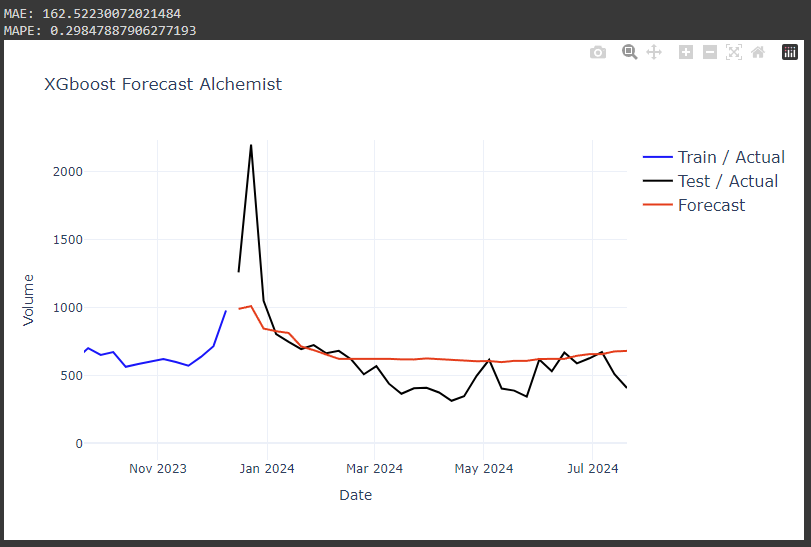

## XGBoost Alchemist optimal model using more traditional CV approach - can run

In [ ]:
predictions_alchemist = grid_search_predictor(train_data_alchemist, test_data_alchemist, predictor, param_grid, future_horizon=32, folds=10, fold_factor=None, CV_vs_ExpandingWindow="CV", step_length=None)

Fitting 10 folds for each of 128 candidates, totalling 1280 fits
Best parameters: {'booster': 'gbtree', 'colsample_bylevel': 1, 'colsample_bynode': 1, 'colsample_bytree': 1, 'gamma': 0, 'learning_rate': 0.05, 'max_depth': 7, 'min_child_weight': 1, 'n_estimators': 50, 'reg_alpha': 5, 'reg_lambda': 10, 'subsample': 0.5, 'tree_method': 'exact', 'validate_parameters': 1, 'window_length': 52}


params below were: train_data_alchemist, test_data_alchemist, predictor, param_grid, future_horizon=32, **folds=10**, fold_factor=None, CV_vs_ExpandingWindow="CV", step_length=None

Duration 4mins

In [ ]:
# Call the function with fitted values to get the figure
fig, mae, mape = plot_prediction(series_train=train_data_alchemist, series_test=test_data_alchemist,
                                 forecast=predictions_alchemist, #forecast_int=forecast_int_df_ARIMA_alchemist,
                                 #fitted_values=fitted_values_alchemist,
                                 title='XGboost Forecast Alchemist folds approach')

# Print the metrics
print("MAE:", mae)
print("MAPE:", mape)

fig.show()

MAE: 159.52963638305664
MAPE: 0.2856276002433882


## Other Alchemist models not worth re-running

In [ ]:
#predictions_alchemist = grid_search_predictor(train_data_alchemist, test_data_alchemist, predictor, param_grid, future_horizon=32, folds=20, fold_factor=None, CV_vs_ExpandingWindow="CV", step_length=None)

params for below were: train_data_alchemist, test_data_alchemist, predictor, param_grid, future_horizon=32, **folds=20**, fold_factor=None, CV_vs_ExpandingWindow="CV", step_length=None

Duration 8mins

In [ ]:
"""
# Call the function with fitted values to get the figure
fig, mae, mape = plot_prediction(series_train=train_data_alchemist, series_test=test_data_alchemist,
                                 forecast=predictions_alchemist, #forecast_int=forecast_int_df_ARIMA_alchemist,
                                 #fitted_values=fitted_values_alchemist,
                                 title='XGboost Forecast Alchemist gpt approach')

# Print the metrics
print("MAE:", mae)
print("MAPE:", mape)

fig.show()
"""

#MAE: 157.97285270690918
#MAPE: 0.2804230980198332

MAE: 157.97285270690918
MAPE: 0.2804230980198332


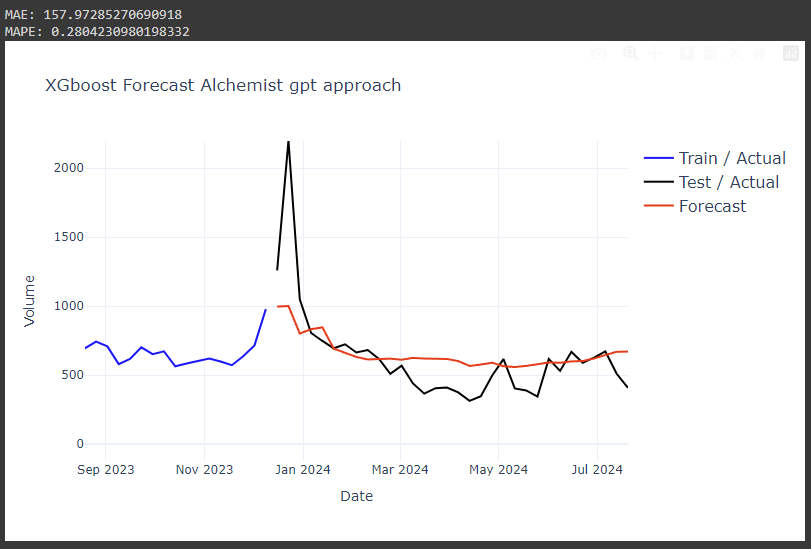

In [ ]:
#predictions_alchemist_expanding_window = grid_search_predictor(train_data_alchemist, test_data_alchemist, predictor, param_grid, future_horizon=32, folds=None, fold_factor=0.8, CV_vs_ExpandingWindow="ExpandingWindow", step_length=100)

Fitting 1 folds for each of 128 candidates, totalling 128 fits
Best parameters: {'booster': 'gbtree', 'colsample_bylevel': 1, 'colsample_bynode': 1, 'colsample_bytree': 1, 'gamma': 1, 'learning_rate': 0.1, 'max_depth': 7, 'min_child_weight': 1, 'n_estimators': 50, 'reg_alpha': 0, 'reg_lambda': 10, 'subsample': 0.5, 'tree_method': 'exact', 'validate_parameters': 1, 'window_length': 52}


params below were: train_data_alchemist, test_data_alchemist, predictor, param_grid, future_horizon=32, folds=None, **fold_factor=0.8**, CV_vs_ExpandingWindow="ExpandingWindow", **step_length=100**

Duration 43s

In [ ]:
"""
# Call the function with fitted values to get the figure
fig, mae, mape = plot_prediction(series_train=train_data_alchemist, series_test=test_data_alchemist,
                                 forecast=predictions_alchemist_expanding_window, #forecast_int=forecast_int_df_ARIMA_alchemist,
                                 #fitted_values=predictions_alchemist_expanding_window,
                                 title='XGboost Forecast Alchemist Expanding window 80%')

# Print the metrics
print("MAE:", mae)
print("MAPE:", mape)

fig.show()
"""

#MAE: 162.10859489440918
#MAPE: 0.301292455753206

MAE: 162.10859489440918
MAPE: 0.301292455753206


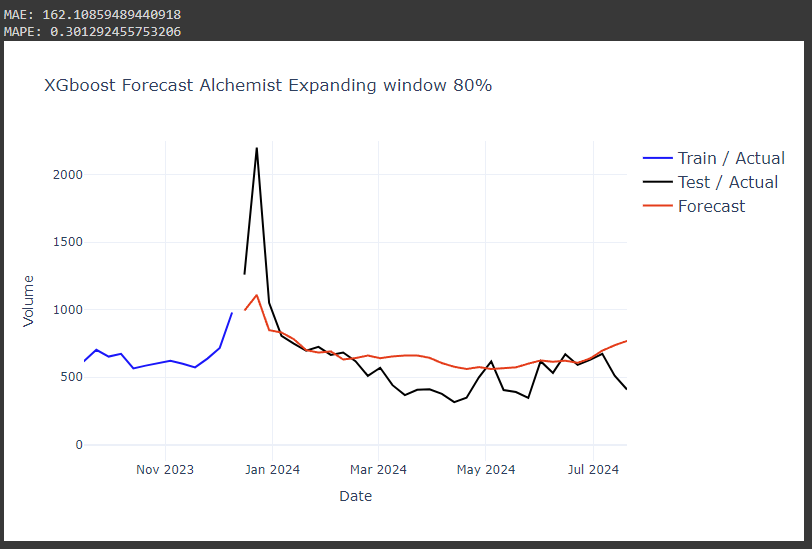

## Optimal XGBoost Alchemist model using ExpandingWindow approach shown in demos

In [ ]:
predictions_alchemist_expanding_window = grid_search_predictor(train_data_alchemist, test_data_alchemist, predictor, param_grid, future_horizon=32, folds=None, fold_factor=0.8, CV_vs_ExpandingWindow="ExpandingWindow", step_length=10)

Fitting 10 folds for each of 128 candidates, totalling 1280 fits
Best parameters: {'booster': 'gbtree', 'colsample_bylevel': 1, 'colsample_bynode': 1, 'colsample_bytree': 1, 'gamma': 0, 'learning_rate': 0.05, 'max_depth': 3, 'min_child_weight': 1, 'n_estimators': 50, 'reg_alpha': 0, 'reg_lambda': 10, 'subsample': 1, 'tree_method': 'exact', 'validate_parameters': 1, 'window_length': 52}


params below were: train_data_alchemist, test_data_alchemist, predictor, param_grid, future_horizon=32, folds=None, fold_factor=0.8, CV_vs_ExpandingWindow="ExpandingWindow", **step_length=10**

Duration 6mins

In [ ]:
# Call the function with fitted values to get the figure
fig, mae, mape = plot_prediction(series_train=train_data_alchemist, series_test=test_data_alchemist,
                                 forecast=predictions_alchemist_expanding_window, #forecast_int=forecast_int_df_ARIMA_alchemist,
                                 #fitted_values=predictions_alchemist_expanding_window,
                                 title='XGboost Forecast Alchemist Expanding window 80%')

# Print the metrics
print("MAE:", mae)
print("MAPE:", mape)

fig.show()

MAE: 155.0896339416504
MAPE: 0.28383631374905727


In [ ]:
# Define the results for the new model
XGBoost_alchemist_expanding_window = {
    'Best Parameters': {
        'booster': 'gbtree',
        'colsample_bylevel': 1,
        'colsample_bynode': 1,
        'colsample_bytree': 1,
        'gamma': 0,
        'learning_rate': 0.05,
        'max_depth': 3,
        'min_child_weight': 1,
        'n_estimators': 50,
        'reg_alpha': 0,
        'reg_lambda': 10,
        'subsample': 1,
        'tree_method': 'exact',
        'validate_parameters': 1,
        'window_length': 52
    },
    'Duration': '6 minutes'  # Specify duration for the model fitting
}

# Logging the new model results
model_number = len(model_results_list) + 1  # Set model number dynamically
model_name = 'XGBoost with Grid Search ExpandingWindowSplitter'
mae = 155.0896339416504
mape = 0.28383631374905727
book = 'The Alchemist'
dataset = 'After 2012-01-01 weekly'

# Call the logging function
log_model_results(model_number, model_name, XGBoost_alchemist_expanding_window, mae, mape, book, dataset)

In [ ]:
# Flatten the Model Config dictionary into the main DataFrame
model_results_df = pd.json_normalize(model_results_list)

# Display the DataFrame
display(model_results_df)

,Model Number,Book,Dataset,Model Name,MAE,MAPE,Model Config.Log Likelihood,Model Config.AIC,Model Config.BIC,Model Config.Sample,...,Model Config.Best Parameters.max_depth,Model Config.Best Parameters.min_child_weight,Model Config.Best Parameters.n_estimators,Model Config.Best Parameters.reg_alpha,Model Config.Best Parameters.reg_lambda,Model Config.Best Parameters.subsample,Model Config.Best Parameters.tree_method,Model Config.Best Parameters.validate_parameters,Model Config.Best Parameters.window_length,Model Config.Duration
0,1,The Alchemist,After 2012-01-01 weekly,"SARIMAX(1, 0, 0)x(1, 0, 0, 52)",147.293336,0.260766,-3858.150,7724.299,7742.037,01-07-2012 - 12-09-2023,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,2,The Very Hungry Caterpillar,After 2012-01-01 weekly,"SARIMAX(1, 0, 0)x(2, 0, [1], 52)",1141.736549,2.198628,-4498.761,9009.522,9036.129,01-07-2012 - 12-09-2023,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,3,The Alchemist,After 2012-01-01 weekly,XGBoost with Grid Search ExpandingWindowSplitter,155.089634,0.283836,NaN,NaN,NaN,NaN,...,3.0,1.0,50.0,0.0,10.0,1.0,exact,1.0,52.0,6 minutes


In [ ]:
# Step 1: Filter the DataFrame for Model Number 3
model_3_data = model_results_df[model_results_df['Model Number'] == 3]

# Step 2: Select columns that contain "Model Config.Best Parameters"
best_parameters_columns  = model_3_data.filter(like='Model Config.Best Parameters')

# Display the result
display(best_parameters_columns)

,Model Config.Best Parameters.booster,Model Config.Best Parameters.colsample_bylevel,Model Config.Best Parameters.colsample_bynode,Model Config.Best Parameters.colsample_bytree,Model Config.Best Parameters.gamma,Model Config.Best Parameters.learning_rate,Model Config.Best Parameters.max_depth,Model Config.Best Parameters.min_child_weight,Model Config.Best Parameters.n_estimators,Model Config.Best Parameters.reg_alpha,Model Config.Best Parameters.reg_lambda,Model Config.Best Parameters.subsample,Model Config.Best Parameters.tree_method,Model Config.Best Parameters.validate_parameters,Model Config.Best Parameters.window_length
2,gbtree,1.0,1.0,1.0,0.0,0.05,3.0,1.0,50.0,0.0,10.0,1.0,exact,1.0,52.0


if you have time come back and try this with a 70% split

## Alchemist Longer models do not run as results not worthwhile

In [ ]:
#predictions_alchemist_expanding_window = grid_search_predictor(train_data_alchemist, test_data_alchemist, predictor, param_grid, future_horizon=32, folds=None, fold_factor=0.8, CV_vs_ExpandingWindow="ExpandingWindow", step_length=5)

Fitting 19 folds for each of 128 candidates, totalling 2432 fits
Best parameters: {'booster': 'gbtree', 'colsample_bylevel': 1, 'colsample_bynode': 1, 'colsample_bytree': 1, 'gamma': 0, 'learning_rate': 0.1, 'max_depth': 7, 'min_child_weight': 1, 'n_estimators': 100, 'reg_alpha': 0, 'reg_lambda': 1, 'subsample': 1, 'tree_method': 'exact', 'validate_parameters': 1, 'window_length': 52}


params below were: train_data_alchemist, test_data_alchemist, predictor, param_grid, future_horizon=32, folds=None, **fold_factor=0.8**, CV_vs_ExpandingWindow="ExpandingWindow", **step_length=5**

Duration - 12mins

In [ ]:
"""
# Call the function with fitted values to get the figure
fig, mae, mape = plot_prediction(series_train=train_data_alchemist, series_test=test_data_alchemist,
                                 forecast=predictions_alchemist_expanding_window, #forecast_int=forecast_int_df_ARIMA_alchemist,
                                 #fitted_values=predictions_alchemist_expanding_window,
                                 title='XGboost Forecast Alchemist Expanding window 80%')

# Print the metrics
print("MAE:", mae)
print("MAPE:", mape)

fig.show()
"""
#MAE: 148.47491645812988
#MAPE: 0.2997096683142025

MAE: 148.47491645812988
MAPE: 0.2997096683142025


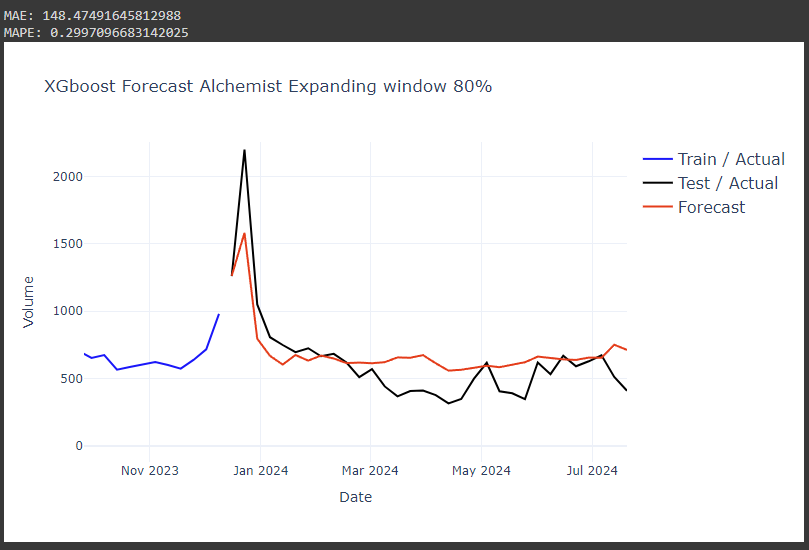

## Caterpillar XGBoost

In [ ]:
train_data_caterpillar, test_data_caterpillar
display(train_data_caterpillar), display(test_data_caterpillar)

,Volume
End Date,
2012-01-07,512
2012-01-14,519
2012-01-21,574
2012-01-28,621
2012-02-04,1140
...,...
2023-11-11,2185
2023-11-18,2413
2023-11-25,2976


,Volume
End Date,
2023-12-16,2794
2023-12-23,3527
2023-12-30,1151
2024-01-06,1273
2024-01-13,1421
2024-01-20,1679
2024-01-27,2062
2024-02-03,2595
2024-02-10,2755


(None, None)

In [ ]:
predictions_caterpillar_expanding_window = grid_search_predictor(train_data_caterpillar, test_data_caterpillar, predictor, param_grid, future_horizon=32, folds=None, fold_factor=0.8, CV_vs_ExpandingWindow="ExpandingWindow", step_length=10)

Fitting 10 folds for each of 128 candidates, totalling 1280 fits
Best parameters: {'booster': 'gbtree', 'colsample_bylevel': 1, 'colsample_bynode': 1, 'colsample_bytree': 1, 'gamma': 0, 'learning_rate': 0.05, 'max_depth': 3, 'min_child_weight': 1, 'n_estimators': 100, 'reg_alpha': 5, 'reg_lambda': 1, 'subsample': 0.5, 'tree_method': 'exact', 'validate_parameters': 1, 'window_length': 52}


In [ ]:
# Call the function with fitted values to get the figure
fig, mae, mape = plot_prediction(series_train=train_data_caterpillar, series_test=test_data_caterpillar,
                                 forecast=predictions_caterpillar_expanding_window, #forecast_int=forecast_int_df_ARIMA_alchemist,
                                 #fitted_values=predictions_alchemist_expanding_window,
                                 title='XGboost Forecast Caterpillar Expanding window 80%')

# Print the metrics
print("MAE:", mae)
print("MAPE:", mape)

fig.show()

MAE: 359.21934509277344
MAPE: 0.17923636287199807


In [ ]:
# Step 1: Define the new model results for Model Number 4
XGBoost_caterpillar_expanding_window = {
    'Best Parameters': {
        'booster': 'gbtree',
        'colsample_bylevel': 1,
        'colsample_bynode': 1,
        'colsample_bytree': 1,
        'gamma': 0,
        'learning_rate': 0.05,
        'max_depth': 3,
        'min_child_weight': 1,
        'n_estimators': 100,  # Updated to match the output you provided
        'reg_alpha': 5,       # Updated
        'reg_lambda': 1,      # Updated
        'subsample': 0.5,     # Updated
        'tree_method': 'exact',
        'validate_parameters': 1,
        'window_length': 52
    },
    'Duration': '9 minutes'  # Specify duration for the model fitting
}

# Step 2: Log the new model results
model_number = len(model_results_list) + 1  # Set model number dynamically
model_name = 'XGBoost with Grid Search ExpandingWindowSplitter'
mae_caterpillar = 359.21934509277344  # MAE for the caterpillar model
mape_caterpillar = 0.17923636287199807  # MAPE for the caterpillar model
book_caterpillar = 'The Very Hungry Caterpillar'  # Book name for caterpillar model
dataset_caterpillar = 'After 2012-01-01 weekly'  # Dataset for caterpillar model

# Call the logging function for the caterpillar model
log_model_results(model_number, model_name, XGBoost_caterpillar_expanding_window, mae_caterpillar, mape_caterpillar, book_caterpillar, dataset_caterpillar)

In [ ]:
# Flatten the Model Config dictionary into the main DataFrame
model_results_df = pd.json_normalize(model_results_list)

# Display the DataFrame
display(model_results_df)

,Model Number,Book,Dataset,Model Name,MAE,MAPE,Model Config.Log Likelihood,Model Config.AIC,Model Config.BIC,Model Config.Sample,Model Config.Intercept,Model Config.AR.L1,Model Config.AR.S.L52,Model Config.Sigma2,Model Config.Ljung-Box (L1),Model Config.Jarque-Bera (JB),Model Config.Heteroskedasticity (H),Model Config.Skewness,Model Config.Kurtosis,Model Config.Time Taken,Model Config.AR.S.L104,Model Config.MA.S.L52,Model Config.Best Parameters.booster,Model Config.Best Parameters.colsample_bylevel,Model Config.Best Parameters.colsample_bynode,Model Config.Best Parameters.colsample_bytree,Model Config.Best Parameters.gamma,Model Config.Best Parameters.learning_rate,Model Config.Best Parameters.max_depth,Model Config.Best Parameters.min_child_weight,Model Config.Best Parameters.n_estimators,Model Config.Best Parameters.reg_alpha,Model Config.Best Parameters.reg_lambda,Model Config.Best Parameters.subsample,Model Config.Best Parameters.tree_method,Model Config.Best Parameters.validate_parameters,Model Config.Best Parameters.window_length,Model Config.Duration
0,1,The Alchemist,After 2012-01-01 weekly,"SARIMAX(1, 0, 0)x(1, 0, 0, 52)",147.293336,0.260766,-3858.150,7724.299,7742.037,01-07-2012 - 12-09-2023,92.7516,0.6713,0.5023,11490.0,0.0,0.0,2.75,0.35,8.33,6.4 minutes,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,2,The Very Hungry Caterpillar,After 2012-01-01 weekly,"SARIMAX(1, 0, 0)x(2, 0, [1], 52)",1141.736549,2.198628,-4498.761,9009.522,9036.129,01-07-2012 - 12-09-2023,189.9622,0.8270,-0.0733,107200.0,0.2,0.0,4.59,0.88,16.61,16 minutes,0.299,0.4073,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,3,The Alchemist,After 2012-01-01 weekly,XGBoost with Grid Search ExpandingWindowSplitter,155.089634,0.283836,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,gbtree,1.0,1.0,1.0,0.0,0.05,3.0,1.0,50.0,0.0,10.0,1.0,exact,1.0,52.0,6 minutes
3,4,The Very Hungry Caterpillar,After 2012-01-01 weekly,XGBoost with Grid Search ExpandingWindowSplitter,359.219345,0.179236,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,gbtree,1.0,1.0,1.0,0.0,0.05,3.0,1.0,100.0,5.0,1.0,0.5,exact,1.0,52.0,9 minutes


In [ ]:
# Step 1: Filter the DataFrame for Model Number 3
model_4_data = model_results_df[model_results_df['Model Number'] == 3]

# Step 2: Select columns that contain "Model Config.Best Parameters"
best_parameters_columns  = model_results_df.filter(like='Model Config.Best Parameters')

# Display the result
display(best_parameters_columns)

,Model Config.Best Parameters.booster,Model Config.Best Parameters.colsample_bylevel,Model Config.Best Parameters.colsample_bynode,Model Config.Best Parameters.colsample_bytree,Model Config.Best Parameters.gamma,Model Config.Best Parameters.learning_rate,Model Config.Best Parameters.max_depth,Model Config.Best Parameters.min_child_weight,Model Config.Best Parameters.n_estimators,Model Config.Best Parameters.reg_alpha,Model Config.Best Parameters.reg_lambda,Model Config.Best Parameters.subsample,Model Config.Best Parameters.tree_method,Model Config.Best Parameters.validate_parameters,Model Config.Best Parameters.window_length
0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,gbtree,1.0,1.0,1.0,0.0,0.05,3.0,1.0,50.0,0.0,10.0,1.0,exact,1.0,52.0
3,gbtree,1.0,1.0,1.0,0.0,0.05,3.0,1.0,100.0,5.0,1.0,0.5,exact,1.0,52.0


## Saving

save to dictionary and df, worth saving the models too

In [ ]:
""" 3 different plots to save on pc - not doing this as dont need to save html files in this case as dont have the fitted values
# Save the figure as an HTML file and download it
output_path = "Auto Arima Forecast Alchemist.html"
pio.write_html(fig, file=output_path, auto_open=False)

# Download the HTML file locally
files.download(output_path)

# Save the figure as an HTML file and download it
output_path = "Auto Arima Forecast Caterpillar.html"
pio.write_html(fig, file=output_path, auto_open=False)

# Download the HTML file locally
files.download(output_path)

# Save the figure as an HTML file and download it
output_path = "Auto Arima Forecast Caterpillar.html"
pio.write_html(fig, file=output_path, auto_open=False)

# Download the HTML file locally
files.download(output_path)
"""

Fitted values for XGBoost omitted as complicated and not required or overly worthwhile

In [ ]:
# Save the DataFrame as a pickle file
model_results_df.to_pickle('model_results_df.pkl')

# Save the list as a pickle file
with open('model_results_list.pkl', 'wb') as f:
    pickle.dump(model_results_list, f)

# Display a message to confirm saving
print("Files have been saved successfully!")

# Download the files to your local machine
files.download('model_results_df.pkl')
files.download('model_results_list.pkl')

Files have been saved successfully!


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

## LSTM Alchemist

9. Create an LSTM model for both books.
10. Apply KerasTuner, and perform hyperparameter tuning using the training data, for both books.
11. Use the best model to predict the **final 32 weeks** of data for both books.
12. Plot the original data along with the predictions.
13. Display the MAE and MAPE.

Scaling required for NNs, XGBoost not required

Ensure you have created a Multi-Step LSTM Model for the forecast

In [ ]:
train_data_alchemist, test_data_alchemist
display(train_data_alchemist.head(5)), display(train_data_alchemist.head(5))

,Volume
End Date,
2012-01-07,518
2012-01-14,533
2012-01-21,475
2012-01-28,514
2012-02-04,591


,Volume
End Date,
2012-01-07,518
2012-01-14,533
2012-01-21,475
2012-01-28,514
2012-02-04,591


(None, None)

In [ ]:
def scale_volume(train_data, test_data, column='Volume'):
    # Convert train and test data to DataFrame if they are Series
    if isinstance(train_data, pd.Series):
        train_data = train_data.to_frame()

    if isinstance(test_data, pd.Series):
        test_data = test_data.to_frame()

    # Check if 'Volume_scaled' already exists in the train or test data
    if 'Volume_scaled' in train_data.columns or 'Volume_scaled' in test_data.columns:
        print("Scaling already applied to these datasets.")
        return train_data, test_data, None

    # Initialize the MinMaxScaler
    scaler = MinMaxScaler(feature_range=(0, 1))

    # Apply MinMaxScaler to the train data and create the 'Volume_scaled' column
    train_data['Volume_scaled'] = scaler.fit_transform(train_data[[column]])

    # Apply the same scaler to the test data
    test_data['Volume_scaled'] = scaler.transform(test_data[[column]])

    # Ensure the index remains the same
    train_data = train_data.set_index(train_data.index)
    test_data = test_data.set_index(test_data.index)

    return train_data, test_data, scaler

# Apply the function to Alchemist datasets
train_data_alchemist, test_data_alchemist, scaler_alchemist = scale_volume(train_data_alchemist, test_data_alchemist)

# Apply the function to Caterpillar datasets
train_data_caterpillar, test_data_caterpillar, scaler_caterpillar = scale_volume(train_data_caterpillar, test_data_caterpillar)

# Display the results
display(train_data_alchemist.head())
display(test_data_alchemist.head())
display(train_data_caterpillar.head())
display(test_data_caterpillar.head())

,Volume,Volume_scaled
End Date,,
2012-01-07,518,0.278495
2012-01-14,533,0.286559
2012-01-21,475,0.255376
2012-01-28,514,0.276344
2012-02-04,591,0.317742


,Volume,Volume_scaled
End Date,,
2023-12-16,1260,0.677419
2023-12-23,2201,1.183333
2023-12-30,1050,0.564516
2024-01-06,806,0.433333
2024-01-13,748,0.402151


,Volume,Volume_scaled
End Date,,
2012-01-07,512,0.131114
2012-01-14,519,0.132907
2012-01-21,574,0.146991
2012-01-28,621,0.159027
2012-02-04,1140,0.291933


,Volume,Volume_scaled
End Date,,
2023-12-16,2794,0.715493
2023-12-23,3527,0.903201
2023-12-30,1151,0.294750
2024-01-06,1273,0.325992
2024-01-13,1421,0.363892


In [ ]:
# Sliding window function
def create_input_sequences(lookback, forecast, sequence_data):
  input_sequences = []
  output_sequences = []

  for i in range(lookback, len(sequence_data) - forecast + 1):
      input_sequences.append(sequence_data[i - lookback: i]) # Grab lookback values
      output_sequences.append(sequence_data[i: i + forecast]) # Grab forecast values

  return { "input_sequences": input_sequences,"output_sequences": output_sequences }
  # return np.array(input_sequences), np.array(output_sequences) might need to do this

Should have tuned for optimizer but no time

if you were to change anything it would be the below code, is there any need to combine the train and test before creating sequences?

refer to this ## Now lets try a multi step approach from demo 8.1.2 LSTM https://colab.research.google.com/drive/1EJose9boqcAvSRQoirhrKtrvkGA1jVop#scrollTo=lMxQ-TI2RQf1

In [ ]:
# Combine the train and test data
combined_data = pd.concat([train_data_alchemist['Volume_scaled'], test_data_alchemist['Volume_scaled']])

# Verify the continuity of the time series
print("Last date of training set:", train_data_alchemist.index[-1])
print("First date of test set:", test_data_alchemist.index[0])

# Check that the dates are directly continuous
assert train_data_alchemist.index[-1] < test_data_alchemist.index[0], "The test data must follow the train data!"

# Define your lookback and forecast values
lookback = 52  # Use the last 52 observations
forecast = 32  # Predict the next 32 observations

# Create input-output sequences for the combined data
combined_sequences = create_input_sequences(lookback, forecast, combined_data.values)

# Separate the input and output sequences
X_combined = np.array(combined_sequences["input_sequences"])
Y_combined = np.array(combined_sequences["output_sequences"])

# Reshape the input sequences for LSTM [samples, time steps, features]
X_combined = X_combined.reshape(X_combined.shape[0], X_combined.shape[1], 1)

# Split back into train and test sets based on the dates
train_length = len(train_data_alchemist) - lookback  # Consider the lookback length to avoid overlap

# Split the sequences
X_train, X_test = X_combined[:train_length], X_combined[train_length:]
Y_train, Y_test = Y_combined[:train_length], Y_combined[train_length:]

Last date of training set: 2023-12-09 00:00:00
First date of test set: 2023-12-16 00:00:00


In [ ]:
# Verify shapes
print("X_train shape:", X_train.shape) # Expected: (number_of_samples, 12, 1)
print("Y_train shape:", Y_train.shape) # Expected: (number_of_samples, 32)
print("X_test shape:", X_test.shape) # Expected: (1, 12, 1)
print("Y_test shape:", Y_test.shape) # Expected: (1, 32)

# Optional: Check that the time continuity is preserved by printing the relevant dates
train_start_date = train_data_alchemist.index[0]
train_end_date = train_data_alchemist.index[-1]
test_start_date = test_data_alchemist.index[0]
print(f"Train start date: {train_start_date}, Train end date: {train_end_date}, Test start date: {test_start_date}")

X_train shape: (571, 52, 1)
Y_train shape: (571, 32)
X_test shape: (1, 52, 1)
Y_test shape: (1, 32)
Train start date: 2012-01-07 00:00:00, Train end date: 2023-12-09 00:00:00, Test start date: 2023-12-16 00:00:00


In [ ]:
print("X_train")
display(X_train.shape)
print("n Y_train")
display(Y_train.shape)
print("X_test")
display(X_test.shape)
print("Y_test")
display(Y_test.shape)

X_train


(571, 52, 1)

n Y_train


(571, 32)

X_test


(1, 52, 1)

Y_test


(1, 32)

In [ ]:
#uncomment below when everything is working and want to add tunable lookback

# Define the model for hyperparameter tuning.
def tuned_model(hp):
    model = Sequential()

    # Tune the lookback parameter
    # Use Input layer to define the input shape
    lookback = hp.Int('lookback', min_value=6, max_value=52, step=5)  # Tunable lookback value #min_value=6, max_value=36, step=6)

    model.add(Input(shape=(lookback, 1)))  # Update the input shape with the tunable lookback
    model.add(LSTM(hp.Int('input_unit', min_value=4, max_value=128, step=8), return_sequences=True))

    for i in range(hp.Int('n_layers', 1, 4)):
        model.add(LSTM(hp.Int(f'lstm_{i}_units', min_value=4, max_value=128, step=8), return_sequences=True))

    model.add(LSTM(hp.Int('layer_2_neurons', min_value=4, max_value=128, step=8)))
    model.add(Dropout(hp.Float('Dropout_rate', min_value=0, max_value=0.5, step=0.1)))  # Single Dropout layer after the last LSTM

    #model.add(Dense(1, activation=hp.Choice('dense_activation', values=['relu', 'sigmoid'], default='relu')))  # 1 == forecast
    # Output 32 values (for 32-step forecast)
    model.add(Dense(forecast))

    model.compile(loss='mean_squared_error', optimizer='adam', metrics=['mse'])

    return model

#"""

In [ ]:
#tuner = None

In [ ]:
#shutil.rmtree('./LSTM')  # This will remove the existing tuner directory

In [ ]:
#import os
#os.remove("./<your_project_name>/tuner0.json")
#os.remove("./<your_project_name>/oracle.json")

In [ ]:
# can use overwrite=True in RandomSearch()

8mins for 3 trials, 5mins for 1 trial

In [ ]:
tuner = RandomSearch(
    tuned_model,
    objective='mse',
    max_trials=3,  # 2 trials down from 10, took too long
    executions_per_trial=1,  # reduced from 32 to 1 was taking too long
    project_name='LSTM Alchemist'
)

tuner.search(
    x=X_train,
    y=Y_train,
    epochs=50,  # down from 100 to 50 for speed
    batch_size=32,  # Experiment with different sizes
#    validation_data=(X_val, Y_val)
)

Trial 3 Complete [00h 02m 18s]
mse: 0.01233049388974905

Best mse So Far: 0.011694402433931828
Total elapsed time: 00h 08m 04s


In [ ]:
hp = tuner.get_best_hyperparameters()[0]
hp.values

{'lookback': 41,
 'input_unit': 108,
 'n_layers': 1,
 'lstm_0_units': 68,
 'layer_2_neurons': 92,
 'Dropout_rate': 0.30000000000000004,
 'lstm_1_units': 20}

In [ ]:
# Retrieve the best model from the tuner
best_model = tuner.get_best_models(num_models=1)[0]
print(best_model.summary())

# Make predictions
train_best_predict = best_model.predict(X_train)  # Predictions on training data
test_best_predict = best_model.predict(X_test)    # Predictions on test data

# Check the shapes of the predictions
print("Train predictions shape:", train_best_predict.shape)  # Should be (611, 32)
print("Test predictions shape:", test_best_predict.shape)    # Should be (1, 32)

/usr/local/lib/python3.10/dist-packages/keras/src/saving/saving_lib.py:576: UserWarning:

Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 24 variables. 



Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ lstm (LSTM)                          │ (None, 41, 108)             │          47,520 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ lstm_1 (LSTM)                        │ (None, 41, 68)              │          48,144 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ lstm_2 (LSTM)                        │ (None, 92)                  │          59,248 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout (Dropout)                    │ (None, 92)                  │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense (Dense)                        │ (None, 32)                  │           2,976 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 157,888 (616.75 KB)

 Trainable params: 157,888 (616.75 KB)

 Non-trainable params: 0 (0.00 B)

None
18/18 ━━━━━━━━━━━━━━━━━━━━ 2s 74ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 60ms/step
Train predictions shape: (571, 32)
Test predictions shape: (1, 32)


In [ ]:
# Inverse transform the predictions
train_best_predict = scaler_alchemist.inverse_transform(train_best_predict)
test_best_predict = scaler_alchemist.inverse_transform(test_best_predict)
# If your Y_test was generated with forecast=32, it will contain 32 values for each input
#Y_best_test = scaler.inverse_transform([Y_best_test]).flatten()
Y_best_test = scaler_alchemist.inverse_transform(Y_test.reshape(-1, 1)).flatten()  # Reshape to 2D for inverse scaling

In [ ]:
# Flattening the predicted values
train_best_predict_flat = train_best_predict.flatten()
test_best_predict_flat = test_best_predict.flatten()  # Shape: (32,)
print(train_best_predict_flat.shape)
# For fitting, slice the first 623 values from the flattened predictions
train_best_predict_flat = train_best_predict.flatten()[:len(train_data_alchemist)]
print(train_best_predict_flat.shape)
# Convert to a Pandas Series for indexing
fitted_values_series = pd.Series(train_best_predict_flat, index=train_data_alchemist.index[:len(train_best_predict_flat)])
fitted_values_series

(18272,)
(623,)


,0
End Date,
2012-01-07,480.093719
2012-01-14,459.940857
2012-01-21,462.531311
2012-01-28,478.523163
2012-02-04,492.231903
...,...
2023-11-11,442.033051
2023-11-18,425.301270
2023-11-25,427.751831


In [ ]:
# Call the function with fitted values to get the figure
fig, mae, mape = plot_prediction(series_train=train_data_alchemist['Volume'], series_test=test_data_alchemist['Volume'],
                                 forecast=test_best_predict_flat, fitted_values=fitted_values_series,
                                 title='LSTM Forecast Alchemist')
rmse_alchemist_lstm = np.sqrt(mean_squared_error(Y_best_test, test_best_predict_flat))

# Print the metrics
print("MAE:", mae)
print("MAPE:", mape)
print(f'Root Mean Squared Error (RMSE): {rmse_alchemist_lstm:.2f}')
fig.show()

MAE: 143.13028526306152
MAPE: 0.20134282881303345
Root Mean Squared Error (RMSE): 259.39


In [ ]:
# Save the model first
#best_model.save('lstm_model.h5')

# Then download it to your local machine
#files.download('lstm_model.h5')

For reasons unknown to me, the below does not work even though it clearly works in demo 8.1.2

In [ ]:
"""
# Make predictions on training and test datasets
train_best_predict = best_model.predict(X_train)
test_best_predict = best_model.predict(X_test)

# Output shapes of each layer in the best model
print("Model Layer Outputs:")
for layer in best_model.layers:
    print(layer.output_shape)

# Make predictions for the last available input sequence
last_input_sequence_predictions = best_model.predict(last_available_input_sequence)

# Reshape and inverse transform predictions
last_input_predictions = last_input_sequence_predictions.reshape(-1, 1)
last_input_predictions_inverse = scaler.inverse_transform(last_input_predictions)

# Output predictions and comparison with the original scale
print("Predictions for the Last Input Sequence (inverse scaled):", last_input_predictions_inverse)
print("Last Output Sequence (inverse scaled):", scaler.inverse_transform(output_sequences[-1].reshape(-1, 1)))
"""

In [ ]:
# Assuming fig_7, mae_7, and mape_7 are obtained from a function that plots predictions and returns these metrics
fig_7, mae_7, mape_7 = plot_prediction(
    series_train=train_data_alchemist['Volume'],
    series_test=test_data_alchemist['Volume'],
    forecast=test_best_predict_flat,
    forecast_int=None,
    fitted_values=fitted_values_series,
    title='LSTM Forecast Alchemist - Model 7'
)

# Step 1: Define the new model results for Model Number 7
LSTM_alchemist_model = {
    'Hyperparameters': {
        'lookback': 41,
        'input_unit': 108,
        'n_layers': 1,
        'lstm_0_units': 68,
        'layer_2_neurons': 92,
        'Dropout_rate': 0.30,
        'lstm_1_units': 20
    },
    'Total Parameters': 157888,  # Include the total parameters from model summary
    'Trainable Parameters': 157888,
    'Non-trainable Parameters': 0,
    'Duration': '8mins'
}

# Step 2: Log the new model results
model_number = len(model_results_list) + 1  # Set model number dynamically
model_name = 'LSTM Model (on its own)'
mae_alchemist = mae_7  # MAE for the Alchemist model
mape_alchemist = mape_7  # MAPE for the Alchemist model
rmse_alchemist = rmse_alchemist_lstm  # RMSE for the Alchemist model
book_alchemist = 'The Alchemist'  # Book name for the Alchemist model
dataset_alchemist = 'After 2012-01-01 weekly'  # Dataset for Alchemist model

# Step 3: Log the seventh model results with RMSE included
log_model_results(model_number, model_name, LSTM_alchemist_model, mae_alchemist, mape_alchemist, book_alchemist, dataset_alchemist) #rmse_alchemist

In [ ]:
model_results_list

[{'Model Number': 1,
  'Book': 'The Alchemist',
  'Dataset': 'After 2012-01-01 weekly',
  'Model Name': 'SARIMAX(1, 0, 0)x(1, 0, 0, 52)',
  'Model Config': {'Log Likelihood': -3858.15,
   'AIC': 7724.299,
   'BIC': 7742.037,
   'Sample': '01-07-2012 - 12-09-2023',
   'Intercept': 92.7516,
   'AR.L1': 0.6713,
   'AR.S.L52': 0.5023,
   'Sigma2': 11490.0,
   'Ljung-Box (L1)': 0.0,
   'Jarque-Bera (JB)': 0.0,
   'Heteroskedasticity (H)': 2.75,
   'Skewness': 0.35,
   'Kurtosis': 8.33,
   'Time Taken': '6.4 minutes'},
  'MAE': 147.29333566351175,
  'MAPE': 0.2607659218779671},
 {'Model Number': 2,
  'Book': 'The Very Hungry Caterpillar',
  'Dataset': 'After 2012-01-01 weekly',
  'Model Name': 'SARIMAX(1, 0, 0)x(2, 0, [1], 52)',
  'Model Config': {'Log Likelihood': -4498.761,
   'AIC': 9009.522,
   'BIC': 9036.129,
   'Sample': '01-07-2012 - 12-09-2023',
   'Intercept': 189.9622,
   'AR.L1': 0.827,
   'AR.S.L52': -0.0733,
   'AR.S.L104': 0.299,
   'MA.S.L52': 0.4073,
   'Sigma2': 107200.0,
 

In [ ]:
# Flatten the Model Config dictionary into the main DataFrame
model_results_df = pd.json_normalize(model_results_list)

# Display the DataFrame
display(model_results_df)

,Model Number,Book,Dataset,Model Name,MAE,MAPE,Model Config.Log Likelihood,Model Config.AIC,Model Config.BIC,Model Config.Sample,Model Config.Intercept,Model Config.AR.L1,Model Config.AR.S.L52,Model Config.Sigma2,Model Config.Ljung-Box (L1),Model Config.Jarque-Bera (JB),Model Config.Heteroskedasticity (H),Model Config.Skewness,Model Config.Kurtosis,Model Config.Time Taken,Model Config.AR.S.L104,Model Config.MA.S.L52,Model Config.Best Parameters.booster,Model Config.Best Parameters.colsample_bylevel,Model Config.Best Parameters.colsample_bynode,Model Config.Best Parameters.colsample_bytree,Model Config.Best Parameters.gamma,Model Config.Best Parameters.learning_rate,Model Config.Best Parameters.max_depth,Model Config.Best Parameters.min_child_weight,Model Config.Best Parameters.n_estimators,Model Config.Best Parameters.reg_alpha,Model Config.Best Parameters.reg_lambda,Model Config.Best Parameters.subsample,Model Config.Best Parameters.tree_method,Model Config.Best Parameters.validate_parameters,Model Config.Best Parameters.window_length,Model Config.Duration,RMSE,Model Config.Hyperparameters.lookback,Model Config.Hyperparameters.input_unit,Model Config.Hyperparameters.n_layers,Model Config.Hyperparameters.lstm_0_units,Model Config.Hyperparameters.layer_2_neurons,Model Config.Hyperparameters.Dropout_rate,Model Config.Hyperparameters.lstm_1_units,Model Config.Total Parameters,Model Config.Trainable Parameters,Model Config.Non-trainable Parameters
0,1,The Alchemist,After 2012-01-01 weekly,"SARIMAX(1, 0, 0)x(1, 0, 0, 52)",147.293336,0.260766,-3858.150,7724.299,7742.037,01-07-2012 - 12-09-2023,92.7516,0.6713,0.5023,11490.0,0.0,0.0,2.75,0.35,8.33,6.4 minutes,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,2,The Very Hungry Caterpillar,After 2012-01-01 weekly,"SARIMAX(1, 0, 0)x(2, 0, [1], 52)",1141.736549,2.198628,-4498.761,9009.522,9036.129,01-07-2012 - 12-09-2023,189.9622,0.8270,-0.0733,107200.0,0.2,0.0,4.59,0.88,16.61,16 minutes,0.299,0.4073,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,3,The Alchemist,After 2012-01-01 weekly,XGBoost with Grid Search ExpandingWindowSplitter,155.089634,0.283836,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,gbtree,1.0,1.0,1.0,0.0,0.05,3.0,1.0,50.0,0.0,10.0,1.0,exact,1.0,52.0,6 minutes,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,4,The Very Hungry Caterpillar,After 2012-01-01 weekly,XGBoost with Grid Search ExpandingWindowSplitter,359.219345,0.179236,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,gbtree,1.0,1.0,1.0,0.0,0.05,3.0,1.0,100.0,5.0,1.0,0.5,exact,1.0,52.0,9 minutes,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,5,The Alchemist,After 2012-01-01 weekly,LSTM Model (on its own) - The Alchemist,143.130285,0.201343,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,N/A,259.389323,41.0,108.0,1.0,68.0,92.0,0.3,20.0,157888.0,157888.0,0.0
5,6,The Alchemist,After 2012-01-01 weekly,LSTM Model (on its own),143.130285,0.201343,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,8mins,259.389323,41.0,108.0,1.0,68.0,92.0,0.3,20.0,157888.0,157888.0,0.0


## LSTM Caterpillar

In [ ]:
# Combine the train and test data for Caterpillar
combined_data_caterpillar = pd.concat([train_data_caterpillar['Volume_scaled'], test_data_caterpillar['Volume_scaled']])

# Verify the continuity of the time series for Caterpillar
print("Last date of training set:", train_data_caterpillar.index[-1])
print("First date of test set:", test_data_caterpillar.index[0])

# Check that the dates are directly continuous
assert train_data_caterpillar.index[-1] < test_data_caterpillar.index[0], "The test data must follow the train data!"

# Define your lookback and forecast values
lookback = 52  # Use the last 52 observations
forecast = 32  # Predict the next 32 observations

# Create input-output sequences for the combined data for Caterpillar
combined_sequences_caterpillar = create_input_sequences(lookback, forecast, combined_data_caterpillar.values)

# Separate the input and output sequences
X_combined_caterpillar = np.array(combined_sequences_caterpillar["input_sequences"])
Y_combined_caterpillar = np.array(combined_sequences_caterpillar["output_sequences"])

# Reshape the input sequences for LSTM [samples, time steps, features]
X_combined_caterpillar = X_combined_caterpillar.reshape(X_combined_caterpillar.shape[0], X_combined_caterpillar.shape[1], 1)

# Split back into train and test sets based on the dates for Caterpillar
train_length_caterpillar = len(train_data_caterpillar) - lookback  # Consider the lookback length to avoid overlap

# Split the sequences
X_train_caterpillar, X_test_caterpillar = X_combined_caterpillar[:train_length_caterpillar], X_combined_caterpillar[train_length_caterpillar:]
Y_train_caterpillar, Y_test_caterpillar = Y_combined_caterpillar[:train_length_caterpillar], Y_combined_caterpillar[train_length_caterpillar:]

Last date of training set: 2023-12-09 00:00:00
First date of test set: 2023-12-16 00:00:00


In [ ]:
tuner = RandomSearch(
    tuned_model,
    objective='mse',
    max_trials=3,  # 2 trials down from 10, took too long
    executions_per_trial=1,  # reduced from 32 to 1 was taking too long
    project_name='LSTM Caterpillar'
)

tuner.search(
    x=X_train_caterpillar,
    y=Y_train_caterpillar,
    epochs=50,  # down from 100 to 50 for speed
    batch_size=32,  # Experiment with different sizes
#    validation_data=(X_val, Y_val)
)

hp = tuner.get_best_hyperparameters()[0]
hp.values

Trial 3 Complete [00h 04m 17s]
mse: 0.01951454021036625

Best mse So Far: 0.01951454021036625
Total elapsed time: 00h 09m 55s


{'lookback': 11,
 'input_unit': 36,
 'n_layers': 3,
 'lstm_0_units': 92,
 'layer_2_neurons': 124,
 'Dropout_rate': 0.0,
 'lstm_1_units': 36,
 'lstm_2_units': 84}

In [ ]:
# Retrieve the best model from the tuner
best_model_caterpillar = tuner.get_best_models(num_models=1)[0]
print(best_model_caterpillar.summary())

# Make predictions
train_best_predict_caterpillar = best_model_caterpillar.predict(X_train_caterpillar)  # Predictions on training data
test_best_predict_caterpillar = best_model_caterpillar.predict(X_test_caterpillar)    # Predictions on test data

# Check the shapes of the predictions
print("Train predictions shape:", train_best_predict_caterpillar.shape)  # Should be (611, 32)
print("Test predictions shape:", test_best_predict_caterpillar.shape)    # Should be (1, 32)

# Inverse transform the predictions
train_best_predict_caterpillar = scaler_caterpillar.inverse_transform(train_best_predict_caterpillar)
test_best_predict_caterpillar = scaler_caterpillar.inverse_transform(test_best_predict_caterpillar)
# If your Y_test was generated with forecast=32, it will contain 32 values for each input
Y_best_test_caterpillar = scaler_caterpillar.inverse_transform(Y_test_caterpillar.reshape(-1, 1)).flatten()  # Reshape to 2D for inverse scaling

# Flattening the predicted values
train_best_predict_flat_caterpillar = train_best_predict_caterpillar.flatten()
test_best_predict_flat_caterpillar = test_best_predict_caterpillar.flatten()  # Shape: (32,)
print(train_best_predict_flat_caterpillar.shape)
# For fitting, slice the first 623 values from the flattened predictions
train_best_predict_flat_caterpillar = train_best_predict_flat_caterpillar[:len(train_data_caterpillar)]
print(train_best_predict_flat_caterpillar.shape)
# Convert to a Pandas Series for indexing
fitted_values_series_caterpillar = pd.Series(train_best_predict_flat_caterpillar, index=train_data_caterpillar.index[:len(train_best_predict_flat_caterpillar)])
fitted_values_series_caterpillar

/usr/local/lib/python3.10/dist-packages/keras/src/saving/saving_lib.py:576: UserWarning:

Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 36 variables. 



Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ lstm (LSTM)                          │ (None, 11, 36)              │           5,472 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ lstm_1 (LSTM)                        │ (None, 11, 92)              │          47,472 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ lstm_2 (LSTM)                        │ (None, 11, 36)              │          18,576 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ lstm_3 (LSTM)                        │ (None, 11, 84)              │          40,656 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ lstm_4 (LSTM)                        │ (None, 124)                 │         103,664 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout (Dropout)                    │ (None, 124)                 │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense (Dense)                        │ (None, 32)                  │           4,000 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 219,840 (858.75 KB)

 Trainable params: 219,840 (858.75 KB)

 Non-trainable params: 0 (0.00 B)

None
18/18 ━━━━━━━━━━━━━━━━━━━━ 2s 85ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
Train predictions shape: (571, 32)
Test predictions shape: (1, 32)
(18272,)
(623,)


,0
End Date,
2012-01-07,733.089111
2012-01-14,715.456604
2012-01-21,765.356750
2012-01-28,811.849243
2012-02-04,770.142456
...,...
2023-11-11,883.032654
2023-11-18,864.749451
2023-11-25,887.287048


In [ ]:
# Call the function with fitted values to get the figure for Caterpillar (retain metrics and figure)
fig_caterpillar, mae_caterpillar, mape_caterpillar = plot_prediction(
    series_train=train_data_caterpillar['Volume'],
    series_test=test_data_caterpillar['Volume'],
    forecast=test_best_predict_flat_caterpillar,
    fitted_values=fitted_values_series_caterpillar,
    title='LSTM Forecast Caterpillar'
)

# Calculate RMSE for the Caterpillar LSTM model
rmse_caterpillar_lstm = np.sqrt(mean_squared_error(Y_best_test_caterpillar, test_best_predict_flat_caterpillar))

# Print the metrics
print("MAE:", mae_caterpillar)
print("MAPE:", mape_caterpillar)
print(f'Root Mean Squared Error (RMSE): {rmse_caterpillar_lstm:.2f}')
fig_caterpillar.show()

# Step 1: Define the new model results for Model Number 7 with updated hyperparameters and model summary
LSTM_caterpillar_model = {
    'Hyperparameters': {
        'lookback': 11,
        'input_unit': 36,
        'n_layers': 3,
        'lstm_0_units': 92,
        'layer_2_neurons': 124,
        'Dropout_rate': 0.0,
        'lstm_1_units': 36,
        'lstm_2_units': 84
    },
    'Total Parameters': 219840,  # Updated total parameters
    'Trainable Parameters': 219840,  # Updated trainable parameters
    'Non-trainable Parameters': 0,
    'Duration': '9mins 55s'  # Updated training time
}

# Step 2: Log the new model results with updated metrics
model_number = len(model_results_list) + 1  # Set model number dynamically
model_name = 'LSTM Model (on its own)'
mae_caterpillar_lstm = mae_caterpillar  # Use metrics from the first call
mape_caterpillar_lstm = mape_caterpillar
rmse_caterpillar_lstm = rmse_caterpillar_lstm
mse_caterpillar_lstm = 0.01951454021036625  # Add the new MSE value
book_caterpillar = 'The Very Hungry Caterpillar'  # Book name for the Caterpillar model
dataset_caterpillar = 'After 2012-01-01 weekly'  # Dataset for Caterpillar model

# Step 3: Log the seventh model results with RMSE and MSE included
log_model_results(model_number, model_name, LSTM_caterpillar_model, mae_caterpillar_lstm, mape_caterpillar_lstm, book_caterpillar, dataset_caterpillar) #rmse_caterpillar_lstm

# Optionally, add MSE if you want to include it in your logs
model_results_list[-1]['MSE'] = mse_caterpillar_lstm

MAE: 803.2693576812744
MAPE: 0.34056091423292173
Root Mean Squared Error (RMSE): 1045.80


In [ ]:
model_results_list

[{'Model Number': 1,
  'Book': 'The Alchemist',
  'Dataset': 'After 2012-01-01 weekly',
  'Model Name': 'SARIMAX(1, 0, 0)x(1, 0, 0, 52)',
  'Model Config': {'Log Likelihood': -3858.15,
   'AIC': 7724.299,
   'BIC': 7742.037,
   'Sample': '01-07-2012 - 12-09-2023',
   'Intercept': 92.7516,
   'AR.L1': 0.6713,
   'AR.S.L52': 0.5023,
   'Sigma2': 11490.0,
   'Ljung-Box (L1)': 0.0,
   'Jarque-Bera (JB)': 0.0,
   'Heteroskedasticity (H)': 2.75,
   'Skewness': 0.35,
   'Kurtosis': 8.33,
   'Time Taken': '6.4 minutes'},
  'MAE': 147.29333566351175,
  'MAPE': 0.2607659218779671},
 {'Model Number': 2,
  'Book': 'The Very Hungry Caterpillar',
  'Dataset': 'After 2012-01-01 weekly',
  'Model Name': 'SARIMAX(1, 0, 0)x(2, 0, [1], 52)',
  'Model Config': {'Log Likelihood': -4498.761,
   'AIC': 9009.522,
   'BIC': 9036.129,
   'Sample': '01-07-2012 - 12-09-2023',
   'Intercept': 189.9622,
   'AR.L1': 0.827,
   'AR.S.L52': -0.0733,
   'AR.S.L104': 0.299,
   'MA.S.L52': 0.4073,
   'Sigma2': 107200.0,
 

In [ ]:
# Flatten the Model Config dictionary into the main DataFrame
model_results_df= pd.json_normalize(model_results_list)

# Display the DataFrame
display(model_results_df)

,Model Number,Book,Dataset,Model Name,MAE,MAPE,Model Config.Log Likelihood,Model Config.AIC,Model Config.BIC,Model Config.Sample,Model Config.Intercept,Model Config.AR.L1,Model Config.AR.S.L52,Model Config.Sigma2,Model Config.Ljung-Box (L1),Model Config.Jarque-Bera (JB),Model Config.Heteroskedasticity (H),Model Config.Skewness,Model Config.Kurtosis,Model Config.Time Taken,Model Config.AR.S.L104,Model Config.MA.S.L52,Model Config.Best Parameters.booster,Model Config.Best Parameters.colsample_bylevel,Model Config.Best Parameters.colsample_bynode,Model Config.Best Parameters.colsample_bytree,Model Config.Best Parameters.gamma,Model Config.Best Parameters.learning_rate,Model Config.Best Parameters.max_depth,Model Config.Best Parameters.min_child_weight,Model Config.Best Parameters.n_estimators,Model Config.Best Parameters.reg_alpha,Model Config.Best Parameters.reg_lambda,Model Config.Best Parameters.subsample,Model Config.Best Parameters.tree_method,Model Config.Best Parameters.validate_parameters,Model Config.Best Parameters.window_length,Model Config.Duration,RMSE,Model Config.Hyperparameters.lookback,Model Config.Hyperparameters.input_unit,Model Config.Hyperparameters.n_layers,Model Config.Hyperparameters.lstm_0_units,Model Config.Hyperparameters.layer_2_neurons,Model Config.Hyperparameters.Dropout_rate,Model Config.Hyperparameters.lstm_1_units,Model Config.Total Parameters,Model Config.Trainable Parameters,Model Config.Non-trainable Parameters,MSE,Model Config.Hyperparameters.lstm_2_units
0,1,The Alchemist,After 2012-01-01 weekly,"SARIMAX(1, 0, 0)x(1, 0, 0, 52)",147.293336,0.260766,-3858.150,7724.299,7742.037,01-07-2012 - 12-09-2023,92.7516,0.6713,0.5023,11490.0,0.0,0.0,2.75,0.35,8.33,6.4 minutes,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,2,The Very Hungry Caterpillar,After 2012-01-01 weekly,"SARIMAX(1, 0, 0)x(2, 0, [1], 52)",1141.736549,2.198628,-4498.761,9009.522,9036.129,01-07-2012 - 12-09-2023,189.9622,0.8270,-0.0733,107200.0,0.2,0.0,4.59,0.88,16.61,16 minutes,0.299,0.4073,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,3,The Alchemist,After 2012-01-01 weekly,XGBoost with Grid Search ExpandingWindowSplitter,155.089634,0.283836,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,gbtree,1.0,1.0,1.0,0.0,0.05,3.0,1.0,50.0,0.0,10.0,1.0,exact,1.0,52.0,6 minutes,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,4,The Very Hungry Caterpillar,After 2012-01-01 weekly,XGBoost with Grid Search ExpandingWindowSplitter,359.219345,0.179236,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,gbtree,1.0,1.0,1.0,0.0,0.05,3.0,1.0,100.0,5.0,1.0,0.5,exact,1.0,52.0,9 minutes,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,5,The Alchemist,After 2012-01-01 weekly,LSTM Model (on its own),143.130285,0.201343,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,8mins,259.389323,41.0,108.0,1.0,68.0,92.0,0.3,20.0,157888.0,157888.0,0.0,NaN,NaN
5,6,The Very Hungry Caterpillar,After 2012-01-01 weekly,LSTM Model (on its own),803.269358,0.340561,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,9mins 55s,1045.802549,11.0,36.0,3.0,92.0,124.0,0.0,36.0,219840.0,219840.0,0.0,0.019515,84.0


## Saving results

In [ ]:
# Save the DataFrame as a pickle file
model_results_df.to_pickle('model_results_df.pkl')

# Save the list as a pickle file
with open('model_results_list.pkl', 'wb') as f:
    pickle.dump(model_results_list, f)

# Display a message to confirm saving
print("Files have been saved successfully!")

# Download the files to your local machine
files.download('model_results_df.pkl')
files.download('model_results_list.pkl')

Files have been saved successfully!


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

# **Hybrid model**

1. Hybrid model of SARIMA and LSTM in sequential combination wherein the residuals from SARIMA will be forecasted using LSTM.

The final prediction will be the sum of the predictions from SARIMA and LSTM. The LSTM will be trained on the residuals obtained during the training of the SARIMA model.

2. Hybrid model of SARIMA and LSTM in parallel combination wherein the predictions from SARIMA and the predictions from LSTM will be combined in the form of a weighted average. The final prediction will be the weighted sum of the predictions from SARIMA and LSTM. Both the SARIMA and the LSTM will be trained separately on the complete training set.

3. Modifying the weightage in the parallel combination model to find the best results, and comment on those results.

## Alchemist SARIMA LSTM Sequential

2. Choosing the Appropriate Trend Component

When to Use 'c' (Constant):
If your time series data oscillates around a non-zero mean without a significant upward or downward trend.

When to Use 't' (Trend):
If your data shows a clear increasing or decreasing trend over time (e.g., sales data that generally rises).

When to Use 'ct' (Constant and Trend):
If your data has both a non-zero mean and a discernible linear trend.

When to Use 'n' (No Trend):
If your time series is stationary and does not exhibit a consistent mean level, or if it has been differenced to remove trends.

In [ ]:
train_data_alchemist.info()

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 623 entries, 2012-01-07 to 2023-12-09
Data columns (total 2 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   Volume         623 non-null    int64  
 1   Volume_scaled  623 non-null    float64
dtypes: float64(1), int64(1)
memory usage: 14.6 KB


In [ ]:
# Define the SARIMA model.
sarima_model_alchemist = SARIMAX(endog= train_data_alchemist['Volume'],                      # Target series
                #exog=exo_ts,                   # Exogenous series
                order=(1, 0, 0),               # p, d, q orders
                seasonal_order=(1, 0, 0, 52),  # P, D, Q, and m
                trend='c')                     # Type of trend: Including a constant

# Fit the model.
sarima_alchemist = sarima_model_alchemist.fit(maxiter=500, disp=False)

# Print the statistical results of the model.
sarima_alchemist.summary()

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency W-SAT will be used.

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency W-SAT will be used.



<class 'statsmodels.iolib.summary.Summary'>
"""
                                     SARIMAX Results                                      
==========================================================================================
Dep. Variable:                             Volume   No. Observations:                  623
Model:             SARIMAX(1, 0, 0)x(1, 0, 0, 52)   Log Likelihood               -3835.230
Date:                            Sun, 06 Oct 2024   AIC                           7678.459
Time:                                    11:20:14   BIC                           7696.197
Sample:                                01-07-2012   HQIC                          7685.353
                                     - 12-09-2023                                         
Covariance Type:                              opg                                         
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
intercept     42.5576      6.441      6.607      0.000      29.933      55.182
ar.L1          0.8028      0.014     57.167      0.000       0.775       0.830
ar.S.L52       0.6030      0.020     30.891      0.000       0.565       0.641
sigma2      1.252e+04    404.262     30.964      0.000    1.17e+04    1.33e+04
===================================================================================
Ljung-Box (L1) (Q):                   0.98   Jarque-Bera (JB):              1236.31
Prob(Q):                              0.32   Prob(JB):                         0.00
Heteroskedasticity (H):               2.94   Skew:                             0.07
Prob(H) (two-sided):                  0.00   Kurtosis:                         9.90
===================================================================================

Warnings:
[1] Covariance matrix calculated using the outer product of gradients (complex-step).
"""

SARIMAX(1, 0, 0)x(2, 0, [1], 52) from auto arima above

Duration 44 seconds to run

In [ ]:
train_data_caterpillar

,Volume,Volume_scaled
End Date,,
2012-01-07,512,0.131114
2012-01-14,519,0.132907
2012-01-21,574,0.146991
2012-01-28,621,0.159027
2012-02-04,1140,0.291933
...,...,...
2023-11-11,2185,0.559539
2023-11-18,2413,0.617926
2023-11-25,2976,0.762100


### section break

In [ ]:
# Number of periods to forecast
n_periods = 32

# Get forecast
forecast_SARIMA_alchemist = sarima_alchemist.get_forecast(steps=n_periods)

# Extract predicted mean and confidence intervals
predicted_mean_SARIMA_alchemist = forecast_SARIMA_alchemist.predicted_mean
confidence_intervals_SARIMA_alchemist = forecast_SARIMA_alchemist.conf_int(alpha=0.05)  # 95% CI

# Convert confidence intervals to DataFrame
forecast_int_df_SARIMA_alchemist = pd.DataFrame({
    "lower": confidence_intervals_SARIMA_alchemist.iloc[:, 0],
    "upper": confidence_intervals_SARIMA_alchemist.iloc[:, 1]
}, index=predicted_mean_SARIMA_alchemist.index)  # Use the index of the predicted mean

# Extract the fitted values
fitted_values_SARIMA_alchemist = sarima_alchemist.get_prediction(start=train_data_alchemist.index[0], end=train_data_alchemist.index[-1])
fitted_values_series_SARIMA_alchemist = fitted_values_SARIMA_alchemist.predicted_mean  # This will give you the fitted values as a Series

In [ ]:
# Call the function with fitted values to get the figure
fig, mae, mape = plot_prediction(
    series_train=train_data_alchemist['Volume'],
    series_test=test_data_alchemist['Volume'],
    forecast=predicted_mean_SARIMA_alchemist,  # Use predicted mean for forecast
    forecast_int=forecast_int_df_SARIMA_alchemist,
    fitted_values=fitted_values_series_SARIMA_alchemist,
    title='SARIMA(1, 0, 0)x(1, 0, 0, 52) Alchemist forecast'
)

# Print the metrics
print("MAE:", mae)
print("MAPE:", mape)

# Show the plot
fig.show()

MAE: 141.60539258300537
MAPE: 0.252227710674856


In [ ]:
# Define the SARIMA model.
sarima_model_caterpillar = SARIMAX(endog= train_data_caterpillar['Volume'],                      # Target series
                #exog=exo_ts,                   # Exogenous series
                order=(1, 0, 0),               # p, d, q orders
                seasonal_order=(2, 0, 1, 52),  # P, D, Q, and m
                trend='ct')                     # Type of trend: Including a constant

# Fit the model.
sarima_caterpillar = sarima_model_caterpillar.fit(maxiter=500, disp=False)

# Print the statistical results of the model.
sarima_caterpillar.summary()

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency W-SAT will be used.

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency W-SAT will be used.

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:997: UserWarning:

Non-stationary starting seasonal autoregressive Using zeros as starting parameters.



<class 'statsmodels.iolib.summary.Summary'>
"""
                                      SARIMAX Results                                       
============================================================================================
Dep. Variable:                               Volume   No. Observations:                  623
Model:             SARIMAX(1, 0, 0)x(2, 0, [1], 52)   Log Likelihood               -4491.391
Date:                              Sat, 05 Oct 2024   AIC                           8996.781
Time:                                      23:05:05   BIC                           9027.823
Sample:                                  01-07-2012   HQIC                          9008.845
                                       - 12-09-2023                                         
Covariance Type:                                opg                                         
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
intercept    131.8869     52.093      2.532      0.011      29.787     233.987
drift          0.2410      0.110      2.192      0.028       0.026       0.456
ar.L1          0.7917      0.015     52.860      0.000       0.762       0.821
ar.S.L52       0.0921      0.218      0.423      0.672      -0.334       0.519
ar.S.L104      0.2369      0.086      2.768      0.006       0.069       0.405
ma.S.L52       0.2132      0.219      0.971      0.331      -0.217       0.643
sigma2      1.046e+05   3000.313     34.847      0.000    9.87e+04     1.1e+05
===================================================================================
Ljung-Box (L1) (Q):                   2.63   Jarque-Bera (JB):              4434.83
Prob(Q):                              0.10   Prob(JB):                         0.00
Heteroskedasticity (H):               4.92   Skew:                             0.73
Prob(H) (two-sided):                  0.00   Kurtosis:                        15.99
===================================================================================

Warnings:
[1] Covariance matrix calculated using the outer product of gradients (complex-step).
"""

Thats interesting that it states the data is non stationary as ADF showed stationarity.

Duration: 1min

In [ ]:
# Number of periods to forecast
n_periods = 32

# Get forecast
forecast_SARIMA_caterpillar = sarima_caterpillar.get_forecast(steps=n_periods)

# Extract predicted mean and confidence intervals
predicted_mean_SARIMA_caterpillar = forecast_SARIMA_caterpillar.predicted_mean
confidence_intervals_SARIMA_caterpillar = forecast_SARIMA_caterpillar.conf_int(alpha=0.05)  # 95% CI

# Convert confidence intervals to DataFrame
forecast_int_df_SARIMA_caterpillar = pd.DataFrame({
    "lower": confidence_intervals_SARIMA_caterpillar.iloc[:, 0],
    "upper": confidence_intervals_SARIMA_caterpillar.iloc[:, 1]
}, index=predicted_mean_SARIMA_caterpillar.index)  # Use the index of the predicted mean

# Extract the fitted values
fitted_values_SARIMA_caterpillar = sarima_caterpillar.get_prediction(start=train_data_caterpillar.index[0], end=train_data_caterpillar.index[-1])
fitted_values_series_SARIMA_caterpillar = fitted_values_SARIMA_caterpillar.predicted_mean  # This will give you the fitted values as a Series

In [ ]:
# Call the function with fitted values to get the figure
fig, mae, mape = plot_prediction(
    series_train=train_data_caterpillar['Volume'],
    series_test=test_data_caterpillar['Volume'],
    forecast=predicted_mean_SARIMA_caterpillar,  # Use predicted mean for forecast
    forecast_int=forecast_int_df_SARIMA_caterpillar,
    fitted_values=fitted_values_series_SARIMA_caterpillar,
    title='SARIMA((1, 0, 0)x(2, 0, [1], 52)) Caterpillar forecast'
)

# Print the metrics
print("MAE:", mae)
print("MAPE:", mape)

# Show the plot
fig.show()

MAE: 393.0761121630982
MAPE: 0.19788997267039965


In [ ]:
# Define the SARIMA model.
sarima_model_caterpillar = SARIMAX(endog= train_data_caterpillar['Volume'],                      # Target series
                #exog=exo_ts,                   # Exogenous series
                order=(1, 1, 0),               # p, d, q orders
                seasonal_order=(2, 0, 1, 52),  # P, D, Q, and m
                trend='ct')                     # Type of trend: Including a constant

# Fit the model.
sarima_caterpillar = sarima_model_caterpillar.fit(maxiter=500, disp=False)

# Print the statistical results of the model.
sarima_caterpillar.summary()

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency W-SAT will be used.

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency W-SAT will be used.



<class 'statsmodels.iolib.summary.Summary'>
"""
                                      SARIMAX Results                                       
============================================================================================
Dep. Variable:                               Volume   No. Observations:                  623
Model:             SARIMAX(1, 1, 0)x(2, 0, [1], 52)   Log Likelihood               -4511.246
Date:                              Sun, 06 Oct 2024   AIC                           9036.492
Time:                                      11:21:51   BIC                           9067.523
Sample:                                  01-07-2012   HQIC                          9048.552
                                       - 12-09-2023                                         
Covariance Type:                                opg                                         
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
intercept      0.2715     27.331      0.010      0.992     -53.297      53.840
drift          0.0029      0.069      0.042      0.966      -0.132       0.138
ar.L1         -0.0613      0.031     -1.981      0.048      -0.122      -0.001
ar.S.L52       0.4827      0.174      2.780      0.005       0.142       0.823
ar.S.L104      0.1397      0.078      1.792      0.073      -0.013       0.293
ma.S.L52      -0.1795      0.173     -1.037      0.300      -0.519       0.160
sigma2      1.142e+05   2080.223     54.913      0.000     1.1e+05    1.18e+05
===================================================================================
Ljung-Box (L1) (Q):                   0.01   Jarque-Bera (JB):             10948.72
Prob(Q):                              0.90   Prob(JB):                         0.00
Heteroskedasticity (H):               5.24   Skew:                             0.94
Prob(H) (two-sided):                  0.00   Kurtosis:                        23.47
===================================================================================

Warnings:
[1] Covariance matrix calculated using the outer product of gradients (complex-step).
"""

In [ ]:
# Number of periods to forecast
n_periods = 32

# Get forecast
forecast_SARIMA_caterpillar = sarima_caterpillar.get_forecast(steps=n_periods)

# Extract predicted mean and confidence intervals
predicted_mean_SARIMA_caterpillar = forecast_SARIMA_caterpillar.predicted_mean
confidence_intervals_SARIMA_caterpillar = forecast_SARIMA_caterpillar.conf_int(alpha=0.05)  # 95% CI

# Convert confidence intervals to DataFrame
forecast_int_df_SARIMA_caterpillar = pd.DataFrame({
    "lower": confidence_intervals_SARIMA_caterpillar.iloc[:, 0],
    "upper": confidence_intervals_SARIMA_caterpillar.iloc[:, 1]
}, index=predicted_mean_SARIMA_caterpillar.index)  # Use the index of the predicted mean

# Extract the fitted values
fitted_values_SARIMA_caterpillar = sarima_caterpillar.get_prediction(start=train_data_caterpillar.index[0], end=train_data_caterpillar.index[-1])
fitted_values_series_SARIMA_caterpillar = fitted_values_SARIMA_caterpillar.predicted_mean  # This will give you the fitted values as a Series

In [ ]:
# Call the function with fitted values to get the figure
fig, mae, mape = plot_prediction(
    series_train=train_data_caterpillar['Volume'],
    series_test=test_data_caterpillar['Volume'],
    forecast=predicted_mean_SARIMA_caterpillar,  # Use predicted mean for forecast
    forecast_int=forecast_int_df_SARIMA_caterpillar,
    fitted_values=fitted_values_series_SARIMA_caterpillar,
    title='SARIMA(1, 1, 0)x(2, 0, [1], 52) Caterpillar forecast'
)

# Print the metrics
print("MAE:", mae)
print("MAPE:", mape)

# Show the plot
fig.show()

MAE: 351.7584612790412
MAPE: 0.1920673455852467


This model has a lower MAE and MAPE so performs better, visually more appealing too however the confidence interval is much worse. This is the model I will opt for as optimal for this hybrid approach as it seeems to generalise better

In [ ]:
# Define the file name where you want to save the model
model_filename = 'sarima_alchemist_model_hybrid.pkl'

# Save the fitted model using pickle
with open(model_filename, 'wb') as model_file:
    pickle.dump(sarima_alchemist, model_file)

print(f"Model saved as {model_filename}")

# Download the model file
files.download(model_filename)

Model saved as sarima_alchemist_model_hybrid.pkl


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [ ]:
# Define the file name where you want to save the model
model_filename = 'sarima_caterpillar_model_hybrid.pkl'

# Save the fitted model using pickle
with open(model_filename, 'wb') as model_file:
    pickle.dump(sarima_alchemist, model_file)

print(f"Model saved as {model_filename}")

# Download the model file
files.download(model_filename)

Model saved as sarima_caterpillar_model_hybrid.pkl


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [ ]:
uploaded = files.upload()

Saving model_results_list_uptolstm.pkl to model_results_list_uptolstm.pkl


FileNotFoundError: [Errno 2] No such file or directory: 'model_results_list_uptolstm.pickle'

In [ ]:
# Correct filename to load the pickle file
with open('model_results_list_uptolstm.pkl', 'rb') as file:  # Use the correct filename extension
    model_results_list = pickle.load(file)

In [ ]:
model_results_list

[{'Model Number': 1,
  'Book': 'The Alchemist',
  'Dataset': 'After 2012-01-01 weekly',
  'Model Name': 'SARIMAX(1, 0, 0)x(1, 0, 0, 52)',
  'Model Config': {'Log Likelihood': -3858.15,
   'AIC': 7724.299,
   'BIC': 7742.037,
   'Sample': '01-07-2012 - 12-09-2023',
   'Intercept': 92.7516,
   'AR.L1': 0.6713,
   'AR.S.L52': 0.5023,
   'Sigma2': 11490.0,
   'Ljung-Box (L1)': 0.0,
   'Jarque-Bera (JB)': 0.0,
   'Heteroskedasticity (H)': 2.75,
   'Skewness': 0.35,
   'Kurtosis': 8.33,
   'Time Taken': '6.4 minutes'},
  'MAE': 147.29333566351175,
  'MAPE': 0.2607659218779671},
 {'Model Number': 2,
  'Book': 'The Very Hungry Caterpillar',
  'Dataset': 'After 2012-01-01 weekly',
  'Model Name': 'SARIMAX(1, 0, 0)x(2, 0, [1], 52)',
  'Model Config': {'Log Likelihood': -4498.761,
   'AIC': 9009.522,
   'BIC': 9036.129,
   'Sample': '01-07-2012 - 12-09-2023',
   'Intercept': 189.9622,
   'AR.L1': 0.827,
   'AR.S.L52': -0.0733,
   'AR.S.L104': 0.299,
   'MA.S.L52': 0.4073,
   'Sigma2': 107200.0,
 

In [ ]:
# Dynamically assign the next model number
model_number = len(model_results_list) + 1  # Will assign 7 if 6 models are already in the list

# Define the new model configurations for the ARIMA model for "The Alchemist"
model_name = f"SARIMAX(1, 0, 0)x(1, 0, 0, 52)"  # Dynamically name the model

model_results = {
    "Log Likelihood": -3835.230,
    "AIC": 7678.459,
    "BIC": 7696.197,
    "Sample": "01-07-2012 - 12-09-2023",
    "Intercept": 42.5576,
    "AR.L1": 0.8028,
    "AR.S.L52": 0.6030,
    "Sigma2": 1.252e+04,
    "Ljung-Box (L1)": 0.98,
    "Jarque-Bera (JB)": 1236.31,
    "Heteroskedasticity (H)": 2.94,
    "Skewness": 0.07,
    "Kurtosis": 9.90,
    "Time Taken": "44 seconds"
}

# Call the function to plot predictions and get metrics (assumed function)
fig, mae, mape = plot_prediction(
    series_train=train_data_alchemist,
    series_test=test_data_alchemist['Volume'],
    forecast=predicted_mean_SARIMA_alchemist,
    forecast_int=forecast_int_df_SARIMA_alchemist,
    fitted_values=fitted_values_series_SARIMA_alchemist,
    title='SARIMA(1, 0, 0)x(1, 0, 0, 52) Alchemist forecast'
)

# Log the first model results with Model Number, Book, and Dataset
log_model_results(model_number, model_name, model_results, mae, mape,"The Alchemist", "After 2012-01-01 weekly")

In [ ]:
"""
# Modify the model logging function to handle future updates
def log_model_results(model_number, model_name, model_results, mae, mape, book_name, dataset):
    # Find the index of the model if it already exists (for future updates like adding LSTM)
    existing_model = next((model for model in model_results_list if model['Model Number'] == model_number), None)

    # If model exists, update it. Otherwise, create a new entry
    if existing_model:
        existing_model.update({
            'Model Config': model_results,
            'MAE': mae,
            'MAPE': mape
        })
    else:
        model_results_list.append({
            'Model Number': model_number,
            'Book': book_name,
            'Dataset': dataset,
            'Model Name': model_name,
            'Model Config': model_results,
            'MAE': mae,
            'MAPE': mape
        })
"""

In [ ]:
# Flatten the Model Config dictionary into the main DataFrame
model_results_df = pd.json_normalize(model_results_list)

# Display the DataFrame
display(model_results_df)

,Model Number,Book,Dataset,Model Name,MAE,MAPE,Model Config.Log Likelihood,Model Config.AIC,Model Config.BIC,Model Config.Sample,...,Model Config.Hyperparameters.n_layers,Model Config.Hyperparameters.lstm_0_units,Model Config.Hyperparameters.layer_2_neurons,Model Config.Hyperparameters.Dropout_rate,Model Config.Hyperparameters.lstm_1_units,Model Config.Total Parameters,Model Config.Trainable Parameters,Model Config.Non-trainable Parameters,MSE,Model Config.Hyperparameters.lstm_2_units
0,1,The Alchemist,After 2012-01-01 weekly,"SARIMAX(1, 0, 0)x(1, 0, 0, 52)",147.293336,0.260766,-3858.150,7724.299,7742.037,01-07-2012 - 12-09-2023,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,2,The Very Hungry Caterpillar,After 2012-01-01 weekly,"SARIMAX(1, 0, 0)x(2, 0, [1], 52)",1141.736549,2.198628,-4498.761,9009.522,9036.129,01-07-2012 - 12-09-2023,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,3,The Alchemist,After 2012-01-01 weekly,XGBoost with Grid Search ExpandingWindowSplitter,155.089634,0.283836,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,4,The Very Hungry Caterpillar,After 2012-01-01 weekly,XGBoost with Grid Search ExpandingWindowSplitter,359.219345,0.179236,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,5,The Alchemist,After 2012-01-01 weekly,LSTM Model (on its own),143.130285,0.201343,NaN,NaN,NaN,NaN,...,1.0,68.0,92.0,0.3,20.0,157888.0,157888.0,0.0,NaN,NaN
5,6,The Very Hungry Caterpillar,After 2012-01-01 weekly,LSTM Model (on its own),803.269358,0.340561,NaN,NaN,NaN,NaN,...,3.0,92.0,124.0,0.0,36.0,219840.0,219840.0,0.0,0.019515,84.0
6,7,The Alchemist,After 2012-01-01 weekly,"SARIMAX(1, 0, 0)x(1, 0, 0, 52)",141.605393,0.252228,-3835.230,7678.459,7696.197,01-07-2012 - 12-09-2023,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [ ]:
test_data_caterpillar['Volume']

,Volume
End Date,
2023-12-16,2794
2023-12-23,3527
2023-12-30,1151
2024-01-06,1273
2024-01-13,1421
2024-01-20,1679
2024-01-27,2062
2024-02-03,2595
2024-02-10,2755


In [ ]:
# Define your sixth SARIMA model configurations for "The Very Hungry Caterpillar"
model_name_8 = "SARIMAX(1, 1, 0)x(2, 0, [1], 52)"
model_results_8 = {
    "Log Likelihood": -4511.246,
    "AIC": 9036.492,
    "BIC": 9067.523,
    "Sample": "01-07-2012 - 12-09-2023",
    "Intercept": 0.2715,
    "Drift": 0.0029,
    "AR.L1": -0.0613,
    "AR.S.L52": 0.4827,
    "AR.S.L104": 0.1397,
    "MA.S.L52": -0.1795,
    "Sigma2": 1.142e+05,
    "Ljung-Box (L1)": 0.01,
    "Jarque-Bera (JB)": 10948.72,
    "Heteroskedasticity (H)": 5.24,
    "Skewness": 0.94,
    "Kurtosis": 23.47,
    "Time Taken": "1 minutes"
}

# Call the function to plot predictions and get metrics (assumed function)
fig_8, mae_8, mape_8 = plot_prediction(
    series_train=train_data_caterpillar['Volume'],
    series_test=test_data_caterpillar['Volume'],
    forecast=predicted_mean_SARIMA_caterpillar,
    forecast_int=forecast_int_df_SARIMA_caterpillar,
    fitted_values=fitted_values_series_SARIMA_caterpillar,
    title='SARIMA(1, 1, 0)x(2, 0, [1], 52) Caterpillar forecast'
)


# Log the sixth model results
log_model_results(8, model_name_8, model_results_8, mae_8, mape_8, "The Very Hungry Caterpillar", "After 2012-01-01 weekly")

In [ ]:
# Flatten the Model Config dictionary into the main DataFrame
model_results_df = pd.json_normalize(model_results_list)

# Display the DataFrame
display(model_results_df)

,Model Number,Book,Dataset,Model Name,MAE,MAPE,Model Config.Log Likelihood,Model Config.AIC,Model Config.BIC,Model Config.Sample,...,Model Config.Hyperparameters.lstm_0_units,Model Config.Hyperparameters.layer_2_neurons,Model Config.Hyperparameters.Dropout_rate,Model Config.Hyperparameters.lstm_1_units,Model Config.Total Parameters,Model Config.Trainable Parameters,Model Config.Non-trainable Parameters,MSE,Model Config.Hyperparameters.lstm_2_units,Model Config.Drift
0,1,The Alchemist,After 2012-01-01 weekly,"SARIMAX(1, 0, 0)x(1, 0, 0, 52)",147.293336,0.260766,-3858.150,7724.299,7742.037,01-07-2012 - 12-09-2023,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,2,The Very Hungry Caterpillar,After 2012-01-01 weekly,"SARIMAX(1, 0, 0)x(2, 0, [1], 52)",1141.736549,2.198628,-4498.761,9009.522,9036.129,01-07-2012 - 12-09-2023,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,3,The Alchemist,After 2012-01-01 weekly,XGBoost with Grid Search ExpandingWindowSplitter,155.089634,0.283836,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,4,The Very Hungry Caterpillar,After 2012-01-01 weekly,XGBoost with Grid Search ExpandingWindowSplitter,359.219345,0.179236,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,5,The Alchemist,After 2012-01-01 weekly,LSTM Model (on its own),143.130285,0.201343,NaN,NaN,NaN,NaN,...,68.0,92.0,0.3,20.0,157888.0,157888.0,0.0,NaN,NaN,NaN
5,6,The Very Hungry Caterpillar,After 2012-01-01 weekly,LSTM Model (on its own),803.269358,0.340561,NaN,NaN,NaN,NaN,...,92.0,124.0,0.0,36.0,219840.0,219840.0,0.0,0.019515,84.0,NaN
6,7,The Alchemist,After 2012-01-01 weekly,"SARIMAX(1, 0, 0)x(1, 0, 0, 52)",141.605393,0.252228,-3835.230,7678.459,7696.197,01-07-2012 - 12-09-2023,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
7,8,The Very Hungry Caterpillar,After 2012-01-01 weekly,"SARIMAX(1, 1, 0)x(2, 0, [1], 52)",351.758461,0.192067,-4511.246,9036.492,9067.523,01-07-2012 - 12-09-2023,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0029


In [ ]:
# Specify the file path where you want to save the data and model
save_path_alchemist_sarima = 'sarima_model_alchemist.pkl'

# Save everything in a dictionary
save_data_alchemist_sarima = {
    'model': sarima_alchemist,  # Save the trained ARIMA model
    'train_data_alchemist': train_data_alchemist,  # Training data
    'test_data_alchemist': test_data_alchemist,  # Test data
    'forecast': forecast_SARIMA_alchemist,  # Forecast data
    'forecast_int': forecast_int_df_SARIMA_alchemist,  # Forecast confidence intervals
    'aic_alchemist': model_results_1['AIC'],  # AIC value
    'bic_alchemist': model_results_1['BIC'],  # BIC value
}

# Open a file in write-binary mode and save the dictionary
with open(save_path_alchemist_sarima, 'wb') as f:
    pickle.dump(save_data_alchemist_sarima, f)

print(f"Model and data saved to {save_path_alchemist_sarima}")

# Download the file to your local machine
files.download(save_path_alchemist_sarima)

Model and data saved to sarima_model_alchemist.pkl


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [ ]:
# Specify the file path where you want to save the data and model
save_path_caterpillar_sarima  = 'sarima_model_caterpillar.pkl'

# Save everything in a dictionary
save_data_caterpillar_sarima = {
    'model': sarima_caterpillar,  # Save the trained ARIMA model
    'train_data_caterpillar': train_data_caterpillar,  # Training data
    'test_data_caterpillar': test_data_caterpillar,  # Test data
    'forecast': forecast_SARIMA_caterpillar,  # Forecast data
    'forecast_int': forecast_int_df_SARIMA_caterpillar,  # Forecast confidence intervals
    'aic_caterpillar': model_results_2['AIC'],  # AIC value
    'bic_caterpillar': model_results_2['BIC'],  # BIC value
}

# Open a file in write-binary mode and save the dictionary
with open(save_path_caterpillar_sarima, 'wb') as f:
    pickle.dump(save_data_caterpillar_sarima, f)

print(f"Model and data saved to {save_path_caterpillar_sarima }")

# Download the file to your local machine
files.download(save_path_caterpillar_sarima )

Model and data saved to sarima_model_caterpillar.pkl


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [ ]:
# Save the DataFrame as a pickle file
model_results_df.to_pickle('model_results_df.pkl')

# Save the list as a pickle file
with open('model_results_list.pkl', 'wb') as f:
    pickle.dump(model_results_list, f)

# Display a message to confirm saving
print("Files have been saved successfully!")

# Download the files to your local machine
files.download('model_results_df.pkl')
files.download('model_results_list.pkl')

Files have been saved successfully!


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

## continued

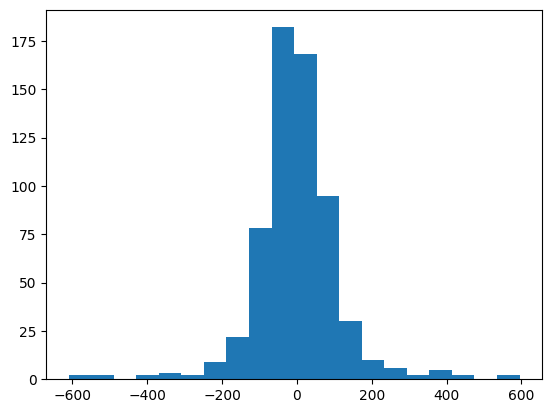

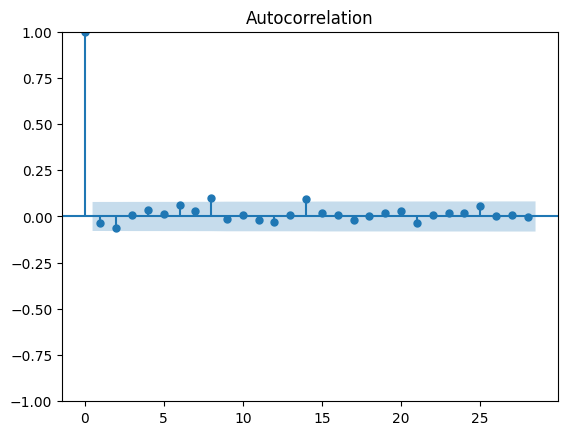

In [ ]:
# Plot the histogram of the residuals.
plt.hist(sarima_alchemist.resid[1:], bins=20)

# Plot the ACF of the residuals.
smgraphics.tsa.plot_acf(sarima_alchemist.resid[1:]);

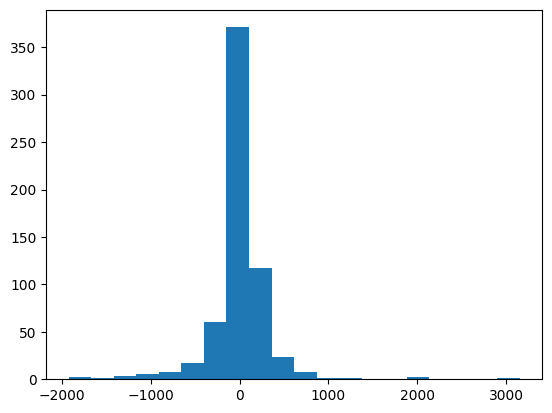

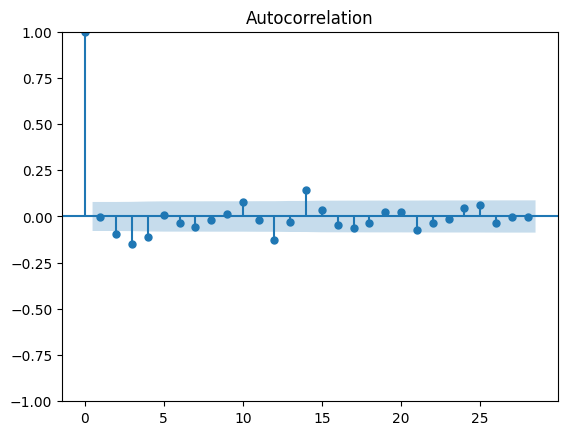

In [ ]:
# Plot the histogram of the residuals.
plt.hist(sarima_caterpillar.resid[1:], bins=20)

# Plot the ACF of the residuals.
smgraphics.tsa.plot_acf(sarima_caterpillar.resid[1:]);

In [ ]:
# Forecast for the next 32 periods (reuse from code block 1)
n_periods = 32  # Forecast horizon

# Reuse forecast and confidence intervals extraction from Code Block 1
sarima_forecast_result_alchemist = sarima_alchemist.get_forecast(steps=n_periods)  # Similar to forecast_SARIMA_alchemist
sarima_forecast_values_alchemist = sarima_forecast_result_alchemist.predicted_mean  # Similar to predicted_mean_SARIMA_alchemist
sarima_forecast_conf_int_alchemist = sarima_forecast_result_alchemist.conf_int()  # Similar to confidence_intervals_SARIMA_alchemist

# In-sample predictions (reuse from code block 1 for fitted values)
fitted_values_SARIMA_alchemist = sarima_alchemist.get_prediction(start=train_data_alchemist.index[0], end=train_data_alchemist.index[-1])
y_train_pred = fitted_values_SARIMA_alchemist.predicted_mean  # Similar to fitted_values_series_SARIMA_alchemist

# Obtain residuals (specific to block 2)
residuals_train = sarima_alchemist.resid

# Create DataFrame (combine predictions, residuals, and forecast similar to block 1)
result_sarima_df_alchemist = pd.DataFrame({
    'Volume': train_data_alchemist['Volume'],
    'Volume Scaled': train_data_alchemist['Volume_scaled'],
    'SARIMA train_Predict': y_train_pred,  # In-sample predictions
    'SARIMA Residuals': residuals_train,   # In-sample residuals
    'SARIMA Test_Forecast': sarima_forecast_values_alchemist,  # Forecast values
    'SARIMA Forecast CI Lower': sarima_forecast_conf_int_alchemist.iloc[:, 0],  # Lower CI
    'SARIMA Forecast CI Upper': sarima_forecast_conf_int_alchemist.iloc[:, 1]   # Upper CI
})

# Display the result
display(result_sarima_df_alchemist.head())

# Add SARIMA residuals to the DataFrame as a new column
train_data_alchemist['SARIMA Residuals'] = residuals_train
display(train_data_alchemist.head())

,Volume,Volume Scaled,SARIMA train_Predict,SARIMA Residuals,SARIMA Test_Forecast,SARIMA Forecast CI Lower,SARIMA Forecast CI Upper
2012-01-07,518.0,0.278495,543.460032,-25.460032,NaN,NaN,NaN
2012-01-14,533.0,0.286559,523.021494,9.978506,NaN,NaN,NaN
2012-01-21,475.0,0.255376,535.062975,-60.062975,NaN,NaN,NaN
2012-01-28,514.0,0.276344,488.502488,25.497512,NaN,NaN,NaN
2012-02-04,591.0,0.317742,519.810358,71.189642,NaN,NaN,NaN


,Volume,Volume_scaled,SARIMA Residuals
End Date,,,
2012-01-07,518,0.278495,-25.460032
2012-01-14,533,0.286559,9.978506
2012-01-21,475,0.255376,-60.062975
2012-01-28,514,0.276344,25.497512
2012-02-04,591,0.317742,71.189642


In [ ]:
# Forecast for the next 32 periods (reuse from code block 1)
n_periods = 32  # Forecast horizon

# Reuse forecast and confidence intervals extraction from Code Block 1
sarima_forecast_result_caterpillar = sarima_caterpillar.get_forecast(steps=n_periods)  # Similar to forecast_SARIMA_caterpillar
sarima_forecast_values_caterpillar = sarima_forecast_result_caterpillar.predicted_mean  # Similar to predicted_mean_SARIMA_caterpillar
sarima_forecast_conf_int_caterpillar = sarima_forecast_result_caterpillar.conf_int()  # Similar to confidence_intervals_SARIMA_caterpillar

# In-sample predictions (reuse from code block 1 for fitted values)
fitted_values_SARIMA_caterpillar = sarima_caterpillar.get_prediction(start=train_data_caterpillar.index[0], end=train_data_caterpillar.index[-1])
y_train_pred = fitted_values_SARIMA_caterpillar.predicted_mean  # Similar to fitted_values_series_SARIMA_caterpillar

# Obtain residuals (specific to block 2)
residuals_train = sarima_caterpillar.resid

# Create DataFrame (combine predictions, residuals, and forecast similar to block 1)
result_sarima_df_caterpillar = pd.DataFrame({
    'Original Data': train_data_caterpillar['Volume'],
    'Volume Scaled': train_data_caterpillar['Volume_scaled'],
    'SARIMA train_Predict': y_train_pred,  # In-sample predictions
    'SARIMA Residuals': residuals_train,   # In-sample residuals
    'SARIMA Test_Forecast': sarima_forecast_values_caterpillar,  # Forecast values
    'SARIMA Forecast CI Lower': sarima_forecast_conf_int_caterpillar.iloc[:, 0],  # Lower CI
    'SARIMA Forecast CI Upper': sarima_forecast_conf_int_caterpillar.iloc[:, 1]   # Upper CI
})

# Display the result
display(result_sarima_df_caterpillar.head())

# Add SARIMA residuals to the DataFrame as a new column
train_data_caterpillar['SARIMA Residuals'] = residuals_train
display(train_data_caterpillar.head())

,Original Data,Volume Scaled,SARIMA train_Predict,SARIMA Residuals,SARIMA Test_Forecast,SARIMA Forecast CI Lower,SARIMA Forecast CI Upper
2012-01-07,512.0,0.131114,0.684770,511.315230,NaN,NaN,NaN
2012-01-14,519.0,0.132907,508.791835,10.208165,NaN,NaN,NaN
2012-01-21,574.0,0.146991,519.300514,54.699486,NaN,NaN,NaN
2012-01-28,621.0,0.159027,571.360637,49.639363,NaN,NaN,NaN
2012-02-04,1140.0,0.291933,618.854023,521.145977,NaN,NaN,NaN


,Volume,Volume_scaled,SARIMA Residuals
End Date,,,
2012-01-07,512,0.131114,511.315230
2012-01-14,519,0.132907,10.208165
2012-01-21,574,0.146991,54.699486
2012-01-28,621,0.159027,49.639363
2012-02-04,1140,0.291933,521.145977


In [ ]:
# Assuming result_sarima_df_caterpillar and result_sarima_df_alchemist are your DataFrames
# Save the DataFrames as CSV files
result_sarima_df_caterpillar.to_csv('result_sarima_df_caterpillar.csv', index=False)
result_sarima_df_alchemist.to_csv('result_sarima_df_alchemist.csv', index=False)

# If you're using Google Colab or Jupyter Notebook, you can download the files like this:
from google.colab import files

# Download the files to your local machine
files.download('result_sarima_df_caterpillar.csv')
files.download('result_sarima_df_alchemist.csv')

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [ ]:
# Assuming result_sarima_df_caterpillar and result_sarima_df_alchemist are your DataFrames
# Save the DataFrames as CSV files
train_data_alchemist.to_csv('train_data_alchemist.csv', index=False)
test_data_alchemist.to_csv('test_data_alchemist.csv', index=False)

train_data_caterpillar.to_csv('train_data_caterpillar.csv', index=False)
test_data_caterpillar.to_csv('test_data_caterpillar.csv', index=False)

# If you're using Google Colab or Jupyter Notebook, you can download the files like this:
from google.colab import files

# Download the files to your local machine
files.download('train_data_alchemist.csv')
files.download('test_data_alchemist.csv')

files.download('train_data_caterpillar.csv')
files.download('test_data_caterpillar.csv')

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

stoppping here - cant continue as need to go back and do LSTM section - need to check havent broken places where I try and call train_data as ['Volume' and {'Volume scaled] coexist

In [ ]:
print(train_data_alchemist.shape)  # For the training DataFrame
print(test_data_alchemist.shape)    # For the test DataFrame

#print("Fitted Values:\n", sarima.fittedvalues.head()) #cant remember what this was supposed to be
#print("Residuals:\n", residuals_train.head()) #cant remember what this was supposed to be need to check older versions from the 4th Oct

(623, 4)
(32, 2)


In [ ]:
train_data_alchemist['SARIMA Residuals'].head()

,SARIMA Residuals
End Date,
2012-01-07,-25.460032
2012-01-14,9.978506
2012-01-21,-60.062975
2012-01-28,25.497512
2012-02-04,71.189642


In [ ]:
train_data_alchemist

,Volume,Volume_scaled,SARIMA Residuals
End Date,,,
2012-01-07,518,0.278495,-25.460032
2012-01-14,533,0.286559,9.978506
2012-01-21,475,0.255376,-60.062975
2012-01-28,514,0.276344,25.497512
2012-02-04,591,0.317742,71.189642
...,...,...,...
2023-11-11,599,0.322043,-63.578838
2023-11-18,572,0.307527,-8.989193
2023-11-25,637,0.342473,17.441241


Apply a hybrid model of SARIMA and LSTM in sequential combination wherein the residuals from SARIMA will be forecasted using LSTM. The final prediction will be the sum of the predictions from SARIMA and LSTM. The LSTM will be trained on the residuals obtained during the training of the SARIMA model. **The forecast horizon will be the final 32 weeks**. Use KerasTuner to get the best model. Plot the results. Display the MAE and MAPE, and comment on the results.

In [ ]:
"""
# Save train_data_alchemist and test_data_alchemist as CSV files
train_data_alchemist.to_csv('train_data_alchemist.csv', index=True)
test_data_alchemist.to_csv('test_data_alchemist.csv', index=True)

# Download the CSV files
files.download('train_data_alchemist.csv')
files.download('test_data_alchemist.csv')
"""

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [ ]:
"""
# Upload the CSV files back to Colab
uploaded = files.upload()

# Load the CSV files into DataFrames
train_data_alchemist = pd.read_csv('train_data_alchemist.csv', index_col='End Date', parse_dates=True)
test_data_alchemist = pd.read_csv('test_data_alchemist.csv', index_col='End Date', parse_dates=True)

# Convert to Series if they contain only one column
#train_data_alchemist = train_data_alchemist.squeeze()
#test_data_alchemist = test_data_alchemist.squeeze()
"""

Saving test_data_alchemist.csv to test_data_alchemist (2).csv
Saving train_data_alchemist.csv to train_data_alchemist (2).csv


In [ ]:
result_sarima_df_alchemist

,Volume,Volume Scaled,SARIMA train_Predict,SARIMA Residuals,SARIMA Test_Forecast,SARIMA Forecast CI Lower,SARIMA Forecast CI Upper,SARIMA Residuals_scaled,SARIMA Test_Forecast_Scaled
2012-01-07,518.0,0.278495,543.460032,-25.460032,NaN,NaN,NaN,0.484977,NaN
2012-01-14,533.0,0.286559,523.021494,9.978506,NaN,NaN,NaN,0.514387,NaN
2012-01-21,475.0,0.255376,535.062975,-60.062975,NaN,NaN,NaN,0.456260,NaN
2012-01-28,514.0,0.276344,488.502488,25.497512,NaN,NaN,NaN,0.527266,NaN
2012-02-04,591.0,0.317742,519.810358,71.189642,NaN,NaN,NaN,0.565186,NaN
...,...,...,...,...,...,...,...,...,...
2024-06-22,NaN,NaN,NaN,NaN,605.247911,237.504065,972.991758,NaN,0.105978
2024-06-29,NaN,NaN,NaN,NaN,615.506217,247.762074,983.250361,NaN,0.118717
2024-07-06,NaN,NaN,NaN,NaN,624.557035,256.812700,992.301369,NaN,0.129957
2024-07-13,NaN,NaN,NaN,NaN,674.005230,306.260772,1041.749687,NaN,0.191364


In [ ]:
# Initialize the scaler
scaler_alchemist = MinMaxScaler(feature_range=(0, 1))

# Fit the scaler on the SARIMA residuals from the training data
result_sarima_df_alchemist['SARIMA Residuals_scaled'] = scaler_alchemist.fit_transform(result_sarima_df_alchemist[['SARIMA Residuals']].values)

# Transform (not fit) the SARIMA test forecast using the same scaler (use .values to avoid feature name mismatch)
result_sarima_df_alchemist['SARIMA Test_Forecast_Scaled'] = scaler_alchemist.transform(result_sarima_df_alchemist[['SARIMA Test_Forecast']].values)

# Ensure the index remains as the DatetimeIndex from the original Series
result_sarima_df_alchemist = result_sarima_df_alchemist.set_index(result_sarima_df_alchemist.index)

# Display the results for verification
display(result_sarima_df_alchemist[-40:])
display(test_data_alchemist.head())

,Volume,Volume Scaled,SARIMA train_Predict,SARIMA Residuals,SARIMA Test_Forecast,SARIMA Forecast CI Lower,SARIMA Forecast CI Upper,SARIMA Residuals_scaled,SARIMA Test_Forecast_Scaled
2023-10-21,585.0,0.314516,574.713708,10.286292,NaN,NaN,NaN,0.514642,NaN
2023-10-28,602.0,0.323656,597.924864,4.075136,NaN,NaN,NaN,0.509488,NaN
2023-11-04,621.0,0.333871,602.358457,18.641543,NaN,NaN,NaN,0.521576,NaN
2023-11-11,599.0,0.322043,662.578838,-63.578838,NaN,NaN,NaN,0.453342,NaN
2023-11-18,572.0,0.307527,580.989193,-8.989193,NaN,NaN,NaN,0.498646,NaN
2023-11-25,637.0,0.342473,619.558759,17.441241,NaN,NaN,NaN,0.520580,NaN
2023-12-02,716.0,0.384946,796.681683,-80.681683,NaN,NaN,NaN,0.439148,NaN
2023-12-09,979.0,0.526344,925.508589,53.491411,NaN,NaN,NaN,0.550498,NaN
2023-12-16,NaN,NaN,NaN,NaN,1155.762378,936.478676,1375.046080,NaN,1.465269
2023-12-23,NaN,NaN,NaN,NaN,1325.160106,1043.960562,1606.359651,NaN,1.605852


,Volume,Volume_scaled
End Date,,
2023-12-16,1260,0.677419
2023-12-23,2201,1.183333
2023-12-30,1050,0.564516
2024-01-06,806,0.433333
2024-01-13,748,0.402151


In [ ]:
# Initialize the scaler
scaler_caterpillar = MinMaxScaler(feature_range=(0, 1))

# Fit the scaler on the SARIMA residuals from the training data
result_sarima_df_caterpillar['SARIMA Residuals_scaled'] = scaler_caterpillar.fit_transform(result_sarima_df_caterpillar[['SARIMA Residuals']].values)

# Transform (not fit) the SARIMA test forecast using the same scaler (use .values to avoid feature name mismatch)
result_sarima_df_caterpillar['SARIMA Test_Forecast_Scaled'] = scaler_caterpillar.transform(result_sarima_df_caterpillar[['SARIMA Test_Forecast']].values)

# Ensure the index remains as the DatetimeIndex from the original Series
result_sarima_df_caterpillar = result_sarima_df_caterpillar.set_index(result_sarima_df_caterpillar.index)

# Display the results for verification
display(result_sarima_df_caterpillar[-40:])
display(test_data_caterpillar.head())

,Original Data,Volume Scaled,SARIMA train_Predict,SARIMA Residuals,SARIMA Test_Forecast,SARIMA Forecast CI Lower,SARIMA Forecast CI Upper,SARIMA Residuals_scaled,SARIMA Test_Forecast_Scaled
2023-10-21,1859.0,0.476056,1909.882863,-50.882863,NaN,NaN,NaN,0.369117,NaN
2023-10-28,2051.0,0.525224,1937.387678,113.612322,NaN,NaN,NaN,0.401531,NaN
2023-11-04,2164.0,0.554161,2076.673245,87.326755,NaN,NaN,NaN,0.396352,NaN
2023-11-11,2185.0,0.559539,2059.200261,125.799739,NaN,NaN,NaN,0.403933,NaN
2023-11-18,2413.0,0.617926,2370.216110,42.783890,NaN,NaN,NaN,0.387574,NaN
2023-11-25,2976.0,0.762100,2542.288850,433.711150,NaN,NaN,NaN,0.464609,NaN
2023-12-02,2896.0,0.741613,3061.249635,-165.249635,NaN,NaN,NaN,0.346580,NaN
2023-12-09,2804.0,0.718054,3086.327909,-282.327909,NaN,NaN,NaN,0.323509,NaN
2023-12-16,NaN,NaN,NaN,NaN,2941.010524,2278.582303,3603.438746,NaN,0.958686
2023-12-23,NaN,NaN,NaN,NaN,2914.706662,2006.154974,3823.258351,NaN,0.953503


,Volume,Volume_scaled
End Date,,
2023-12-16,2794,0.715493
2023-12-23,3527,0.903201
2023-12-30,1151,0.294750
2024-01-06,1273,0.325992
2024-01-13,1421,0.363892


In [ ]:
""" defined elsewhere

lookback = 12
forecast = 32

"""

In [ ]:
uploaded = files.upload()

Saving model_results_df_seq_SARIMA.pkl to model_results_df_seq_SARIMA (1).pkl
Saving model_results_list_seq_SARIMA.pkl to model_results_list_seq_SARIMA (1).pkl


In [ ]:
# Load the model results list and DataFrame from the pickle files
with open('model_results_list_seq_SARIMA.pkl', 'rb') as file:
    model_results_list_seq_SARIMA = pickle.load(file)

with open('model_results_df_seq_SARIMA.pkl', 'rb') as file:
    model_results_df_seq_SARIMA = pickle.load(file)

In [ ]:
model_results_list = model_results_list_seq_SARIMA
model_results_list

[{'Model Number': 1,
  'Book': 'The Alchemist',
  'Dataset': 'After 2012-01-01 weekly',
  'Model Name': 'SARIMAX(1, 0, 0)x(1, 0, 0, 52)',
  'Model Config': {'Log Likelihood': -3858.15,
   'AIC': 7724.299,
   'BIC': 7742.037,
   'Sample': '01-07-2012 - 12-09-2023',
   'Intercept': 92.7516,
   'AR.L1': 0.6713,
   'AR.S.L52': 0.5023,
   'Sigma2': 11490.0,
   'Ljung-Box (L1)': 0.0,
   'Jarque-Bera (JB)': 0.0,
   'Heteroskedasticity (H)': 2.75,
   'Skewness': 0.35,
   'Kurtosis': 8.33,
   'Time Taken': '6.4 minutes'},
  'MAE': 147.29333566351175,
  'MAPE': 0.2607659218779671},
 {'Model Number': 2,
  'Book': 'The Very Hungry Caterpillar',
  'Dataset': 'After 2012-01-01 weekly',
  'Model Name': 'SARIMAX(1, 0, 0)x(2, 0, [1], 52)',
  'Model Config': {'Log Likelihood': -4498.761,
   'AIC': 9009.522,
   'BIC': 9036.129,
   'Sample': '01-07-2012 - 12-09-2023',
   'Intercept': 189.9622,
   'AR.L1': 0.827,
   'AR.S.L52': -0.0733,
   'AR.S.L104': 0.299,
   'MA.S.L52': 0.4073,
   'Sigma2': 107200.0,
 

In [ ]:
model_results_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8 entries, 0 to 7
Data columns (total 52 columns):
 #   Column                                            Non-Null Count  Dtype  
---  ------                                            --------------  -----  
 0   Model Number                                      8 non-null      int64  
 1   Book                                              8 non-null      object 
 2   Dataset                                           8 non-null      object 
 3   Model Name                                        8 non-null      object 
 4   MAE                                               8 non-null      float64
 5   MAPE                                              8 non-null      float64
 6   Model Config.Log Likelihood                       4 non-null      float64
 7   Model Config.AIC                                  4 non-null      float64
 8   Model Config.BIC                                  4 non-null      float64
 9   Model Config.Sample      

In [ ]:
# Flatten the Model Config dictionary into the main DataFrame
model_results_df = pd.json_normalize(model_results_list)
model_results_df

,Model Number,Book,Dataset,Model Name,MAE,MAPE,Model Config.Log Likelihood,Model Config.AIC,Model Config.BIC,Model Config.Sample,...,Model Config.Hyperparameters.lstm_0_units,Model Config.Hyperparameters.layer_2_neurons,Model Config.Hyperparameters.Dropout_rate,Model Config.Hyperparameters.lstm_1_units,Model Config.Total Parameters,Model Config.Trainable Parameters,Model Config.Non-trainable Parameters,MSE,Model Config.Hyperparameters.lstm_2_units,Model Config.Drift
0,1,The Alchemist,After 2012-01-01 weekly,"SARIMAX(1, 0, 0)x(1, 0, 0, 52)",147.293336,0.260766,-3858.150,7724.299,7742.037,01-07-2012 - 12-09-2023,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,2,The Very Hungry Caterpillar,After 2012-01-01 weekly,"SARIMAX(1, 0, 0)x(2, 0, [1], 52)",1141.736549,2.198628,-4498.761,9009.522,9036.129,01-07-2012 - 12-09-2023,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,3,The Alchemist,After 2012-01-01 weekly,XGBoost with Grid Search ExpandingWindowSplitter,155.089634,0.283836,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,4,The Very Hungry Caterpillar,After 2012-01-01 weekly,XGBoost with Grid Search ExpandingWindowSplitter,359.219345,0.179236,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,5,The Alchemist,After 2012-01-01 weekly,LSTM Model (on its own),143.130285,0.201343,NaN,NaN,NaN,NaN,...,68.0,92.0,0.3,20.0,157888.0,157888.0,0.0,NaN,NaN,NaN
5,6,The Very Hungry Caterpillar,After 2012-01-01 weekly,LSTM Model (on its own),803.269358,0.340561,NaN,NaN,NaN,NaN,...,92.0,124.0,0.0,36.0,219840.0,219840.0,0.0,0.019515,84.0,NaN
6,7,The Alchemist,After 2012-01-01 weekly,"SARIMAX(1, 0, 0)x(1, 0, 0, 52)",141.605393,0.252228,-3835.230,7678.459,7696.197,01-07-2012 - 12-09-2023,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
7,8,The Very Hungry Caterpillar,After 2012-01-01 weekly,"SARIMAX(1, 1, 0)x(2, 0, [1], 52)",351.758461,0.192067,-4511.246,9036.492,9067.523,01-07-2012 - 12-09-2023,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0029


In [ ]:
result_sarima_df_caterpillar

,Original Data,Volume Scaled,SARIMA train_Predict,SARIMA Residuals,SARIMA Test_Forecast,SARIMA Forecast CI Lower,SARIMA Forecast CI Upper,SARIMA Residuals_scaled,SARIMA Test_Forecast_Scaled
2012-01-07,512.0,0.131114,0.684770,511.315230,NaN,NaN,NaN,0.479901,NaN
2012-01-14,519.0,0.132907,508.791835,10.208165,NaN,NaN,NaN,0.381155,NaN
2012-01-21,574.0,0.146991,519.300514,54.699486,NaN,NaN,NaN,0.389922,NaN
2012-01-28,621.0,0.159027,571.360637,49.639363,NaN,NaN,NaN,0.388925,NaN
2012-02-04,1140.0,0.291933,618.854023,521.145977,NaN,NaN,NaN,0.481838,NaN
...,...,...,...,...,...,...,...,...,...
2024-06-22,NaN,NaN,NaN,NaN,2051.839305,-1257.944200,5361.622811,NaN,0.256822
2024-06-29,NaN,NaN,NaN,NaN,2194.751013,-1173.370865,5562.872891,NaN,0.376269
2024-07-06,NaN,NaN,NaN,NaN,2203.952378,-1221.514469,5629.419225,NaN,0.383960
2024-07-13,NaN,NaN,NaN,NaN,2394.103142,-1087.764353,5875.970638,NaN,0.542890


In [ ]:
combined_sequences

{'input_sequences': [array([0.48497651, 0.51438684, 0.45625964, 0.52726601, 0.56518576,
         0.38940285, 0.49680396, 0.4360349 , 0.70324726, 0.61781426,
         0.53008378, 0.45044825]),
  array([0.51438684, 0.45625964, 0.52726601, 0.56518576, 0.38940285,
         0.49680396, 0.4360349 , 0.70324726, 0.61781426, 0.53008378,
         0.45044825, 0.64522415]),
  array([0.45625964, 0.52726601, 0.56518576, 0.38940285, 0.49680396,
         0.4360349 , 0.70324726, 0.61781426, 0.53008378, 0.45044825,
         0.64522415, 0.62380513]),
  array([0.52726601, 0.56518576, 0.38940285, 0.49680396, 0.4360349 ,
         0.70324726, 0.61781426, 0.53008378, 0.45044825, 0.64522415,
         0.62380513, 0.42989392]),
  array([0.56518576, 0.38940285, 0.49680396, 0.4360349 , 0.70324726,
         0.61781426, 0.53008378, 0.45044825, 0.64522415, 0.62380513,
         0.42989392, 0.61798189]),
  array([0.38940285, 0.49680396, 0.4360349 , 0.70324726, 0.61781426,
         0.53008378, 0.45044825, 0.64522415, 0.

In [ ]:
# Define your lookback and forecast values
lookback = 12  # Use the last 12 observations
forecast = 32  # Predict the next 32 observations

# Define the cut-off point (655-32)
cutoff = len(result_sarima_df_alchemist) - forecast

# Create combined_data where the first 655-32 rows come from 'SARIMA Residuals_scaled'
# and the last 32 rows come from 'SARIMA Test_Forecast_Scaled'
combined_data = pd.concat([
    result_sarima_df_alchemist['SARIMA Residuals_scaled'][:cutoff],  # First part
    result_sarima_df_alchemist['SARIMA Test_Forecast_Scaled'][cutoff:]  # Last part
]) #this is overcomplicated but it will work

# Create input-output sequences for the combined data
combined_sequences = create_input_sequences(lookback, forecast, combined_data.values)

# Separate the input and output sequences
X_combined = np.array(combined_sequences["input_sequences"])
Y_combined = np.array(combined_sequences["output_sequences"])

# Reshape the input sequences for LSTM [samples, time steps, features]
X_combined = X_combined.reshape(X_combined.shape[0], X_combined.shape[1], 1)

# Split back into train and test sets based on the dates
train_length = len(train_data_alchemist) - lookback  # Consider the lookback length to avoid overlap

# Split the sequences
X_train, X_test = X_combined[:train_length], X_combined[train_length:]
Y_train, Y_test = Y_combined[:train_length], Y_combined[train_length:]

In [ ]:
# Verify shapes
print("X_train shape:", X_train.shape)
print("Y_train shape:", Y_train.shape)
print("X_test shape:", X_test.shape)
print("Y_test shape:", Y_test.shape)

# Optional: Check that the time continuity is preserved by printing the relevant dates
train_start_date = train_data_alchemist.index[0]
train_end_date = train_data_alchemist.index[-1]
test_start_date = test_data_alchemist.index[0]
print(f"Train start date: {train_start_date}, Train end date: {train_end_date}, Test start date: {test_start_date}")

X_train shape: (611, 12, 1)
Y_train shape: (611, 32)
X_test shape: (1, 12, 1)
Y_test shape: (1, 32)
Train start date: 2012-01-07 00:00:00, Train end date: 2023-12-09 00:00:00, Test start date: 2023-12-16 00:00:00


In [ ]:
Y_best_test = Y_test.copy()

In [ ]:
""" defined earlier

# Modify the LSTM model for multi-step forecasting
def tuned_model(hp):
    model = Sequential()

    # Input layer with a lookback of 12
    model.add(Input(shape=(lookback, 1)))  # Input shape matches lookback (12 steps)

    model.add(LSTM(hp.Int('input_unit', min_value=4, max_value=128, step=8), return_sequences=True))

    for i in range(hp.Int('n_layers', 1, 4)):
        model.add(LSTM(hp.Int(f'lstm_{i}_units', min_value=4, max_value=128, step=8), return_sequences=True))

    model.add(LSTM(hp.Int('layer_2_neurons', min_value=4, max_value=128, step=8)))
    model.add(Dropout(hp.Float('Dropout_rate', min_value=0, max_value=0.5, step=0.1)))

    # Output 32 values (for 32-step forecast)
    model.add(Dense(forecast))  # Output layer for 32-step forecast

    model.compile(loss='mean_squared_error', optimizer='adam', metrics=['mse'])

    return model
"""

In [ ]:
tuner = None

In [ ]:
shutil.rmtree('./LSTM_SARIMA_residuals_alchemist')  # This will remove the existing tuner directory

got up to here before sleeping on sat night, next step is training lstm on residuals, then saving the data, tidying up, making sure running for caterpillar too, then do hybrid approach then monthly approach save everything

will need to load csv for data, load results df and list, make sure to run the function "log_model_results" as keep forgetting it, also dont change that function, instead just reassing that specific row/modify

In [ ]:
tuner = RandomSearch(
        tuned_model,
        objective='mse',
        max_trials=3,
        executions_per_trial=1,
        project_name='LSTM_SARIMA_residuals_alchemist'
    )

Duration: 6mins

In [ ]:
tuner.search(
        x=X_train,
        y=Y_train,
        epochs=100,
        batch_size=32#,
        #validation_data=(),
)

Trial 3 Complete [00h 02m 13s]
mse: 0.018149448558688164

Best mse So Far: 0.017861735075712204
Total elapsed time: 00h 06m 31s


In [ ]:
hp = tuner.get_best_hyperparameters()[0]
hp.values

{'lookback': 21,
 'input_unit': 108,
 'n_layers': 1,
 'lstm_0_units': 100,
 'layer_2_neurons': 116,
 'Dropout_rate': 0.1,
 'lstm_1_units': 4}

In [ ]:
# Retrieve the best model from the tuner
best_model = tuner.get_best_models(num_models=1)[0]
print(best_model.summary())

# Make predictions
train_best_predict = best_model.predict(X_train)  # Predictions on training data (residuals)
test_best_predict = best_model.predict(X_test)    # Predictions on test data (residuals)

# Check the shapes of the predictions
print("Train predictions shape:", train_best_predict.shape)  # Should be (611, 32)
print("Test predictions shape:", test_best_predict.shape)    # Should be (1, 32)

/usr/local/lib/python3.10/dist-packages/keras/src/saving/saving_lib.py:576: UserWarning:

Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 24 variables. 



Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ lstm (LSTM)                          │ (None, 21, 108)             │          47,520 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ lstm_1 (LSTM)                        │ (None, 21, 100)             │          83,600 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ lstm_2 (LSTM)                        │ (None, 116)                 │         100,688 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout (Dropout)                    │ (None, 116)                 │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense (Dense)                        │ (None, 32)                  │           3,744 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 235,552 (920.12 KB)

 Trainable params: 235,552 (920.12 KB)

 Non-trainable params: 0 (0.00 B)

None
20/20 ━━━━━━━━━━━━━━━━━━━━ 1s 36ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
Train predictions shape: (611, 32)
Test predictions shape: (1, 32)


In [ ]:
train_best_predict

array([[0.506407  , 0.50536287, 0.5011523 , ..., 0.49082476, 0.49544954,
        0.48599026],
       [0.50659597, 0.5055383 , 0.5013154 , ..., 0.4909447 , 0.49562228,
        0.48614696],
       [0.50628054, 0.5052375 , 0.50104326, ..., 0.49073347, 0.4953375 ,
        0.48590004],
       ...,
       [0.5072566 , 0.50615036, 0.50188625, ..., 0.49134582, 0.49623328,
        0.48669642],
       [0.5048752 , 0.5039052 , 0.4998221 , ..., 0.48977226, 0.49406713,
        0.48477265],
       [0.50821227, 0.5070384 , 0.5026971 , ..., 0.49189633, 0.4971104 ,
        0.48746702]], dtype=float32)

In [ ]:
# Inverse transform the predictions
train_best_predict = scaler_alchemist.inverse_transform(train_best_predict)
test_best_predict = scaler_alchemist.inverse_transform(test_best_predict)
# If your Y_test was generated with forecast=32, it will contain 32 values for each input
#Y_best_test = scaler.inverse_transform([Y_best_test]).flatten()
Y_best_test = scaler_alchemist.inverse_transform(Y_test.reshape(-1, 1)).flatten()  # Reshape to 2D for inverse scaling

In [ ]:
# Flattening the predicted values
train_best_predict_flat = train_best_predict.flatten()
test_best_predict_flat = test_best_predict.flatten()  # Shape: (32,)
print(train_best_predict_flat.shape)
# For fitting, slice the first 623 values from the flattened predictions
#train_best_predict_flat = train_best_predict.flatten()[:len(train_data_alchemist)]
#print(train_best_predict_flat.shape)
# Convert to a Pandas Series for indexing
#fitted_values_series = pd.Series(train_best_predict_flat, index=train_data_alchemist.index[:len(train_best_predict_flat)])
#fitted_values_series

(19552,)


In [ ]:
len(test_data_alchemist["Volume"])

32

In [ ]:
# Forecast with ARIMA for the test period (32 steps).
#sarima_forecast = sarima.predict(n_periods=32)

In [ ]:
# Forecast for the next 32 periods after the last date in the training set
#last_index = train_data_alchemist.index[-1]  # Get the last index of the training data

# Ensure the forecast starts right after the last training date
#sarima_alchemist_forecast = sarima_alchemist.predict(start=last_index + pd.Timedelta(weeks=1),
                                   #end=last_index + pd.Timedelta(weeks=32))

In [ ]:
#display(sarima_forecast.head())
#print(sarima_forecast.shape)

,predicted_mean
2023-12-16,1155.762378
2023-12-23,1325.160106
2023-12-30,696.247989
2024-01-06,684.299891
2024-01-13,702.724282


(32,)


In [ ]:
test_best_predict

array([[-13.168717  , -13.078078  , -23.953293  , -20.343533  ,
        -18.759718  , -15.267996  , -17.558535  ,  -9.933183  ,
        -13.475217  ,  -1.5588013 , -10.072625  ,  -9.268508  ,
          1.0665714 ,  -5.5991344 , -18.077627  ,  -6.0526166 ,
         -7.6491427 ,   0.2824214 ,  -0.07999119,  -1.4285884 ,
          6.1818614 ,   2.8532095 ,   4.726393  ,   3.5564165 ,
          9.2642355 ,   7.470128  ,   5.2598853 ,  13.919219  ,
          4.1202173 ,  11.730595  ,  14.8819895 ,   9.488031  ]],
      dtype=float32)

In [ ]:
# Reshape test_best_predict to 1D array
#test_best_predict_flat = test_best_predict.flatten()  # Shape will now be (32,) - done above

# Combine the SARIMA predictions and the LSTM predicted residuals for the final forecast
final_forecast = predicted_mean_SARIMA_alchemist.values + test_best_predict_flat

# Calculate the mean squared error on the test set.
mse = mean_squared_error(result_sarima_df_alchemist['SARIMA Test_Forecast'][-32:], final_forecast)
print(f"Mean Squared Error on Test Data: {mse}")

#ignore below output for mse as it was using the wrong data, not going to re run this as not actually using mse as a metric to compare models, instead focusing on mae and mape

Mean Squared Error on Test Data: 45544.30238288028


We can now compute the mean squared error between the test set and the final forecast values

In [ ]:
print(pd.DataFrame({'Original Data': test_data_alchemist["Volume"],'Hybrid SARIMA + LSTM': final_forecast, 'SARIMA': predicted_mean_SARIMA_alchemist, 'LSTM': test_best_predict_flat})) #'LSTM':xgb_residuals_pred, #ARIMA???

            Original Data  Hybrid SARIMA + LSTM       SARIMA       LSTM
2023-12-16           1260           1142.593660  1155.762378 -13.168717
2023-12-23           2201           1312.082028  1325.160106 -13.078078
2023-12-30           1050            672.294696   696.247989 -23.953293
2024-01-06            806            663.956358   684.299891 -20.343533
2024-01-13            748            683.964565   702.724282 -18.759718
2024-01-20            695            598.248964   613.516960 -15.267996
2024-01-27            724            600.569533   618.128068 -17.558535
2024-02-03            664            617.433794   627.366976  -9.933183
2024-02-10            682            548.808745   562.283962 -13.475217
2024-02-17            618            564.253858   565.812660  -1.558801
2024-02-24            509            545.299192   555.371818 -10.072625
2024-03-02            569            599.495354   608.763862  -9.268508
2024-03-09            440            549.799815   548.733243   1

In [ ]:
final_forecast

array([2085.16960416, 2253.61451316, 1621.18500052, 1608.12148482,
       1632.0647366 , 1544.67302705, 1546.29469359, 1555.97452017,
       1486.43362024, 1483.79428797, 1480.04466921, 1531.52643563,
       1469.95425162, 1520.34606753, 1543.51121634, 1547.99064863,
       1468.16041299, 1441.35402812, 1441.3342877 , 1466.31028211,
       1475.5208339 , 1442.80985809, 1459.24579289, 1476.7327915 ,
       1538.01398448, 1510.53001763, 1464.00938844, 1516.31572125,
       1526.69670821, 1540.77200068, 1594.44382828, 1538.41796405])

think the slice length here is incorrect, may need to re run it

In [ ]:
# Call the function with the final forecast and without fitted values
slice_length = 655 - 32

fig, mae, mape = plot_prediction(
    series_train=train_data_alchemist['Volume'][:slice_length],  #result_sarima_df_alchemist['Original Data'] works too, they are the same #looking back on this, it looked like I had sliced incorrectly but on further inspection it was sliced correctly thankfully
    series_test=result_sarima_df_alchemist['SARIMA Test_Forecast'][-32:],
    forecast=final_forecast,  # Ensure final_forecast_series is defined
    forecast_int=None,  # Set to None since we're ignoring confidence intervals
    title='Hybrid Sequential - Alchemist forecast - SARIMA(1, 0, 0)x(1, 0, 0, 52) then LSTM trained on residuals'
)

# Print the metrics
print("MAE:", mae)
print("MAPE:", mape)

fig.show()

MAE: 9.378952440805733
MAPE: 0.014480204012729434


In [ ]:
"""on next run do this as the code is more consistent
fig, mae, mape = plot_prediction(
    series_train=result_sarima_df_alchemist['Volume'][:slice_length],  # Explicitly using result_sarima_df_alchemist for consistency
    series_test=result_sarima_df_alchemist['SARIMA Test_Forecast'][-32:],  # Use SARIMA Test forecast
    forecast=final_forecast,  # Final combined forecast
    forecast_int=None,  # Set to None since we're ignoring confidence intervals
    title='Hybrid Sequential - Alchemist forecast - SARIMA(1, 0, 0)x(1, 0, 0, 52) then LSTM trained on residuals'
)
"""

At some point need to come back and instead of plotting train and test separately just plot as one and call it actual data

In [ ]:
model_results_df

,Model Number,Book,Dataset,Model Name,MAE,MAPE,Model Config.Log Likelihood,Model Config.AIC,Model Config.BIC,Model Config.Sample,...,Model Config.Hyperparameters.lstm_0_units,Model Config.Hyperparameters.layer_2_neurons,Model Config.Hyperparameters.Dropout_rate,Model Config.Hyperparameters.lstm_1_units,Model Config.Total Parameters,Model Config.Trainable Parameters,Model Config.Non-trainable Parameters,MSE,Model Config.Hyperparameters.lstm_2_units,Model Config.Drift
0,1,The Alchemist,After 2012-01-01 weekly,"SARIMAX(1, 0, 0)x(1, 0, 0, 52)",147.293336,0.260766,-3858.150,7724.299,7742.037,01-07-2012 - 12-09-2023,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,2,The Very Hungry Caterpillar,After 2012-01-01 weekly,"SARIMAX(1, 0, 0)x(2, 0, [1], 52)",1141.736549,2.198628,-4498.761,9009.522,9036.129,01-07-2012 - 12-09-2023,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,3,The Alchemist,After 2012-01-01 weekly,XGBoost with Grid Search ExpandingWindowSplitter,155.089634,0.283836,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,4,The Very Hungry Caterpillar,After 2012-01-01 weekly,XGBoost with Grid Search ExpandingWindowSplitter,359.219345,0.179236,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,5,The Alchemist,After 2012-01-01 weekly,LSTM Model (on its own),143.130285,0.201343,NaN,NaN,NaN,NaN,...,68.0,92.0,0.3,20.0,157888.0,157888.0,0.0,NaN,NaN,NaN
5,6,The Very Hungry Caterpillar,After 2012-01-01 weekly,LSTM Model (on its own),803.269358,0.340561,NaN,NaN,NaN,NaN,...,92.0,124.0,0.0,36.0,219840.0,219840.0,0.0,0.019515,84.0,NaN
6,7,The Alchemist,After 2012-01-01 weekly,"SARIMAX(1, 0, 0)x(1, 0, 0, 52)",141.605393,0.252228,-3835.230,7678.459,7696.197,01-07-2012 - 12-09-2023,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
7,8,The Very Hungry Caterpillar,After 2012-01-01 weekly,"SARIMAX(1, 1, 0)x(2, 0, [1], 52)",351.758461,0.192067,-4511.246,9036.492,9067.523,01-07-2012 - 12-09-2023,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0029


In [ ]:
lstm_hybrid_hyperparameters = {
    'lookback': 21,
    'input_unit': 108,
    'n_layers': 1,
    'lstm_0_units': 100,
    'layer_2_neurons': 116,
    'Dropout_rate': 0.1,
    'lstm_1_units': 4,
    'trials': 3  # Added this based on your input
}

# The index in model_results_list for Model Number 7 (row 6 in zero-indexed DataFrame)
model_number = 7

# Locate the model in model_results_list with the correct model number
for model in model_results_list:
    if model['Model Number'] == model_number:
        # Update the model name to reflect the hybrid approach
        model['Model Name'] = 'SARIMA(1, 0, 0)x(1, 0, 0, 52) + LSTM on Residuals'

        # Add the LSTM portion parameters under the Model Config
        model['Model Config']['LSTM'] = {
            'Hyperparameters': lstm_hybrid_hyperparameters,
            'Total Parameters': 235552,  # Sum of SARIMA + LSTM parameters
            'Trainable Parameters': 235552,
            'Non-trainable Parameters': 0,
            'Duration': '6 mins (LSTM)'  # This is the duration for the LSTM portion
        }

# Optional: Save back to the DataFrame if you're working with one
model_results_df = pd.json_normalize(model_results_list)
display(model_results_df)

,Model Number,Book,Dataset,Model Name,MAE,MAPE,Model Config.Log Likelihood,Model Config.AIC,Model Config.BIC,Model Config.Sample,...,Model Config.LSTM.Hyperparameters.lstm_0_units,Model Config.LSTM.Hyperparameters.layer_2_neurons,Model Config.LSTM.Hyperparameters.Dropout_rate,Model Config.LSTM.Hyperparameters.lstm_1_units,Model Config.LSTM.Hyperparameters.trials,Model Config.LSTM.Total Parameters,Model Config.LSTM.Trainable Parameters,Model Config.LSTM.Non-trainable Parameters,Model Config.LSTM.Duration,Model Config.Drift
0,1,The Alchemist,After 2012-01-01 weekly,"SARIMAX(1, 0, 0)x(1, 0, 0, 52)",147.293336,0.260766,-3858.150,7724.299,7742.037,01-07-2012 - 12-09-2023,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,2,The Very Hungry Caterpillar,After 2012-01-01 weekly,"SARIMAX(1, 0, 0)x(2, 0, [1], 52)",1141.736549,2.198628,-4498.761,9009.522,9036.129,01-07-2012 - 12-09-2023,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,3,The Alchemist,After 2012-01-01 weekly,XGBoost with Grid Search ExpandingWindowSplitter,155.089634,0.283836,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,4,The Very Hungry Caterpillar,After 2012-01-01 weekly,XGBoost with Grid Search ExpandingWindowSplitter,359.219345,0.179236,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,5,The Alchemist,After 2012-01-01 weekly,LSTM Model (on its own),143.130285,0.201343,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
5,6,The Very Hungry Caterpillar,After 2012-01-01 weekly,LSTM Model (on its own),803.269358,0.340561,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
6,7,The Alchemist,After 2012-01-01 weekly,"SARIMA(1, 0, 0)x(1, 0, 0, 52) + LSTM on Residuals",141.605393,0.252228,-3835.230,7678.459,7696.197,01-07-2012 - 12-09-2023,...,100.0,116.0,0.1,4.0,3.0,235552.0,235552.0,0.0,6 mins (LSTM),NaN
7,8,The Very Hungry Caterpillar,After 2012-01-01 weekly,"SARIMAX(1, 1, 0)x(2, 0, [1], 52)",351.758461,0.192067,-4511.246,9036.492,9067.523,01-07-2012 - 12-09-2023,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0029


forgot to update mae and mape

In [ ]:
# The index in model_results_list for Model Number 8 (row 7 in zero-indexed DataFrame)
model_number = 7

# Locate the model in model_results_list with the correct model number
for model in model_results_list:
    if model['Model Number'] == model_number:
        # Update the MAE and MAPE values
        model['MAE'] = 9.378952440805733
        model['MAPE'] = 0.014480204012729434

# Optional: Save back to the DataFrame if you're working with one
model_results_df = pd.json_normalize(model_results_list)
display(model_results_df)

,Model Number,Book,Dataset,Model Name,MAE,MAPE,Model Config.Log Likelihood,Model Config.AIC,Model Config.BIC,Model Config.Sample,...,Model Config.LSTM.Hyperparameters.lstm_0_units,Model Config.LSTM.Hyperparameters.layer_2_neurons,Model Config.LSTM.Hyperparameters.Dropout_rate,Model Config.LSTM.Hyperparameters.lstm_1_units,Model Config.LSTM.Hyperparameters.trials,Model Config.LSTM.Total Parameters,Model Config.LSTM.Trainable Parameters,Model Config.LSTM.Non-trainable Parameters,Model Config.LSTM.Duration,Model Config.Drift
0,1,The Alchemist,After 2012-01-01 weekly,"SARIMAX(1, 0, 0)x(1, 0, 0, 52)",147.293336,0.260766,-3858.150,7724.299,7742.037,01-07-2012 - 12-09-2023,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,2,The Very Hungry Caterpillar,After 2012-01-01 weekly,"SARIMAX(1, 0, 0)x(2, 0, [1], 52)",1141.736549,2.198628,-4498.761,9009.522,9036.129,01-07-2012 - 12-09-2023,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,3,The Alchemist,After 2012-01-01 weekly,XGBoost with Grid Search ExpandingWindowSplitter,155.089634,0.283836,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,4,The Very Hungry Caterpillar,After 2012-01-01 weekly,XGBoost with Grid Search ExpandingWindowSplitter,359.219345,0.179236,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,5,The Alchemist,After 2012-01-01 weekly,LSTM Model (on its own),143.130285,0.201343,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
5,6,The Very Hungry Caterpillar,After 2012-01-01 weekly,LSTM Model (on its own),803.269358,0.340561,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
6,7,The Alchemist,After 2012-01-01 weekly,"SARIMA(1, 0, 0)x(1, 0, 0, 52) + LSTM on Residuals",9.378952,0.014480,-3835.230,7678.459,7696.197,01-07-2012 - 12-09-2023,...,100.0,116.0,0.1,4.0,3.0,235552.0,235552.0,0.0,6 mins (LSTM),NaN
7,8,The Very Hungry Caterpillar,After 2012-01-01 weekly,"SARIMA(1, 1, 0)x(2, 0, [1], 52) + LSTM on Resi...",79.212470,0.036101,-4511.246,9036.492,9067.523,01-07-2012 - 12-09-2023,...,108.0,84.0,0.0,20.0,NaN,125056.0,125056.0,0.0,5 mins (LSTM),0.0029


## SARIMA LSTM sequential caterpillar

In [ ]:
result_sarima_df_caterpillar

,Original Data,Volume Scaled,SARIMA train_Predict,SARIMA Residuals,SARIMA Test_Forecast,SARIMA Forecast CI Lower,SARIMA Forecast CI Upper,SARIMA Residuals_scaled,SARIMA Test_Forecast_Scaled
2012-01-07,512.0,0.131114,0.684770,511.315230,NaN,NaN,NaN,0.479901,NaN
2012-01-14,519.0,0.132907,508.791835,10.208165,NaN,NaN,NaN,0.381155,NaN
2012-01-21,574.0,0.146991,519.300514,54.699486,NaN,NaN,NaN,0.389922,NaN
2012-01-28,621.0,0.159027,571.360637,49.639363,NaN,NaN,NaN,0.388925,NaN
2012-02-04,1140.0,0.291933,618.854023,521.145977,NaN,NaN,NaN,0.481838,NaN
...,...,...,...,...,...,...,...,...,...
2024-06-22,NaN,NaN,NaN,NaN,2051.839305,-1257.944200,5361.622811,NaN,0.783470
2024-06-29,NaN,NaN,NaN,NaN,2194.751013,-1173.370865,5562.872891,NaN,0.811632
2024-07-06,NaN,NaN,NaN,NaN,2203.952378,-1221.514469,5629.419225,NaN,0.813445
2024-07-13,NaN,NaN,NaN,NaN,2394.103142,-1087.764353,5875.970638,NaN,0.850915


In [ ]:
# Define your lookback and forecast values
lookback = 12  # Use the last 12 observations
forecast = 32  # Predict the next 32 observations

# Define the cut-off point (655-32)
cutoff = len(result_sarima_df_caterpillar) - forecast

# Create combined_data where the first 655-32 rows come from 'SARIMA Residuals_scaled'
# and the last 32 rows come from 'SARIMA Test_Forecast_Scaled'
combined_data = pd.concat([
    result_sarima_df_caterpillar['SARIMA Residuals_scaled'][:cutoff],  # First part
    result_sarima_df_caterpillar['SARIMA Test_Forecast_Scaled'][cutoff:]  # Last part
]) #this is overcomplicated but it will work

# Create input-output sequences for the combined data
combined_sequences = create_input_sequences(lookback, forecast, combined_data.values)

# Separate the input and output sequences
X_combined = np.array(combined_sequences["input_sequences"])
Y_combined = np.array(combined_sequences["output_sequences"])

# Reshape the input sequences for LSTM [samples, time steps, features]
X_combined = X_combined.reshape(X_combined.shape[0], X_combined.shape[1], 1)

# Split back into train and test sets based on the dates
train_length = len(train_data_alchemist) - lookback  # Consider the lookback length to avoid overlap

# Split the sequences
X_train, X_test = X_combined[:train_length], X_combined[train_length:]
Y_train, Y_test = Y_combined[:train_length], Y_combined[train_length:]

In [ ]:
# Split the sequences
X_test_caterpillar = X_test
X_train_caterpillar = X_train
Y_train_caterpillar = Y_train
Y_test_caterpillar = Y_test

In [ ]:
# Verify shapes
print("X_train shape:", X_train.shape)
print("Y_train shape:", Y_train.shape)
print("X_test shape:", X_test.shape)
print("Y_test shape:", Y_test.shape)

X_train shape: (611, 12, 1)
Y_train shape: (611, 32)
X_test shape: (1, 12, 1)
Y_test shape: (1, 32)


In [ ]:
Y_best_test = Y_test.copy()

In [ ]:
#tuner = None

In [ ]:
#shutil.rmtree('./LSTM_SARIMA_residuals_caterpillar')  # This will remove the existing tuner directory

In [ ]:
tuner = RandomSearch(
        tuned_model,
        objective='mse',
        max_trials=3,
        executions_per_trial=1,
        project_name='LSTM_SARIMA_residuals_caterpillar'
    )

Duration: 5mins

In [ ]:
tuner.search(
        x=X_train,
        y=Y_train,
        epochs=100,
        batch_size=32#,
        #validation_data=(),
)

Trial 3 Complete [00h 02m 23s]
mse: 0.00994531437754631

Best mse So Far: 0.009630822576582432
Total elapsed time: 00h 05m 45s


In [ ]:
hp = tuner.get_best_hyperparameters()[0]
hp.values

{'lookback': 6,
 'input_unit': 20,
 'n_layers': 1,
 'lstm_0_units': 108,
 'layer_2_neurons': 84,
 'Dropout_rate': 0.0,
 'lstm_1_units': 20}

In [ ]:
# Retrieve the best model from the tuner
best_model = tuner.get_best_models(num_models=1)[0]
print(best_model.summary())

# Make predictions
train_best_predict = best_model.predict(X_train)  # Predictions on training data (residuals)
test_best_predict = best_model.predict(X_test)    # Predictions on test data (residuals)

# Check the shapes of the predictions
print("Train predictions shape:", train_best_predict.shape)  # Should be (611, 32)
print("Test predictions shape:", test_best_predict.shape)    # Should be (1, 32)

/usr/local/lib/python3.10/dist-packages/keras/src/saving/saving_lib.py:576: UserWarning:

Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 24 variables. 



Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ lstm (LSTM)                          │ (None, 6, 20)               │           1,760 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ lstm_1 (LSTM)                        │ (None, 6, 108)              │          55,728 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ lstm_2 (LSTM)                        │ (None, 84)                  │          64,848 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout (Dropout)                    │ (None, 84)                  │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense (Dense)                        │ (None, 32)                  │           2,720 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 125,056 (488.50 KB)

 Trainable params: 125,056 (488.50 KB)

 Non-trainable params: 0 (0.00 B)

None
20/20 ━━━━━━━━━━━━━━━━━━━━ 2s 46ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
Train predictions shape: (611, 32)
Test predictions shape: (1, 32)


In [ ]:
# Save the best model to the recommended Keras format
best_model.save('best_lstm_sarima_residuals_caterpillar.keras')

# Download the model file to your local machine
files.download('best_lstm_sarima_residuals_caterpillar.keras')

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [ ]:
# Inverse transform the predictions
train_best_predict = scaler_caterpillar.inverse_transform(train_best_predict)
test_best_predict = scaler_caterpillar.inverse_transform(test_best_predict)
# If your Y_test was generated with forecast=32, it will contain 32 values for each input
#Y_best_test = scaler.inverse_transform([Y_best_test]).flatten()
Y_best_test = scaler_caterpillar.inverse_transform(Y_test.reshape(-1, 1)).flatten()  # Reshape to 2D for inverse scaling

In [ ]:
# Flattening the predicted values
train_best_predict_flat = train_best_predict.flatten()
test_best_predict_flat = test_best_predict.flatten()  # Shape: (32,)
print(train_best_predict_flat.shape)
# For fitting, slice the first 623 values from the flattened predictions
#train_best_predict_flat = train_best_predict.flatten()[:len(train_data_alchemist)]
#print(train_best_predict_flat.shape)
# Convert to a Pandas Series for indexing
#fitted_values_series = pd.Series(train_best_predict_flat, index=train_data_alchemist.index[:len(train_best_predict_flat)])
#fitted_values_series

(19552,)


In [ ]:
# Reshape test_best_predict to 1D array
#test_best_predict_flat = test_best_predict.flatten()  # Shape will now be (32,) - done above

# Combine the SARIMA predictions and the LSTM predicted residuals for the final forecast
final_forecast = predicted_mean_SARIMA_caterpillar.values + test_best_predict_flat

# Calculate the mean squared error on the test set.
mse = mean_squared_error(test_data_caterpillar["Volume"], final_forecast)
print(f"Mean Squared Error on Test Data: {mse}")

Mean Squared Error on Test Data: 197375.29798418964


In [ ]:
print(pd.DataFrame({'Original Data': test_data_caterpillar["Volume"],'Hybrid SARIMA + LSTM': final_forecast, 'SARIMA': predicted_mean_SARIMA_caterpillar, 'LSTM': test_best_predict_flat})) #'LSTM':xgb_residuals_pred, #ARIMA???

            Original Data  Hybrid SARIMA + LSTM       SARIMA        LSTM
2023-12-16           2794           2889.651603  2941.010524  -51.358921
2023-12-23           3527           2922.964250  2914.706662    8.257587
2023-12-30           1151           1787.126512  1744.565427   42.561085
2024-01-06           1273           1929.400520  1935.068625   -5.668106
2024-01-13           1421           1941.679613  1915.241100   26.438513
2024-01-20           1679           2055.001953  2054.070637    0.931316
2024-01-27           2062           2154.273829  2132.149985   22.123844
2024-02-03           2595           2419.032506  2332.838955   86.193550
2024-02-10           2755           2353.123112  2277.680462   75.442650
2024-02-17           2558           2295.189390  2256.188292   39.001099
2024-02-24           2198           2503.724559  2477.512601   26.211958
2024-03-02           2675           2905.673333  2887.284313   18.389021
2024-03-09           3496           2463.285777  23

In [ ]:
# Call the function with the final forecast and without fitted values
slice_length = 655 - 32

# Manually create a figure
fig = go.Figure()

# Add the training data trace
fig.add_trace(go.Scatter(
    x=train_data_caterpillar['Volume'][:slice_length].index,
    y=train_data_caterpillar['Volume'][:slice_length],
    mode='lines', name='Train / Actual', line=dict(color='blue')))

# Add the test data (actual values) trace
fig.add_trace(go.Scatter(
    x=result_sarima_df_caterpillar['SARIMA Test_Forecast'][-32:].index,
    y=result_sarima_df_caterpillar['SARIMA Test_Forecast'][-32:],
    mode='lines', name='Test / Actual', line=dict(color='black')))

# Add the forecast data trace
fig.add_trace(go.Scatter(
    x=result_sarima_df_caterpillar.index[-32:],
    y=final_forecast,
    mode='lines', name='Forecast', line=dict(color='red')))

# Update layout with titles and labels
fig.update_layout(
    title={
        'text': 'Hybrid Sequential - Caterpillar forecast<br>'
                'SARIMA(1, 1, 0)x(2, 0, [1], 52)<br>'
                'followed by LSTM trained on residuals',
        'y':0.9,
        'x':0.5,
        'xanchor': 'center',
        'yanchor': 'top'
    },
    xaxis_title="Date",
    yaxis_title="Volume",
    legend=dict(font=dict(size=12)),
    template='plotly_white',
    width=900,
    height=600
)

# Print the metrics
print("MAE:", mae)
print("MAPE:", mape)

fig.show()

MAE: 79.21246973052621
MAPE: 0.03610101461322015


In [ ]:
model_results_df

,Model Number,Book,Dataset,Model Name,MAE,MAPE,Model Config.Log Likelihood,Model Config.AIC,Model Config.BIC,Model Config.Sample,...,Model Config.LSTM.Hyperparameters.lstm_0_units,Model Config.LSTM.Hyperparameters.layer_2_neurons,Model Config.LSTM.Hyperparameters.Dropout_rate,Model Config.LSTM.Hyperparameters.lstm_1_units,Model Config.LSTM.Hyperparameters.trials,Model Config.LSTM.Total Parameters,Model Config.LSTM.Trainable Parameters,Model Config.LSTM.Non-trainable Parameters,Model Config.LSTM.Duration,Model Config.Drift
0,1,The Alchemist,After 2012-01-01 weekly,"SARIMAX(1, 0, 0)x(1, 0, 0, 52)",147.293336,0.260766,-3858.150,7724.299,7742.037,01-07-2012 - 12-09-2023,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,2,The Very Hungry Caterpillar,After 2012-01-01 weekly,"SARIMAX(1, 0, 0)x(2, 0, [1], 52)",1141.736549,2.198628,-4498.761,9009.522,9036.129,01-07-2012 - 12-09-2023,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,3,The Alchemist,After 2012-01-01 weekly,XGBoost with Grid Search ExpandingWindowSplitter,155.089634,0.283836,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,4,The Very Hungry Caterpillar,After 2012-01-01 weekly,XGBoost with Grid Search ExpandingWindowSplitter,359.219345,0.179236,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,5,The Alchemist,After 2012-01-01 weekly,LSTM Model (on its own),143.130285,0.201343,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
5,6,The Very Hungry Caterpillar,After 2012-01-01 weekly,LSTM Model (on its own),803.269358,0.340561,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
6,7,The Alchemist,After 2012-01-01 weekly,"SARIMA(1, 0, 0)x(1, 0, 0, 52) + LSTM on Residuals",141.605393,0.252228,-3835.230,7678.459,7696.197,01-07-2012 - 12-09-2023,...,100.0,116.0,0.1,4.0,3.0,235552.0,235552.0,0.0,6 mins (LSTM),NaN
7,8,The Very Hungry Caterpillar,After 2012-01-01 weekly,"SARIMAX(1, 1, 0)x(2, 0, [1], 52)",351.758461,0.192067,-4511.246,9036.492,9067.523,01-07-2012 - 12-09-2023,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0029


In [ ]:
lstm_hybrid_hyperparameters_8 = {
    'lookback': 6,
    'input_unit': 20,
    'n_layers': 1,
    'lstm_0_units': 108,
    'layer_2_neurons': 84,
    'Dropout_rate': 0.0,
    'lstm_1_units': 20
}

# The index in model_results_list for Model Number 8 (row 7 in zero-indexed DataFrame)
model_number = 8

# Locate the model in model_results_list with the correct model number
for model in model_results_list:
    if model['Model Number'] == model_number:
        # Update the model name to reflect the hybrid approach
        model['Model Name'] = 'SARIMA(1, 1, 0)x(2, 0, [1], 52) + LSTM on Residuals'

        # Add the LSTM portion parameters under the Model Config
        model['Model Config']['LSTM'] = {
            'Hyperparameters': lstm_hybrid_hyperparameters_8,
            'Total Parameters': 125056,  # LSTM parameters
            'Trainable Parameters': 125056,
            'Non-trainable Parameters': 0,
            'Duration': '5 mins (LSTM)'  # Duration for the LSTM portion
        }

# Optional: Save back to the DataFrame if you're working with one
model_results_df = pd.json_normalize(model_results_list)
display(model_results_df)

,Model Number,Book,Dataset,Model Name,MAE,MAPE,Model Config.Log Likelihood,Model Config.AIC,Model Config.BIC,Model Config.Sample,...,Model Config.LSTM.Hyperparameters.lstm_0_units,Model Config.LSTM.Hyperparameters.layer_2_neurons,Model Config.LSTM.Hyperparameters.Dropout_rate,Model Config.LSTM.Hyperparameters.lstm_1_units,Model Config.LSTM.Hyperparameters.trials,Model Config.LSTM.Total Parameters,Model Config.LSTM.Trainable Parameters,Model Config.LSTM.Non-trainable Parameters,Model Config.LSTM.Duration,Model Config.Drift
0,1,The Alchemist,After 2012-01-01 weekly,"SARIMAX(1, 0, 0)x(1, 0, 0, 52)",147.293336,0.260766,-3858.150,7724.299,7742.037,01-07-2012 - 12-09-2023,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,2,The Very Hungry Caterpillar,After 2012-01-01 weekly,"SARIMAX(1, 0, 0)x(2, 0, [1], 52)",1141.736549,2.198628,-4498.761,9009.522,9036.129,01-07-2012 - 12-09-2023,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,3,The Alchemist,After 2012-01-01 weekly,XGBoost with Grid Search ExpandingWindowSplitter,155.089634,0.283836,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,4,The Very Hungry Caterpillar,After 2012-01-01 weekly,XGBoost with Grid Search ExpandingWindowSplitter,359.219345,0.179236,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,5,The Alchemist,After 2012-01-01 weekly,LSTM Model (on its own),143.130285,0.201343,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
5,6,The Very Hungry Caterpillar,After 2012-01-01 weekly,LSTM Model (on its own),803.269358,0.340561,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
6,7,The Alchemist,After 2012-01-01 weekly,"SARIMA(1, 0, 0)x(1, 0, 0, 52) + LSTM on Residuals",141.605393,0.252228,-3835.230,7678.459,7696.197,01-07-2012 - 12-09-2023,...,100.0,116.0,0.1,4.0,3.0,235552.0,235552.0,0.0,6 mins (LSTM),NaN
7,8,The Very Hungry Caterpillar,After 2012-01-01 weekly,"SARIMA(1, 1, 0)x(2, 0, [1], 52) + LSTM on Resi...",351.758461,0.192067,-4511.246,9036.492,9067.523,01-07-2012 - 12-09-2023,...,108.0,84.0,0.0,20.0,NaN,125056.0,125056.0,0.0,5 mins (LSTM),0.0029


forgot to update mae and mape

In [ ]:
# The index in model_results_list for Model Number 8 (row 7 in zero-indexed DataFrame)
model_number = 8

# Locate the model in model_results_list with the correct model number
for model in model_results_list:
    if model['Model Number'] == model_number:
        # Update the MAE and MAPE values
        model['MAE'] = 79.21246973052621
        model['MAPE'] = 0.03610101461322015

# Optional: Save back to the DataFrame if you're working with one
model_results_df = pd.json_normalize(model_results_list)
display(model_results_df)

,Model Number,Book,Dataset,Model Name,MAE,MAPE,Model Config.Log Likelihood,Model Config.AIC,Model Config.BIC,Model Config.Sample,...,Model Config.LSTM.Hyperparameters.lstm_0_units,Model Config.LSTM.Hyperparameters.layer_2_neurons,Model Config.LSTM.Hyperparameters.Dropout_rate,Model Config.LSTM.Hyperparameters.lstm_1_units,Model Config.LSTM.Hyperparameters.trials,Model Config.LSTM.Total Parameters,Model Config.LSTM.Trainable Parameters,Model Config.LSTM.Non-trainable Parameters,Model Config.LSTM.Duration,Model Config.Drift
0,1,The Alchemist,After 2012-01-01 weekly,"SARIMAX(1, 0, 0)x(1, 0, 0, 52)",147.293336,0.260766,-3858.150,7724.299,7742.037,01-07-2012 - 12-09-2023,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,2,The Very Hungry Caterpillar,After 2012-01-01 weekly,"SARIMAX(1, 0, 0)x(2, 0, [1], 52)",1141.736549,2.198628,-4498.761,9009.522,9036.129,01-07-2012 - 12-09-2023,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,3,The Alchemist,After 2012-01-01 weekly,XGBoost with Grid Search ExpandingWindowSplitter,155.089634,0.283836,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,4,The Very Hungry Caterpillar,After 2012-01-01 weekly,XGBoost with Grid Search ExpandingWindowSplitter,359.219345,0.179236,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,5,The Alchemist,After 2012-01-01 weekly,LSTM Model (on its own),143.130285,0.201343,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
5,6,The Very Hungry Caterpillar,After 2012-01-01 weekly,LSTM Model (on its own),803.269358,0.340561,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
6,7,The Alchemist,After 2012-01-01 weekly,"SARIMA(1, 0, 0)x(1, 0, 0, 52) + LSTM on Residuals",141.605393,0.252228,-3835.230,7678.459,7696.197,01-07-2012 - 12-09-2023,...,100.0,116.0,0.1,4.0,3.0,235552.0,235552.0,0.0,6 mins (LSTM),NaN
7,8,The Very Hungry Caterpillar,After 2012-01-01 weekly,"SARIMA(1, 1, 0)x(2, 0, [1], 52) + LSTM on Resi...",79.212470,0.036101,-4511.246,9036.492,9067.523,01-07-2012 - 12-09-2023,...,108.0,84.0,0.0,20.0,NaN,125056.0,125056.0,0.0,5 mins (LSTM),0.0029


## Saving results

In [ ]:
model_results_list

[{'Model Number': 1,
  'Book': 'The Alchemist',
  'Dataset': 'After 2012-01-01 weekly',
  'Model Name': 'SARIMAX(1, 0, 0)x(1, 0, 0, 52)',
  'Model Config': {'Log Likelihood': -3858.15,
   'AIC': 7724.299,
   'BIC': 7742.037,
   'Sample': '01-07-2012 - 12-09-2023',
   'Intercept': 92.7516,
   'AR.L1': 0.6713,
   'AR.S.L52': 0.5023,
   'Sigma2': 11490.0,
   'Ljung-Box (L1)': 0.0,
   'Jarque-Bera (JB)': 0.0,
   'Heteroskedasticity (H)': 2.75,
   'Skewness': 0.35,
   'Kurtosis': 8.33,
   'Time Taken': '6.4 minutes'},
  'MAE': 147.29333566351175,
  'MAPE': 0.2607659218779671},
 {'Model Number': 2,
  'Book': 'The Very Hungry Caterpillar',
  'Dataset': 'After 2012-01-01 weekly',
  'Model Name': 'SARIMAX(1, 0, 0)x(2, 0, [1], 52)',
  'Model Config': {'Log Likelihood': -4498.761,
   'AIC': 9009.522,
   'BIC': 9036.129,
   'Sample': '01-07-2012 - 12-09-2023',
   'Intercept': 189.9622,
   'AR.L1': 0.827,
   'AR.S.L52': -0.0733,
   'AR.S.L104': 0.299,
   'MA.S.L52': 0.4073,
   'Sigma2': 107200.0,
 

In [ ]:
# Save the list as a pickle file
with open('model_results_list.pkl', 'wb') as f:
    pickle.dump(model_results_list, f)

# Download the file
files.download('model_results_list.pkl')

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [ ]:
# Save the DataFrame as a pickle file (optional)
model_results_df.to_pickle('model_results_df.pkl')

# Download the pickle file
files.download('model_results_df.pkl')

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

## Hybrid approach part 2 (Parallel)

In this second approach since it uses SARIMA and LSTM in parallel, I should just be able to grab the preds from SARIMA individually, so important to save it correctly

Then for the LSTM, I believe I should be able to grab the preds from the LSTM I did earlier and just do the weighted average

2. Apply a hybrid model of SARIMA and LSTM in parallel combination wherein the predictions from SARIMA and the predictions from LSTM will be combined in the form of a weighted average. The final prediction will be the weighted sum of the predictions from SARIMA and LSTM. Both the SARIMA and the LSTM will be trained separately on the complete training set. **The forecast horizon will be the final 32 weeks**. Use KerasTuner to get the best model. Plot the results. Display the MAE and MAPE, and comment on the results.
3. Modify the weightage in the parallel combination model to get different results. Find the weightage giving the best results, and comment on those results.

unfortunately due to my poor variable naming, getting the lstm results is a little tricker X_train and y_train so having to rerun the lstm section which was done above already to complete this

## Alchemist parallel approach

Below df contains the SARIMA predictions on the test set in the column 'SARIMA Test_Forecast' no need to re run

In [ ]:
model_results_df

,Model Number,Book,Dataset,Model Name,MAE,MAPE,Model Config.Log Likelihood,Model Config.AIC,Model Config.BIC,Model Config.Sample,...,Model Config.LSTM.Hyperparameters.lstm_0_units,Model Config.LSTM.Hyperparameters.layer_2_neurons,Model Config.LSTM.Hyperparameters.Dropout_rate,Model Config.LSTM.Hyperparameters.lstm_1_units,Model Config.LSTM.Hyperparameters.trials,Model Config.LSTM.Total Parameters,Model Config.LSTM.Trainable Parameters,Model Config.LSTM.Non-trainable Parameters,Model Config.LSTM.Duration,Model Config.Drift
0,1,The Alchemist,After 2012-01-01 weekly,"SARIMAX(1, 0, 0)x(1, 0, 0, 52)",147.293336,0.260766,-3858.150,7724.299,7742.037,01-07-2012 - 12-09-2023,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,2,The Very Hungry Caterpillar,After 2012-01-01 weekly,"SARIMAX(1, 0, 0)x(2, 0, [1], 52)",1141.736549,2.198628,-4498.761,9009.522,9036.129,01-07-2012 - 12-09-2023,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,3,The Alchemist,After 2012-01-01 weekly,XGBoost with Grid Search ExpandingWindowSplitter,155.089634,0.283836,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,4,The Very Hungry Caterpillar,After 2012-01-01 weekly,XGBoost with Grid Search ExpandingWindowSplitter,359.219345,0.179236,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,5,The Alchemist,After 2012-01-01 weekly,LSTM Model (on its own),143.130285,0.201343,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
5,6,The Very Hungry Caterpillar,After 2012-01-01 weekly,LSTM Model (on its own),803.269358,0.340561,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
6,7,The Alchemist,After 2012-01-01 weekly,"SARIMA(1, 0, 0)x(1, 0, 0, 52) + LSTM on Residuals",9.378952,0.014480,-3835.230,7678.459,7696.197,01-07-2012 - 12-09-2023,...,100.0,116.0,0.1,4.0,3.0,235552.0,235552.0,0.0,6 mins (LSTM),NaN
7,8,The Very Hungry Caterpillar,After 2012-01-01 weekly,"SARIMA(1, 1, 0)x(2, 0, [1], 52) + LSTM on Resi...",79.212470,0.036101,-4511.246,9036.492,9067.523,01-07-2012 - 12-09-2023,...,108.0,84.0,0.0,20.0,NaN,125056.0,125056.0,0.0,5 mins (LSTM),0.0029


In [ ]:
result_sarima_df_alchemist

,Volume,Volume Scaled,SARIMA train_Predict,SARIMA Residuals,SARIMA Test_Forecast,SARIMA Forecast CI Lower,SARIMA Forecast CI Upper,SARIMA Residuals_scaled,SARIMA Test_Forecast_Scaled
2012-01-07,518.0,0.278495,543.460032,-25.460032,NaN,NaN,NaN,0.484977,NaN
2012-01-14,533.0,0.286559,523.021494,9.978506,NaN,NaN,NaN,0.514387,NaN
2012-01-21,475.0,0.255376,535.062975,-60.062975,NaN,NaN,NaN,0.456260,NaN
2012-01-28,514.0,0.276344,488.502488,25.497512,NaN,NaN,NaN,0.527266,NaN
2012-02-04,591.0,0.317742,519.810358,71.189642,NaN,NaN,NaN,0.565186,NaN
...,...,...,...,...,...,...,...,...,...
2024-06-22,NaN,NaN,NaN,NaN,605.247911,237.504065,972.991758,NaN,1.008399
2024-06-29,NaN,NaN,NaN,NaN,615.506217,247.762074,983.250361,NaN,1.016912
2024-07-06,NaN,NaN,NaN,NaN,624.557035,256.812700,992.301369,NaN,1.024424
2024-07-13,NaN,NaN,NaN,NaN,674.005230,306.260772,1041.749687,NaN,1.065460


### lstm portion

In [ ]:
def scale_volume(train_data, test_data, column='Volume'):
    # Convert train and test data to DataFrame if they are Series
    if isinstance(train_data, pd.Series):
        train_data = train_data.to_frame()

    if isinstance(test_data, pd.Series):
        test_data = test_data.to_frame()

    # Check if 'Volume_scaled' already exists in the train or test data
    if 'Volume_scaled' in train_data.columns or 'Volume_scaled' in test_data.columns:
        print("Scaling already applied to these datasets.")
        return train_data, test_data, None

    # Initialize the MinMaxScaler
    scaler = MinMaxScaler(feature_range=(0, 1))

    # Apply MinMaxScaler to the train data and create the 'Volume_scaled' column
    train_data['Volume_scaled'] = scaler.fit_transform(train_data[[column]])

    # Apply the same scaler to the test data
    test_data['Volume_scaled'] = scaler.transform(test_data[[column]])

    # Ensure the index remains the same
    train_data = train_data.set_index(train_data.index)
    test_data = test_data.set_index(test_data.index)

    return train_data, test_data, scaler

# Apply the function to Alchemist datasets
train_data_alchemist, test_data_alchemist, scaler_alchemist = scale_volume(train_data_alchemist, test_data_alchemist)

# Apply the function to Caterpillar datasets
train_data_caterpillar, test_data_caterpillar, scaler_caterpillar = scale_volume(train_data_caterpillar, test_data_caterpillar)

# Display the results
display(train_data_alchemist.head())
display(test_data_alchemist.head())
display(train_data_caterpillar.head())
display(test_data_caterpillar.head())

,Volume,SARIMA Residuals,Volume_scaled
End Date,,,
2012-01-07,518,-25.460032,0.278495
2012-01-14,533,9.978506,0.286559
2012-01-21,475,-60.062975,0.255376
2012-01-28,514,25.497512,0.276344
2012-02-04,591,71.189642,0.317742


,Volume,Volume_scaled
End Date,,
2023-12-16,1260,0.677419
2023-12-23,2201,1.183333
2023-12-30,1050,0.564516
2024-01-06,806,0.433333
2024-01-13,748,0.402151


,Volume,SARIMA Residuals,Volume_scaled
End Date,,,
2012-01-07,512,511.315230,0.131114
2012-01-14,519,10.208165,0.132907
2012-01-21,574,54.699486,0.146991
2012-01-28,621,49.639363,0.159027
2012-02-04,1140,521.145977,0.291933


,Volume,Volume_scaled
End Date,,
2023-12-16,2794,0.715493
2023-12-23,3527,0.903201
2023-12-30,1151,0.294750
2024-01-06,1273,0.325992
2024-01-13,1421,0.363892


In [ ]:
# Sliding window function
def create_input_sequences(lookback, forecast, sequence_data):
  input_sequences = []
  output_sequences = []

  for i in range(lookback, len(sequence_data) - forecast + 1):
      input_sequences.append(sequence_data[i - lookback: i]) # Grab lookback values
      output_sequences.append(sequence_data[i: i + forecast]) # Grab forecast values

  return { "input_sequences": input_sequences,"output_sequences": output_sequences }
  # return np.array(input_sequences), np.array(output_sequences) might need to do this

In [ ]:
# Combine the train and test data
combined_data = pd.concat([train_data_alchemist['Volume_scaled'], test_data_alchemist['Volume_scaled']])

# Verify the continuity of the time series
print("Last date of training set:", train_data_alchemist.index[-1])
print("First date of test set:", test_data_alchemist.index[0])

# Check that the dates are directly continuous
assert train_data_alchemist.index[-1] < test_data_alchemist.index[0], "The test data must follow the train data!"

# Define your lookback and forecast values
lookback = 52  # Use the last 52 observations
forecast = 32  # Predict the next 32 observations

# Create input-output sequences for the combined data
combined_sequences = create_input_sequences(lookback, forecast, combined_data.values)

# Separate the input and output sequences
X_combined = np.array(combined_sequences["input_sequences"])
Y_combined = np.array(combined_sequences["output_sequences"])

# Reshape the input sequences for LSTM [samples, time steps, features]
X_combined = X_combined.reshape(X_combined.shape[0], X_combined.shape[1], 1)

# Split back into train and test sets based on the dates
train_length = len(train_data_alchemist) - lookback  # Consider the lookback length to avoid overlap

# Split the sequences
X_train, X_test = X_combined[:train_length], X_combined[train_length:]
Y_train, Y_test = Y_combined[:train_length], Y_combined[train_length:]

Last date of training set: 2023-12-09 00:00:00
First date of test set: 2023-12-16 00:00:00


In [ ]:
# Verify shapes
print("X_train shape:", X_train.shape) # Expected: (number_of_samples, 12, 1)
print("Y_train shape:", Y_train.shape) # Expected: (number_of_samples, 32)
print("X_test shape:", X_test.shape) # Expected: (1, 12, 1)
print("Y_test shape:", Y_test.shape) # Expected: (1, 32)

# Optional: Check that the time continuity is preserved by printing the relevant dates
train_start_date = train_data_alchemist.index[0]
train_end_date = train_data_alchemist.index[-1]
test_start_date = test_data_alchemist.index[0]
print(f"Train start date: {train_start_date}, Train end date: {train_end_date}, Test start date: {test_start_date}")

X_train shape: (571, 52, 1)
Y_train shape: (571, 32)
X_test shape: (1, 52, 1)
Y_test shape: (1, 32)
Train start date: 2012-01-07 00:00:00, Train end date: 2023-12-09 00:00:00, Test start date: 2023-12-16 00:00:00


In [ ]:
print("X_train")
display(X_train.shape)
print("n Y_train")
display(Y_train.shape)
print("X_test")
display(X_test.shape)
print("Y_test")
display(Y_test.shape)

X_train


(571, 52, 1)

n Y_train


(571, 32)

X_test


(1, 52, 1)

Y_test


(1, 32)

In [ ]:
#uncomment below when everything is working and want to add tunable lookback

# Define the model for hyperparameter tuning.
def tuned_model(hp):
    model = Sequential()

    # Tune the lookback parameter
    # Use Input layer to define the input shape
    lookback = hp.Int('lookback', min_value=6, max_value=52, step=5)  # Tunable lookback value #min_value=6, max_value=36, step=6)

    model.add(Input(shape=(lookback, 1)))  # Update the input shape with the tunable lookback
    model.add(LSTM(hp.Int('input_unit', min_value=4, max_value=128, step=8), return_sequences=True))

    for i in range(hp.Int('n_layers', 1, 4)):
        model.add(LSTM(hp.Int(f'lstm_{i}_units', min_value=4, max_value=128, step=8), return_sequences=True))

    model.add(LSTM(hp.Int('layer_2_neurons', min_value=4, max_value=128, step=8)))
    model.add(Dropout(hp.Float('Dropout_rate', min_value=0, max_value=0.5, step=0.1)))  # Single Dropout layer after the last LSTM

    #model.add(Dense(1, activation=hp.Choice('dense_activation', values=['relu', 'sigmoid'], default='relu')))  # 1 == forecast
    # Output 32 values (for 32-step forecast)
    model.add(Dense(forecast))

    model.compile(loss='mean_squared_error', optimizer='adam', metrics=['mse'])

    return model

#"""

In [ ]:
tuner = None

In [ ]:
#shutil.rmtree('./LSTM')  # This will remove the existing tuner directory

In [ ]:
tuner = RandomSearch(
    tuned_model,
    objective='mse',
    max_trials=3,  # 2 trials down from 10, took too long
    executions_per_trial=1,  # reduced from 32 to 1 was taking too long
    project_name='LSTM Alchemist'
)

tuner.search(
    x=X_train,
    y=Y_train,
    epochs=50,  # down from 100 to 50 for speed
    batch_size=32,  # Experiment with different sizes
#    validation_data=(X_val, Y_val)
)

Trial 3 Complete [00h 03m 13s]
mse: 0.009584024548530579

Best mse So Far: 0.009584024548530579
Total elapsed time: 00h 08m 36s


Duration: 8mins

In [ ]:
hp = tuner.get_best_hyperparameters()[0]
hp.values

{'lookback': 41,
 'input_unit': 44,
 'n_layers': 1,
 'lstm_0_units': 76,
 'layer_2_neurons': 124,
 'Dropout_rate': 0.1}

In [ ]:
# Retrieve the best model from the tuner
best_model = tuner.get_best_models(num_models=1)[0]
print(best_model.summary())

# Make predictions
train_best_predict = best_model.predict(X_train)  # Predictions on training data
test_best_predict = best_model.predict(X_test)    # Predictions on test data

# Check the shapes of the predictions
print("Train predictions shape:", train_best_predict.shape)  # Should be (611, 32)
print("Test predictions shape:", test_best_predict.shape)    # Should be (1, 32)

/usr/local/lib/python3.10/dist-packages/keras/src/saving/saving_lib.py:576: UserWarning:

Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 24 variables. 



Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ lstm (LSTM)                          │ (None, 41, 44)              │           8,096 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ lstm_1 (LSTM)                        │ (None, 41, 76)              │          36,784 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ lstm_2 (LSTM)                        │ (None, 124)                 │          99,696 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout (Dropout)                    │ (None, 124)                 │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense (Dense)                        │ (None, 32)                  │           4,000 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 148,576 (580.38 KB)

 Trainable params: 148,576 (580.38 KB)

 Non-trainable params: 0 (0.00 B)

None
18/18 ━━━━━━━━━━━━━━━━━━━━ 3s 111ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 64ms/step
Train predictions shape: (571, 32)
Test predictions shape: (1, 32)


In [ ]:
scaler_alchemist

MinMaxScaler()

In [ ]:
# Inverse transform the predictions
train_best_predict = scaler_alchemist.inverse_transform(train_best_predict)
test_best_predict = scaler_alchemist.inverse_transform(test_best_predict)
# If your Y_test was generated with forecast=32, it will contain 32 values for each input
#Y_best_test = scaler.inverse_transform([Y_best_test]).flatten()
Y_best_test = scaler_alchemist.inverse_transform(Y_test.reshape(-1, 1)).flatten()  # Reshape to 2D for inverse scaling

In [ ]:
# Flattening the predicted values
train_best_predict_flat = train_best_predict.flatten()
test_best_predict_flat = test_best_predict.flatten()  # Shape: (32,)
print(train_best_predict_flat.shape)
# For fitting, slice the first 623 values from the flattened predictions
train_best_predict_flat = train_best_predict.flatten()[:len(train_data_alchemist)]
print(train_best_predict_flat.shape)
# Convert to a Pandas Series for indexing
fitted_values_series = pd.Series(train_best_predict_flat, index=train_data_alchemist.index[:len(train_best_predict_flat)])
fitted_values_series

(18272,)
(623,)


,0
End Date,
2012-01-07,496.739990
2012-01-14,467.851654
2012-01-21,442.944305
2012-01-28,404.339752
2012-02-04,421.297882
...,...
2023-11-11,436.568695
2023-11-18,449.535614
2023-11-25,437.795898


so now I have the predictions for the test set from the LSTM

### continuing parallel approach for Alchemist

In [ ]:
# Make predictions
#predictions2 = best_model.predict(X_test)
#test_best_predict = best_model.predict(X_test)    # Predictions on test data
predictions2 = test_best_predict #already inverse transformed

# If you want to compile and evaluate the model
best_model.compile(optimizer='adam', loss='mean_squared_error', metrics=['mae'])  # Compile with metrics

# Evaluate the model
loss, mae = best_model.evaluate(X_test, Y_test)

print("Loss:", loss)
print("MAE:", mae)

1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step - loss: 0.0169 - mae: 0.0887
Loss: 0.016940664499998093
MAE: 0.08871041983366013


In [ ]:
# Check the shapes of the predictions
print("Test predictions shape:", predictions2.shape)    # Should be (1, 32)

Test predictions shape: (1, 32)


In [ ]:
result_sarima_df_alchemist.head()

,Volume,Volume Scaled,SARIMA train_Predict,SARIMA Residuals,SARIMA Test_Forecast,SARIMA Forecast CI Lower,SARIMA Forecast CI Upper,SARIMA Residuals_scaled,SARIMA Test_Forecast_Scaled
2012-01-07,518.0,0.278495,543.460032,-25.460032,NaN,NaN,NaN,0.484977,NaN
2012-01-14,533.0,0.286559,523.021494,9.978506,NaN,NaN,NaN,0.514387,NaN
2012-01-21,475.0,0.255376,535.062975,-60.062975,NaN,NaN,NaN,0.456260,NaN
2012-01-28,514.0,0.276344,488.502488,25.497512,NaN,NaN,NaN,0.527266,NaN
2012-02-04,591.0,0.317742,519.810358,71.189642,NaN,NaN,NaN,0.565186,NaN


In [ ]:
# Inverse transform the predictions
#predictions2 = scaler_alchemist.inverse_transform(predictions2)
# If your Y_test was generated with forecast=32, it will contain 32 values for each input
#Y_best_test = scaler.inverse_transform([Y_best_test]).flatten()

In [ ]:
result_sarima_df_alchemist['SARIMA Test_Forecast'][-32:]

,SARIMA Test_Forecast
2023-12-16,1155.762378
2023-12-23,1325.160106
2023-12-30,696.247989
2024-01-06,684.299891
2024-01-13,702.724282
2024-01-20,613.516960
2024-01-27,618.128068
2024-02-03,627.366976
2024-02-10,562.283962
2024-02-17,565.812660


In [ ]:
predictions2

array([[1106.0317 , 1263.621  , 1368.2241 , 1161.1694 ,  976.6731 ,
         831.3706 ,  750.60846,  672.3356 ,  584.1009 ,  645.23737,
         538.82886,  595.541  ,  623.35724,  630.9668 ,  618.6505 ,
         558.82684,  483.6449 ,  394.37704,  354.23755,  348.81644,
         322.68655,  293.92322,  364.07547,  341.35205,  333.9121 ,
         455.47592,  471.1328 ,  607.6477 ,  599.6628 ,  761.16254,
         802.489  ,  770.4869 ]], dtype=float32)

In [ ]:
# Convert predictions1's DatetimeIndex to PeriodIndex to match predictions2.
#predictions1 = sarima_forecast.copy()
#predictions1.index = predictions1.index.to_period('M')

predictions1 = result_sarima_df_alchemist['SARIMA Test_Forecast'][-32:]
# Convert predictions2 to a 1D array
predictions2_flat = predictions2.flatten()  # This will change shape to (32,)

# Combine the predictions using a weighted average.
combined_pred = 0.5 * predictions1 + 0.5 * predictions2_flat #where predictions 2 is the LSTM from the ML section and prediction1 is the sarima

# Display the combined predictions.
print(combined_pred)

2023-12-16    1130.897058
2023-12-23    1294.390539
2023-12-30    1032.236055
2024-01-06     922.734662
2024-01-13     839.698689
2024-01-20     722.443783
2024-01-27     684.368264
2024-02-03     649.851274
2024-02-10     573.192427
2024-02-17     605.525013
2024-02-24     547.100338
2024-03-02     602.152439
2024-03-09     586.045241
2024-03-16     611.663451
2024-03-23     617.348778
2024-03-30     590.219049
2024-04-06     513.792060
2024-04-13     457.143155
2024-04-20     438.314910
2024-04-27     447.390721
2024-05-04     440.076869
2024-05-11     411.242453
2024-05-18     454.473376
2024-05-25     450.057619
2024-06-01     478.002811
2024-06-08     525.225656
2024-06-15     511.654993
2024-06-22     606.447808
2024-06-29     607.584499
2024-07-06     692.859786
2024-07-13     738.247122
2024-07-20     698.129514
Freq: W-SAT, Name: SARIMA Test_Forecast, dtype: float64


In [ ]:
predictions2_flat

array([1106.0317 , 1263.621  , 1368.2241 , 1161.1694 ,  976.6731 ,
        831.3706 ,  750.60846,  672.3356 ,  584.1009 ,  645.23737,
        538.82886,  595.541  ,  623.35724,  630.9668 ,  618.6505 ,
        558.82684,  483.6449 ,  394.37704,  354.23755,  348.81644,
        322.68655,  293.92322,  364.07547,  341.35205,  333.9121 ,
        455.47592,  471.1328 ,  607.6477 ,  599.6628 ,  761.16254,
        802.489  ,  770.4869 ], dtype=float32)

In [ ]:
combined_pred_df = pd.DataFrame(combined_pred)
# Rename the column to 'combined_pred_0.5'
combined_pred_df.columns = ['combined_pred_0.5']

# Check if combined_pred_df is correctly formed
display(combined_pred_df)

,combined_pred_0.5
2023-12-16,1130.897058
2023-12-23,1294.390539
2023-12-30,1032.236055
2024-01-06,922.734662
2024-01-13,839.698689
2024-01-20,722.443783
2024-01-27,684.368264
2024-02-03,649.851274
2024-02-10,573.192427
2024-02-17,605.525013


In [ ]:
# Call the function with the final forecast and without fitted values
fig, mae, mape = plot_prediction(
    series_train=train_data_alchemist['Volume'],
    series_test=test_data_alchemist['Volume'],
    forecast=combined_pred_df['combined_pred_0.5'],
    forecast_int=None,  # Set to None since we're ignoring confidence intervals
    title='Hybrid parallel Alchemist - SARIMA(1, 0, 0)x(1, 0, 0, 52) and LSTM trained on orig data'
)

# Print the metrics
print("MAE:", mae)
print("MAPE:", mape)

fig.show()

MAE: 124.20993914932001
MAPE: 0.21495580571449402


In [ ]:
# Create a list to store the results for Alchemist
results_list_alchemist_parallel = []

# Iterate over weights from 0.1 to 0.9 for Alchemist
for weight_sarima in np.arange(0.1, 1.0, 0.1):
    weight_lstm = 1 - weight_sarima  # Ensure weights sum to 1

    # Combine the predictions using a weighted average
    combined_pred_alchemist = (weight_sarima * predictions1 +
                               weight_lstm * predictions2_flat)

    # Calculate MAE for Alchemist against actual test data
    mae_alchemist = np.mean(np.abs(combined_pred_alchemist - test_data_alchemist['Volume']))

    # Calculate MAPE for Alchemist against actual test data
    mape_alchemist = np.mean(np.abs((combined_pred_alchemist - test_data_alchemist['Volume']) /
                                    test_data_alchemist['Volume'])) * 100

    # Store the weights, mean combined predictions, and metrics in the results list
    results_list_alchemist_parallel.append({
        'Weight_SARIMA': weight_sarima,
        'Weight_LSTM': weight_lstm,
        'MAE': mae_alchemist,
        'MAPE': mape_alchemist
    })

# Create a DataFrame from the results list for Alchemist
combined_results_alchemist = pd.DataFrame(results_list_alchemist_parallel)

# Display the results for Alchemist
display(combined_results_alchemist)

,Weight_SARIMA,Weight_LSTM,MAE,MAPE
0,0.1,0.9,154.701513,24.918455
1,0.2,0.8,145.372934,23.781639
2,0.3,0.7,137.533056,22.904324
3,0.4,0.6,129.983490,22.073820
4,0.5,0.5,124.209939,21.495581
5,0.6,0.4,123.050809,21.558769
6,0.7,0.3,123.664340,21.895043
7,0.8,0.2,127.260319,22.660421
8,0.9,0.1,134.007619,23.881149


In [ ]:
model_results_list

[{'Model Number': 1,
  'Book': 'The Alchemist',
  'Dataset': 'After 2012-01-01 weekly',
  'Model Name': 'SARIMAX(1, 0, 0)x(1, 0, 0, 52)',
  'Model Config': {'Log Likelihood': -3858.15,
   'AIC': 7724.299,
   'BIC': 7742.037,
   'Sample': '01-07-2012 - 12-09-2023',
   'Intercept': 92.7516,
   'AR.L1': 0.6713,
   'AR.S.L52': 0.5023,
   'Sigma2': 11490.0,
   'Ljung-Box (L1)': 0.0,
   'Jarque-Bera (JB)': 0.0,
   'Heteroskedasticity (H)': 2.75,
   'Skewness': 0.35,
   'Kurtosis': 8.33,
   'Time Taken': '6.4 minutes'},
  'MAE': 147.29333566351175,
  'MAPE': 0.2607659218779671},
 {'Model Number': 2,
  'Book': 'The Very Hungry Caterpillar',
  'Dataset': 'After 2012-01-01 weekly',
  'Model Name': 'SARIMAX(1, 0, 0)x(2, 0, [1], 52)',
  'Model Config': {'Log Likelihood': -4498.761,
   'AIC': 9009.522,
   'BIC': 9036.129,
   'Sample': '01-07-2012 - 12-09-2023',
   'Intercept': 189.9622,
   'AR.L1': 0.827,
   'AR.S.L52': -0.0733,
   'AR.S.L104': 0.299,
   'MA.S.L52': 0.4073,
   'Sigma2': 107200.0,
 

In [ ]:
model_results_df

,Model Number,Book,Dataset,Model Name,MAE,MAPE,Model Config.Log Likelihood,Model Config.AIC,Model Config.BIC,Model Config.Sample,...,Model Config.LSTM.Hyperparameters.lstm_0_units,Model Config.LSTM.Hyperparameters.layer_2_neurons,Model Config.LSTM.Hyperparameters.Dropout_rate,Model Config.LSTM.Hyperparameters.lstm_1_units,Model Config.LSTM.Hyperparameters.trials,Model Config.LSTM.Total Parameters,Model Config.LSTM.Trainable Parameters,Model Config.LSTM.Non-trainable Parameters,Model Config.LSTM.Duration,Model Config.Drift
0,1,The Alchemist,After 2012-01-01 weekly,"SARIMAX(1, 0, 0)x(1, 0, 0, 52)",147.293336,0.260766,-3858.150,7724.299,7742.037,01-07-2012 - 12-09-2023,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,2,The Very Hungry Caterpillar,After 2012-01-01 weekly,"SARIMAX(1, 0, 0)x(2, 0, [1], 52)",1141.736549,2.198628,-4498.761,9009.522,9036.129,01-07-2012 - 12-09-2023,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,3,The Alchemist,After 2012-01-01 weekly,XGBoost with Grid Search ExpandingWindowSplitter,155.089634,0.283836,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,4,The Very Hungry Caterpillar,After 2012-01-01 weekly,XGBoost with Grid Search ExpandingWindowSplitter,359.219345,0.179236,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,5,The Alchemist,After 2012-01-01 weekly,LSTM Model (on its own),143.130285,0.201343,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
5,6,The Very Hungry Caterpillar,After 2012-01-01 weekly,LSTM Model (on its own),803.269358,0.340561,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
6,7,The Alchemist,After 2012-01-01 weekly,"SARIMA(1, 0, 0)x(1, 0, 0, 52) + LSTM on Residuals",9.378952,0.014480,-3835.230,7678.459,7696.197,01-07-2012 - 12-09-2023,...,100.0,116.0,0.1,4.0,3.0,235552.0,235552.0,0.0,6 mins (LSTM),NaN
7,8,The Very Hungry Caterpillar,After 2012-01-01 weekly,"SARIMA(1, 1, 0)x(2, 0, [1], 52) + LSTM on Resi...",79.212470,0.036101,-4511.246,9036.492,9067.523,01-07-2012 - 12-09-2023,...,108.0,84.0,0.0,20.0,NaN,125056.0,125056.0,0.0,5 mins (LSTM),0.0029


In [ ]:
model_results_list[6]['Model Config']

{'Log Likelihood': -3835.23,
 'AIC': 7678.459,
 'BIC': 7696.197,
 'Sample': '01-07-2012 - 12-09-2023',
 'Intercept': 42.5576,
 'AR.L1': 0.8028,
 'AR.S.L52': 0.603,
 'Sigma2': 12520.0,
 'Ljung-Box (L1)': 0.98,
 'Jarque-Bera (JB)': 1236.31,
 'Heteroskedasticity (H)': 2.94,
 'Skewness': 0.07,
 'Kurtosis': 9.9,
 'Time Taken': '44 seconds',
 'LSTM': {'Hyperparameters': {'lookback': 21,
   'input_unit': 108,
   'n_layers': 1,
   'lstm_0_units': 100,
   'layer_2_neurons': 116,
   'Dropout_rate': 0.1,
   'lstm_1_units': 4,
   'trials': 3},
  'Total Parameters': 235552,
  'Trainable Parameters': 235552,
  'Non-trainable Parameters': 0,
  'Duration': '6 mins (LSTM)'}}

In [ ]:
# Retrieve SARIMA configuration from model number 7 (index 6 in model_results_list)
sarima_config_full = model_results_list[6]['Model Config']

# Remove the 'LSTM' section from the SARIMA config
sarima_config = {k: v for k, v in sarima_config_full.items() if k != 'LSTM'}

# Define the LSTM hyperparameters and other details
lstm_hyperparameters = {
    "Hyperparameters": {
        "lookback": 41,
        "input_unit": 44,
        "n_layers": 1,
        "lstm_0_units": 76,
        "layer_2_neurons": 124,
        "Dropout_rate": 0.1
    },
    "Total Parameters": 148576,  # From model summary
    "Trainable Parameters": 148576,
    "Non-trainable Parameters": 0,
    "Duration": "5 mins"  # LSTM portion duration
}

# Combine SARIMA config and LSTM config
model_results_parallel = {
    "SARIMA": sarima_config,  # Reuse SARIMA config without LSTM section
    "LSTM": lstm_hyperparameters
}

# MAE and MAPE for the hybrid model
mae_parallel = 124.20993914932001
mape_parallel = 0.21495580571449402

# Dynamically assign model number and log the new model
model_number = len(model_results_list) + 1
model_name = "Parallel SARIMA(1, 0, 0)x(1, 0, 0, 52) and LSTM on original data"

log_model_results(model_number, model_name, model_results_parallel, mae_parallel, mape_parallel, "The Alchemist", "After 2012-01-01 weekly")

In [ ]:
model_results_df = pd.json_normalize(model_results_list)
display(model_results_df)

,Model Number,Book,Dataset,Model Name,MAE,MAPE,Model Config.Log Likelihood,Model Config.AIC,Model Config.BIC,Model Config.Sample,...,Model Config.SARIMA.Intercept,Model Config.SARIMA.AR.L1,Model Config.SARIMA.AR.S.L52,Model Config.SARIMA.Sigma2,Model Config.SARIMA.Ljung-Box (L1),Model Config.SARIMA.Jarque-Bera (JB),Model Config.SARIMA.Heteroskedasticity (H),Model Config.SARIMA.Skewness,Model Config.SARIMA.Kurtosis,Model Config.SARIMA.Time Taken
0,1,The Alchemist,After 2012-01-01 weekly,"SARIMAX(1, 0, 0)x(1, 0, 0, 52)",147.293336,0.260766,-3858.150,7724.299,7742.037,01-07-2012 - 12-09-2023,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,2,The Very Hungry Caterpillar,After 2012-01-01 weekly,"SARIMAX(1, 0, 0)x(2, 0, [1], 52)",1141.736549,2.198628,-4498.761,9009.522,9036.129,01-07-2012 - 12-09-2023,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,3,The Alchemist,After 2012-01-01 weekly,XGBoost with Grid Search ExpandingWindowSplitter,155.089634,0.283836,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,4,The Very Hungry Caterpillar,After 2012-01-01 weekly,XGBoost with Grid Search ExpandingWindowSplitter,359.219345,0.179236,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,5,The Alchemist,After 2012-01-01 weekly,LSTM Model (on its own),143.130285,0.201343,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
5,6,The Very Hungry Caterpillar,After 2012-01-01 weekly,LSTM Model (on its own),803.269358,0.340561,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
6,7,The Alchemist,After 2012-01-01 weekly,"SARIMA(1, 0, 0)x(1, 0, 0, 52) + LSTM on Residuals",9.378952,0.014480,-3835.230,7678.459,7696.197,01-07-2012 - 12-09-2023,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
7,8,The Very Hungry Caterpillar,After 2012-01-01 weekly,"SARIMA(1, 1, 0)x(2, 0, [1], 52) + LSTM on Resi...",79.212470,0.036101,-4511.246,9036.492,9067.523,01-07-2012 - 12-09-2023,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
8,9,The Alchemist,After 2012-01-01 weekly,"Parallel SARIMA(1, 0, 0)x(1, 0, 0, 52) and LST...",124.209939,0.214956,NaN,NaN,NaN,NaN,...,42.5576,0.8028,0.603,12520.0,0.98,1236.31,2.94,0.07,9.9,44 seconds


## Caterpillar SARIMA LSTM parallel approach

In [ ]:
# Display the results for Caterpillar
display(train_data_caterpillar.head())
display(test_data_caterpillar.head())

,Volume,SARIMA Residuals,Volume_scaled
End Date,,,
2012-01-07,512,511.315230,0.131114
2012-01-14,519,10.208165,0.132907
2012-01-21,574,54.699486,0.146991
2012-01-28,621,49.639363,0.159027
2012-02-04,1140,521.145977,0.291933


,Volume,Volume_scaled
End Date,,
2023-12-16,2794,0.715493
2023-12-23,3527,0.903201
2023-12-30,1151,0.294750
2024-01-06,1273,0.325992
2024-01-13,1421,0.363892


In [ ]:
# Combine the train and test data for Caterpillar
combined_data_caterpillar = pd.concat([train_data_caterpillar['Volume_scaled'], test_data_caterpillar['Volume_scaled']])

# Verify the continuity of the time series
print("Last date of training set:", train_data_caterpillar.index[-1])
print("First date of test set:", test_data_caterpillar.index[0])

# Check that the dates are directly continuous
assert train_data_caterpillar.index[-1] < test_data_caterpillar.index[0], "The test data must follow the train data!"

Last date of training set: 2023-12-09 00:00:00
First date of test set: 2023-12-16 00:00:00


In [ ]:
# Define your lookback and forecast values
lookback = 52  # Use the last 52 observations
forecast = 32  # Predict the next 32 observations

# Create input-output sequences for the combined data for Caterpillar
combined_sequences_caterpillar = create_input_sequences(lookback, forecast, combined_data_caterpillar.values)

# Separate the input and output sequences for Caterpillar
X_combined_caterpillar = np.array(combined_sequences_caterpillar["input_sequences"])
Y_combined_caterpillar = np.array(combined_sequences_caterpillar["output_sequences"])

# Reshape the input sequences for LSTM [samples, time steps, features] for Caterpillar
X_combined_caterpillar = X_combined_caterpillar.reshape(X_combined_caterpillar.shape[0], X_combined_caterpillar.shape[1], 1)

# Split back into train and test sets based on the dates for Caterpillar
train_length_caterpillar = len(train_data_caterpillar) - lookback  # Consider the lookback length to avoid overlap

# Split the sequences for Caterpillar
X_train_caterpillar, X_test_caterpillar = X_combined_caterpillar[:train_length_caterpillar], X_combined_caterpillar[train_length_caterpillar:]
Y_train_caterpillar, Y_test_caterpillar = Y_combined_caterpillar[:train_length_caterpillar], Y_combined_caterpillar[train_length_caterpillar:]

In [ ]:
# Tune the model for Caterpillar
tuner = RandomSearch(
    tuned_model,
    objective='mse',
    max_trials=3,
    executions_per_trial=1,
    project_name='LSTM Caterpillar'
)

tuner.search(
    x=X_train_caterpillar,
    y=Y_train_caterpillar,
    epochs=50,
    batch_size=32
)

Trial 3 Complete [00h 03m 14s]
mse: 0.023385176435112953

Best mse So Far: 0.02303236722946167
Total elapsed time: 00h 08m 51s


In [ ]:
best_model_caterpillar = tuner.get_best_models(num_models=1)[0]
print(best_model_caterpillar.summary())

/usr/local/lib/python3.10/dist-packages/keras/src/saving/saving_lib.py:576: UserWarning:

Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 24 variables. 



Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ lstm (LSTM)                          │ (None, 41, 100)             │          40,800 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ lstm_1 (LSTM)                        │ (None, 41, 76)              │          53,808 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ lstm_2 (LSTM)                        │ (None, 116)                 │          89,552 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout (Dropout)                    │ (None, 116)                 │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense (Dense)                        │ (None, 32)                  │           3,744 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 187,904 (734.00 KB)

 Trainable params: 187,904 (734.00 KB)

 Non-trainable params: 0 (0.00 B)

None


In [ ]:
# Retrieve the best hyperparameters from the tuner
best_hyperparameters_caterpillar = tuner.get_best_hyperparameters(num_trials=1)[0]

# Print the best hyperparameters
print(best_hyperparameters_caterpillar.values)

{'lookback': 41, 'input_unit': 100, 'n_layers': 1, 'lstm_0_units': 76, 'layer_2_neurons': 116, 'Dropout_rate': 0.2, 'lstm_1_units': 4, 'lstm_2_units': 20}


Duration: 8mins

In [ ]:
# Make predictions for Caterpillar
train_best_predict_caterpillar = best_model_caterpillar.predict(X_train_caterpillar)  # Predictions on training data
test_best_predict_caterpillar = best_model_caterpillar.predict(X_test_caterpillar)    # Predictions on test data

# Inverse transform the predictions for Caterpillar
train_best_predict_caterpillar = scaler_caterpillar.inverse_transform(train_best_predict_caterpillar)
test_best_predict_caterpillar = scaler_caterpillar.inverse_transform(test_best_predict_caterpillar)

# Flatten the predicted values for Caterpillar
train_best_predict_flat_caterpillar = train_best_predict_caterpillar.flatten()
test_best_predict_flat_caterpillar = test_best_predict_caterpillar.flatten()

# For fitting, slice the first N values from the flattened predictions
train_best_predict_flat_caterpillar = train_best_predict_flat_caterpillar[:len(train_data_caterpillar)]
fitted_values_series_caterpillar = pd.Series(train_best_predict_flat_caterpillar, index=train_data_caterpillar.index[:len(train_best_predict_flat_caterpillar)])

18/18 ━━━━━━━━━━━━━━━━━━━━ 4s 154ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 181ms/step


In [ ]:
# Make predictions for Caterpillar
predictions2_caterpillar = test_best_predict_flat_caterpillar

# Get the SARIMA Test Forecast for Caterpillar
predictions1_caterpillar = result_sarima_df_caterpillar['SARIMA Test_Forecast'][-32:]
predictions2_flat_caterpillar = predictions2_caterpillar.flatten()

# Combine the predictions using a weighted average for Caterpillar
combined_pred_caterpillar = 0.5 * predictions1_caterpillar + 0.5 * predictions2_flat_caterpillar

# Display the combined predictions for Caterpillar
print(combined_pred_caterpillar)

combined_pred_df_caterpillar = pd.DataFrame(combined_pred_caterpillar)
combined_pred_df_caterpillar.columns = ['combined_pred_0.5']

# Call the function with the final forecast for Caterpillar and without fitted values
fig_caterpillar, mae_caterpillar, mape_caterpillar = plot_prediction(
    series_train=train_data_caterpillar['Volume'],
    series_test=test_data_caterpillar['Volume'],
    forecast=combined_pred_df_caterpillar['combined_pred_0.5'],
    forecast_int=None,
    title='Hybrid parallel Caterpillar - SARIMA(1, 0, 0)x(1, 0, 0, 52) and LSTM trained on orig data'
)

# Print the metrics for Caterpillar
print("MAE:", mae_caterpillar)
print("MAPE:", mape_caterpillar)

fig_caterpillar.show()

2023-12-16    2514.812879
2023-12-23    2468.631163
2023-12-30    1850.177245
2024-01-06    1959.759410
2024-01-13    1984.259222
2024-01-20    2058.363199
2024-01-27    2087.381938
2024-02-03    2188.132551
2024-02-10    2195.265402
2024-02-17    2163.324859
2024-02-24    2301.457961
2024-03-02    2482.608099
2024-03-09    2244.240175
2024-03-16    2184.177489
2024-03-23    2165.243540
2024-03-30    2216.208775
2024-04-06    2191.379973
2024-04-13    2065.965323
2024-04-20    2012.216821
2024-04-27    2049.349265
2024-05-04    2020.678883
2024-05-11    1992.829395
2024-05-18    1930.450238
2024-05-25    1923.242645
2024-06-01    1859.278401
2024-06-08    1884.528533
2024-06-15    1850.570922
2024-06-22    1833.587805
2024-06-29    1924.950885
2024-07-06    1913.704338
2024-07-13    1959.152584
2024-07-20    1891.122557
Freq: W-SAT, Name: SARIMA Test_Forecast, dtype: float64
MAE: 425.4526647861599
MAPE: 0.21645918440685136


In [ ]:
# Create a list to store the results for Caterpillar
results_list_caterpillar_parallel = []

# Iterate over weights from 0.1 to 0.9 for Caterpillar
for weight_sarima in np.arange(0.1, 1.0, 0.1):
    weight_lstm = 1 - weight_sarima  # Ensure weights sum to 1

    # Combine the predictions using a weighted average for Caterpillar
    combined_pred_caterpillar = (weight_sarima * predictions1_caterpillar +
                                 weight_lstm * predictions2_flat_caterpillar)

    # Calculate MAE for Caterpillar against actual test data
    mae_caterpillar = np.mean(np.abs(combined_pred_caterpillar - test_data_caterpillar['Volume']))

    # Calculate MAPE for Caterpillar against actual test data
    mape_caterpillar = np.mean(np.abs((combined_pred_caterpillar - test_data_caterpillar['Volume']) /
                                      test_data_caterpillar['Volume'])) * 100

    # Store the weights, mean combined predictions, and metrics in the results list for Caterpillar
    results_list_caterpillar_parallel.append({
        'Weight_SARIMA': weight_sarima,
        'Weight_LSTM': weight_lstm,
        'MAE': mae_caterpillar,
        'MAPE': mape_caterpillar
    })

# Create a DataFrame from the results list for Caterpillar
combined_results_caterpillar = pd.DataFrame(results_list_caterpillar_parallel)

# Display the results for Caterpillar
display(combined_results_caterpillar)

,Weight_SARIMA,Weight_LSTM,MAE,MAPE
0,0.1,0.9,526.065458,25.435211
1,0.2,0.8,498.688952,24.384145
2,0.3,0.7,473.844412,23.449674
3,0.4,0.6,449.228207,22.525871
4,0.5,0.5,425.452665,21.645918
5,0.6,0.4,402.726826,20.820725
6,0.7,0.3,380.111953,20.001087
7,0.8,0.2,362.897381,19.411880
8,0.9,0.1,355.637332,19.235692


In [ ]:
model_results_df

,Model Number,Book,Dataset,Model Name,MAE,MAPE,Model Config.Log Likelihood,Model Config.AIC,Model Config.BIC,Model Config.Sample,...,Model Config.SARIMA.Intercept,Model Config.SARIMA.AR.L1,Model Config.SARIMA.AR.S.L52,Model Config.SARIMA.Sigma2,Model Config.SARIMA.Ljung-Box (L1),Model Config.SARIMA.Jarque-Bera (JB),Model Config.SARIMA.Heteroskedasticity (H),Model Config.SARIMA.Skewness,Model Config.SARIMA.Kurtosis,Model Config.SARIMA.Time Taken
0,1,The Alchemist,After 2012-01-01 weekly,"SARIMAX(1, 0, 0)x(1, 0, 0, 52)",147.293336,0.260766,-3858.150,7724.299,7742.037,01-07-2012 - 12-09-2023,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,2,The Very Hungry Caterpillar,After 2012-01-01 weekly,"SARIMAX(1, 0, 0)x(2, 0, [1], 52)",1141.736549,2.198628,-4498.761,9009.522,9036.129,01-07-2012 - 12-09-2023,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,3,The Alchemist,After 2012-01-01 weekly,XGBoost with Grid Search ExpandingWindowSplitter,155.089634,0.283836,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,4,The Very Hungry Caterpillar,After 2012-01-01 weekly,XGBoost with Grid Search ExpandingWindowSplitter,359.219345,0.179236,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,5,The Alchemist,After 2012-01-01 weekly,LSTM Model (on its own),143.130285,0.201343,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
5,6,The Very Hungry Caterpillar,After 2012-01-01 weekly,LSTM Model (on its own),803.269358,0.340561,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
6,7,The Alchemist,After 2012-01-01 weekly,"SARIMA(1, 0, 0)x(1, 0, 0, 52) + LSTM on Residuals",9.378952,0.014480,-3835.230,7678.459,7696.197,01-07-2012 - 12-09-2023,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
7,8,The Very Hungry Caterpillar,After 2012-01-01 weekly,"SARIMA(1, 1, 0)x(2, 0, [1], 52) + LSTM on Resi...",79.212470,0.036101,-4511.246,9036.492,9067.523,01-07-2012 - 12-09-2023,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
8,9,The Alchemist,After 2012-01-01 weekly,"Parallel SARIMA(1, 0, 0)x(1, 0, 0, 52) and LST...",124.209939,0.214956,NaN,NaN,NaN,NaN,...,42.5576,0.8028,0.603,12520.0,0.98,1236.31,2.94,0.07,9.9,44 seconds


In [ ]:
# Retrieve SARIMA configuration from model number 9 (index 8 in model_results_list)
sarima_config_full = model_results_list[8]['Model Config']

# Remove the 'LSTM' section from the SARIMA config
sarima_config = {k: v for k, v in sarima_config_full.items() if k != 'LSTM'}

# Define the LSTM hyperparameters and other details for the new model (model number 10)
lstm_hyperparameters = {
    "Hyperparameters": {
        "lookback": 41,
        "input_unit": 100,
        "n_layers": 1,
        "lstm_0_units": 76,
        "layer_2_neurons": 116,
        "Dropout_rate": 0.2,
        "lstm_1_units": 4,
        "lstm_2_units": 20
    },
    "Total Parameters": 187904,  # From model summary
    "Trainable Parameters": 187904,
    "Non-trainable Parameters": 0,
    "Duration": "8 mins"  # LSTM portion duration
}

# Combine SARIMA config and LSTM config
model_results_parallel = {
    "SARIMA": sarima_config,  # Reuse SARIMA config without LSTM section
    "LSTM": lstm_hyperparameters
}

# MAE and MAPE for the hybrid model (model number 10)
mae_parallel = 425.4526647861599
mape_parallel = 0.21645918440685136

# Dynamically assign model number and log the new model
model_number = len(model_results_list) + 1  # This will give model number 10
model_name = "Parallel SARIMA(1, 0, 0)x(1, 0, 0, 52) and LSTM on original data"

# Log the new model into model_results_list
log_model_results(model_number, model_name, model_results_parallel, mae_parallel, mape_parallel, "The Very Hungry Caterpillar", "After 2012-01-01 weekly")

# Display the updated model_results_list to confirm
display(model_results_list[-1])  # Show the last entry (which should be the new model 10)

{'Model Number': 10,
 'Book': 'The Very Hungry Caterpillar',
 'Dataset': 'After 2012-01-01 weekly',
 'Model Name': 'Parallel SARIMA(1, 0, 0)x(1, 0, 0, 52) and LSTM on original data',
 'Model Config': {'SARIMA': {'SARIMA': {'Log Likelihood': -3835.23,
    'AIC': 7678.459,
    'BIC': 7696.197,
    'Sample': '01-07-2012 - 12-09-2023',
    'Intercept': 42.5576,
    'AR.L1': 0.8028,
    'AR.S.L52': 0.603,
    'Sigma2': 12520.0,
    'Ljung-Box (L1)': 0.98,
    'Jarque-Bera (JB)': 1236.31,
    'Heteroskedasticity (H)': 2.94,
    'Skewness': 0.07,
    'Kurtosis': 9.9,
    'Time Taken': '44 seconds'}},
  'LSTM': {'Hyperparameters': {'lookback': 41,
    'input_unit': 100,
    'n_layers': 1,
    'lstm_0_units': 76,
    'layer_2_neurons': 116,
    'Dropout_rate': 0.2,
    'lstm_1_units': 4,
    'lstm_2_units': 20},
   'Total Parameters': 187904,
   'Trainable Parameters': 187904,
   'Non-trainable Parameters': 0,
   'Duration': '8 mins'}},
 'MAE': 425.4526647861599,
 'MAPE': 0.21645918440685136}

In [ ]:
model_results_df = pd.json_normalize(model_results_list)
display(model_results_df)

,Model Number,Book,Dataset,Model Name,MAE,MAPE,Model Config.Log Likelihood,Model Config.AIC,Model Config.BIC,Model Config.Sample,...,Model Config.SARIMA.SARIMA.AR.L1,Model Config.SARIMA.SARIMA.AR.S.L52,Model Config.SARIMA.SARIMA.Sigma2,Model Config.SARIMA.SARIMA.Ljung-Box (L1),Model Config.SARIMA.SARIMA.Jarque-Bera (JB),Model Config.SARIMA.SARIMA.Heteroskedasticity (H),Model Config.SARIMA.SARIMA.Skewness,Model Config.SARIMA.SARIMA.Kurtosis,Model Config.SARIMA.SARIMA.Time Taken,Model Config.LSTM.Hyperparameters.lstm_2_units
0,1,The Alchemist,After 2012-01-01 weekly,"SARIMAX(1, 0, 0)x(1, 0, 0, 52)",147.293336,0.260766,-3858.150,7724.299,7742.037,01-07-2012 - 12-09-2023,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,2,The Very Hungry Caterpillar,After 2012-01-01 weekly,"SARIMAX(1, 0, 0)x(2, 0, [1], 52)",1141.736549,2.198628,-4498.761,9009.522,9036.129,01-07-2012 - 12-09-2023,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,3,The Alchemist,After 2012-01-01 weekly,XGBoost with Grid Search ExpandingWindowSplitter,155.089634,0.283836,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,4,The Very Hungry Caterpillar,After 2012-01-01 weekly,XGBoost with Grid Search ExpandingWindowSplitter,359.219345,0.179236,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,5,The Alchemist,After 2012-01-01 weekly,LSTM Model (on its own),143.130285,0.201343,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
5,6,The Very Hungry Caterpillar,After 2012-01-01 weekly,LSTM Model (on its own),803.269358,0.340561,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
6,7,The Alchemist,After 2012-01-01 weekly,"SARIMA(1, 0, 0)x(1, 0, 0, 52) + LSTM on Residuals",9.378952,0.014480,-3835.230,7678.459,7696.197,01-07-2012 - 12-09-2023,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
7,8,The Very Hungry Caterpillar,After 2012-01-01 weekly,"SARIMA(1, 1, 0)x(2, 0, [1], 52) + LSTM on Resi...",79.212470,0.036101,-4511.246,9036.492,9067.523,01-07-2012 - 12-09-2023,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
8,9,The Alchemist,After 2012-01-01 weekly,"Parallel SARIMA(1, 0, 0)x(1, 0, 0, 52) and LST...",124.209939,0.214956,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
9,10,The Very Hungry Caterpillar,After 2012-01-01 weekly,"Parallel SARIMA(1, 0, 0)x(1, 0, 0, 52) and LST...",425.452665,0.216459,NaN,NaN,NaN,NaN,...,0.8028,0.603,12520.0,0.98,1236.31,2.94,0.07,9.9,44 seconds,20.0


In [ ]:
# Set pandas option to display the full width of columns
pd.set_option('display.max_colwidth', None)

# Display the sliced DataFrame
display(model_results_df.iloc[:, :6])

# Reset pandas options to default after display (optional, for reverting behavior)
pd.reset_option('display.max_colwidth')

,Model Number,Book,Dataset,Model Name,MAE,MAPE
0,1,The Alchemist,After 2012-01-01 weekly,"SARIMAX(1, 0, 0)x(1, 0, 0, 52)",147.293336,0.260766
1,2,The Very Hungry Caterpillar,After 2012-01-01 weekly,"SARIMAX(1, 0, 0)x(2, 0, [1], 52)",1141.736549,2.198628
2,3,The Alchemist,After 2012-01-01 weekly,XGBoost with Grid Search ExpandingWindowSplitter,155.089634,0.283836
3,4,The Very Hungry Caterpillar,After 2012-01-01 weekly,XGBoost with Grid Search ExpandingWindowSplitter,359.219345,0.179236
4,5,The Alchemist,After 2012-01-01 weekly,LSTM Model (on its own),143.130285,0.201343
5,6,The Very Hungry Caterpillar,After 2012-01-01 weekly,LSTM Model (on its own),803.269358,0.340561
6,7,The Alchemist,After 2012-01-01 weekly,"SARIMA(1, 0, 0)x(1, 0, 0, 52) + LSTM on Residuals",9.378952,0.014480
7,8,The Very Hungry Caterpillar,After 2012-01-01 weekly,"SARIMA(1, 1, 0)x(2, 0, [1], 52) + LSTM on Residuals",79.212470,0.036101
8,9,The Alchemist,After 2012-01-01 weekly,"Parallel SARIMA(1, 0, 0)x(1, 0, 0, 52) and LSTM on original data",124.209939,0.214956
9,10,The Very Hungry Caterpillar,After 2012-01-01 weekly,"Parallel SARIMA(1, 0, 0)x(1, 0, 0, 52) and LSTM on original data",425.452665,0.216459


# Saving results

In [ ]:
model_results_list

[{'Model Number': 1,
  'Book': 'The Alchemist',
  'Dataset': 'After 2012-01-01 weekly',
  'Model Name': 'SARIMAX(1, 0, 0)x(1, 0, 0, 52)',
  'Model Config': {'Log Likelihood': -3858.15,
   'AIC': 7724.299,
   'BIC': 7742.037,
   'Sample': '01-07-2012 - 12-09-2023',
   'Intercept': 92.7516,
   'AR.L1': 0.6713,
   'AR.S.L52': 0.5023,
   'Sigma2': 11490.0,
   'Ljung-Box (L1)': 0.0,
   'Jarque-Bera (JB)': 0.0,
   'Heteroskedasticity (H)': 2.75,
   'Skewness': 0.35,
   'Kurtosis': 8.33,
   'Time Taken': '6.4 minutes'},
  'MAE': 147.29333566351175,
  'MAPE': 0.2607659218779671},
 {'Model Number': 2,
  'Book': 'The Very Hungry Caterpillar',
  'Dataset': 'After 2012-01-01 weekly',
  'Model Name': 'SARIMAX(1, 0, 0)x(2, 0, [1], 52)',
  'Model Config': {'Log Likelihood': -4498.761,
   'AIC': 9009.522,
   'BIC': 9036.129,
   'Sample': '01-07-2012 - 12-09-2023',
   'Intercept': 189.9622,
   'AR.L1': 0.827,
   'AR.S.L52': -0.0733,
   'AR.S.L104': 0.299,
   'MA.S.L52': 0.4073,
   'Sigma2': 107200.0,
 

In [ ]:
# Save the list as a pickle file
with open('model_results_list.pkl', 'wb') as f:
    pickle.dump(model_results_list, f)

# Download the file
files.download('model_results_list.pkl')

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [ ]:
# Save the DataFrame as a pickle file (optional)
model_results_df.to_pickle('model_results_df.pkl')

# Download the pickle file
files.download('model_results_df.pkl')

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [ ]:
combined_results_caterpillar

,Weight_SARIMA,Weight_LSTM,MAE,MAPE
0,0.1,0.9,526.065458,25.435211
1,0.2,0.8,498.688952,24.384145
2,0.3,0.7,473.844412,23.449674
3,0.4,0.6,449.228207,22.525871
4,0.5,0.5,425.452665,21.645918
5,0.6,0.4,402.726826,20.820725
6,0.7,0.3,380.111953,20.001087
7,0.8,0.2,362.897381,19.411880
8,0.9,0.1,355.637332,19.235692


In [ ]:
combined_results_alchemist

,Weight_SARIMA,Weight_LSTM,MAE,MAPE
0,0.1,0.9,154.701513,24.918455
1,0.2,0.8,145.372934,23.781639
2,0.3,0.7,137.533056,22.904324
3,0.4,0.6,129.983490,22.073820
4,0.5,0.5,124.209939,21.495581
5,0.6,0.4,123.050809,21.558769
6,0.7,0.3,123.664340,21.895043
7,0.8,0.2,127.260319,22.660421
8,0.9,0.1,134.007619,23.881149


In [ ]:
# Set pandas option to display the full width of columns
pd.set_option('display.max_colwidth', None)

# Display the sliced DataFrame
display(model_results_df.iloc[:, :6])

# Reset pandas options to default after display (optional, for reverting behavior)
pd.reset_option('display.max_colwidth')

#at the end remember to multiple mape by 100 to express as a %

,Model Number,Book,Dataset,Model Name,MAE,MAPE
0,1,The Alchemist,After 2012-01-01 weekly,"SARIMAX(1, 0, 0)x(1, 0, 0, 52)",147.293336,0.260766
1,2,The Very Hungry Caterpillar,After 2012-01-01 weekly,"SARIMAX(1, 0, 0)x(2, 0, [1], 52)",1141.736549,2.198628
2,3,The Alchemist,After 2012-01-01 weekly,XGBoost with Grid Search ExpandingWindowSplitter,155.089634,0.283836
3,4,The Very Hungry Caterpillar,After 2012-01-01 weekly,XGBoost with Grid Search ExpandingWindowSplitter,359.219345,0.179236
4,5,The Alchemist,After 2012-01-01 weekly,LSTM Model (on its own),143.130285,0.201343
5,6,The Very Hungry Caterpillar,After 2012-01-01 weekly,LSTM Model (on its own),803.269358,0.340561
6,7,The Alchemist,After 2012-01-01 weekly,"SARIMA(1, 0, 0)x(1, 0, 0, 52) + LSTM on Residuals",9.378952,0.014480
7,8,The Very Hungry Caterpillar,After 2012-01-01 weekly,"SARIMA(1, 1, 0)x(2, 0, [1], 52) + LSTM on Residuals",79.212470,0.036101
8,9,The Alchemist,After 2012-01-01 weekly,"Parallel SARIMA(1, 0, 0)x(1, 0, 0, 52) and LSTM on original data",124.209939,0.214956
9,10,The Very Hungry Caterpillar,After 2012-01-01 weekly,"Parallel SARIMA(1, 0, 0)x(1, 0, 0, 52) and LSTM on original data",425.452665,0.216459


# **Monthly prediction**
1. Instead of a weekly prediction, now I consider a monthly prediction, forecasting the next 8 months.
2. Training an XGBoost model.
3. Training a SARIMA model (using Auto ARIMA)
4. Ploting the results, calculating the MAE and MAPE.
4. Comparing and contrasting the monthly predictions of both books against the weekly predictions.

## Data prep

In [ ]:
filtered_sales_data_2_books.head()

,ISBN,Title,Author,Interval,Volume,Value,ASP,RRP,Binding,Imprint,Publisher Group,Product Class,Source,Year
End Date,,,,,,,,,,,,,,
2012-01-07,9780241003008,"Very Hungry Caterpillar, The","Carle, Eric",201201,512,2522.13,4.9260,7.99,Hardback,Puffin Books,Penguin Grp,Y1.3 Picture Books,"Y Children's, YA & Educational",2012
2012-01-07,9780140500875,0,0,0,0,0.00,0.0000,0.00,0,0,0,0,0,2012
2012-01-07,9780722532935,"Alchemist, The","Coelho, Paulo",201201,518,3601.76,6.9532,9.99,Paperback,Thorsons,HarperCollins Grp,F1.1 General & Literary Fiction,F - Adult Fiction,2012
2012-01-14,9780241003008,"Very Hungry Caterpillar, The","Carle, Eric",201202,519,2473.31,4.7655,7.99,Hardback,Puffin Books,Penguin Grp,Y1.3 Picture Books,"Y Children's, YA & Educational",2012
2012-01-14,9780140500875,0,0,0,0,0.00,0.0000,0.00,0,0,0,0,0,2012


In [ ]:
"""
# Filter for the first ISBN
book1_data_alchemist = filtered_sales_data_2_books[filtered_sales_data_2_books['ISBN'] == '9780722532935'] # The Alchemist
# Filter for the second ISBN
book2_data_caterpillar = filtered_sales_data_2_books[filtered_sales_data_2_books['ISBN'] == '9780241003008'] # The Very Hungry Caterpillar
"""

"\n# Filter for the first ISBN\nbook1_data_alchemist = filtered_sales_data_2_books[filtered_sales_data_2_books['ISBN'] == '9780722532935'] # The Alchemist\n# Filter for the second ISBN\nbook2_data_caterpillar = filtered_sales_data_2_books[filtered_sales_data_2_books['ISBN'] == '9780241003008'] # The Very Hungry Caterpillar\n"

In [ ]:
filtered_sales_data_2_books['ISBN'].unique()

array(['9780241003008', '9780140500875', '9780722532935'], dtype=object)

In [ ]:
# Define the specific ISBNs you want to filter for
selected_isbns = ['9780722532935', '9780241003008']

# Filter the data for the selected ISBNs
filtered_sales_data_selected_isbns = filtered_sales_data_2_books[filtered_sales_data_2_books['ISBN'].isin(selected_isbns)]

# Resample the filtered data to monthly frequency
monthly_data = filtered_sales_data_selected_isbns.groupby('ISBN').resample('ME').agg({
    'Volume': 'sum',
    'Value': 'sum',
    'ASP': 'mean',  # Taking the average ASP for the month
    'RRP': 'mean',  # Taking the average RRP for the month
    'Title': 'first',  # Taking the first title for the month
    'Binding': 'first',  # Taking the first binding for the month
})

# Display the aggregated monthly data for the selected ISBNs
display(monthly_data)

Volume     Value       ASP   RRP  \
ISBN          End Date                                       
9780241003008 2012-01-31    2226  10825.93  4.861000  7.99   
              2012-02-29    4168  17905.22  4.306975  7.99   
              2012-03-31    3466  17614.46  5.098580  7.99   
              2012-04-30    2431  13231.53  5.438575  7.99   
              2012-05-31    2223  11915.17  5.365875  7.99   
...                          ...       ...       ...   ...   
9780722532935 2024-03-31    2191  20332.84  9.331900  9.99   
              2024-04-30    1534  14387.59  9.420850  9.99   
              2024-05-31    1754  16156.64  9.250750  9.99   
              2024-06-30    3035  26764.36  8.816400  9.99   
              2024-07-31    1590  14368.33  9.072100  9.99   

                                                 Title    Binding  
ISBN          End Date                                             
9780241003008 2012-01-31  Very Hungry Caterpillar, The   Hardback  
              2012-02-29  Very Hungry Caterpillar, The   Hardback  
              2012-03-31  Very Hungry Caterpillar, The   Hardback  
              2012-04-30  Very Hungry Caterpillar, The   Hardback  
              2012-05-31  Very Hungry Caterpillar, The   Hardback  
...                                                ...        ...  
9780722532935 2024-03-31                Alchemist, The  Paperback  
              2024-04-30                Alchemist, The  Paperback  
              2024-05-31                Alchemist, The  Paperback  
              2024-06-30                Alchemist, The  Paperback  
              2024-07-31                Alchemist, The  Paperback  

[302 rows x 6 columns]

In [ ]:
# Slice the data for the specific ISBN while keeping the time series structure
monthly_data_alchemist = monthly_data.xs('9780722532935', level='ISBN')

# Display the sliced data
display(monthly_data_alchemist)

,Volume,Value,ASP,RRP,Title,Binding
End Date,,,,,,
2012-01-31,2040,13748.79,6.735050,9.99,"Alchemist, The",Paperback
2012-02-29,1866,12421.43,6.655525,9.99,"Alchemist, The",Paperback
2012-03-31,3604,24113.73,6.689560,9.99,"Alchemist, The",Paperback
2012-04-30,3180,21419.75,6.733300,9.99,"Alchemist, The",Paperback
2012-05-31,2385,16174.89,6.788075,9.99,"Alchemist, The",Paperback
...,...,...,...,...,...,...
2024-03-31,2191,20332.84,9.331900,9.99,"Alchemist, The",Paperback
2024-04-30,1534,14387.59,9.420850,9.99,"Alchemist, The",Paperback
2024-05-31,1754,16156.64,9.250750,9.99,"Alchemist, The",Paperback


In [ ]:
# Slice the data for the specific ISBN while keeping the time series structure
monthly_data_caterpillar = monthly_data.xs('9780241003008', level='ISBN')

# Display the sliced data
display(monthly_data_caterpillar)

,Volume,Value,ASP,RRP,Title,Binding
End Date,,,,,,
2012-01-31,2226,10825.93,4.861000,7.99,"Very Hungry Caterpillar, The",Hardback
2012-02-29,4168,17905.22,4.306975,7.99,"Very Hungry Caterpillar, The",Hardback
2012-03-31,3466,17614.46,5.098580,7.99,"Very Hungry Caterpillar, The",Hardback
2012-04-30,2431,13231.53,5.438575,7.99,"Very Hungry Caterpillar, The",Hardback
2012-05-31,2223,11915.17,5.365875,7.99,"Very Hungry Caterpillar, The",Hardback
...,...,...,...,...,...,...
2024-03-31,13949,61459.25,4.409440,7.99,"Very Hungry Caterpillar, The",Hardback
2024-04-30,7153,31899.71,4.459050,7.99,"Very Hungry Caterpillar, The",Hardback
2024-05-31,6551,29348.57,4.492950,7.99,"Very Hungry Caterpillar, The",Hardback


In [ ]:
# Prepare data for 'Volume' column for Book 1
train_data_alchemist_monthly, test_data_alchemist_monthly = prepare_data_after_2012(monthly_data_alchemist, 'Volume', 8)

# Prepare data for 'Volume' column for Book 2
train_data_caterpillar_monthly, test_data_caterpillar_monthly = prepare_data_after_2012(monthly_data_caterpillar, 'Volume', 8)

,Volume
End Date,
2012-01-31,2040
2012-02-29,1866
2012-03-31,3604
2012-04-30,3180
2012-05-31,2385
...,...
2023-07-31,3510
2023-08-31,3014
2023-09-30,3261


,Volume
End Date,
2023-12-31,6206
2024-01-31,2973
2024-02-29,2473
2024-03-31,2191
2024-04-30,1534
2024-05-31,1754
2024-06-30,3035
2024-07-31,1590


,Volume
End Date,
2012-01-31,2226
2012-02-29,4168
2012-03-31,3466
2012-04-30,2431
2012-05-31,2223
...,...
2023-07-31,10140
2023-08-31,7438
2023-09-30,9437


,Volume
End Date,
2023-12-31,13172
2024-01-31,6435
2024-02-29,10106
2024-03-31,13949
2024-04-30,7153
2024-05-31,6551
2024-06-30,10785
2024-07-31,7504


## Modelling

Train the XGBoost model on this data. Forecast using the trained model.

The forecast horizon is 8 months. Plot the results, and calculate the MAE and MAPE.

Train the SARIMA model (using Auto ARIMA) on this data. Forecast using the trained model. The forecast horizon is 8 months. Plot the results, and calculate the MAE and MAPE.

Compare and contrast the monthly predictions of both books against the weekly predictions. Comment on which one is more accurate or if they are the same.

## XGBoost

In [ ]:
# Set the values and ranges for hyperparamter tuning.
param_grid = {
    'learning_rate': [0.05, 0.1],  # Lower learning rates can be beneficial for time series
    'max_depth': [3, 7],
    'gamma': [0, 1],  # Including higher values for more regularization
    'reg_alpha': [0, 5],  # More granularity for L1 regularization
    'reg_lambda': [1, 10],  # Adding L2 regularization
    'colsample_bytree': [0.5, 0.7, 0.9],  # More options for feature subsampling
    'n_estimators': [50, 100],  # Allowing for more trees for better performance
#    'early_stopping_rounds': [20],  # Monitor performance and stop early if not improving
    'window_length': [52],  # Wider range to capture seasonality
    'min_child_weight': [1],
    'booster': ['gbtree'],
    'tree_method': ['exact'],
    'subsample': [0.5, 1],
    'validate_parameters': [1],
    'colsample_bylevel': [1],
    'colsample_bynode': [1],
    'colsample_bytree': [1],
    'window_length': [6]
}

predictor = create_predictor()
predictor

RecursiveTabularRegressionForecaster(estimator=XGBRegressor(base_score=None, booster=None, callbacks=None,
             colsample_bylevel=None, colsample_bynode=None,
             colsample_bytree=None, device=None, early_stopping_rounds=None,
             enable_categorical=False, eval_metric=None, feature_types=None,
             gamma=None, grow_policy=None, importance_type=None,
             interaction_constraints=None, learning_rate=None, max_bin=None,
             max_cat_threshold=None, max_cat_to_onehot=None,
             max_delta_step=None, max_depth=None, max_leaves=None,
             min_child_weight=None, missing=nan, monotone_constraints=None,
             multi_strategy=None, n_estimators=None, n_jobs=None,
             num_parallel_tree=None, random_state=None, ...),
                                     window_length=6)

In [ ]:
import warnings

# Suppress FutureWarning related to 'M' deprecation
warnings.filterwarnings("ignore", category=FutureWarning, message="'M' is deprecated and will be removed in a future version, please use 'ME' instead.")

In [ ]:
# Check the date range for book1_data_after_2012
date_range = train_data_alchemist_monthly.index.min(), train_data_alchemist_monthly.index.max()
print("Date Range:", date_range)

# Check the date range for book1_data_after_2012
date_range = test_data_alchemist_monthly.index.min(), test_data_alchemist_monthly.index.max()
print("Date Range:", date_range)

Date Range: (Timestamp('2012-01-31 00:00:00'), Timestamp('2023-11-30 00:00:00'))
Date Range: (Timestamp('2023-12-31 00:00:00'), Timestamp('2024-07-31 00:00:00'))


In [ ]:
predictions_alchemist_expanding_window= grid_search_predictor(train_data_alchemist_monthly, test_data_alchemist_monthly , predictor, param_grid, future_horizon=8, folds=None, fold_factor=0.8, CV_vs_ExpandingWindow="ExpandingWindow", step_length=5)

Fitting 5 folds for each of 128 candidates, totalling 640 fits
Best parameters: {'booster': 'gbtree', 'colsample_bylevel': 1, 'colsample_bynode': 1, 'colsample_bytree': 1, 'gamma': 0, 'learning_rate': 0.05, 'max_depth': 7, 'min_child_weight': 1, 'n_estimators': 100, 'reg_alpha': 5, 'reg_lambda': 1, 'subsample': 0.5, 'tree_method': 'exact', 'validate_parameters': 1, 'window_length': 6}


5 folds for 128 candidates, totall 640 fits Duration: 1min

fold_factor=0.8
step_length=10

In [ ]:
# Call the function with fitted values to get the figure
fig, mae, mape = plot_prediction(series_train=train_data_alchemist_monthly, series_test=test_data_alchemist_monthly,
                                 forecast=predictions_alchemist_expanding_window,
                                 title='XGboost Forecast Alchemist monthly data Expanding window 80% step length 5')

# Print the metrics
print("MAE:", mae)
print("MAPE:", mape)

fig.show()

MAE: 903.9070434570312
MAPE: 0.372272500655118


In [ ]:
"""
# Call the function with fitted values to get the figure
fig, mae, mape = plot_prediction(series_train=train_data_alchemist_monthly, series_test=test_data_alchemist_monthly,
                                 forecast=predictions_alchemist_expanding_window,
                                 title='XGboost Forecast Alchemist monthly data Expanding window 80% step length 10')

# Print the metrics
print("MAE:", mae)
print("MAPE:", mape)

fig.show()
MAE: 1004.2664489746094
MAPE: 0.3949816379997019
"""

MAE: 1004.2664489746094
MAPE: 0.3949816379997019


In [ ]:
predictions_caterpillar_expanding_window= grid_search_predictor(train_data_caterpillar_monthly, test_data_caterpillar_monthly , predictor, param_grid, future_horizon=8, folds=None, fold_factor=0.8, CV_vs_ExpandingWindow="ExpandingWindow", step_length=5)

Fitting 5 folds for each of 128 candidates, totalling 640 fits
Best parameters: {'booster': 'gbtree', 'colsample_bylevel': 1, 'colsample_bynode': 1, 'colsample_bytree': 1, 'gamma': 0, 'learning_rate': 0.1, 'max_depth': 3, 'min_child_weight': 1, 'n_estimators': 50, 'reg_alpha': 0, 'reg_lambda': 10, 'subsample': 0.5, 'tree_method': 'exact', 'validate_parameters': 1, 'window_length': 6}


5 folds for 128 candidates, totall 640 fits Duration: 1min

fold_factor=0.8
step_length=5

In [ ]:
# Call the function with fitted values to get the figure
fig, mae, mape = plot_prediction(series_train=train_data_caterpillar_monthly, series_test=test_data_caterpillar_monthly,
                                 forecast=predictions_caterpillar_expanding_window,
                                 title='XGboost Forecast Caterpillar monthly data Expanding window 80% step length 5')

# Print the metrics
print("MAE:", mae)
print("MAPE:", mape)

fig.show()

MAE: 2460.5377197265625
MAPE: 0.23426309417855562


In [ ]:
# Flatten the Model Config dictionary into the main DataFrame
model_results_df = pd.json_normalize(model_results_list)

# Display the DataFrame
display(model_results_df)

,Model Number,Book,Dataset,Model Name,MAE,MAPE,Model Config.Log Likelihood,Model Config.AIC,Model Config.BIC,Model Config.Sample,...,Model Config.SARIMA.SARIMA.AR.L1,Model Config.SARIMA.SARIMA.AR.S.L52,Model Config.SARIMA.SARIMA.Sigma2,Model Config.SARIMA.SARIMA.Ljung-Box (L1),Model Config.SARIMA.SARIMA.Jarque-Bera (JB),Model Config.SARIMA.SARIMA.Heteroskedasticity (H),Model Config.SARIMA.SARIMA.Skewness,Model Config.SARIMA.SARIMA.Kurtosis,Model Config.SARIMA.SARIMA.Time Taken,Model Config.LSTM.Hyperparameters.lstm_2_units
0,1,The Alchemist,After 2012-01-01 weekly,"SARIMAX(1, 0, 0)x(1, 0, 0, 52)",147.293336,0.260766,-3858.150,7724.299,7742.037,01-07-2012 - 12-09-2023,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,2,The Very Hungry Caterpillar,After 2012-01-01 weekly,"SARIMAX(1, 0, 0)x(2, 0, [1], 52)",1141.736549,2.198628,-4498.761,9009.522,9036.129,01-07-2012 - 12-09-2023,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,3,The Alchemist,After 2012-01-01 weekly,XGBoost with Grid Search ExpandingWindowSplitter,155.089634,0.283836,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,4,The Very Hungry Caterpillar,After 2012-01-01 weekly,XGBoost with Grid Search ExpandingWindowSplitter,359.219345,0.179236,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,5,The Alchemist,After 2012-01-01 weekly,LSTM Model (on its own),143.130285,0.201343,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
5,6,The Very Hungry Caterpillar,After 2012-01-01 weekly,LSTM Model (on its own),803.269358,0.340561,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
6,7,The Alchemist,After 2012-01-01 weekly,"SARIMA(1, 0, 0)x(1, 0, 0, 52) + LSTM on Residuals",9.378952,0.014480,-3835.230,7678.459,7696.197,01-07-2012 - 12-09-2023,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
7,8,The Very Hungry Caterpillar,After 2012-01-01 weekly,"SARIMA(1, 1, 0)x(2, 0, [1], 52) + LSTM on Resi...",79.212470,0.036101,-4511.246,9036.492,9067.523,01-07-2012 - 12-09-2023,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
8,9,The Alchemist,After 2012-01-01 weekly,"Parallel SARIMA(1, 0, 0)x(1, 0, 0, 52) and LST...",124.209939,0.214956,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
9,10,The Very Hungry Caterpillar,After 2012-01-01 weekly,"Parallel SARIMA(1, 0, 0)x(1, 0, 0, 52) and LST...",425.452665,0.216459,NaN,NaN,NaN,NaN,...,0.8028,0.603,12520.0,0.98,1236.31,2.94,0.07,9.9,44 seconds,20.0


In [ ]:
# Define the results for the Alchemist model
XGBoost_alchemist_expanding_window = {
    'Best Parameters': {
        'booster': 'gbtree',
        'colsample_bylevel': 1,
        'colsample_bynode': 1,
        'colsample_bytree': 1,
        'gamma': 0,
        'learning_rate': 0.05,
        'max_depth': 7,
        'min_child_weight': 1,
        'n_estimators': 100,
        'reg_alpha': 5,
        'reg_lambda': 1,
        'subsample': 0.5,
        'tree_method': 'exact',
        'validate_parameters': 1,
        'window_length': 6
    },
    'Duration': '1 minute'  # Specify the duration for the model fitting
}

# Logging the Alchemist model results
model_number_alchemist = len(model_results_list) + 1  # Set model number dynamically
model_name_alchemist = 'XGBoost with Grid Search ExpandingWindowSplitter (Alchemist)'
mae_alchemist = 903.9070434570312
mape_alchemist = 0.372272500655118
book_alchemist = 'The Alchemist'
dataset_alchemist = 'After 2012-01-01 monthly'

# Call the logging function for the Alchemist model
log_model_results(model_number_alchemist, model_name_alchemist, XGBoost_alchemist_expanding_window, mae_alchemist, mape_alchemist, book_alchemist, dataset_alchemist)


# Define the results for the Caterpillar model
XGBoost_caterpillar_expanding_window = {
    'Best Parameters': {
        'booster': 'gbtree',
        'colsample_bylevel': 1,
        'colsample_bynode': 1,
        'colsample_bytree': 1,
        'gamma': 0,
        'learning_rate': 0.1,
        'max_depth': 3,
        'min_child_weight': 1,
        'n_estimators': 50,
        'reg_alpha': 0,
        'reg_lambda': 10,
        'subsample': 0.5,
        'tree_method': 'exact',
        'validate_parameters': 1,
        'window_length': 6
    },
    'Duration': '1 minute'  # Specify the duration for the model fitting
}

# Logging the Caterpillar model results
model_number_caterpillar = len(model_results_list) + 1  # Set model number dynamically
model_name_caterpillar = 'XGBoost with Grid Search ExpandingWindowSplitter (Caterpillar)'
mae_caterpillar = 2460.5377197265625
mape_caterpillar = 0.23426309417855562
book_caterpillar = 'The Very Hungry Caterpillar'
dataset_caterpillar = 'After 2012-01-01 monthly'

# Call the logging function for the Caterpillar model
log_model_results(model_number_caterpillar, model_name_caterpillar, XGBoost_caterpillar_expanding_window, mae_caterpillar, mape_caterpillar, book_caterpillar, dataset_caterpillar)

In [ ]:
model_results_df = pd.json_normalize(model_results_list)
display(model_results_df)

,Model Number,Book,Dataset,Model Name,MAE,MAPE,Model Config.Log Likelihood,Model Config.AIC,Model Config.BIC,Model Config.Sample,...,Model Config.SARIMA.SARIMA.AR.L1,Model Config.SARIMA.SARIMA.AR.S.L52,Model Config.SARIMA.SARIMA.Sigma2,Model Config.SARIMA.SARIMA.Ljung-Box (L1),Model Config.SARIMA.SARIMA.Jarque-Bera (JB),Model Config.SARIMA.SARIMA.Heteroskedasticity (H),Model Config.SARIMA.SARIMA.Skewness,Model Config.SARIMA.SARIMA.Kurtosis,Model Config.SARIMA.SARIMA.Time Taken,Model Config.LSTM.Hyperparameters.lstm_2_units
0,1,The Alchemist,After 2012-01-01 weekly,"SARIMAX(1, 0, 0)x(1, 0, 0, 52)",147.293336,0.260766,-3858.150,7724.299,7742.037,01-07-2012 - 12-09-2023,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,2,The Very Hungry Caterpillar,After 2012-01-01 weekly,"SARIMAX(1, 0, 0)x(2, 0, [1], 52)",1141.736549,2.198628,-4498.761,9009.522,9036.129,01-07-2012 - 12-09-2023,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,3,The Alchemist,After 2012-01-01 weekly,XGBoost with Grid Search ExpandingWindowSplitter,155.089634,0.283836,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,4,The Very Hungry Caterpillar,After 2012-01-01 weekly,XGBoost with Grid Search ExpandingWindowSplitter,359.219345,0.179236,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,5,The Alchemist,After 2012-01-01 weekly,LSTM Model (on its own),143.130285,0.201343,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
5,6,The Very Hungry Caterpillar,After 2012-01-01 weekly,LSTM Model (on its own),803.269358,0.340561,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
6,7,The Alchemist,After 2012-01-01 weekly,"SARIMA(1, 0, 0)x(1, 0, 0, 52) + LSTM on Residuals",9.378952,0.014480,-3835.230,7678.459,7696.197,01-07-2012 - 12-09-2023,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
7,8,The Very Hungry Caterpillar,After 2012-01-01 weekly,"SARIMA(1, 1, 0)x(2, 0, [1], 52) + LSTM on Resi...",79.212470,0.036101,-4511.246,9036.492,9067.523,01-07-2012 - 12-09-2023,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
8,9,The Alchemist,After 2012-01-01 weekly,"Parallel SARIMA(1, 0, 0)x(1, 0, 0, 52) and LST...",124.209939,0.214956,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
9,10,The Very Hungry Caterpillar,After 2012-01-01 weekly,"Parallel SARIMA(1, 0, 0)x(1, 0, 0, 52) and LST...",425.452665,0.216459,NaN,NaN,NaN,NaN,...,0.8028,0.603,12520.0,0.98,1236.31,2.94,0.07,9.9,44 seconds,20.0


## SARIMA


In [ ]:
train_data_alchemist_monthly, test_data_alchemist_monthly

(End Date
 2012-01-31    2040
 2012-02-29    1866
 2012-03-31    3604
 2012-04-30    3180
 2012-05-31    2385
               ... 
 2023-07-31    3510
 2023-08-31    3014
 2023-09-30    3261
 2023-10-31    2424
 2023-11-30    2429
 Freq: ME, Name: Volume, Length: 143, dtype: int64,
 End Date
 2023-12-31    6206
 2024-01-31    2973
 2024-02-29    2473
 2024-03-31    2191
 2024-04-30    1534
 2024-05-31    1754
 2024-06-30    3035
 2024-07-31    1590
 Freq: ME, Name: Volume, dtype: int64)

In [ ]:
train_data_caterpillar_monthly, test_data_caterpillar_monthly

(End Date
 2012-01-31     2226
 2012-02-29     4168
 2012-03-31     3466
 2012-04-30     2431
 2012-05-31     2223
               ...  
 2023-07-31    10140
 2023-08-31     7438
 2023-09-30     9437
 2023-10-31     7807
 2023-11-30     9738
 Freq: ME, Name: Volume, Length: 143, dtype: int64,
 End Date
 2023-12-31    13172
 2024-01-31     6435
 2024-02-29    10106
 2024-03-31    13949
 2024-04-30     7153
 2024-05-31     6551
 2024-06-30    10785
 2024-07-31     7504
 Freq: ME, Name: Volume, dtype: int64)

### Alchemist

In [ ]:
# Define the model with adjustments for faster performance.
SARIMA_model_alchemist_monthly = auto_arima(y=train_data_alchemist_monthly, X=None,
                   start_p=0, d=None, start_q=0, max_p=4, max_d=2, max_q=4,
                   start_P=0, D=None, start_Q=0, max_P=4, max_D=2, max_Q=4,
                   max_order=10,  #add min_order?
                   m=12, seasonal=True,
                   stationary=True, information_criterion='aic',
                   alpha=0.05, test='kpss', seasonal_test='ocsb',
                   stepwise=True, n_jobs=1, maxiter=30,  #do I want a stepwise or parallel strategy? the latter is exhaustive, the former is quicker
                   offset_test_args=None, seasonal_test_args=None,
                   suppress_warnings=True, error_action='trace', trace=False,
                   random=False, random_state=None, n_fits=5,  # Lower number of fits was 10 before
                   return_valid_fits=False, out_of_sample_size=0, scoring='mse',
                   with_intercept='auto', sarimax_kwargs=None)

# Print model results.
SARIMA_model_alchemist_monthly.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                                         SARIMAX Results                                          
==================================================================================================
Dep. Variable:                                          y   No. Observations:                  143
Model:             SARIMAX(1, 0, 1)x(0, 0, [1, 2, 3], 12)   Log Likelihood               -1138.069
Date:                                    Sun, 06 Oct 2024   AIC                           2290.138
Time:                                            16:42:22   BIC                           2310.878
Sample:                                        01-31-2012   HQIC                          2298.565
                                             - 11-30-2023                                         
Covariance Type:                                      opg                                         
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
intercept   1169.6493    351.250      3.330      0.001     481.212    1858.087
ar.L1          0.5283      0.153      3.445      0.001       0.228       0.829
ma.L1         -0.0603      0.179     -0.337      0.736      -0.411       0.290
ma.S.L12       0.5352      0.069      7.709      0.000       0.399       0.671
ma.S.L24       0.4801      0.113      4.256      0.000       0.259       0.701
ma.S.L36       0.2490      0.104      2.388      0.017       0.045       0.453
sigma2      4.542e+05    4.8e+04      9.471      0.000     3.6e+05    5.48e+05
===================================================================================
Ljung-Box (L1) (Q):                   0.00   Jarque-Bera (JB):                47.72
Prob(Q):                              0.99   Prob(JB):                         0.00
Heteroskedasticity (H):               3.07   Skew:                             0.57
Prob(H) (two-sided):                  0.00   Kurtosis:                         5.59
===================================================================================

Warnings:
[1] Covariance matrix calculated using the outer product of gradients (complex-step).
"""

Duration: 1min

In [ ]:
# Use the model to forecast the next 8 time steps.
n_periods = 8  # Number of periods to forecast
predictions = SARIMA_model_alchemist_monthly.predict(n_periods=n_periods, return_conf_int=True, alpha=0.05)

In [ ]:
forecast = predictions[0]  # This is the predicted values (Pandas Series)
forecast_int = predictions[1]  # This is the confidence intervals (NumPy array)
forecast_int_df = pd.DataFrame(forecast_int, columns=["lower", "upper"], index=forecast.index)

In [ ]:
forecast.info()

<class 'pandas.core.series.Series'>
DatetimeIndex: 8 entries, 2023-12-31 to 2024-07-31
Freq: ME
Series name: None
Non-Null Count  Dtype  
--------------  -----  
8 non-null      float64
dtypes: float64(1)
memory usage: 128.0 bytes


In [ ]:
# Optionally extract the fitted values if needed
fitted_values = pd.Series(SARIMA_model_alchemist_monthly.predict_in_sample(), index=train_data_alchemist_monthly.index)

# Call the function with fitted values to get the figure
fig, mae, mape = plot_prediction(series_train=train_data_alchemist_monthly, series_test=test_data_alchemist_monthly,
                                 forecast=forecast, forecast_int=forecast_int_df,
                                 fitted_values=fitted_values,
                                 title='SARIMAX(1, 0, 1)x(0, 0, [1, 2, 3], 12)')

# Print the metrics
print("MAE:", mae)
print("MAPE:", mape)

fig.show()

MAE: 814.645160727558
MAPE: 0.40017671510243435


No difference in these two despite the Seasonal MA (Moving Average) Orders being different, dont think its related to my code being wrong

In [ ]:
# Optionally extract the fitted values if needed
fitted_values = pd.Series(SARIMA_model_alchemist_monthly.predict_in_sample(), index=train_data_alchemist_monthly.index)

# Call the function with fitted values to get the figure
fig, mae, mape = plot_prediction(series_train=train_data_alchemist_monthly, series_test=test_data_alchemist_monthly,
                                 forecast=forecast, forecast_int=forecast_int_df,
                                 fitted_values=fitted_values,
                                 title='SARIMAX(1, 0, 0) Forecast Alchemist monthly data')

# Print the metrics
print("MAE:", mae)
print("MAPE:", mape)

fig.show()

MAE: 814.645160727558
MAPE: 0.40017671510243435


## Caterpillar

In [ ]:
# Define the model with adjustments for faster performance.
SARIMA_model_caterpillar_monthly = auto_arima(y=train_data_caterpillar_monthly, X=None,
                   start_p=0, d=None, start_q=0, max_p=4, max_d=2, max_q=4,
                   start_P=0, D=None, start_Q=0, max_P=4, max_D=2, max_Q=4,
                   max_order=10,  #add min_order?
                   m=12, seasonal=True,
                   stationary=True, information_criterion='aic',
                   alpha=0.05, test='kpss', seasonal_test='ocsb',
                   stepwise=True, n_jobs=1, maxiter=30,  #do I want a stepwise or parallel strategy? the latter is exhaustive, the former is quicker
                   offset_test_args=None, seasonal_test_args=None,
                   suppress_warnings=True, error_action='trace', trace=False,
                   random=False, random_state=None, n_fits=5,  # Lower number of fits was 10 before
                   return_valid_fits=False, out_of_sample_size=0, scoring='mse',
                   with_intercept='auto', sarimax_kwargs=None)

# Print model results.
SARIMA_model_caterpillar_monthly.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                                         SARIMAX Results                                          
==================================================================================================
Dep. Variable:                                          y   No. Observations:                  143
Model:             SARIMAX(2, 0, 0)x(0, 0, [1, 2, 3], 12)   Log Likelihood               -1288.532
Date:                                    Sun, 06 Oct 2024   AIC                           2591.064
Time:                                            16:54:09   BIC                           2611.804
Sample:                                        01-31-2012   HQIC                          2599.492
                                             - 11-30-2023                                         
Covariance Type:                                      opg                                         
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
intercept   1963.5432    501.481      3.915      0.000     980.659    2946.428
ar.L1          0.4550      0.061      7.411      0.000       0.335       0.575
ar.L2          0.2087      0.078      2.685      0.007       0.056       0.361
ma.S.L12       0.3423      0.085      4.005      0.000       0.175       0.510
ma.S.L24       0.3394      0.087      3.906      0.000       0.169       0.510
ma.S.L36       0.2159      0.116      1.866      0.062      -0.011       0.443
sigma2      3.799e+06   3.88e+05      9.789      0.000    3.04e+06    4.56e+06
===================================================================================
Ljung-Box (L1) (Q):                   0.00   Jarque-Bera (JB):                12.78
Prob(Q):                              0.98   Prob(JB):                         0.00
Heteroskedasticity (H):               4.59   Skew:                            -0.44
Prob(H) (two-sided):                  0.00   Kurtosis:                         4.17
===================================================================================

Warnings:
[1] Covariance matrix calculated using the outer product of gradients (complex-step).
"""

Duration 53s

In [ ]:
# Use the model to forecast the next 8 time steps.
n_periods = 8  # Number of periods to forecast
predictions = SARIMA_model_caterpillar_monthly.predict(n_periods=n_periods, return_conf_int=True, alpha=0.05)

In [ ]:
forecast = predictions[0]  # This is the predicted values (Pandas Series)
forecast_int = predictions[1]  # This is the confidence intervals (NumPy array)
forecast_int_df = pd.DataFrame(forecast_int, columns=["lower", "upper"], index=forecast.index)

In [ ]:
# Optionally extract the fitted values if needed
fitted_values = pd.Series(SARIMA_model_caterpillar_monthly.predict_in_sample(), index=train_data_caterpillar_monthly.index)

# Call the function with fitted values to get the figure
fig, mae, mape = plot_prediction(series_train=train_data_caterpillar_monthly, series_test=test_data_caterpillar_monthly,
                                 forecast=forecast, forecast_int=forecast_int_df,
                                 fitted_values=fitted_values)

# Print the metrics
print("MAE:", mae)
print("MAPE:", mape)

fig.show()

MAE: 2279.0522801971865
MAPE: 0.21960165274112176


In [ ]:
# Optionally extract the fitted values if needed
fitted_values = pd.Series(SARIMA_model_caterpillar_monthly.predict_in_sample(), index=train_data_caterpillar_monthly.index)

# Call the function with fitted values to get the figure
fig, mae, mape = plot_prediction(series_train=train_data_caterpillar_monthly, series_test=test_data_caterpillar_monthly,
                                 forecast=forecast, forecast_int=forecast_int_df,
                                 fitted_values=fitted_values)

# Print the metrics
print("MAE:", mae)
print("MAPE:", mape)

fig.show()

MAE: 2279.0522801971865
MAPE: 0.21960165274112176


# Saving

In [ ]:
model_results_list

[{'Model Number': 1,
  'Book': 'The Alchemist',
  'Dataset': 'After 2012-01-01 weekly',
  'Model Name': 'SARIMAX(1, 0, 0)x(1, 0, 0, 52)',
  'Model Config': {'Log Likelihood': -3858.15,
   'AIC': 7724.299,
   'BIC': 7742.037,
   'Sample': '01-07-2012 - 12-09-2023',
   'Intercept': 92.7516,
   'AR.L1': 0.6713,
   'AR.S.L52': 0.5023,
   'Sigma2': 11490.0,
   'Ljung-Box (L1)': 0.0,
   'Jarque-Bera (JB)': 0.0,
   'Heteroskedasticity (H)': 2.75,
   'Skewness': 0.35,
   'Kurtosis': 8.33,
   'Time Taken': '6.4 minutes'},
  'MAE': 147.29333566351175,
  'MAPE': 0.2607659218779671},
 {'Model Number': 2,
  'Book': 'The Very Hungry Caterpillar',
  'Dataset': 'After 2012-01-01 weekly',
  'Model Name': 'SARIMAX(1, 0, 0)x(2, 0, [1], 52)',
  'Model Config': {'Log Likelihood': -4498.761,
   'AIC': 9009.522,
   'BIC': 9036.129,
   'Sample': '01-07-2012 - 12-09-2023',
   'Intercept': 189.9622,
   'AR.L1': 0.827,
   'AR.S.L52': -0.0733,
   'AR.S.L104': 0.299,
   'MA.S.L52': 0.4073,
   'Sigma2': 107200.0,
 

In [ ]:
# Define the SARIMAX results for "The Alchemist"
SARIMA_alchemist_results = {
    'Log Likelihood': -1138.069,
    'AIC': 2290.138,
    'BIC': 2310.878,
    'Sample': '01-31-2012 - 11-30-2023',
    'Intercept': 1169.6493,
    'AR.L1': 0.5283,
    'MA.L1': -0.0603,
    'MA.S.L12': 0.5352,
    'MA.S.L24': 0.4801,
    'MA.S.L36': 0.2490,
    'Sigma2': 4.542e+05,
    'Ljung-Box (L1)': 0.00,
    'Jarque-Bera (JB)': 47.72,
    'Heteroskedasticity (H)': 3.07,
    'Skewness': 0.57,
    'Kurtosis': 5.59,
    'Time Taken': '1 minute'
}

# Log the Alchemist SARIMAX model
model_number_alchemist = len(model_results_list) + 1  # Set model number dynamically
model_name_alchemist = 'SARIMAX(1, 0, 1)x(0, 0, [1, 2, 3], 12)'
mae_alchemist = 814.645160727558
mape_alchemist = 0.40017671510243435
book_alchemist = 'The Alchemist'
dataset_alchemist = 'After 2012-01-01 monthly'

# Call the logging function for the Alchemist SARIMA model
log_model_results(model_number_alchemist, model_name_alchemist, SARIMA_alchemist_results, mae_alchemist, mape_alchemist, book_alchemist, dataset_alchemist)


# Define the SARIMAX results for "The Very Hungry Caterpillar"
SARIMA_caterpillar_results = {
    'Log Likelihood': -1288.532,
    'AIC': 2591.064,
    'BIC': 2611.804,
    'Sample': '01-31-2012 - 11-30-2023',
    'Intercept': 1963.5432,
    'AR.L1': 0.4550,
    'AR.L2': 0.2087,
    'MA.S.L12': 0.3423,
    'MA.S.L24': 0.3394,
    'MA.S.L36': 0.2159,
    'Sigma2': 3.799e+06,
    'Ljung-Box (L1)': 0.00,
    'Jarque-Bera (JB)': 12.78,
    'Heteroskedasticity (H)': 4.59,
    'Skewness': -0.44,
    'Kurtosis': 4.17,
    'Time Taken': '1 minute'
}

# Log the Caterpillar SARIMAX model
model_number_caterpillar = len(model_results_list) + 1  # Set model number dynamically
model_name_caterpillar = 'SARIMAX(2, 0, 0)x(0, 0, [1, 2, 3], 12)'
mae_caterpillar = 2279.0522801971865
mape_caterpillar = 0.21960165274112176
book_caterpillar = 'The Very Hungry Caterpillar'
dataset_caterpillar = 'After 2012-01-01 monthly'

# Call the logging function for the Caterpillar SARIMA model
log_model_results(model_number_caterpillar, model_name_caterpillar, SARIMA_caterpillar_results, mae_caterpillar, mape_caterpillar, book_caterpillar, dataset_caterpillar)

In [ ]:
model_results_df = pd.json_normalize(model_results_list)
display(model_results_df)

,Model Number,Book,Dataset,Model Name,MAE,MAPE,Model Config.Log Likelihood,Model Config.AIC,Model Config.BIC,Model Config.Sample,...,Model Config.SARIMA.SARIMA.Heteroskedasticity (H),Model Config.SARIMA.SARIMA.Skewness,Model Config.SARIMA.SARIMA.Kurtosis,Model Config.SARIMA.SARIMA.Time Taken,Model Config.LSTM.Hyperparameters.lstm_2_units,Model Config.MA.L1,Model Config.MA.S.L12,Model Config.MA.S.L24,Model Config.MA.S.L36,Model Config.AR.L2
0,1,The Alchemist,After 2012-01-01 weekly,"SARIMAX(1, 0, 0)x(1, 0, 0, 52)",147.293336,0.260766,-3858.150,7724.299,7742.037,01-07-2012 - 12-09-2023,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,2,The Very Hungry Caterpillar,After 2012-01-01 weekly,"SARIMAX(1, 0, 0)x(2, 0, [1], 52)",1141.736549,2.198628,-4498.761,9009.522,9036.129,01-07-2012 - 12-09-2023,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,3,The Alchemist,After 2012-01-01 weekly,XGBoost with Grid Search ExpandingWindowSplitter,155.089634,0.283836,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,4,The Very Hungry Caterpillar,After 2012-01-01 weekly,XGBoost with Grid Search ExpandingWindowSplitter,359.219345,0.179236,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,5,The Alchemist,After 2012-01-01 weekly,LSTM Model (on its own),143.130285,0.201343,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
5,6,The Very Hungry Caterpillar,After 2012-01-01 weekly,LSTM Model (on its own),803.269358,0.340561,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
6,7,The Alchemist,After 2012-01-01 weekly,"SARIMA(1, 0, 0)x(1, 0, 0, 52) + LSTM on Residuals",9.378952,0.014480,-3835.230,7678.459,7696.197,01-07-2012 - 12-09-2023,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
7,8,The Very Hungry Caterpillar,After 2012-01-01 weekly,"SARIMA(1, 1, 0)x(2, 0, [1], 52) + LSTM on Resi...",79.212470,0.036101,-4511.246,9036.492,9067.523,01-07-2012 - 12-09-2023,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
8,9,The Alchemist,After 2012-01-01 weekly,"Parallel SARIMA(1, 0, 0)x(1, 0, 0, 52) and LST...",124.209939,0.214956,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
9,10,The Very Hungry Caterpillar,After 2012-01-01 weekly,"Parallel SARIMA(1, 0, 0)x(1, 0, 0, 52) and LST...",425.452665,0.216459,NaN,NaN,NaN,NaN,...,2.94,0.07,9.9,44 seconds,20.0,NaN,NaN,NaN,NaN,NaN


In [ ]:
# Save the list as a pickle file
with open('model_results_list.pkl', 'wb') as f:
    pickle.dump(model_results_list, f)

# Download the file
files.download('model_results_list.pkl')

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [ ]:
# Save the DataFrame as a pickle file (optional)
model_results_df.to_pickle('model_results_df.pkl')

# Download the pickle file
files.download('model_results_df.pkl')

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

# Compare

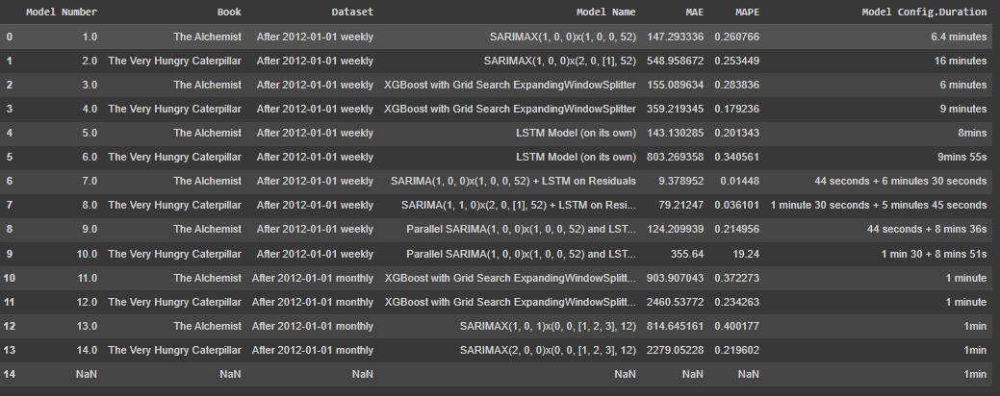

Hybrid approaches performed the best.

The sequential hybrid performed best for The Alchemist, achieving an MAE of 9.38 and MAPE of 1.45%.

For The Very Hungry Caterpillar, while the sequential approach performed the best, further tuning is necessary.

Weekly predictions are significantly more accurate than monthly predictions for both books, as reflected by lower MAE and MAPE values.

Monthly data aggregation obscures short-term trends, leading to less precise models compared to the more granular weekly data.

Simpler models struggle to capture monthly seasonality effectively, with higher error rates when predicting on monthly data.

Explore filling of covid weeks to improve model generalisation.
